In [ ]:
import torch
import os
import monai.transforms as mt
import monai.data as md
import scipy.io as sio
import numpy as np
from liutuo_utils import compare_3d_jet,compare_3d,donkey_noise_like
import matplotlib.pyplot as plt
import pandas as pd


device_id =3
# 设置 PyTorch 的默认 CUDA 设备
torch.cuda.set_device(device_id)

# 确认当前默认 CUDA 设备
current_device = torch.cuda.current_device()
print(f"Switched to CUDA device: {current_device}")

In [ ]:
import torch
from transformers import AutoProcessor, AutoModel
import torch.nn.functional as F

# 1. 加载 BiomedCLIP 模型和处理器
local_model_path = "/home/ssddata/liutuo/BiomedCLIP"
processor = AutoProcessor.from_pretrained(local_model_path, trust_remote_code=True)
model = AutoModel.from_pretrained(local_model_path, trust_remote_code=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

import torch
import torch.nn.functional as F


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 加载图像特征（假设已归一化；若未归一化，后续会处理）
Adapt_fdg_feature_optimized = torch.load("/home/data/liutuo/code/checkpoint/fdg_text_feature.pt").to(device)  
Adapt_av45_feature_optimized = torch.load("/home/data/liutuo/code/checkpoint/av45_text_feature.pt").to(device)  
print(Adapt_fdg_feature_optimized.shape)
print(Adapt_av45_feature_optimized.shape)

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import json

# 数据目录（保持不变）
base_dir = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45"
mri_dir = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45/mri_strip_registered"
av45_dir = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45/PET1_AV45_strip_registered"
fdg_dir = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45/PET2_FDG_strip_registered"
csv_path = os.path.join(base_dir, "filtered_subjects_with_description.csv")

# JSON 文件保存路径（保持不变）
train_json_path = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45/train_data_with_description.json"
val_json_path = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45/val_data_with_description.json"

# 加载 CSV 文件（保持不变）
csv_data = pd.read_csv(csv_path)
csv_dict = csv_data.set_index("Subject ID")["Description"].to_dict()

# 获取文件列表（保持不变）
mri_files = sorted(os.listdir(mri_dir))
av45_files = sorted(os.listdir(av45_dir))
fdg_files = sorted(os.listdir(fdg_dir))

def get_subject_id(filename):
    """从文件名中提取统一的 subject ID（前三个部分，如 '002_S_0295'）"""
    parts = filename.split('_')
    return f"{parts[0]}_{parts[1]}_{parts[2]}"

# 使用统一的 get_subject_id 处理所有文件（保持不变）
mri_dict = {get_subject_id(f): os.path.join(mri_dir, f) for f in mri_files}
av45_dict = {get_subject_id(f): os.path.join(av45_dir, f) for f in av45_files}
fdg_dict = {get_subject_id(f): os.path.join(fdg_dir, f) for f in fdg_files}

# 匹配文件并加入描述信息和 Subject ID
paired_data = []
for patient_id, mri_file in mri_dict.items():
    if patient_id in av45_dict and patient_id in fdg_dict:
        # 检查描述信息是否存在
        description = csv_dict.get(patient_id, None)  # 从 csv_dict 中获取 Description 信息
        # 构建数据条目
        paired_data.append({
            "name": patient_id,  # 添加 name 字段
            "mri": os.path.join(mri_dir, mri_file),
            "av45": os.path.join(av45_dir, av45_dict[patient_id]),
            "fdg": os.path.join(fdg_dir, fdg_dict[patient_id]),
            "description": description  # 加入 Description 信息
        })

print(f"Total matched pairs with description: {len(paired_data)}")
# 在 paired_data 中新增键 fdg_index 和 av45_index
for idx, data in enumerate(paired_data):
    data["fdg_index"] = idx  # 将样本在 paired_data 中的索引作为 fdg_index
    data["av45_index"] = idx

import torch
from transformers import AutoTokenizer, AutoModel

# 示例：假设已经加载 BiomedCLIP 模型和处理器
# 这里替换为您实际使用的 BiomedCLIP 模型和 tokenizer
local_model_path = "/home/ssddata/liutuo/BiomedCLIP"
processor = AutoProcessor.from_pretrained(local_model_path, trust_remote_code=True)
model = AutoModel.from_pretrained(local_model_path, trust_remote_code=True)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)
model.eval()


# 假设 paired_data 已经加载
modal_information = [data["description"] for data in paired_data if data["description"] is not None]

# 对描述信息进行 Tokenizer 编码
text_inputs = processor(
    modal_information,
    padding=True,
    truncation=True,
    return_tensors="pt",
    max_length=256 # 根据模型输入限制选择合适的 max_length
).to(device)

# 转化为 BiomedCLIP 嵌入
with torch.no_grad():
    desc_text_features = model.get_text_features(text_inputs['input_ids'])  # 使用模型方法提取嵌入
    print(f"Shape of features: {desc_text_features.shape}, Dtype: {desc_text_features.dtype}")

# 划分训练集和验证集
train_data, val_data = train_test_split(paired_data, test_size=558, random_state=42)

print(f"Training set size: {len(train_data)}")
print(f"Validation set size: {len(val_data)}")

# 保存到 JSON 文件
with open(train_json_path, "w") as f:
    json.dump(train_data, f, indent=4)

with open(val_json_path, "w") as f:
    json.dump(val_data, f, indent=4)

print(f"Saved train data to: {train_json_path}")
print(f"Saved validation data to: {val_json_path}")

In [ ]:
# 验证训练集
with open(train_json_path, "r") as f:
    train_data = json.load(f)
print(f"Loaded {len(train_data)} training samples.")
print("First training sample:", train_data[0])

# 验证验证集
with open(val_json_path, "r") as f:
    val_data = json.load(f)
print(f"Loaded {len(val_data)} validation samples.")
print("First validation sample:", val_data[0])

In [ ]:
from monai.transforms import Compose, LoadImaged, Lambdad, EnsureChannelFirstd, Orientationd, CropForegroundd, \
    HistogramNormalized, ResizeWithPadOrCropd, Spacingd, NormalizeIntensityd, ScaleIntensityd
from monai.data import CacheDataset, DataLoader
import nibabel as nib
import numpy as np
import json

import monai.transforms as mt

fdg_feature_optimized=Adapt_fdg_feature_optimized
av45_feature_optimized=Adapt_av45_feature_optimized

def fdg_index_transform(x):
    return torch.cat([desc_text_features[x].unsqueeze(0), fdg_feature_optimized], dim=0)

def av45_index_transform(x):
    return torch.cat([desc_text_features[x].unsqueeze(0), av45_feature_optimized], dim=0)


# 自定义加载函数
def mat_load(filepath):
    """
    使用 nibabel 加载 NIfTI 文件，并转换为 NumPy 数组。
    """
    return nib.load(filepath).get_fdata()

# 加载 JSON 文件
train_json_path = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45/train_data_with_description.json"
val_json_path = "/home/ssddata/liutuo/liutuo_data/ADNI1234_mri_fdg_av45/val_data_with_description.json"

# 加载 JSON 文件
with open(train_json_path, "r") as f:
    train_data = json.load(f)

with open(val_json_path, "r") as f:
    val_data = json.load(f)

# 转换数据格式
train_data = [
    {
        "name": item["name"],
        "mri": item["mri"],
        "av45": item["av45"],
        "fdg": item["fdg"],
        "description": item.get("description", {}),  # 确保 description 存在
        "fdg_index": item.get("fdg_index"),  # 保留 fdg_index
        "av45_index": item.get("av45_index"),  # 保留 av45_index
    }
    for item in train_data
]

val_data = [
    {
        "name": item["name"],
        "mri": item["mri"],
        "av45": item["av45"],
        "fdg": item["fdg"],
        "description": item.get("description", {}),  # 确保 description 存在
        "fdg_index": item.get("fdg_index"),  # 保留 fdg_index
        "av45_index": item.get("av45_index"),  # 保留 av45_index
    }
    for item in val_data
]



# 构建数据增强 pipeline
# 定义训练集数据增强流程
train_transforms = mt.Compose([
    mt.Lambdad(keys=["mri", "av45", "fdg"], func=mat_load),  # 加载 NIfTI 文件
    mt.EnsureChannelFirstd(keys=["mri", "av45", "fdg"],channel_dim='no_channel'),
    mt.Orientationd(keys=["mri", "av45", "fdg"], axcodes="LPI"),
    mt.CropForegroundd(keys=["mri", "av45", "fdg"], source_key="mri"),
    mt.HistogramNormalized(keys=["mri"]),
    mt.ResizeWithPadOrCropd(keys=["mri", "av45", "fdg"], spatial_size=[160, 192, 160]),
    mt.Spacingd(keys=["mri", "av45", "fdg"], pixdim=(1.0, 1.0, 1.0)),
    mt.NormalizeIntensityd(keys=["mri", "av45", "fdg"]),
    mt.ScaleIntensityd(keys=["mri", "av45", "fdg"]),
    mt.Lambdad(keys=["fdg_index"], func=fdg_index_transform),  # 添加 fdg_index 转换
    mt.Lambdad(keys=["av45_index"], func=av45_index_transform),  # 添加 av45_index 转换
])

# 定义验证集数据增强流程（通常与训练集一致，但不含随机性增强）
val_transforms = mt.Compose([
    mt.Lambdad(keys=["mri", "av45", "fdg"], func=mat_load),
    mt.EnsureChannelFirstd(keys=["mri", "av45", "fdg"],channel_dim='no_channel'),
    mt.Orientationd(keys=["mri", "av45", "fdg"], axcodes="LPI"),
    mt.CropForegroundd(keys=["mri", "av45", "fdg"], source_key="mri"),
    mt.HistogramNormalized(keys=["mri"]),
    mt.ResizeWithPadOrCropd(keys=["mri", "av45", "fdg"], spatial_size=[160, 192, 160]),
    mt.Spacingd(keys=["mri", "av45", "fdg"], pixdim=(1.0, 1.0, 1.0)),
    mt.NormalizeIntensityd(keys=["mri", "av45", "fdg"]),
    mt.ScaleIntensityd(keys=["mri", "av45", "fdg"]),
    mt.Lambdad(keys=["fdg_index"], func=fdg_index_transform),
    mt.Lambdad(keys=["av45_index"], func=av45_index_transform),
])


# 构建 CacheDataset
train_ds = CacheDataset(data=train_data, transform=train_transforms, num_workers=0, )
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True, num_workers=0)    #shuffle=True

val_ds = CacheDataset(data=val_data, transform=val_transforms, num_workers=0, )
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=0)

# 测试 DataLoader
for batch_data in train_loader:
    print("MRI shape:", batch_data["mri"].shape)
    print("AV45 shape:", batch_data["av45"].shape)
    print("FDG shape:", batch_data["fdg"].shape)
    print("description:", train_data[0]["description"])  # 从原始数据访问描述信息
    break

In [ ]:
for batch in val_loader:
    image_mri =batch["mri"].to(device)
    seg_fdg = batch["fdg"].to(device) # this is the ground truth segmentation
    seg_av45 = batch["av45"].to(device)
    fdg_index=batch["fdg_index"].to(device)
    av45_index=batch["av45_index"].to(device)
    names = batch["name"]  # Extract subject information

   
    for idx, name in enumerate(names):
         print(f"Subject name: {name}")
    compare_3d([image_mri, seg_fdg, seg_av45])
    break  # Uncomment to compare only the first batch , label_1,label_2


In [ ]:
for batch in train_loader:
    image_mri = batch["mri"].to(device)
    seg_fdg = batch["fdg"].to(device)  # this is the ground truth segmentation
    seg_av45 = batch["av45"].to(device)
    fdg_index = batch["fdg_index"].to(device)
    av45_index = batch["av45_index"].to(device)
    names = batch["name"]  # Extract subject information

    # 遍历当前 batch 中的所有 subject
    for idx, name in enumerate(names):
        # 检查是否为目标 subject
        if name == "016_S_4952":
            print(f"Found target subject: {name}")

            # 提取当前 subject 的数据
            target_image_mri = image_mri[idx].unsqueeze(0)  # 增加 batch 维度
            target_seg_fdg = seg_fdg[idx].unsqueeze(0)      # 增加 batch 维度
            target_seg_av45 = seg_av45[idx].unsqueeze(0)    # 增加 batch 维度

            # 打印相关信息
            print(f"Subject name: {name}")
            print(f"Image MRI shape: {target_image_mri.shape}")
            print(f"Segmentation FDG shape: {target_seg_fdg.shape}")
            print(f"Segmentation AV45 shape: {target_seg_av45.shape}")

            # 提取 AV45 的像素值
            av45_data = target_seg_av45.squeeze().cpu().numpy()  # 移除 batch 和 channel 维度，并转换为 NumPy 数组

            # 计算 AV45 的像素值最大值和最小值
            av45_max = np.max(av45_data)
            av45_min = np.min(av45_data)
            print(f"AV45 pixel max value: {av45_max}")
            print(f"AV45 pixel min value: {av45_min}")

            # 提取唯一值
            unique_values = np.unique(av45_data)
            print(f"Unique pixel values in AV45: {unique_values}")

            # 检查是否只有 0 和 1
            if np.array_equal(unique_values, [0]):
                print("The AV45 data contains only 0 .")
            else:
                print("The AV45 data contains values other than 0 and 1.")

            # 可视化或进一步处理
            compare_3d([target_image_mri, target_seg_fdg, target_seg_av45])

            # 如果只需要处理目标 subject，可以在此处退出循环
            break

    # 如果已经找到目标 subject，可以退出外层循环
    if name == "016_S_4952":
        break

In [10]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"
from torch.amp import GradScaler, autocast  # 从 torch.amp 导入 GradScaler

from generative.networks.nets import DiffusionModelUNet
from generative.networks.schedulers import DDPMScheduler,DDIMScheduler
from generative.inferers import DiffusionInferer
model= DiffusionModelUNet(
    spatial_dims=3,
    in_channels=1,#1,
    out_channels=1,
    num_channels=(32,64,64,128),
    attention_levels=(False,False,False,True),
    num_res_blocks=1,
    num_head_channels=(0,0,0, 128),
    with_conditioning=True,
    cross_attention_dim=512,
    use_flash_attention=True,
)



model.to(device)
scheduler = DDPMScheduler(prediction_type="v_prediction", num_train_timesteps=1000,schedule="scaled_linear_beta",
                          beta_start=0.0005, beta_end=0.0195)
scheduler.set_timesteps(num_inference_steps=1000)
optimizer= torch.optim.Adam(params=model.parameters(), lr=2.5e-5)
inferer = DiffusionInferer(scheduler)

Epoch 9: 100%|██████| 1856/1856 [42:50<00:00,  1.38s/it, loss=0.00471]


Epoch 10 Validation loss 0.005348945967853069
epoch: 10
learning rate: 2.5e-05
Saved all parameters!



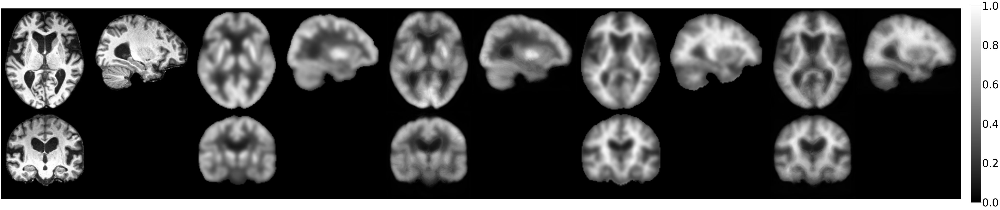

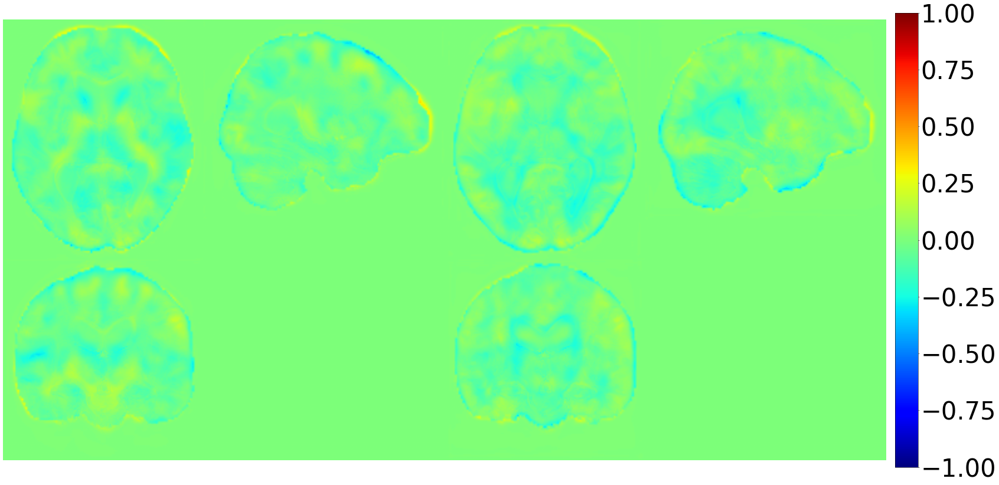

FDG SSIM: 0.8087254166603088
FDG PSNR: 25.66318702697754
AV45 SSIM: 0.7119395732879639
AV45 PSNR: 25.793018341064453


Epoch 19: 100%|█████| 1856/1856 [42:43<00:00,  1.38s/it, loss=0.00362]


Epoch 20 Validation loss 0.0034379123244434595
epoch: 20
learning rate: 2.5e-05
Saved all parameters!



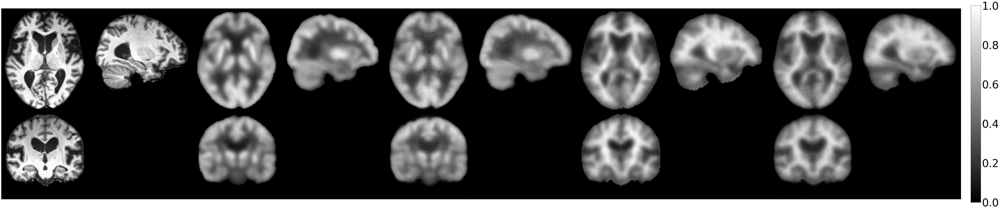

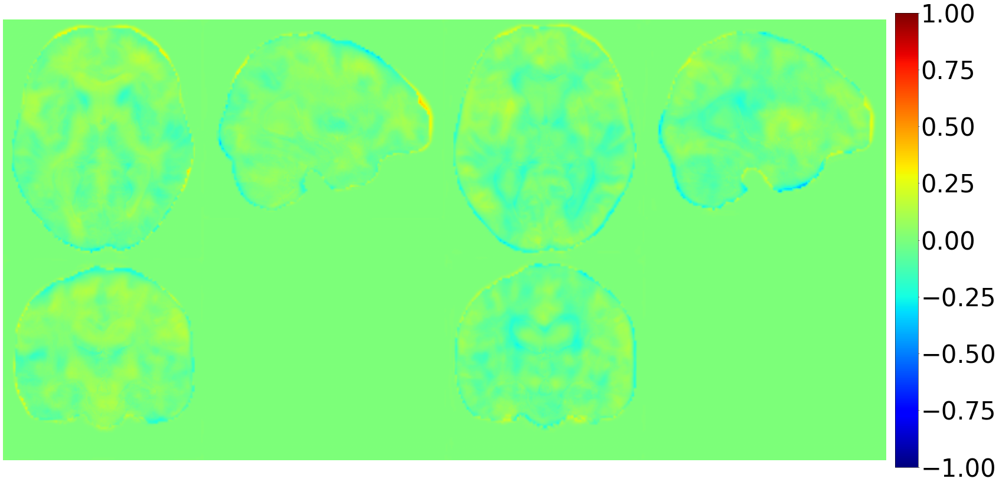

FDG SSIM: 0.9133597016334534
FDG PSNR: 27.972640991210938
AV45 SSIM: 0.8444304466247559
AV45 PSNR: 27.34473991394043


Epoch 29: 100%|█████| 1856/1856 [42:43<00:00,  1.38s/it, loss=0.00303]


Epoch 30 Validation loss 0.004035886377096176
epoch: 30
learning rate: 2.5e-05
Saved all parameters!



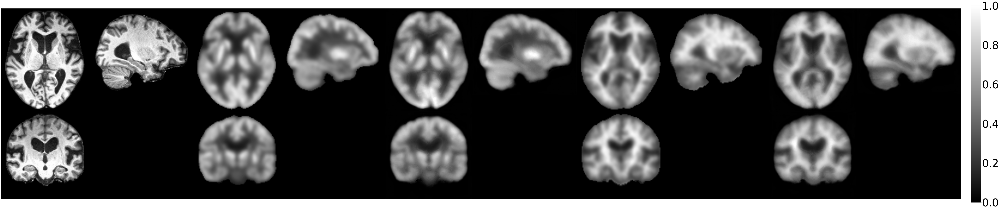

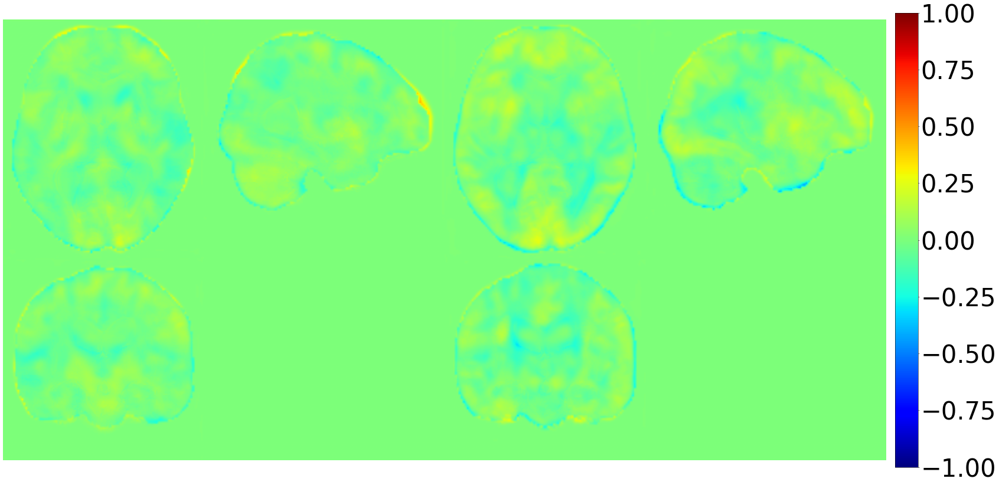

FDG SSIM: 0.8476014137268066
FDG PSNR: 28.05757713317871
AV45 SSIM: 0.8273728489875793
AV45 PSNR: 26.069747924804688


Epoch 39: 100%|█████| 1856/1856 [42:56<00:00,  1.39s/it, loss=0.00274]


Epoch 40 Validation loss 0.0041582901030778885
epoch: 40
learning rate: 2.5e-05
Saved all parameters!



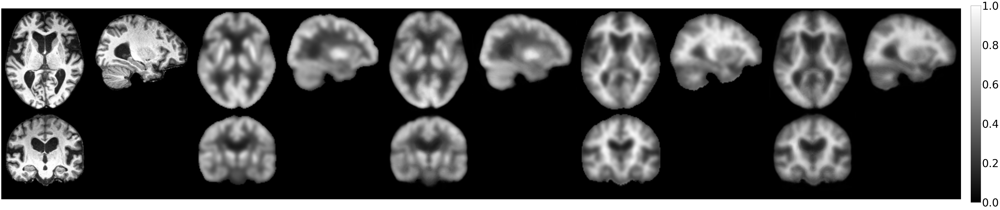

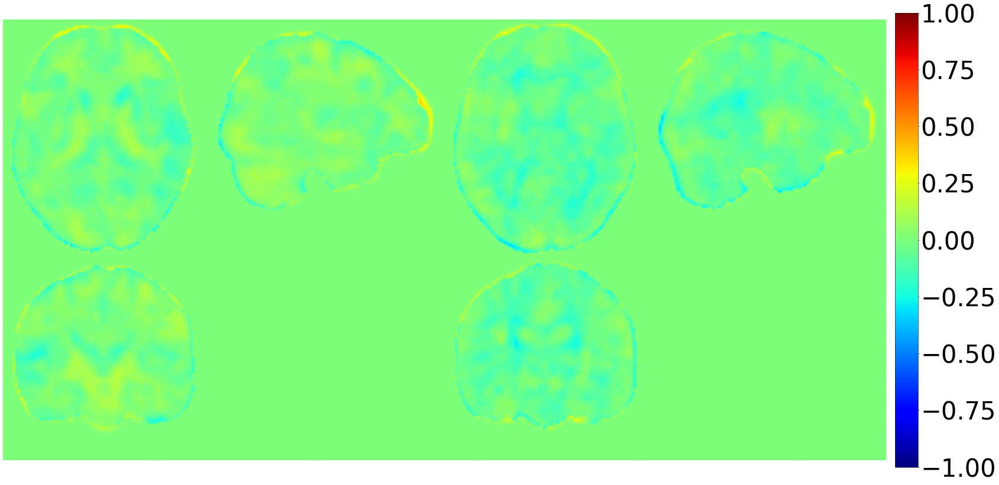

FDG SSIM: 0.9194440245628357
FDG PSNR: 28.08611297607422
AV45 SSIM: 0.8994847536087036
AV45 PSNR: 25.842735290527344


Epoch 47:  31%|█▊    | 575/1856 [13:18<29:00,  1.36s/it, loss=0.00247]

In [ ]:
import os
import tempfile
import time
from liutuo_utils import donkey_noise_like
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from monai import transforms
from monai.apps import DecathlonDataset
from monai.config import print_config
from monai.data import DataLoader
from monai.utils import set_determinism
from torch.cuda.amp import GradScaler, autocast
from tqdm import tqdm
from torch.amp import GradScaler, autocast  # 从 torch.amp 导入 GradScaler





n_epochs = 200
val_interval =10
epoch_loss_list = []
val_epoch_loss_list = []
scaler = GradScaler()  
total_start = time.time()
checkpoint_dir = '/home/ssddata/liutuo/checkpoint/mri2pet _two trace_add clip_flow_noHistogramNormalized'


# 定义裁剪的最小值和最大值
# 定义裁剪的最小值和最大值
clip_sample_min = 0  # 设置合适的最小值
clip_sample_max = 1   # 设置合适的最大值

# 定义模态权重
alpha = 1.0  # FDG 损失权重
beta = 1.0   # AV45 损失权重

for epoch in range(n_epochs):
    model.train()
    epoch_loss = 0
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader), ncols=70)
    progress_bar.set_description(f"Epoch {epoch}")
    
    for step, data in progress_bar:
        images = data["mri"].to(device)
        seg_fdg = data["fdg"].to(device)  # this is the ground truth segmentation
        seg_av45 = data["av45"].to(device)
        fdg_index = data["fdg_index"].to(device)
        av45_index = data["av45_index"].to(device)
        
        optimizer.zero_grad(set_to_none=True)
        timesteps = torch.randint(0, 1000, (len(images),)).to(device)  # pick a random time step t
        
        with autocast(device_type='cuda', enabled=True):
            # Create time_embedding
            time_embedding = torch.randint(
                0, 1000, (images.shape[0],), device=images.device
            ).long()
            
            if epoch >= 140:
                time_embedding = torch.tensor([0], device=images.device, dtype=torch.long)
            
            # Create time
            t = time_embedding.float() / 1000
            
            # 检查 FDG 数据是否为二值化（只有 0 和 1）
            has_fdg = not torch.all(seg_fdg == 0)  # 如果不是二值化数据，则参与计算
            has_av45 = not torch.all(seg_av45 == 0)  # 如果不是二值化数据，则参与计算
            
            # 默认损失为 0
            loss_fdg = torch.tensor(0.0, device=device)
            loss_av45 = torch.tensor(0.0, device=device)
            
            # 计算 FDG 损失
            if has_fdg:  # 如果不是二值化数据，计算 FDG 损失
                x_t_fdg = t * seg_fdg + (1 - t) * images
                v_fdg_prediction = model(x=x_t_fdg, timesteps=time_embedding, context=fdg_index)
                v_fdg = seg_fdg - images
                loss_fdg = F.mse_loss(v_fdg.float(), v_fdg_prediction.float())
            
            # 计算 AV45 损失
            if has_av45:  # 如果不是二值化数据，计算 AV45 损失
                x_t_av45 = t * seg_av45 + (1 - t) * images
                v_av45_prediction = model(x=x_t_av45, timesteps=time_embedding, context=av45_index)
                v_av45 = seg_av45 - images
                loss_av45 = F.mse_loss(v_av45.float(), v_av45_prediction.float())
            
            # 加权总损失
            loss = alpha * loss_fdg + beta * loss_av45

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        epoch_loss += loss.item()
        progress_bar.set_postfix({
            "loss": epoch_loss / (step + 1),
            # "FDG": "✓" if has_fdg else "✗",
            # "AV45": "✓" if has_av45 else "✗"
        })
        
        torch.cuda.empty_cache()
    
    epoch_loss_list.append(epoch_loss / (step + 1))
    if (epoch + 1) % val_interval == 0:
        model.eval()
        val_epoch_loss = 0
        
        for step, data_val in enumerate(val_loader):
            # 验证阶段的数据加载
            images = data_val["mri"].to(device)
            seg_fdg = data_val["fdg"].to(device)  # this is the ground truth segmentation
            seg_av45 = data_val["av45"].to(device)
            fdg_index = data_val["fdg_index"].to(device)
            av45_index = data_val["av45_index"].to(device)
 
            # 检查 FDG 和 AV45 数据是否为二值化（只有 0 和 1）
            has_fdg = not torch.all(seg_fdg == 0)  # 如果不是二值化数据，则参与计算
            has_av45 = not torch.all(seg_av45 == 0)  # 如果不是二值化数据，则参与计算
    
            x_t = images
            N_sample = 1
            N_sample_tensor = torch.tensor(N_sample, dtype=torch.float32)
    
            progress_bar = [(i / N_sample) for i in range(N_sample)]
            for t in progress_bar:  # go through the noising process
                with autocast(device_type='cuda', enabled=False):
                    with torch.no_grad():
                        time_embedding = int(t * 1000)
    
                        # FDG 输出（仅当非二值化时计算）
                        if has_fdg:
                            v_fdg_output = model(x=x_t, timesteps=torch.Tensor((time_embedding,)).to(x_t.device), context=fdg_index)
                            x_fdg_t = x_t + (v_fdg_output / N_sample_tensor)
                            x_fdg_t = torch.clamp(x_fdg_t, min=clip_sample_min, max=clip_sample_max)
                        else:
                            x_fdg_t = None  # 跳过 FDG 计算
    
                        # AV45 输出（仅当非二值化时计算）
                        if has_av45:
                            v_av45_output = model(x=x_t, timesteps=torch.Tensor((time_embedding,)).to(x_t.device), context=av45_index)
                            x_av45_t = x_t + (v_av45_output / N_sample_tensor)
                            x_av45_t = torch.clamp(x_av45_t, min=clip_sample_min, max=clip_sample_max)
                        else:
                            x_av45_t = None  # 跳过 AV45 计算
    
            # 默认损失为 0
            val_fdg_loss = torch.tensor(0.0, device=device)
            val_av45_loss = torch.tensor(0.0, device=device)
    
            # 计算 FDG 损失（仅当非二值化时计算）
            if has_fdg and x_fdg_t is not None:
                val_fdg_loss = F.mse_loss(x_fdg_t.float(), seg_fdg.float())
    
            # 计算 AV45 损失（仅当非二值化时计算）
            if has_av45 and x_av45_t is not None:
                val_av45_loss = F.mse_loss(x_av45_t.float(), seg_av45.float())
    
            # 加权总损失
            val_loss = alpha * val_fdg_loss + beta * val_av45_loss
    
            val_epoch_loss += val_loss.item()
            torch.cuda.empty_cache()
    
        print("Epoch", epoch + 1, "Validation loss", val_epoch_loss / (step + 1))
        val_epoch_loss_list.append(val_epoch_loss / (step + 1))
    
        # Saving model parameters
        print('epoch:', epoch + 1)
        print('learning rate:', optimizer.state_dict()['param_groups'][0]['lr'])
        checkpoint = {
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'epoch': epoch
        }
        torch.save(checkpoint, f'{checkpoint_dir}/first_part_{epoch + 1}.pth')
        print('Saved all parameters!\n')
    
        # 可视化和评估指标
        current_fdg_img = x_fdg_t.to('cpu') if x_fdg_t is not None else None
        current_av45_img = x_av45_t.to('cpu') if x_av45_t is not None else None
        labels_fdg = seg_fdg.to('cpu')
        labels_av45 = seg_av45.to('cpu')
    
        # 如果存在非二值化的 FDG 或 AV45 数据，则进行可视化和评估
        if current_fdg_img is not None or current_av45_img is not None:
            compare_3d([images, labels_fdg, current_fdg_img, labels_av45, current_av45_img])
            compare_3d_jet([current_fdg_img - labels_fdg, current_av45_img - labels_av45])
    
        from generative.metrics import SSIMMetric
        from monai.metrics import MAEMetric, MSEMetric, PSNRMetric
    
        ssim_metric = SSIMMetric(spatial_dims=3, data_range=1.0, kernel_size=7)
        psnr_metric = PSNRMetric(1.0)
    
        # 计算 SSIM 和 PSNR（仅当非二值化时计算）
        if has_fdg and current_fdg_img is not None:
            ssim_fdg_value = ssim_metric(labels_fdg, current_fdg_img)
            psnr_fdg_value = psnr_metric(labels_fdg, current_fdg_img)
            print(f"FDG SSIM: {ssim_fdg_value.mean().item()}")
            print(f"FDG PSNR: {psnr_fdg_value.mean().item()}")
    
        if has_av45 and current_av45_img is not None:
            ssim_av45_value = ssim_metric(labels_av45, current_av45_img)
            psnr_av45_value = psnr_metric(labels_av45, current_av45_img)
            print(f"AV45 SSIM: {ssim_av45_value.mean().item()}")
            print(f"AV45 PSNR: {psnr_av45_value.mean().item()}")

Epoch 154: 100%|████| 1856/1856 [43:47<00:00,  1.42s/it, loss=0.00118]


Epoch 155 Validation loss 0.003150797449052334
epoch: 155
learning rate: 2.5e-05
Saved all parameters!



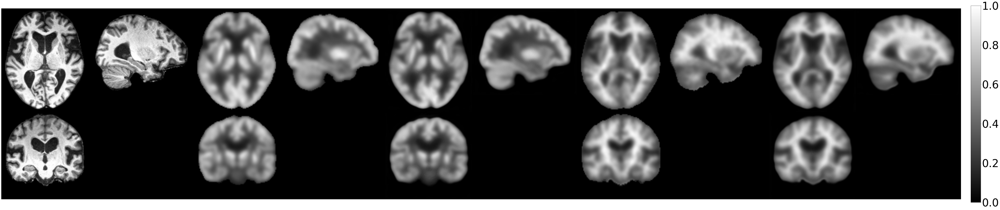

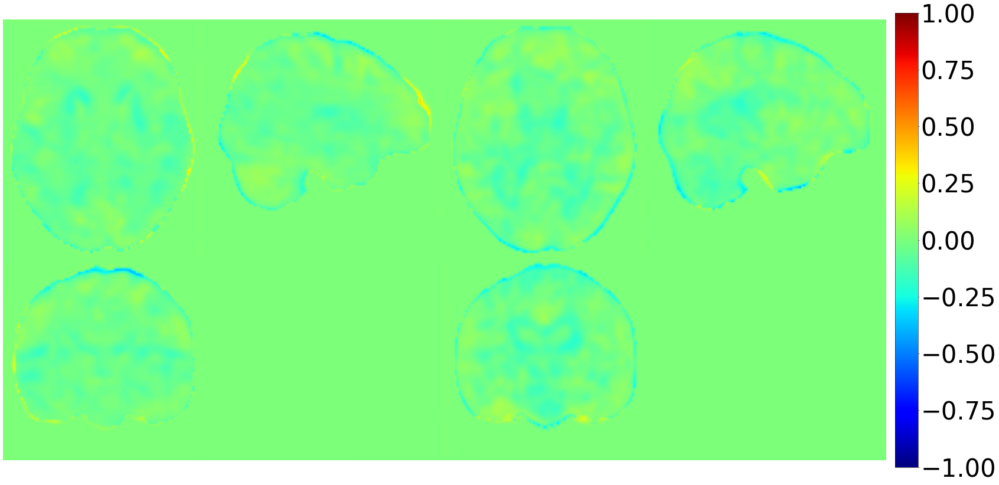

FDG SSIM: 0.9059451222419739
FDG PSNR: 28.71800994873047
AV45 SSIM: 0.9074448347091675
AV45 PSNR: 27.429418563842773


Epoch 159: 100%|████| 1856/1856 [44:11<00:00,  1.43s/it, loss=0.00111]


Epoch 160 Validation loss 0.0034280240070074797
epoch: 160
learning rate: 2.5e-05
Saved all parameters!



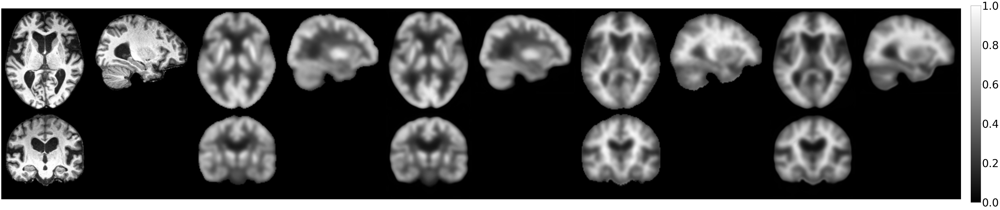

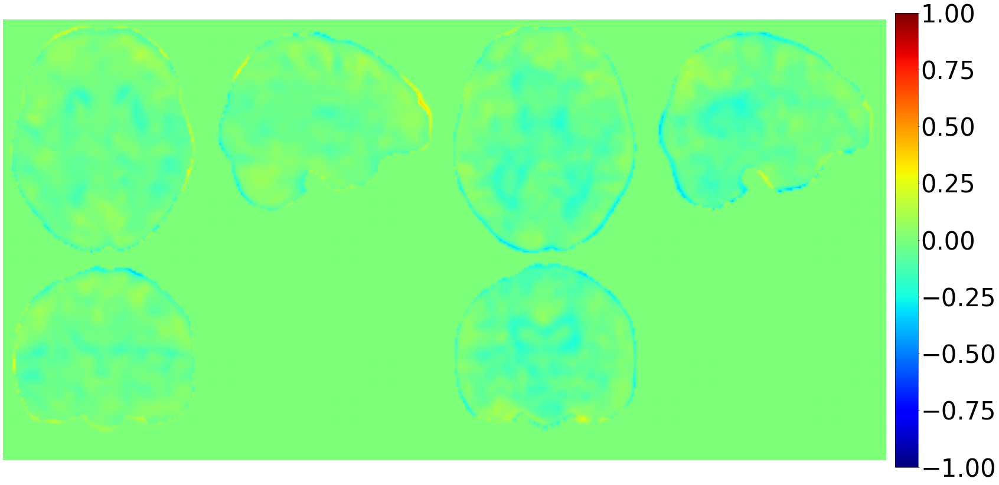

FDG SSIM: 0.8927088975906372
FDG PSNR: 29.53652572631836
AV45 SSIM: 0.87649005651474
AV45 PSNR: 26.35373306274414


Epoch 164: 100%|████| 1856/1856 [43:59<00:00,  1.42s/it, loss=0.00107]


Epoch 165 Validation loss 0.0032432121224701405
epoch: 165
learning rate: 2.5e-05
Saved all parameters!



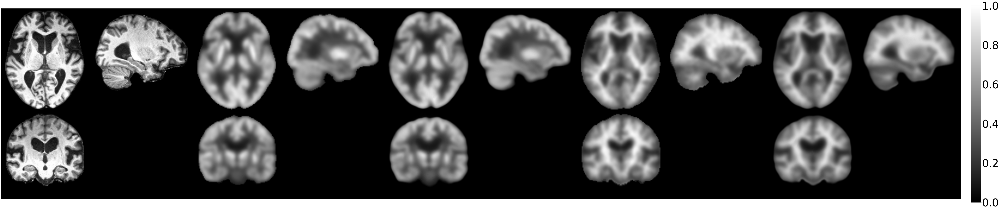

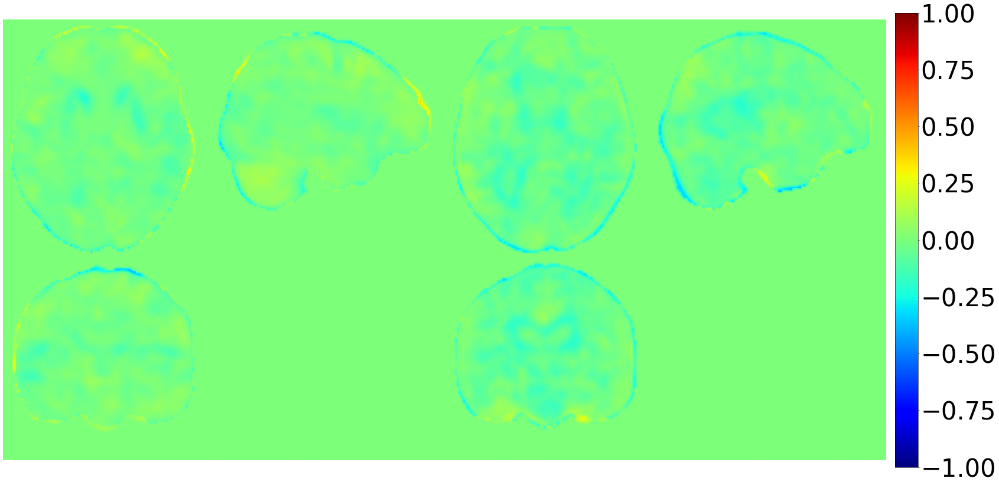

FDG SSIM: 0.9539603590965271
FDG PSNR: 29.402103424072266
AV45 SSIM: 0.9280650615692139
AV45 PSNR: 26.786884307861328


Epoch 165:  71%|██▊ | 1310/1856 [31:24<13:05,  1.44s/it, loss=0.00106]


KeyboardInterrupt: 

In [9]:
import os
import tempfile
import time
from liutuo_utils import donkey_noise_like
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from monai import transforms
from monai.apps import DecathlonDataset
from monai.config import print_config
from monai.data import DataLoader
from monai.utils import set_determinism
from torch.cuda.amp import GradScaler, autocast
from tqdm import tqdm
from torch.amp import GradScaler, autocast  # 从 torch.amp 导入 GradScaler


scaler = GradScaler()  

# Load the checkpoint
checkpoint_dir = '/home/ssddata/liutuo/checkpoint/mri2pet _two trace_add clip_flow_noHistogramNormalized'
checkpoint = torch.load(f'{checkpoint_dir}/first_part_154.pth')
model.load_state_dict(checkpoint['model'])
optimizer.load_state_dict(checkpoint['optimizer'])
start_epoch = checkpoint['epoch'] + 1  # Start from the next epoch after the last saved one

# Set new training parameters
new_epochs =140  # Number of additional epochs to train
total_epochs = start_epoch + new_epochs
val_interval =5 # Keep validation interval unchanged
epoch_loss_list = []  # Initialize epoch loss list
val_epoch_loss_list = []  # Initialize validation epoch loss list

# Training loop
clip_sample_min = 0  # 设置合适的最小值
clip_sample_max = 1   # 设置合适的最大值

# 定义模态权重
alpha = 1.0  # FDG 损失权重
beta = 1.0   # AV45 损失权重

for epoch in range(start_epoch, total_epochs):
    model.train()
    epoch_loss = 0
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader), ncols=70)
    progress_bar.set_description(f"Epoch {epoch}")
    
    for step, data in progress_bar:
        images = data["mri"].to(device)
        seg_fdg = data["fdg"].to(device)  # this is the ground truth segmentation
        seg_av45 = data["av45"].to(device)
        fdg_index = data["fdg_index"].to(device)
        av45_index = data["av45_index"].to(device)
        
        optimizer.zero_grad(set_to_none=True)
        timesteps = torch.randint(0, 1000, (len(images),)).to(device)  # pick a random time step t
        
        with autocast(device_type='cuda', enabled=True):
            # Create time_embedding
            time_embedding = torch.randint(
                0, 1000, (images.shape[0],), device=images.device
            ).long()
            
            if epoch >= 120:
                time_embedding = torch.tensor([0], device=images.device, dtype=torch.long)
            
            # Create time
            t = time_embedding.float() / 1000
            
            # 检查 FDG 数据是否为二值化（只有 0 和 1）
            has_fdg = not torch.all(seg_fdg == 0)  # 如果不是二值化数据，则参与计算
            has_av45 = not torch.all(seg_av45 == 0)  # 如果不是二值化数据，则参与计算
            
            # 默认损失为 0
            loss_fdg = torch.tensor(0.0, device=device)
            loss_av45 = torch.tensor(0.0, device=device)
            
            # 计算 FDG 损失
            if has_fdg:  # 如果不是二值化数据，计算 FDG 损失
                x_t_fdg = t * seg_fdg + (1 - t) * images
                v_fdg_prediction = model(x=x_t_fdg, timesteps=time_embedding, context=fdg_index)
                v_fdg = seg_fdg - images
                loss_fdg = F.mse_loss(v_fdg.float(), v_fdg_prediction.float())
            
            # 计算 AV45 损失
            if has_av45:  # 如果不是二值化数据，计算 AV45 损失
                x_t_av45 = t * seg_av45 + (1 - t) * images
                v_av45_prediction = model(x=x_t_av45, timesteps=time_embedding, context=av45_index)
                v_av45 = seg_av45 - images
                loss_av45 = F.mse_loss(v_av45.float(), v_av45_prediction.float())
            
            # 加权总损失
            loss = alpha * loss_fdg + beta * loss_av45

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        epoch_loss += loss.item()
        progress_bar.set_postfix({
            "loss": epoch_loss / (step + 1),
            # "FDG": "✓" if has_fdg else "✗",
            # "AV45": "✓" if has_av45 else "✗"
        })
        
        torch.cuda.empty_cache()
    
    epoch_loss_list.append(epoch_loss / (step + 1))
    if (epoch + 1) % val_interval == 0:
        model.eval()
        val_epoch_loss = 0
        
        for step, data_val in enumerate(val_loader):
            # 验证阶段的数据加载
            images = data_val["mri"].to(device)
            seg_fdg = data_val["fdg"].to(device)  # this is the ground truth segmentation
            seg_av45 = data_val["av45"].to(device)
            fdg_index = data_val["fdg_index"].to(device)
            av45_index = data_val["av45_index"].to(device)
 
            # 检查 FDG 和 AV45 数据是否为二值化（只有 0 和 1）
            has_fdg = not torch.all(seg_fdg == 0)  # 如果不是二值化数据，则参与计算
            has_av45 = not torch.all(seg_av45 == 0)  # 如果不是二值化数据，则参与计算
    
            x_t = images
            N_sample = 1
            N_sample_tensor = torch.tensor(N_sample, dtype=torch.float32)
    
            progress_bar = [(i / N_sample) for i in range(N_sample)]
            for t in progress_bar:  # go through the noising process
                with autocast(device_type='cuda', enabled=False):
                    with torch.no_grad():
                        time_embedding = int(t * 1000)
    
                        # FDG 输出（仅当非二值化时计算）
                        if has_fdg:
                            v_fdg_output = model(x=x_t, timesteps=torch.Tensor((time_embedding,)).to(x_t.device), context=fdg_index)
                            x_fdg_t = x_t + (v_fdg_output / N_sample_tensor)
                            x_fdg_t = torch.clamp(x_fdg_t, min=clip_sample_min, max=clip_sample_max)
                        else:
                            x_fdg_t = None  # 跳过 FDG 计算
    
                        # AV45 输出（仅当非二值化时计算）
                        if has_av45:
                            v_av45_output = model(x=x_t, timesteps=torch.Tensor((time_embedding,)).to(x_t.device), context=av45_index)
                            x_av45_t = x_t + (v_av45_output / N_sample_tensor)
                            x_av45_t = torch.clamp(x_av45_t, min=clip_sample_min, max=clip_sample_max)
                        else:
                            x_av45_t = None  # 跳过 AV45 计算
    
            # 默认损失为 0
            val_fdg_loss = torch.tensor(0.0, device=device)
            val_av45_loss = torch.tensor(0.0, device=device)
    
            # 计算 FDG 损失（仅当非二值化时计算）
            if has_fdg and x_fdg_t is not None:
                val_fdg_loss = F.mse_loss(x_fdg_t.float(), seg_fdg.float())
    
            # 计算 AV45 损失（仅当非二值化时计算）
            if has_av45 and x_av45_t is not None:
                val_av45_loss = F.mse_loss(x_av45_t.float(), seg_av45.float())
    
            # 加权总损失
            val_loss = alpha * val_fdg_loss + beta * val_av45_loss
    
            val_epoch_loss += val_loss.item()
            torch.cuda.empty_cache()
    
        print("Epoch", epoch + 1, "Validation loss", val_epoch_loss / (step + 1))
        val_epoch_loss_list.append(val_epoch_loss / (step + 1))
    
        # Saving model parameters
        print('epoch:', epoch + 1)
        print('learning rate:', optimizer.state_dict()['param_groups'][0]['lr'])
        checkpoint = {
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'epoch': epoch
        }
        torch.save(checkpoint, f'{checkpoint_dir}/first_part_{epoch + 1}.pth')
        print('Saved all parameters!\n')
    
        # 可视化和评估指标
        current_fdg_img = x_fdg_t.to('cpu') if x_fdg_t is not None else None
        current_av45_img = x_av45_t.to('cpu') if x_av45_t is not None else None
        labels_fdg = seg_fdg.to('cpu')
        labels_av45 = seg_av45.to('cpu')
    
        # 如果存在非二值化的 FDG 或 AV45 数据，则进行可视化和评估
        if current_fdg_img is not None or current_av45_img is not None:
            compare_3d([images, labels_fdg, current_fdg_img, labels_av45, current_av45_img])
            compare_3d_jet([current_fdg_img - labels_fdg, current_av45_img - labels_av45])
    
        from generative.metrics import SSIMMetric
        from monai.metrics import MAEMetric, MSEMetric, PSNRMetric
    
        ssim_metric = SSIMMetric(spatial_dims=3, data_range=1.0, kernel_size=7)
        psnr_metric = PSNRMetric(1.0)
    
        # 计算 SSIM 和 PSNR（仅当非二值化时计算）
        if has_fdg and current_fdg_img is not None:
            ssim_fdg_value = ssim_metric(labels_fdg, current_fdg_img)
            psnr_fdg_value = psnr_metric(labels_fdg, current_fdg_img)
            print(f"FDG SSIM: {ssim_fdg_value.mean().item()}")
            print(f"FDG PSNR: {psnr_fdg_value.mean().item()}")
    
        if has_av45 and current_av45_img is not None:
            ssim_av45_value = ssim_metric(labels_av45, current_av45_img)
            psnr_av45_value = psnr_metric(labels_av45, current_av45_img)
            print(f"AV45 SSIM: {ssim_av45_value.mean().item()}")
            print(f"AV45 PSNR: {psnr_av45_value.mean().item()}")

In [14]:
import os
import torch
from monai.metrics import PSNRMetric
from generative.metrics import SSIMMetric
from tqdm import tqdm
import numpy as np
import nibabel as nib  # 用于保存 NIfTI 格式的图像
import monai.transforms as mt

# 加载检查点
checkpoint_dir = '/home/ssddata/liutuo/checkpoint/mri2pet _two trace_add clip_flow'
checkpoint_path = '/home/ssddata/liutuo/checkpoint/mri2pet _two trace_add clip_flow_noHistogramNormalized/first_part_165.pth'
checkpoint = torch.load(checkpoint_path)

# 初始化模型和优化器
model.load_state_dict(checkpoint['model'])
model.eval()  # 设置为推理模式
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# 定义评估指标
ssim_metric = SSIMMetric(spatial_dims=3, data_range=1.0, kernel_size=7)
psnr_metric = PSNRMetric(max_val=1.0)

# 推理过程
clip_sample_min = 0  # 设置合适的最小值
clip_sample_max = 1  # 设置合适的最大值

# 创建保存目录
output_dirs = {
    "mri": "/home/ssddata/liutuo/liutuo_data/data_augmentation_mri",
    "fdg": "/home/ssddata/liutuo/liutuo_data/data_augmentation_fdg",
    "av45": "/home/ssddata/liutuo/liutuo_data/data_augmentation_av45",
    "generated_fdg": "/home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated",
    "generated_av45": "/home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated"
}
for dir_path in output_dirs.values():
    os.makedirs(dir_path, exist_ok=True)

# 数据增强变换
orientation_transform = mt.Orientationd(keys=["mri", "av45", "fdg"], axcodes="LPI")

with torch.no_grad():
    for step, data_val in enumerate(tqdm(train_loader, desc="Inference")):
        # 数据增强处理
        data_val = data_val#data_val = orientation_transform(data_val)

        images = data_val["mri"].to(device)
        seg_fdg = data_val["fdg"].to(device)  # Ground truth FDG
        seg_av45 = data_val["av45"].to(device)  # Ground truth AV45
        fdg_index = data_val["fdg_index"].to(device)
        av45_index = data_val["av45_index"].to(device)
        names = data_val["name"]
        # 检查 FDG 和 AV45 数据是否为二值化（只有 0 和 1）
        has_fdg = not torch.all((seg_fdg == 0) | (seg_fdg == 1))  # 如果不是二值化数据，则参与计算
        has_av45 = not torch.all((seg_av45 == 0) | (seg_av45 == 1))  # 如果不是二值化数据，则参与计算

        # 固定 time_embedding 和 t
        time_embedding = torch.tensor([0], device=device, dtype=torch.long)
        t = time_embedding.float() / 1000  # t = 0

        # FDG 输出（仅当非二值化时计算）
        if has_fdg:
            v_fdg_output = model(
                x=images,
                timesteps=time_embedding,
                context=fdg_index
            )
            x_fdg_t = images + (v_fdg_output)  # t = 0，因此 x_fdg_t = images
            x_fdg_t = torch.clamp(x_fdg_t, min=clip_sample_min, max=clip_sample_max)

            # 检查形状并保存生成的 FDG 图像
            if x_fdg_t.shape == (1, 1, 160, 192, 160):
                x_fdg_t = x_fdg_t.squeeze()  # 去掉前两个维度 (1, 1)，得到 [160, 192, 160]
                x_fdg_np = x_fdg_t.cpu().numpy()  # 转换为 NumPy 数组
                output_path = os.path.join(output_dirs["generated_fdg"], f'generated_fdg_{names[0]}.nii.gz')  # 保存路径
                nib.save(nib.Nifti1Image(x_fdg_np, affine=np.eye(4)), output_path)  # 保存为 NIfTI 文件
                print(f"Saved generated FDG image to {output_path}")

        # AV45 输出（仅当非二值化时计算）
        if has_av45:
            v_av45_output = model(
                x=images,
                timesteps=time_embedding,
                context=av45_index
            )
            x_av45_t = images + (v_av45_output)  # t = 0，因此 x_av45_t = images
            x_av45_t = torch.clamp(x_av45_t, min=clip_sample_min, max=clip_sample_max)

            # 检查形状并保存生成的 AV45 图像
            if x_av45_t.shape == (1, 1, 160, 192, 160):
                x_av45_t = x_av45_t.squeeze()  # 去掉前两个维度 (1, 1)，得到 [160, 192, 160]
                x_av45_np = x_av45_t.cpu().numpy()  # 转换为 NumPy 数组
                output_path = os.path.join(output_dirs["generated_av45"], f'generated_av45_{names[0]}.nii.gz')  # 保存路径
                nib.save(nib.Nifti1Image(x_av45_np, affine=np.eye(4)), output_path)  # 保存为 NIfTI 文件
                print(f"Saved generated AV45 image to {output_path}")

        # 保存真实的 MRI、FDG 和 AV45 图像
        if images.shape == (1, 1, 160, 192, 160):
            images = images.squeeze()  # 去掉前两个维度 (1, 1)，得到 [160, 192, 160]
            images_np = images.cpu().numpy()  # 转换为 NumPy 数组
            output_path = os.path.join(output_dirs["mri"], f'real_mri_{names[0]}.nii.gz')  # 保存路径
            nib.save(nib.Nifti1Image(images_np, affine=np.eye(4)), output_path)  # 保存为 NIfTI 文件
            print(f"Saved real MRI image to {output_path}")

        if seg_fdg.shape == (1, 1, 160, 192, 160):
            seg_fdg = seg_fdg.squeeze()  # 去掉前两个维度 (1, 1)，得到 [160, 192, 160]
            seg_fdg_np = seg_fdg.cpu().numpy()  # 转换为 NumPy 数组
            output_path = os.path.join(output_dirs["fdg"], f'real_fdg_{names[0]}.nii.gz')  # 保存路径
            nib.save(nib.Nifti1Image(seg_fdg_np, affine=np.eye(4)), output_path)  # 保存为 NIfTI 文件
            print(f"Saved real FDG image to {output_path}")

        if seg_av45.shape == (1, 1, 160, 192, 160):
            seg_av45 = seg_av45.squeeze()  # 去掉前两个维度 (1, 1)，得到 [160, 192, 160]
            seg_av45_np = seg_av45.cpu().numpy()  # 转换为 NumPy 数组
            output_path = os.path.join(output_dirs["av45"], f'real_av45_{names[0]}.nii.gz')  # 保存路径
            nib.save(nib.Nifti1Image(seg_av45_np, affine=np.eye(4)), output_path)  # 保存为 NIfTI 文件
            print(f"Saved real AV45 image to {output_path}")

        # 计算 SSIM 和 PSNR（仅当非二值化时计算）
        if has_fdg and x_fdg_t is not None:
            ssim_fdg_value = ssim_metric(seg_fdg.unsqueeze(0).unsqueeze(0), x_fdg_t.unsqueeze(0).unsqueeze(0))
            psnr_fdg_value = psnr_metric(seg_fdg.unsqueeze(0).unsqueeze(0), x_fdg_t.unsqueeze(0).unsqueeze(0))
            print(f"[FDG] SSIM: {ssim_fdg_value.mean().item():.4f}, PSNR: {psnr_fdg_value.mean().item():.4f}")

        if has_av45 and x_av45_t is not None:
            ssim_av45_value = ssim_metric(seg_av45.unsqueeze(0).unsqueeze(0), x_av45_t.unsqueeze(0).unsqueeze(0))
            psnr_av45_value = psnr_metric(seg_av45.unsqueeze(0).unsqueeze(0), x_av45_t.unsqueeze(0).unsqueeze(0))
            print(f"[AV45] SSIM: {ssim_av45_value.mean().item():.4f}, PSNR: {psnr_av45_value.mean().item():.4f}")

Inference:   0%|                                                                                                                                                                                                                                     | 0/1856 [00:00<?, ?it/s]

Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4453.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4453.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4453.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4453.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4453.nii.gz
[FDG] SSIM: 0.9579, PSNR: 32.2137


Inference:   0%|                                                                                                                                                                                                                           | 1/1856 [00:04<2:19:47,  4.52s/it]

[AV45] SSIM: 0.9567, PSNR: 32.8381
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0461.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0461.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0461.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0461.nii.gz


Inference:   0%|▏                                                                                                                                                                                                                          | 2/1856 [00:07<1:48:58,  3.53s/it]

[FDG] SSIM: 0.8893, PSNR: 30.1898
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4809.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4809.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4809.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4809.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4809.nii.gz
[FDG] SSIM: 0.9591, PSNR: 31.8181


Inference:   0%|▎                                                                                                                                                                                                                          | 3/1856 [00:11<2:03:44,  4.01s/it]

[AV45] SSIM: 0.9254, PSNR: 29.6931
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6030.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6030.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6030.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6030.nii.gz


Inference:   0%|▍                                                                                                                                                                                                                          | 4/1856 [00:14<1:45:13,  3.41s/it]

[AV45] SSIM: 0.9496, PSNR: 31.7192
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4352.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4352.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4352.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4352.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4352.nii.gz
[FDG] SSIM: 0.9687, PSNR: 33.9006


Inference:   0%|▌                                                                                                                                                                                                                          | 5/1856 [00:19<2:00:04,  3.89s/it]

[AV45] SSIM: 0.9471, PSNR: 33.1931
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_4404.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_4404.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_4404.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_4404.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_4404.nii.gz
[FDG] SSIM: 0.9586, PSNR: 32.5917


Inference:   0%|▋                                                                                                                                                                                                                          | 6/1856 [00:24<2:11:05,  4.25s/it]

[AV45] SSIM: 0.9257, PSNR: 29.6767
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4203.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4203.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4203.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4203.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4203.nii.gz
[FDG] SSIM: 0.9674, PSNR: 33.7118


Inference:   0%|▊                                                                                                                                                                                                                          | 7/1856 [00:29<2:19:10,  4.52s/it]

[AV45] SSIM: 0.9275, PSNR: 30.2247
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_0671.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_0671.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_0671.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_0671.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_0671.nii.gz
[FDG] SSIM: 0.9635, PSNR: 32.9917


Inference:   0%|▉                                                                                                                                                                                                                          | 8/1856 [00:34<2:22:48,  4.64s/it]

[AV45] SSIM: 0.9501, PSNR: 31.5817
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6735.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6735.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6735.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6735.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6735.nii.gz
[FDG] SSIM: 0.9601, PSNR: 32.2873


Inference:   0%|█                                                                                                                                                                                                                          | 9/1856 [00:38<2:21:05,  4.58s/it]

[AV45] SSIM: 0.9537, PSNR: 32.3102
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6611.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6611.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6611.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6611.nii.gz


Inference:   1%|█▏                                                                                                                                                                                                                        | 10/1856 [00:41<2:02:50,  3.99s/it]

[FDG] SSIM: 0.9689, PSNR: 33.9899
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_1032.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_1032.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_1032.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_1032.nii.gz


Inference:   1%|█▎                                                                                                                                                                                                                        | 11/1856 [00:44<1:52:57,  3.67s/it]

[FDG] SSIM: 0.9329, PSNR: 31.2153
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4381.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4381.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4381.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4381.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4381.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.0666


Inference:   1%|█▍                                                                                                                                                                                                                        | 12/1856 [00:49<2:04:00,  4.04s/it]

[AV45] SSIM: 0.9444, PSNR: 31.6438
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_6345.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_6345.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_6345.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_6345.nii.gz


Inference:   1%|█▌                                                                                                                                                                                                                        | 13/1856 [00:51<1:51:05,  3.62s/it]

[FDG] SSIM: 0.9587, PSNR: 32.8754
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_1074.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_1074.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_1074.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_1074.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_1074.nii.gz
[FDG] SSIM: 0.9571, PSNR: 31.6335


Inference:   1%|█▋                                                                                                                                                                                                                        | 14/1856 [00:55<1:56:33,  3.80s/it]

[AV45] SSIM: 0.9355, PSNR: 29.2669
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_5099.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_5099.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_5099.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_5099.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_5099.nii.gz
[FDG] SSIM: 0.9735, PSNR: 33.4740


Inference:   1%|█▊                                                                                                                                                                                                                        | 15/1856 [01:00<2:06:08,  4.11s/it]

[AV45] SSIM: 0.9515, PSNR: 31.7191
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6996.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6996.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6996.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6996.nii.gz


Inference:   1%|█▉                                                                                                                                                                                                                        | 16/1856 [01:03<1:51:39,  3.64s/it]

[AV45] SSIM: 0.9484, PSNR: 32.5609
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_7062.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_7062.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_7062.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_7062.nii.gz


Inference:   1%|█▉                                                                                                                                                                                                                        | 17/1856 [01:05<1:41:18,  3.31s/it]

[AV45] SSIM: 0.9524, PSNR: 33.1338
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6733.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6733.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6733.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6733.nii.gz


Inference:   1%|██                                                                                                                                                                                                                        | 18/1856 [01:08<1:37:49,  3.19s/it]

[FDG] SSIM: 0.9513, PSNR: 31.8607
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0513.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0513.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0513.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0513.nii.gz


Inference:   1%|██▏                                                                                                                                                                                                                       | 19/1856 [01:11<1:33:26,  3.05s/it]

[FDG] SSIM: 0.9260, PSNR: 31.4156
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_7041.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_7041.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_7041.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_7041.nii.gz


Inference:   1%|██▎                                                                                                                                                                                                                       | 20/1856 [01:13<1:28:40,  2.90s/it]

[FDG] SSIM: 0.9675, PSNR: 32.8215
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_2155.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_2155.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_2155.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_2155.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_2155.nii.gz
[FDG] SSIM: 0.9646, PSNR: 32.1576


Inference:   1%|██▍                                                                                                                                                                                                                       | 21/1856 [01:19<1:49:22,  3.58s/it]

[AV45] SSIM: 0.8945, PSNR: 29.2278
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_6878.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6878.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6878.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6878.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6878.nii.gz
[FDG] SSIM: 0.9732, PSNR: 34.3778


Inference:   1%|██▌                                                                                                                                                                                                                       | 22/1856 [01:23<1:54:22,  3.74s/it]

[AV45] SSIM: 0.9538, PSNR: 31.1594
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_0554.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_0554.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_0554.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_0554.nii.gz


Inference:   1%|██▋                                                                                                                                                                                                                       | 23/1856 [01:25<1:44:02,  3.41s/it]

[FDG] SSIM: 0.9555, PSNR: 31.8922
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4158.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4158.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4158.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4158.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4158.nii.gz
[FDG] SSIM: 0.9688, PSNR: 33.7687


Inference:   1%|██▊                                                                                                                                                                                                                       | 24/1856 [01:30<1:54:27,  3.75s/it]

[AV45] SSIM: 0.9603, PSNR: 33.5293
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4924.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4924.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4924.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4924.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4924.nii.gz
[FDG] SSIM: 0.9630, PSNR: 33.0139


Inference:   1%|██▉                                                                                                                                                                                                                       | 25/1856 [01:35<2:05:34,  4.11s/it]

[AV45] SSIM: 0.9012, PSNR: 29.0379
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10068.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10068.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10068.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10068.nii.gz


Inference:   1%|███                                                                                                                                                                                                                       | 26/1856 [01:38<1:52:56,  3.70s/it]

[AV45] SSIM: 0.8215, PSNR: 25.9788
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0863.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0863.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0863.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0863.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0863.nii.gz
[FDG] SSIM: 0.9639, PSNR: 32.5788


Inference:   1%|███▏                                                                                                                                                                                                                      | 27/1856 [01:42<2:01:07,  3.97s/it]

[AV45] SSIM: 0.9233, PSNR: 29.2198
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_0957.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_0957.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_0957.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_0957.nii.gz


Inference:   2%|███▎                                                                                                                                                                                                                      | 28/1856 [01:45<1:48:45,  3.57s/it]

[FDG] SSIM: 0.9102, PSNR: 30.5941
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_5006.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_5006.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_5006.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_5006.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_5006.nii.gz
[FDG] SSIM: 0.9681, PSNR: 33.5343


Inference:   2%|███▍                                                                                                                                                                                                                      | 29/1856 [01:50<1:59:44,  3.93s/it]

[AV45] SSIM: 0.9489, PSNR: 30.7923
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_6784.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6784.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6784.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6784.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6784.nii.gz
[FDG] SSIM: 0.9623, PSNR: 33.2518


Inference:   2%|███▌                                                                                                                                                                                                                      | 30/1856 [01:54<2:06:34,  4.16s/it]

[AV45] SSIM: 0.9558, PSNR: 32.7559
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_2052.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_2052.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_2052.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_2052.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_2052.nii.gz
[FDG] SSIM: 0.9661, PSNR: 33.1457


Inference:   2%|███▋                                                                                                                                                                                                                      | 31/1856 [01:59<2:10:05,  4.28s/it]

[AV45] SSIM: 0.9494, PSNR: 32.5835
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6959.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6959.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6959.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6959.nii.gz


Inference:   2%|███▊                                                                                                                                                                                                                      | 32/1856 [02:02<1:54:45,  3.77s/it]

[AV45] SSIM: 0.9461, PSNR: 32.1194
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4482.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4482.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4482.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4482.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4482.nii.gz
[FDG] SSIM: 0.9668, PSNR: 33.3998


Inference:   2%|███▉                                                                                                                                                                                                                      | 33/1856 [02:06<2:00:33,  3.97s/it]

[AV45] SSIM: 0.9421, PSNR: 31.2620
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10076.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10076.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10076.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10076.nii.gz


Inference:   2%|███▉                                                                                                                                                                                                                      | 34/1856 [02:09<1:50:09,  3.63s/it]

[AV45] SSIM: 0.9292, PSNR: 30.9679
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_1285.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_1285.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_1285.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_1285.nii.gz


Inference:   2%|████                                                                                                                                                                                                                      | 35/1856 [02:11<1:41:17,  3.34s/it]

[FDG] SSIM: 0.9488, PSNR: 31.9491
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_6768.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_6768.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_6768.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_6768.nii.gz


Inference:   2%|████▏                                                                                                                                                                                                                     | 36/1856 [02:14<1:34:05,  3.10s/it]

[FDG] SSIM: 0.9723, PSNR: 33.7849
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0229.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0229.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0229.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0229.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0229.nii.gz
[FDG] SSIM: 0.9460, PSNR: 31.2412


Inference:   2%|████▎                                                                                                                                                                                                                     | 37/1856 [02:19<1:52:38,  3.72s/it]

[AV45] SSIM: 0.9341, PSNR: 30.2286
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_0779.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_0779.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_0779.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_0779.nii.gz


Inference:   2%|████▍                                                                                                                                                                                                                     | 38/1856 [02:22<1:42:44,  3.39s/it]

[FDG] SSIM: 0.9464, PSNR: 31.4845
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_2099.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_2099.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_2099.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_2099.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_2099.nii.gz
[FDG] SSIM: 0.9635, PSNR: 33.9276


Inference:   2%|████▌                                                                                                                                                                                                                     | 39/1856 [02:26<1:53:18,  3.74s/it]

[AV45] SSIM: 0.9118, PSNR: 29.4409
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_1384.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_1384.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_1384.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_1384.nii.gz


Inference:   2%|████▋                                                                                                                                                                                                                     | 40/1856 [02:29<1:42:34,  3.39s/it]

[FDG] SSIM: 0.9624, PSNR: 33.0237
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0245.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0245.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0245.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0245.nii.gz


Inference:   2%|████▊                                                                                                                                                                                                                     | 41/1856 [02:31<1:34:01,  3.11s/it]

[FDG] SSIM: 0.9569, PSNR: 31.5718
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4982.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4982.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4982.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4982.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4982.nii.gz
[FDG] SSIM: 0.9669, PSNR: 33.7360


Inference:   2%|████▉                                                                                                                                                                                                                     | 42/1856 [02:36<1:51:11,  3.68s/it]

[AV45] SSIM: 0.9390, PSNR: 31.5177
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6256.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6256.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6256.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6256.nii.gz


Inference:   2%|█████                                                                                                                                                                                                                     | 43/1856 [02:39<1:40:21,  3.32s/it]

[AV45] SSIM: 0.9536, PSNR: 32.4303
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_2058.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_2058.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_2058.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_2058.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_2058.nii.gz
[FDG] SSIM: 0.9674, PSNR: 32.5562


Inference:   2%|█████▏                                                                                                                                                                                                                    | 44/1856 [02:43<1:50:51,  3.67s/it]

[AV45] SSIM: 0.9486, PSNR: 31.2872
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4612.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4612.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4612.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4612.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4612.nii.gz
[FDG] SSIM: 0.9549, PSNR: 32.5492


Inference:   2%|█████▎                                                                                                                                                                                                                    | 45/1856 [02:48<2:02:42,  4.07s/it]

[AV45] SSIM: 0.9095, PSNR: 28.9567
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_2018.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_2018.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_2018.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_2018.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_2018.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.0143


Inference:   2%|█████▍                                                                                                                                                                                                                    | 46/1856 [02:53<2:11:25,  4.36s/it]

[AV45] SSIM: 0.9349, PSNR: 31.7866
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4293.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4293.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4293.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4293.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4293.nii.gz
[FDG] SSIM: 0.9564, PSNR: 32.0123


Inference:   3%|█████▌                                                                                                                                                                                                                    | 47/1856 [02:58<2:14:25,  4.46s/it]

[AV45] SSIM: 0.9370, PSNR: 31.6807
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10251.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10251.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10251.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10251.nii.gz


Inference:   3%|█████▋                                                                                                                                                                                                                    | 48/1856 [03:01<2:01:14,  4.02s/it]

[AV45] SSIM: 0.9310, PSNR: 31.4563
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_0386.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_0386.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_0386.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_0386.nii.gz


Inference:   3%|█████▊                                                                                                                                                                                                                    | 49/1856 [03:03<1:46:49,  3.55s/it]

[FDG] SSIM: 0.9675, PSNR: 32.6296
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_10216.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_10216.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_10216.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_10216.nii.gz


Inference:   3%|█████▊                                                                                                                                                                                                                    | 50/1856 [03:06<1:38:57,  3.29s/it]

[AV45] SSIM: 0.9184, PSNR: 31.1978
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4235.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4235.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4235.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4235.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4235.nii.gz
[FDG] SSIM: 0.9642, PSNR: 32.1252


Inference:   3%|█████▉                                                                                                                                                                                                                    | 51/1856 [03:11<1:51:34,  3.71s/it]

[AV45] SSIM: 0.9436, PSNR: 30.6076
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0549.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0549.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0549.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0549.nii.gz


Inference:   3%|██████                                                                                                                                                                                                                    | 52/1856 [03:13<1:40:28,  3.34s/it]

[FDG] SSIM: 0.9654, PSNR: 33.0963
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0173.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_0173.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0173.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0173.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0173.nii.gz
[FDG] SSIM: 0.9449, PSNR: 31.8650


Inference:   3%|██████▏                                                                                                                                                                                                                   | 53/1856 [03:18<1:51:52,  3.72s/it]

[AV45] SSIM: 0.9511, PSNR: 31.2153
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0074.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_0074.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0074.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0074.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0074.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.0503


Inference:   3%|██████▎                                                                                                                                                                                                                   | 54/1856 [03:22<1:56:56,  3.89s/it]

[AV45] SSIM: 0.9427, PSNR: 31.7414
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_6911.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_6911.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_6911.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_6911.nii.gz


Inference:   3%|██████▍                                                                                                                                                                                                                   | 55/1856 [03:25<1:44:26,  3.48s/it]

[FDG] SSIM: 0.9641, PSNR: 33.1783
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_2087.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_2087.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_2087.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_2087.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_2087.nii.gz
[FDG] SSIM: 0.9535, PSNR: 32.4401


Inference:   3%|██████▌                                                                                                                                                                                                                   | 56/1856 [03:30<1:57:45,  3.93s/it]

[AV45] SSIM: 0.9437, PSNR: 31.1893
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6326.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6326.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6326.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6326.nii.gz


Inference:   3%|██████▋                                                                                                                                                                                                                   | 57/1856 [03:32<1:46:54,  3.57s/it]

[AV45] SSIM: 0.9566, PSNR: 33.2481
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4986.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4986.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4986.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4986.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4986.nii.gz
[FDG] SSIM: 0.9609, PSNR: 32.4251


Inference:   3%|██████▊                                                                                                                                                                                                                   | 58/1856 [03:37<1:57:48,  3.93s/it]

[AV45] SSIM: 0.9488, PSNR: 31.4907
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4014.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4014.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4014.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4014.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4014.nii.gz
[FDG] SSIM: 0.9688, PSNR: 32.7514


Inference:   3%|██████▉                                                                                                                                                                                                                   | 59/1856 [03:42<2:05:29,  4.19s/it]

[AV45] SSIM: 0.9528, PSNR: 31.6525
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6063.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6063.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6063.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6063.nii.gz


Inference:   3%|███████                                                                                                                                                                                                                   | 60/1856 [03:44<1:49:38,  3.66s/it]

[AV45] SSIM: 0.9456, PSNR: 30.9871
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2314.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2314.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2314.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2314.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2314.nii.gz
[FDG] SSIM: 0.9551, PSNR: 31.9170


Inference:   3%|███████▏                                                                                                                                                                                                                  | 61/1856 [03:49<2:00:09,  4.02s/it]

[AV45] SSIM: 0.9419, PSNR: 31.9777
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6850.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6850.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6850.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6850.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6850.nii.gz
[FDG] SSIM: 0.9674, PSNR: 33.5633


Inference:   3%|███████▎                                                                                                                                                                                                                  | 62/1856 [03:54<2:04:50,  4.18s/it]

[AV45] SSIM: 0.9445, PSNR: 32.5181
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_5252.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_5252.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_5252.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_5252.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_5252.nii.gz
[FDG] SSIM: 0.9672, PSNR: 32.4043


Inference:   3%|███████▍                                                                                                                                                                                                                  | 63/1856 [03:59<2:08:59,  4.32s/it]

[AV45] SSIM: 0.9343, PSNR: 29.7482
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4120.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4120.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4120.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4120.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4120.nii.gz
[FDG] SSIM: 0.9679, PSNR: 34.2400


Inference:   3%|███████▌                                                                                                                                                                                                                  | 64/1856 [04:04<2:17:55,  4.62s/it]

[AV45] SSIM: 0.9491, PSNR: 32.0637
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_4531.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_4531.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_4531.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_4531.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_4531.nii.gz
[FDG] SSIM: 0.9536, PSNR: 31.2041


Inference:   4%|███████▋                                                                                                                                                                                                                  | 65/1856 [04:08<2:17:13,  4.60s/it]

[AV45] SSIM: 0.9098, PSNR: 30.0399
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6051.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6051.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6051.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6051.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6051.nii.gz
[FDG] SSIM: 0.9742, PSNR: 33.8649


Inference:   4%|███████▊                                                                                                                                                                                                                  | 66/1856 [04:13<2:16:27,  4.57s/it]

[AV45] SSIM: 0.9540, PSNR: 32.5186
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_1120.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_1120.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_1120.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_1120.nii.gz


Inference:   4%|███████▊                                                                                                                                                                                                                  | 67/1856 [04:16<1:59:45,  4.02s/it]

[FDG] SSIM: 0.9471, PSNR: 32.9411
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_7013.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_7013.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_7013.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_7013.nii.gz


Inference:   4%|███████▉                                                                                                                                                                                                                  | 68/1856 [04:18<1:47:12,  3.60s/it]

[FDG] SSIM: 0.9694, PSNR: 33.1816
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_6765.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_6765.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_6765.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_6765.nii.gz


Inference:   4%|████████                                                                                                                                                                                                                  | 69/1856 [04:21<1:38:03,  3.29s/it]

[FDG] SSIM: 0.9547, PSNR: 32.1464
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_6654.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_6654.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_6654.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_6654.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_6654.nii.gz
[FDG] SSIM: 0.9633, PSNR: 33.1758


Inference:   4%|████████▏                                                                                                                                                                                                                 | 70/1856 [04:25<1:48:17,  3.64s/it]

[AV45] SSIM: 0.9548, PSNR: 32.6804
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0861.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0861.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0861.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0861.nii.gz


Inference:   4%|████████▎                                                                                                                                                                                                                 | 71/1856 [04:28<1:38:34,  3.31s/it]

[FDG] SSIM: 0.9599, PSNR: 32.7206
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4406.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4406.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4406.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4406.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4406.nii.gz
[FDG] SSIM: 0.9661, PSNR: 33.1445


Inference:   4%|████████▍                                                                                                                                                                                                                 | 72/1856 [04:33<1:52:51,  3.80s/it]

[AV45] SSIM: 0.9292, PSNR: 30.8453
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_5090.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_5090.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_5090.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_5090.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_5090.nii.gz
[FDG] SSIM: 0.9614, PSNR: 33.1830


Inference:   4%|████████▌                                                                                                                                                                                                                 | 73/1856 [04:37<2:00:21,  4.05s/it]

[AV45] SSIM: 0.9499, PSNR: 31.9400
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6874.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6874.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6874.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6874.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6874.nii.gz
[FDG] SSIM: 0.9701, PSNR: 33.5253


Inference:   4%|████████▋                                                                                                                                                                                                                 | 74/1856 [04:42<2:03:49,  4.17s/it]

[AV45] SSIM: 0.9368, PSNR: 31.0989
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0454.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_0454.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0454.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0454.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0454.nii.gz
[FDG] SSIM: 0.9663, PSNR: 31.9884


Inference:   4%|████████▊                                                                                                                                                                                                                 | 75/1856 [04:46<2:06:46,  4.27s/it]

[AV45] SSIM: 0.9457, PSNR: 31.2065
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0337.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_0337.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0337.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0337.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0337.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.0349


Inference:   4%|████████▉                                                                                                                                                                                                                 | 76/1856 [04:51<2:08:46,  4.34s/it]

[AV45] SSIM: 0.9537, PSNR: 32.5139
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_0860.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_0860.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_0860.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_0860.nii.gz


Inference:   4%|█████████                                                                                                                                                                                                                 | 77/1856 [04:53<1:52:43,  3.80s/it]

[FDG] SSIM: 0.9396, PSNR: 31.9907
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4580.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4580.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4580.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4580.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4580.nii.gz
[FDG] SSIM: 0.9711, PSNR: 33.9003


Inference:   4%|█████████▏                                                                                                                                                                                                                | 78/1856 [04:58<1:57:15,  3.96s/it]

[AV45] SSIM: 0.9361, PSNR: 30.5296
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4736.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4736.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4736.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4736.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4736.nii.gz
[FDG] SSIM: 0.9615, PSNR: 32.7451


Inference:   4%|█████████▎                                                                                                                                                                                                                | 79/1856 [05:02<2:03:13,  4.16s/it]

[AV45] SSIM: 0.9453, PSNR: 31.4021
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_6236.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_6236.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_6236.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_6236.nii.gz


Inference:   4%|█████████▍                                                                                                                                                                                                                | 80/1856 [05:05<1:49:33,  3.70s/it]

[FDG] SSIM: 0.9572, PSNR: 32.7885
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6259.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6259.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6259.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6259.nii.gz


Inference:   4%|█████████▌                                                                                                                                                                                                                | 81/1856 [05:08<1:40:19,  3.39s/it]

[AV45] SSIM: 0.9545, PSNR: 32.1641
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0505.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_0505.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0505.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0505.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0505.nii.gz
[FDG] SSIM: 0.9719, PSNR: 34.6902


Inference:   4%|█████████▋                                                                                                                                                                                                                | 82/1856 [05:13<1:53:30,  3.84s/it]

[AV45] SSIM: 0.9472, PSNR: 32.1511
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4399.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4399.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4399.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4399.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4399.nii.gz
[FDG] SSIM: 0.9609, PSNR: 32.4637


Inference:   4%|█████████▋                                                                                                                                                                                                                | 83/1856 [05:17<2:03:25,  4.18s/it]

[AV45] SSIM: 0.9482, PSNR: 31.5445
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10353.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10353.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10353.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10353.nii.gz


Inference:   5%|█████████▊                                                                                                                                                                                                                | 84/1856 [05:20<1:50:23,  3.74s/it]

[AV45] SSIM: 0.8883, PSNR: 30.1358
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4051.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4051.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4051.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4051.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4051.nii.gz
[FDG] SSIM: 0.9623, PSNR: 32.7050


Inference:   5%|█████████▉                                                                                                                                                                                                                | 85/1856 [05:24<1:54:56,  3.89s/it]

[AV45] SSIM: 0.9437, PSNR: 31.6055
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_051_S_1123.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_051_S_1123.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_051_S_1123.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_051_S_1123.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_051_S_1123.nii.gz
[FDG] SSIM: 0.9392, PSNR: 31.8761


Inference:   5%|██████████                                                                                                                                                                                                                | 86/1856 [05:30<2:08:03,  4.34s/it]

[AV45] SSIM: 0.9253, PSNR: 30.8370
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_4692.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_070_S_4692.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_4692.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_4692.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_4692.nii.gz
[FDG] SSIM: 0.9609, PSNR: 32.5477


Inference:   5%|██████████▏                                                                                                                                                                                                               | 87/1856 [05:35<2:11:06,  4.45s/it]

[AV45] SSIM: 0.9371, PSNR: 30.5821
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_1378.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_1378.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_1378.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_1378.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_1378.nii.gz
[FDG] SSIM: 0.9503, PSNR: 31.3264


Inference:   5%|██████████▎                                                                                                                                                                                                               | 88/1856 [05:39<2:10:56,  4.44s/it]

[AV45] SSIM: 0.9472, PSNR: 30.5039
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4356.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4356.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4356.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4356.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4356.nii.gz
[FDG] SSIM: 0.9586, PSNR: 32.5998


Inference:   5%|██████████▍                                                                                                                                                                                                               | 89/1856 [05:44<2:14:46,  4.58s/it]

[AV45] SSIM: 0.9279, PSNR: 31.5685
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_7048.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_7048.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_7048.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_7048.nii.gz


Inference:   5%|██████████▌                                                                                                                                                                                                               | 90/1856 [05:46<1:56:38,  3.96s/it]

[AV45] SSIM: 0.9406, PSNR: 31.8859
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_1037.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_1037.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_1037.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_1037.nii.gz


Inference:   5%|██████████▋                                                                                                                                                                                                               | 91/1856 [05:49<1:46:00,  3.60s/it]

[FDG] SSIM: 0.9631, PSNR: 32.6933
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4615.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4615.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4615.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4615.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4615.nii.gz
[FDG] SSIM: 0.9663, PSNR: 33.1792


Inference:   5%|██████████▊                                                                                                                                                                                                               | 92/1856 [05:54<1:54:42,  3.90s/it]

[AV45] SSIM: 0.9422, PSNR: 31.3532
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6306.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6306.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6306.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6306.nii.gz


Inference:   5%|██████████▉                                                                                                                                                                                                               | 93/1856 [05:56<1:42:56,  3.50s/it]

[AV45] SSIM: 0.9482, PSNR: 31.7051
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2045.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2045.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2045.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2045.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2045.nii.gz
[FDG] SSIM: 0.9564, PSNR: 32.6731


Inference:   5%|███████████                                                                                                                                                                                                               | 94/1856 [06:01<1:56:35,  3.97s/it]

[AV45] SSIM: 0.9230, PSNR: 31.0423
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4489.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4489.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4489.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4489.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4489.nii.gz
[FDG] SSIM: 0.9663, PSNR: 32.6643


Inference:   5%|███████████▏                                                                                                                                                                                                              | 95/1856 [06:06<2:01:28,  4.14s/it]

[AV45] SSIM: 0.9179, PSNR: 31.7677
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0204.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0204.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0204.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0204.nii.gz


Inference:   5%|███████████▎                                                                                                                                                                                                              | 96/1856 [06:08<1:46:12,  3.62s/it]

[FDG] SSIM: 0.9666, PSNR: 33.0348
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_0359.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_0359.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_0359.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_0359.nii.gz


Inference:   5%|███████████▍                                                                                                                                                                                                              | 97/1856 [06:11<1:41:06,  3.45s/it]

[FDG] SSIM: 0.9606, PSNR: 32.1091
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4210.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4210.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4210.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4210.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4210.nii.gz
[FDG] SSIM: 0.9564, PSNR: 32.4778


Inference:   5%|███████████▌                                                                                                                                                                                                              | 98/1856 [06:16<1:51:26,  3.80s/it]

[AV45] SSIM: 0.9505, PSNR: 32.0510
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6917.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6917.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6917.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6917.nii.gz


Inference:   5%|███████████▋                                                                                                                                                                                                              | 99/1856 [06:19<1:40:02,  3.42s/it]

[AV45] SSIM: 0.9541, PSNR: 31.7141
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_6964.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_6964.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_6964.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_6964.nii.gz


Inference:   5%|███████████▋                                                                                                                                                                                                             | 100/1856 [06:21<1:31:33,  3.13s/it]

[FDG] SSIM: 0.9697, PSNR: 33.4837
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4458.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4458.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4458.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4458.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4458.nii.gz
[FDG] SSIM: 0.9643, PSNR: 32.6925


Inference:   5%|███████████▊                                                                                                                                                                                                             | 101/1856 [06:26<1:46:00,  3.62s/it]

[AV45] SSIM: 0.9529, PSNR: 31.9814
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_6163.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_6163.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_6163.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_6163.nii.gz


Inference:   5%|███████████▉                                                                                                                                                                                                             | 102/1856 [06:29<1:39:37,  3.41s/it]

[AV45] SSIM: 0.9322, PSNR: 30.8367
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6447.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6447.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6447.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6447.nii.gz


Inference:   6%|████████████                                                                                                                                                                                                             | 103/1856 [06:31<1:31:37,  3.14s/it]

[AV45] SSIM: 0.9402, PSNR: 31.1691
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_6597.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6597.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6597.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6597.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6597.nii.gz
[FDG] SSIM: 0.9675, PSNR: 34.0353


Inference:   6%|████████████▏                                                                                                                                                                                                            | 104/1856 [06:36<1:45:07,  3.60s/it]

[AV45] SSIM: 0.9468, PSNR: 31.5214
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6053.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6053.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6053.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6053.nii.gz


Inference:   6%|████████████▎                                                                                                                                                                                                            | 105/1856 [06:38<1:35:24,  3.27s/it]

[AV45] SSIM: 0.9549, PSNR: 32.6909
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_6512.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_6512.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_6512.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_6512.nii.gz


Inference:   6%|████████████▍                                                                                                                                                                                                            | 106/1856 [06:41<1:27:58,  3.02s/it]

[FDG] SSIM: 0.9636, PSNR: 33.3140
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4997.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4997.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4997.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4997.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4997.nii.gz
[FDG] SSIM: 0.9690, PSNR: 33.1081


Inference:   6%|████████████▌                                                                                                                                                                                                            | 107/1856 [06:45<1:42:42,  3.52s/it]

[AV45] SSIM: 0.9572, PSNR: 32.1795
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4359.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4359.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4359.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4359.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4359.nii.gz
[FDG] SSIM: 0.9663, PSNR: 33.0431


Inference:   6%|████████████▋                                                                                                                                                                                                            | 108/1856 [06:50<1:55:35,  3.97s/it]

[AV45] SSIM: 0.9384, PSNR: 31.1825
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4350.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4350.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4350.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4350.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4350.nii.gz
[FDG] SSIM: 0.9600, PSNR: 32.8134


Inference:   6%|████████████▋                                                                                                                                                                                                            | 109/1856 [06:55<1:59:25,  4.10s/it]

[AV45] SSIM: 0.9350, PSNR: 31.1297
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4174.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4174.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4174.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4174.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4174.nii.gz
[FDG] SSIM: 0.9727, PSNR: 33.7907


Inference:   6%|████████████▊                                                                                                                                                                                                            | 110/1856 [06:59<2:03:01,  4.23s/it]

[AV45] SSIM: 0.9604, PSNR: 32.2977
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10049.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10049.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10049.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10049.nii.gz


Inference:   6%|████████████▉                                                                                                                                                                                                            | 111/1856 [07:02<1:50:05,  3.79s/it]

[AV45] SSIM: 0.9078, PSNR: 30.0210
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0961.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0961.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0961.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0961.nii.gz


Inference:   6%|█████████████                                                                                                                                                                                                            | 112/1856 [07:05<1:38:57,  3.40s/it]

[FDG] SSIM: 0.9229, PSNR: 30.9937
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_7033.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_7033.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_7033.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_7033.nii.gz


Inference:   6%|█████████████▏                                                                                                                                                                                                           | 113/1856 [07:07<1:30:26,  3.11s/it]

[FDG] SSIM: 0.9730, PSNR: 33.7893
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4400.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4400.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4400.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4400.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4400.nii.gz
[FDG] SSIM: 0.9658, PSNR: 33.0930


Inference:   6%|█████████████▎                                                                                                                                                                                                           | 114/1856 [07:12<1:42:19,  3.52s/it]

[AV45] SSIM: 0.9207, PSNR: 30.9592
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_6705.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_6705.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_6705.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_6705.nii.gz


Inference:   6%|█████████████▍                                                                                                                                                                                                           | 115/1856 [07:14<1:32:51,  3.20s/it]

[FDG] SSIM: 0.9644, PSNR: 32.9715
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10193.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10193.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10193.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10193.nii.gz


Inference:   6%|█████████████▌                                                                                                                                                                                                           | 116/1856 [07:17<1:30:21,  3.12s/it]

[AV45] SSIM: 0.9203, PSNR: 31.2680
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_5126.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_5126.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_5126.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_5126.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_5126.nii.gz
[FDG] SSIM: 0.9719, PSNR: 33.7517


Inference:   6%|█████████████▋                                                                                                                                                                                                           | 117/1856 [07:21<1:40:38,  3.47s/it]

[AV45] SSIM: 0.9507, PSNR: 31.7948
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6244.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6244.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6244.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6244.nii.gz


Inference:   6%|█████████████▊                                                                                                                                                                                                           | 118/1856 [07:24<1:33:57,  3.24s/it]

[AV45] SSIM: 0.9497, PSNR: 32.3327
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_4345.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_010_S_4345.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_4345.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_4345.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_4345.nii.gz
[FDG] SSIM: 0.9690, PSNR: 33.6815


Inference:   6%|█████████████▉                                                                                                                                                                                                           | 119/1856 [07:29<1:50:03,  3.80s/it]

[AV45] SSIM: 0.9558, PSNR: 33.2927
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_051_S_6761.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_051_S_6761.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_051_S_6761.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_051_S_6761.nii.gz


Inference:   6%|██████████████                                                                                                                                                                                                           | 120/1856 [07:32<1:39:06,  3.43s/it]

[FDG] SSIM: 0.9660, PSNR: 33.4899
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_0464.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_0464.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_0464.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_0464.nii.gz


Inference:   7%|██████████████▏                                                                                                                                                                                                          | 121/1856 [07:34<1:31:23,  3.16s/it]

[FDG] SSIM: 0.9354, PSNR: 31.1520
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_051_S_1072.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_051_S_1072.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_051_S_1072.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_051_S_1072.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_051_S_1072.nii.gz
[FDG] SSIM: 0.9640, PSNR: 31.9967


Inference:   7%|██████████████▎                                                                                                                                                                                                          | 122/1856 [07:39<1:43:48,  3.59s/it]

[AV45] SSIM: 0.9397, PSNR: 31.8286
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_4379.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_4379.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_4379.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_4379.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_4379.nii.gz
[FDG] SSIM: 0.9688, PSNR: 33.8126


Inference:   7%|██████████████▍                                                                                                                                                                                                          | 123/1856 [07:43<1:51:44,  3.87s/it]

[AV45] SSIM: 0.9428, PSNR: 30.7843
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4867.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4867.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4867.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4867.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4867.nii.gz
[FDG] SSIM: 0.9604, PSNR: 32.7068


Inference:   7%|██████████████▍                                                                                                                                                                                                          | 124/1856 [07:48<2:00:43,  4.18s/it]

[AV45] SSIM: 0.9316, PSNR: 31.9259
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0033.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0033.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0033.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0033.nii.gz


Inference:   7%|██████████████▌                                                                                                                                                                                                          | 125/1856 [07:51<1:47:51,  3.74s/it]

[FDG] SSIM: 0.9592, PSNR: 32.9475
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6188.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6188.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6188.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6188.nii.gz


Inference:   7%|██████████████▋                                                                                                                                                                                                          | 126/1856 [07:54<1:41:04,  3.51s/it]

[AV45] SSIM: 0.9511, PSNR: 32.6177
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4689.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4689.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4689.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4689.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4689.nii.gz
[FDG] SSIM: 0.9534, PSNR: 32.6473


Inference:   7%|██████████████▊                                                                                                                                                                                                          | 127/1856 [07:59<1:56:23,  4.04s/it]

[AV45] SSIM: 0.9254, PSNR: 30.2511
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6910.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6910.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6910.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6910.nii.gz


Inference:   7%|██████████████▉                                                                                                                                                                                                          | 128/1856 [08:02<1:46:06,  3.68s/it]

[AV45] SSIM: 0.9298, PSNR: 30.9116
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_0845.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_0845.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_0845.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_0845.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_0845.nii.gz
[FDG] SSIM: 0.9470, PSNR: 31.2100


Inference:   7%|███████████████                                                                                                                                                                                                          | 129/1856 [08:07<1:56:26,  4.05s/it]

[AV45] SSIM: 0.9123, PSNR: 29.4595
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6441.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6441.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6441.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6441.nii.gz


Inference:   7%|███████████████▏                                                                                                                                                                                                         | 130/1856 [08:10<1:45:39,  3.67s/it]

[FDG] SSIM: 0.9677, PSNR: 33.8786
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_0548.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_0548.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_0548.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_0548.nii.gz


Inference:   7%|███████████████▎                                                                                                                                                                                                         | 131/1856 [08:12<1:37:24,  3.39s/it]

[FDG] SSIM: 0.9598, PSNR: 32.0557
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_177_S_6328.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_177_S_6328.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_177_S_6328.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_177_S_6328.nii.gz


Inference:   7%|███████████████▍                                                                                                                                                                                                         | 132/1856 [08:15<1:32:08,  3.21s/it]

[AV45] SSIM: 0.9495, PSNR: 31.8151
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0362.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0362.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0362.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0362.nii.gz


Inference:   7%|███████████████▌                                                                                                                                                                                                         | 133/1856 [08:18<1:27:27,  3.05s/it]

[FDG] SSIM: 0.9637, PSNR: 32.6674
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0682.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0682.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0682.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0682.nii.gz


Inference:   7%|███████████████▋                                                                                                                                                                                                         | 134/1856 [08:20<1:23:31,  2.91s/it]

[FDG] SSIM: 0.9464, PSNR: 31.7112
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_5231.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_5231.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_5231.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_5231.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_5231.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.4840


Inference:   7%|███████████████▊                                                                                                                                                                                                         | 135/1856 [08:25<1:39:54,  3.48s/it]

[AV45] SSIM: 0.9462, PSNR: 30.5733
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0997.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_0997.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0997.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0997.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0997.nii.gz
[FDG] SSIM: 0.9604, PSNR: 32.6469


Inference:   7%|███████████████▉                                                                                                                                                                                                         | 136/1856 [08:30<1:52:06,  3.91s/it]

[AV45] SSIM: 0.9342, PSNR: 30.2104
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10215.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10215.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10215.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10215.nii.gz


Inference:   7%|████████████████                                                                                                                                                                                                         | 137/1856 [08:33<1:43:34,  3.62s/it]

[AV45] SSIM: 0.8850, PSNR: 29.5744
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0552.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_0552.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0552.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0552.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0552.nii.gz
[FDG] SSIM: 0.9598, PSNR: 32.2857


Inference:   7%|████████████████▏                                                                                                                                                                                                        | 138/1856 [08:38<1:55:56,  4.05s/it]

[AV45] SSIM: 0.9432, PSNR: 32.0968
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6612.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6612.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6612.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6612.nii.gz


Inference:   7%|████████████████▎                                                                                                                                                                                                        | 139/1856 [08:41<1:45:16,  3.68s/it]

[FDG] SSIM: 0.9712, PSNR: 34.0400
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_0967.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_0967.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_0967.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_0967.nii.gz


Inference:   8%|████████████████▎                                                                                                                                                                                                        | 140/1856 [08:43<1:34:17,  3.30s/it]

[FDG] SSIM: 0.9624, PSNR: 32.6522
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6699.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6699.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6699.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6699.nii.gz


Inference:   8%|████████████████▍                                                                                                                                                                                                        | 141/1856 [08:46<1:29:25,  3.13s/it]

[AV45] SSIM: 0.9411, PSNR: 32.2469
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_5026.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_5026.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_5026.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_5026.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_5026.nii.gz
[FDG] SSIM: 0.9674, PSNR: 32.6923


Inference:   8%|████████████████▌                                                                                                                                                                                                        | 142/1856 [08:51<1:42:29,  3.59s/it]

[AV45] SSIM: 0.9317, PSNR: 31.2037
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1425.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_1425.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1425.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1425.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1425.nii.gz
[FDG] SSIM: 0.9690, PSNR: 32.8677


Inference:   8%|████████████████▋                                                                                                                                                                                                        | 143/1856 [08:56<1:53:35,  3.98s/it]

[AV45] SSIM: 0.9282, PSNR: 30.0967
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6999.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6999.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6999.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6999.nii.gz


Inference:   8%|████████████████▊                                                                                                                                                                                                        | 144/1856 [08:58<1:42:23,  3.59s/it]

[AV45] SSIM: 0.9394, PSNR: 31.0067
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4209.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4209.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4209.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4209.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4209.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.2325


Inference:   8%|████████████████▉                                                                                                                                                                                                        | 145/1856 [09:03<1:51:56,  3.93s/it]

[AV45] SSIM: 0.9492, PSNR: 31.3358
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4202.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4202.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4202.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4202.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4202.nii.gz
[FDG] SSIM: 0.9563, PSNR: 32.1092


Inference:   8%|█████████████████                                                                                                                                                                                                        | 146/1856 [09:08<1:59:53,  4.21s/it]

[AV45] SSIM: 0.9121, PSNR: 29.9588
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_6697.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_6697.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_6697.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_6697.nii.gz


Inference:   8%|█████████████████▏                                                                                                                                                                                                       | 147/1856 [09:10<1:45:12,  3.69s/it]

[FDG] SSIM: 0.9682, PSNR: 33.4172
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4817.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4817.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4817.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4817.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4817.nii.gz
[FDG] SSIM: 0.9651, PSNR: 32.3045


Inference:   8%|█████████████████▎                                                                                                                                                                                                       | 148/1856 [09:15<1:54:13,  4.01s/it]

[AV45] SSIM: 0.9417, PSNR: 30.7960
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0748.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0748.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0748.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0748.nii.gz


Inference:   8%|█████████████████▍                                                                                                                                                                                                       | 149/1856 [09:18<1:41:41,  3.57s/it]

[FDG] SSIM: 0.9664, PSNR: 32.9489
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4219.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4219.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4219.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4219.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4219.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.9634


Inference:   8%|█████████████████▌                                                                                                                                                                                                       | 150/1856 [09:22<1:49:38,  3.86s/it]

[AV45] SSIM: 0.9590, PSNR: 33.5448
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4187.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4187.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4187.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4187.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4187.nii.gz
[FDG] SSIM: 0.9578, PSNR: 31.7747


Inference:   8%|█████████████████▋                                                                                                                                                                                                       | 151/1856 [09:27<1:57:08,  4.12s/it]

[AV45] SSIM: 0.9535, PSNR: 32.7305
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_1406.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_1406.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_1406.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_1406.nii.gz


Inference:   8%|█████████████████▊                                                                                                                                                                                                       | 152/1856 [09:30<1:45:23,  3.71s/it]

[FDG] SSIM: 0.9678, PSNR: 32.5131
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4447.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4447.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4447.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4447.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4447.nii.gz
[FDG] SSIM: 0.9700, PSNR: 32.4896


Inference:   8%|█████████████████▉                                                                                                                                                                                                       | 153/1856 [09:35<1:54:29,  4.03s/it]

[AV45] SSIM: 0.9242, PSNR: 29.9434
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_2133.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_2133.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_2133.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_2133.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_2133.nii.gz
[FDG] SSIM: 0.9610, PSNR: 32.0195


Inference:   8%|██████████████████                                                                                                                                                                                                       | 154/1856 [09:39<2:01:49,  4.29s/it]

[AV45] SSIM: 0.9125, PSNR: 30.0016
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_7070.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_7070.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_7070.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_7070.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_7070.nii.gz
[FDG] SSIM: 0.9633, PSNR: 33.3001


Inference:   8%|██████████████████                                                                                                                                                                                                       | 155/1856 [09:44<2:02:17,  4.31s/it]

[AV45] SSIM: 0.9474, PSNR: 32.5552
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0126.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0126.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0126.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0126.nii.gz


Inference:   8%|██████████████████▏                                                                                                                                                                                                      | 156/1856 [09:47<1:51:09,  3.92s/it]

[AV45] SSIM: 0.9419, PSNR: 30.8082
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4815.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4815.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4815.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4815.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4815.nii.gz
[FDG] SSIM: 0.9710, PSNR: 33.4130


Inference:   8%|██████████████████▎                                                                                                                                                                                                      | 157/1856 [09:52<1:58:33,  4.19s/it]

[AV45] SSIM: 0.9421, PSNR: 31.6127
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4104.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4104.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4104.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4104.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4104.nii.gz
[FDG] SSIM: 0.9616, PSNR: 32.8733


Inference:   9%|██████████████████▍                                                                                                                                                                                                      | 158/1856 [09:57<2:04:29,  4.40s/it]

[AV45] SSIM: 0.9292, PSNR: 31.3986
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0422.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0422.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0422.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0422.nii.gz


Inference:   9%|██████████████████▌                                                                                                                                                                                                      | 159/1856 [09:59<1:50:46,  3.92s/it]

[FDG] SSIM: 0.9641, PSNR: 32.1893
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6452.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6452.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6452.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6452.nii.gz


Inference:   9%|██████████████████▋                                                                                                                                                                                                      | 160/1856 [10:02<1:39:45,  3.53s/it]

[AV45] SSIM: 0.9514, PSNR: 30.9069
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4652.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4652.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4652.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4652.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4652.nii.gz
[FDG] SSIM: 0.9406, PSNR: 30.9229


Inference:   9%|██████████████████▊                                                                                                                                                                                                      | 161/1856 [10:07<1:52:47,  3.99s/it]

[AV45] SSIM: 0.9322, PSNR: 30.1206
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4007.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4007.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4007.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4007.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4007.nii.gz
[FDG] SSIM: 0.9678, PSNR: 32.5118


Inference:   9%|██████████████████▉                                                                                                                                                                                                      | 162/1856 [10:12<2:00:43,  4.28s/it]

[AV45] SSIM: 0.9368, PSNR: 30.2847
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2057.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2057.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2057.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2057.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2057.nii.gz
[FDG] SSIM: 0.9564, PSNR: 31.2062


Inference:   9%|███████████████████                                                                                                                                                                                                      | 163/1856 [10:17<2:06:28,  4.48s/it]

[AV45] SSIM: 0.9112, PSNR: 30.5415
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_0909.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_0909.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_0909.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_0909.nii.gz


Inference:   9%|███████████████████▏                                                                                                                                                                                                     | 164/1856 [10:19<1:50:26,  3.92s/it]

[FDG] SSIM: 0.9720, PSNR: 33.9271
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_6731.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6731.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6731.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6731.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6731.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.7865


Inference:   9%|███████████████████▎                                                                                                                                                                                                     | 165/1856 [10:24<1:53:46,  4.04s/it]

[AV45] SSIM: 0.9498, PSNR: 31.3894
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0061.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0061.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0061.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0061.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0061.nii.gz
[FDG] SSIM: 0.9632, PSNR: 32.5776


Inference:   9%|███████████████████▍                                                                                                                                                                                                     | 166/1856 [10:29<1:59:25,  4.24s/it]

[AV45] SSIM: 0.9156, PSNR: 29.4265
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_4921.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_4921.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_4921.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_4921.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_4921.nii.gz
[FDG] SSIM: 0.9576, PSNR: 31.5077


Inference:   9%|███████████████████▌                                                                                                                                                                                                     | 167/1856 [10:33<2:03:00,  4.37s/it]

[AV45] SSIM: 0.9070, PSNR: 30.2773
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6007.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6007.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6007.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6007.nii.gz


Inference:   9%|███████████████████▋                                                                                                                                                                                                     | 168/1856 [10:36<1:47:03,  3.81s/it]

[AV45] SSIM: 0.9377, PSNR: 29.6583
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_5063.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_5063.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_5063.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_5063.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_5063.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.3544


Inference:   9%|███████████████████▊                                                                                                                                                                                                     | 169/1856 [10:40<1:54:41,  4.08s/it]

[AV45] SSIM: 0.9321, PSNR: 30.1546
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_0834.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_0834.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_0834.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_0834.nii.gz


Inference:   9%|███████████████████▉                                                                                                                                                                                                     | 170/1856 [10:43<1:42:27,  3.65s/it]

[FDG] SSIM: 0.9629, PSNR: 32.5206
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_1161.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_1161.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_1161.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_1161.nii.gz


Inference:   9%|███████████████████▉                                                                                                                                                                                                     | 171/1856 [10:46<1:32:46,  3.30s/it]

[FDG] SSIM: 0.9418, PSNR: 31.1811
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6809.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6809.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6809.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6809.nii.gz


Inference:   9%|████████████████████                                                                                                                                                                                                     | 172/1856 [10:48<1:25:12,  3.04s/it]

[FDG] SSIM: 0.9652, PSNR: 34.0400
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_6505.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_6505.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_6505.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_6505.nii.gz


Inference:   9%|████████████████████▏                                                                                                                                                                                                    | 173/1856 [10:51<1:22:42,  2.95s/it]

[FDG] SSIM: 0.9472, PSNR: 31.2129
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4543.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4543.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4543.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4543.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4543.nii.gz
[FDG] SSIM: 0.9699, PSNR: 32.6346


Inference:   9%|████████████████████▎                                                                                                                                                                                                    | 174/1856 [10:55<1:37:00,  3.46s/it]

[AV45] SSIM: 0.9538, PSNR: 33.2728
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2171.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2171.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2171.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2171.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2171.nii.gz
[FDG] SSIM: 0.9684, PSNR: 32.6940


Inference:   9%|████████████████████▍                                                                                                                                                                                                    | 175/1856 [11:00<1:49:20,  3.90s/it]

[AV45] SSIM: 0.9142, PSNR: 30.0225
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_5038.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_5038.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_5038.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_5038.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_5038.nii.gz
[FDG] SSIM: 0.9642, PSNR: 33.5534


Inference:   9%|████████████████████▌                                                                                                                                                                                                    | 176/1856 [11:05<1:56:16,  4.15s/it]

[AV45] SSIM: 0.9592, PSNR: 33.1157
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_5087.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_5087.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_5087.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_5087.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_5087.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.4024


Inference:  10%|████████████████████▋                                                                                                                                                                                                    | 177/1856 [11:10<2:00:51,  4.32s/it]

[AV45] SSIM: 0.9417, PSNR: 30.8041
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6066.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6066.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6066.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6066.nii.gz


Inference:  10%|████████████████████▊                                                                                                                                                                                                    | 178/1856 [11:12<1:44:37,  3.74s/it]

[AV45] SSIM: 0.9313, PSNR: 29.7752
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_6600.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6600.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6600.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6600.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6600.nii.gz
[FDG] SSIM: 0.9221, PSNR: 31.9039


Inference:  10%|████████████████████▉                                                                                                                                                                                                    | 179/1856 [11:16<1:48:18,  3.87s/it]

[AV45] SSIM: 0.9140, PSNR: 29.5271
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_0113.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_0113.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_0113.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_0113.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_0113.nii.gz
[FDG] SSIM: 0.9575, PSNR: 31.8109


Inference:  10%|█████████████████████                                                                                                                                                                                                    | 180/1856 [11:20<1:50:32,  3.96s/it]

[AV45] SSIM: 0.9288, PSNR: 30.5008
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4303.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4303.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4303.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4303.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4303.nii.gz
[FDG] SSIM: 0.9747, PSNR: 35.1304


Inference:  10%|█████████████████████▏                                                                                                                                                                                                   | 181/1856 [11:25<1:51:34,  4.00s/it]

[AV45] SSIM: 0.9602, PSNR: 32.5448
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1164.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1164.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1164.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1164.nii.gz


Inference:  10%|█████████████████████▎                                                                                                                                                                                                   | 182/1856 [11:27<1:38:22,  3.53s/it]

[FDG] SSIM: 0.9569, PSNR: 33.8285
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6426.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6426.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6426.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6426.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6426.nii.gz
[FDG] SSIM: 0.9702, PSNR: 33.2314


Inference:  10%|█████████████████████▍                                                                                                                                                                                                   | 183/1856 [11:31<1:46:22,  3.82s/it]

[AV45] SSIM: 0.9507, PSNR: 31.1567
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0120.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_0120.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0120.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0120.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0120.nii.gz
[FDG] SSIM: 0.9213, PSNR: 30.1738


Inference:  10%|█████████████████████▌                                                                                                                                                                                                   | 184/1856 [11:36<1:53:30,  4.07s/it]

[AV45] SSIM: 0.9543, PSNR: 32.4552
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6708.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6708.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6708.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6708.nii.gz


Inference:  10%|█████████████████████▋                                                                                                                                                                                                   | 185/1856 [11:39<1:40:28,  3.61s/it]

[FDG] SSIM: 0.9617, PSNR: 33.2608
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_5208.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_5208.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_5208.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_5208.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_5208.nii.gz
[FDG] SSIM: 0.9491, PSNR: 31.2692


Inference:  10%|█████████████████████▋                                                                                                                                                                                                   | 186/1856 [11:43<1:50:28,  3.97s/it]

[AV45] SSIM: 0.8660, PSNR: 28.1055
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_0312.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_0312.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_0312.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_0312.nii.gz


Inference:  10%|█████████████████████▊                                                                                                                                                                                                   | 187/1856 [11:46<1:38:26,  3.54s/it]

[FDG] SSIM: 0.9652, PSNR: 32.9871
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4159.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4159.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4159.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4159.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4159.nii.gz
[FDG] SSIM: 0.9689, PSNR: 33.6051


Inference:  10%|█████████████████████▉                                                                                                                                                                                                   | 188/1856 [11:51<1:46:56,  3.85s/it]

[AV45] SSIM: 0.9605, PSNR: 33.0082
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4057.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4057.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4057.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4057.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4057.nii.gz
[FDG] SSIM: 0.9664, PSNR: 33.0349


Inference:  10%|██████████████████████                                                                                                                                                                                                   | 189/1856 [11:55<1:52:36,  4.05s/it]

[AV45] SSIM: 0.9329, PSNR: 30.0215
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4896.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4896.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4896.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4896.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4896.nii.gz
[FDG] SSIM: 0.9675, PSNR: 32.4989


Inference:  10%|██████████████████████▏                                                                                                                                                                                                  | 190/1856 [12:00<1:57:47,  4.24s/it]

[AV45] SSIM: 0.9597, PSNR: 33.1499
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6291.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6291.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6291.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6291.nii.gz


Inference:  10%|██████████████████████▎                                                                                                                                                                                                  | 191/1856 [12:03<1:47:34,  3.88s/it]

[FDG] SSIM: 0.9699, PSNR: 34.1570
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6369.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6369.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6369.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6369.nii.gz


Inference:  10%|██████████████████████▍                                                                                                                                                                                                  | 192/1856 [12:05<1:36:26,  3.48s/it]

[AV45] SSIM: 0.9344, PSNR: 31.7107
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_4707.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_4707.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_4707.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_4707.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_4707.nii.gz
[FDG] SSIM: 0.9625, PSNR: 32.3934


Inference:  10%|██████████████████████▌                                                                                                                                                                                                  | 193/1856 [12:10<1:47:53,  3.89s/it]

[AV45] SSIM: 0.9453, PSNR: 31.8436
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0147.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0147.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0147.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0147.nii.gz


Inference:  10%|██████████████████████▋                                                                                                                                                                                                  | 194/1856 [12:13<1:41:19,  3.66s/it]

[FDG] SSIM: 0.9051, PSNR: 29.4008
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4744.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4744.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4744.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4744.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4744.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.5805


Inference:  11%|██████████████████████▊                                                                                                                                                                                                  | 195/1856 [12:18<1:50:51,  4.00s/it]

[AV45] SSIM: 0.9350, PSNR: 29.5831
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4468.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4468.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4468.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4468.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4468.nii.gz
[FDG] SSIM: 0.9718, PSNR: 32.7584


Inference:  11%|██████████████████████▉                                                                                                                                                                                                  | 196/1856 [12:23<1:57:26,  4.24s/it]

[AV45] SSIM: 0.9559, PSNR: 32.7682
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4403.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4403.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4403.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4403.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4403.nii.gz
[FDG] SSIM: 0.9652, PSNR: 32.2764


Inference:  11%|███████████████████████                                                                                                                                                                                                  | 197/1856 [12:28<2:01:48,  4.41s/it]

[AV45] SSIM: 0.9232, PSNR: 28.6743
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4459.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4459.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4459.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4459.nii.gz


Inference:  11%|███████████████████████▏                                                                                                                                                                                                 | 198/1856 [12:30<1:47:45,  3.90s/it]

[FDG] SSIM: 0.9710, PSNR: 33.8795
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4762.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4762.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4762.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4762.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4762.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.8846


Inference:  11%|███████████████████████▎                                                                                                                                                                                                 | 199/1856 [12:35<1:54:42,  4.15s/it]

[AV45] SSIM: 0.9464, PSNR: 31.1467
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_1034.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_1034.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_1034.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_1034.nii.gz


Inference:  11%|███████████████████████▍                                                                                                                                                                                                 | 200/1856 [12:38<1:42:45,  3.72s/it]

[FDG] SSIM: 0.9566, PSNR: 32.2067
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6786.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6786.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6786.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6786.nii.gz


Inference:  11%|███████████████████████▌                                                                                                                                                                                                 | 201/1856 [12:41<1:33:40,  3.40s/it]

[AV45] SSIM: 0.9520, PSNR: 33.5189
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4256.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4256.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4256.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4256.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4256.nii.gz
[FDG] SSIM: 0.9722, PSNR: 33.6887


Inference:  11%|███████████████████████▌                                                                                                                                                                                                 | 202/1856 [12:45<1:43:36,  3.76s/it]

[AV45] SSIM: 0.9445, PSNR: 31.8060
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_2216.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_2216.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_2216.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_2216.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_2216.nii.gz
[FDG] SSIM: 0.9493, PSNR: 32.1501


Inference:  11%|███████████████████████▋                                                                                                                                                                                                 | 203/1856 [12:50<1:48:43,  3.95s/it]

[AV45] SSIM: 0.9275, PSNR: 30.9542
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4467.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4467.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4467.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4467.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4467.nii.gz
[FDG] SSIM: 0.9730, PSNR: 34.2928


Inference:  11%|███████████████████████▊                                                                                                                                                                                                 | 204/1856 [12:55<1:57:42,  4.27s/it]

[AV45] SSIM: 0.9541, PSNR: 32.4370
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4003.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4003.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4003.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4003.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4003.nii.gz
[FDG] SSIM: 0.9620, PSNR: 32.6241


Inference:  11%|███████████████████████▉                                                                                                                                                                                                 | 205/1856 [13:00<2:04:22,  4.52s/it]

[AV45] SSIM: 0.9530, PSNR: 31.2354
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_0637.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_0637.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_0637.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_0637.nii.gz


Inference:  11%|████████████████████████                                                                                                                                                                                                 | 206/1856 [13:03<1:53:15,  4.12s/it]

[FDG] SSIM: 0.9491, PSNR: 32.2820
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_121_S_1322.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_121_S_1322.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_121_S_1322.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_121_S_1322.nii.gz


Inference:  11%|████████████████████████▏                                                                                                                                                                                                | 207/1856 [13:06<1:45:10,  3.83s/it]

[FDG] SSIM: 0.8961, PSNR: 31.7884
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_6601.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_6601.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_6601.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_6601.nii.gz


Inference:  11%|████████████████████████▎                                                                                                                                                                                                | 208/1856 [13:09<1:35:19,  3.47s/it]

[FDG] SSIM: 0.9643, PSNR: 32.2539
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4595.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4595.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4595.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4595.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4595.nii.gz
[FDG] SSIM: 0.9621, PSNR: 33.8718


Inference:  11%|████████████████████████▍                                                                                                                                                                                                | 209/1856 [13:13<1:44:33,  3.81s/it]

[AV45] SSIM: 0.9445, PSNR: 31.2917
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6651.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6651.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6651.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6651.nii.gz


Inference:  11%|████████████████████████▌                                                                                                                                                                                                | 210/1856 [13:16<1:37:19,  3.55s/it]

[FDG] SSIM: 0.9652, PSNR: 33.7173
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4061.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4061.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4061.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4061.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4061.nii.gz
[FDG] SSIM: 0.9674, PSNR: 33.2624


Inference:  11%|████████████████████████▋                                                                                                                                                                                                | 211/1856 [13:21<1:47:36,  3.92s/it]

[AV45] SSIM: 0.9309, PSNR: 28.8910
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10202.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10202.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10202.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10202.nii.gz


Inference:  11%|████████████████████████▊                                                                                                                                                                                                | 212/1856 [13:24<1:37:29,  3.56s/it]

[AV45] SSIM: 0.9344, PSNR: 29.8626
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_0186.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_0186.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_0186.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_0186.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_0186.nii.gz
[FDG] SSIM: 0.9721, PSNR: 34.0370


Inference:  11%|████████████████████████▉                                                                                                                                                                                                | 213/1856 [13:28<1:45:55,  3.87s/it]

[AV45] SSIM: 0.9556, PSNR: 32.6519
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_5040.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_070_S_5040.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_5040.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_5040.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_5040.nii.gz
[FDG] SSIM: 0.9426, PSNR: 31.7718


Inference:  12%|█████████████████████████                                                                                                                                                                                                | 214/1856 [13:33<1:55:29,  4.22s/it]

[AV45] SSIM: 0.9063, PSNR: 29.7675
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_10042.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_10042.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_10042.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_10042.nii.gz


Inference:  12%|█████████████████████████▏                                                                                                                                                                                               | 215/1856 [13:36<1:43:20,  3.78s/it]

[AV45] SSIM: 0.9172, PSNR: 30.8202
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4050.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4050.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4050.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4050.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4050.nii.gz
[FDG] SSIM: 0.9617, PSNR: 33.8390


Inference:  12%|█████████████████████████▎                                                                                                                                                                                               | 216/1856 [13:41<1:54:03,  4.17s/it]

[AV45] SSIM: 0.9559, PSNR: 33.1333
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_6723.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6723.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6723.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6723.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6723.nii.gz
[FDG] SSIM: 0.9677, PSNR: 32.5102


Inference:  12%|█████████████████████████▎                                                                                                                                                                                               | 217/1856 [13:45<1:54:48,  4.20s/it]

[AV45] SSIM: 0.9391, PSNR: 30.8659
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_0101.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_0101.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_0101.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_0101.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_0101.nii.gz
[FDG] SSIM: 0.9410, PSNR: 31.1106


Inference:  12%|█████████████████████████▍                                                                                                                                                                                               | 218/1856 [13:50<1:59:35,  4.38s/it]

[AV45] SSIM: 0.9427, PSNR: 31.5811
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4405.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4405.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4405.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4405.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4405.nii.gz
[FDG] SSIM: 0.9605, PSNR: 32.5667


Inference:  12%|█████████████████████████▌                                                                                                                                                                                               | 219/1856 [13:55<2:03:00,  4.51s/it]

[AV45] SSIM: 0.9457, PSNR: 30.8088
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0291.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_0291.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0291.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0291.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0291.nii.gz
[FDG] SSIM: 0.9576, PSNR: 32.0451


Inference:  12%|█████████████████████████▋                                                                                                                                                                                               | 220/1856 [14:00<2:04:59,  4.58s/it]

[AV45] SSIM: 0.9293, PSNR: 30.0952
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_4508.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_4508.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_4508.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_4508.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_4508.nii.gz
[FDG] SSIM: 0.9691, PSNR: 33.9482


Inference:  12%|█████████████████████████▊                                                                                                                                                                                               | 221/1856 [14:05<2:06:59,  4.66s/it]

[AV45] SSIM: 0.9395, PSNR: 30.4305
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4114.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4114.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4114.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4114.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4114.nii.gz
[FDG] SSIM: 0.9695, PSNR: 32.9719


Inference:  12%|█████████████████████████▉                                                                                                                                                                                               | 222/1856 [14:09<2:04:22,  4.57s/it]

[AV45] SSIM: 0.9362, PSNR: 30.4090
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_132_S_0987.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_132_S_0987.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_132_S_0987.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_132_S_0987.nii.gz


Inference:  12%|██████████████████████████                                                                                                                                                                                               | 223/1856 [14:12<1:47:44,  3.96s/it]

[FDG] SSIM: 0.9525, PSNR: 31.5172
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6457.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6457.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6457.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6457.nii.gz


Inference:  12%|██████████████████████████▏                                                                                                                                                                                              | 224/1856 [14:14<1:37:17,  3.58s/it]

[AV45] SSIM: 0.9560, PSNR: 33.2662
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_0867.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_0867.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_0867.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_0867.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_0867.nii.gz
[FDG] SSIM: 0.9669, PSNR: 32.3906


Inference:  12%|██████████████████████████▎                                                                                                                                                                                              | 225/1856 [14:19<1:47:16,  3.95s/it]

[AV45] SSIM: 0.9477, PSNR: 32.6735
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4819.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4819.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4819.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4819.nii.gz


Inference:  12%|██████████████████████████▍                                                                                                                                                                                              | 226/1856 [14:22<1:39:01,  3.64s/it]

[FDG] SSIM: 0.9272, PSNR: 31.5085
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0003.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0003.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0003.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0003.nii.gz


Inference:  12%|██████████████████████████▌                                                                                                                                                                                              | 227/1856 [14:24<1:29:28,  3.30s/it]

[FDG] SSIM: 0.9629, PSNR: 32.6300
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0472.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0472.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0472.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0472.nii.gz


Inference:  12%|██████████████████████████▋                                                                                                                                                                                              | 228/1856 [14:27<1:25:59,  3.17s/it]

[FDG] SSIM: 0.9525, PSNR: 31.2696
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_5037.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_5037.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_5037.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_5037.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_5037.nii.gz
[FDG] SSIM: 0.9571, PSNR: 31.5089


Inference:  12%|██████████████████████████▊                                                                                                                                                                                              | 229/1856 [14:32<1:38:52,  3.65s/it]

[AV45] SSIM: 0.9341, PSNR: 30.7661
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_7054.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_7054.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_7054.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_7054.nii.gz


Inference:  12%|██████████████████████████▉                                                                                                                                                                                              | 230/1856 [14:35<1:29:34,  3.31s/it]

[FDG] SSIM: 0.9655, PSNR: 33.1418
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4568.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4568.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4568.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4568.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4568.nii.gz
[FDG] SSIM: 0.9723, PSNR: 33.3379


Inference:  12%|███████████████████████████                                                                                                                                                                                              | 231/1856 [14:39<1:41:34,  3.75s/it]

[AV45] SSIM: 0.9409, PSNR: 30.0496
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0282.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0282.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0282.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0282.nii.gz


Inference:  12%|███████████████████████████▏                                                                                                                                                                                             | 232/1856 [14:42<1:33:14,  3.45s/it]

[FDG] SSIM: 0.9628, PSNR: 32.6002
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_2378.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_2378.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_2378.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_2378.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_2378.nii.gz
[FDG] SSIM: 0.9702, PSNR: 33.1437


Inference:  13%|███████████████████████████▏                                                                                                                                                                                             | 233/1856 [14:47<1:43:12,  3.82s/it]

[AV45] SSIM: 0.9377, PSNR: 32.6768
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_7121.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7121.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7121.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7121.nii.gz


Inference:  13%|███████████████████████████▎                                                                                                                                                                                             | 234/1856 [14:49<1:32:13,  3.41s/it]

[FDG] SSIM: 0.9468, PSNR: 32.6908
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0835.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_0835.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0835.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0835.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0835.nii.gz
[FDG] SSIM: 0.9645, PSNR: 32.5787


Inference:  13%|███████████████████████████▍                                                                                                                                                                                             | 235/1856 [14:54<1:44:38,  3.87s/it]

[AV45] SSIM: 0.9508, PSNR: 31.7435
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_1394.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_1394.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_1394.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_1394.nii.gz


Inference:  13%|███████████████████████████▌                                                                                                                                                                                             | 236/1856 [14:57<1:36:18,  3.57s/it]

[FDG] SSIM: 0.9386, PSNR: 31.4445
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2315.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2315.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2315.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2315.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2315.nii.gz
[FDG] SSIM: 0.9698, PSNR: 33.5844


Inference:  13%|███████████████████████████▋                                                                                                                                                                                             | 237/1856 [15:02<1:43:49,  3.85s/it]

[AV45] SSIM: 0.9446, PSNR: 31.8206
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_6602.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6602.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6602.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6602.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6602.nii.gz
[FDG] SSIM: 0.9342, PSNR: 31.2433


Inference:  13%|███████████████████████████▊                                                                                                                                                                                             | 238/1856 [15:06<1:48:42,  4.03s/it]

[AV45] SSIM: 0.9454, PSNR: 31.2235
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_5017.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_5017.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_5017.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_5017.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_5017.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.3558


Inference:  13%|███████████████████████████▉                                                                                                                                                                                             | 239/1856 [15:11<1:53:22,  4.21s/it]

[AV45] SSIM: 0.9429, PSNR: 31.9046
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4805.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4805.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4805.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4805.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4805.nii.gz
[FDG] SSIM: 0.9492, PSNR: 30.9539


Inference:  13%|████████████████████████████                                                                                                                                                                                             | 240/1856 [15:16<1:58:50,  4.41s/it]

[AV45] SSIM: 0.9499, PSNR: 31.2897
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4020.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4020.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4020.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4020.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4020.nii.gz
[FDG] SSIM: 0.9701, PSNR: 33.3424


Inference:  13%|████████████████████████████▏                                                                                                                                                                                            | 241/1856 [15:20<2:00:56,  4.49s/it]

[AV45] SSIM: 0.9513, PSNR: 32.7130
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_7003.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_7003.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_7003.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_7003.nii.gz


Inference:  13%|████████████████████████████▎                                                                                                                                                                                            | 242/1856 [15:23<1:45:20,  3.92s/it]

[FDG] SSIM: 0.9672, PSNR: 33.0590
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_4499.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_4499.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_4499.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_4499.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_4499.nii.gz
[FDG] SSIM: 0.9549, PSNR: 31.8540


Inference:  13%|████████████████████████████▍                                                                                                                                                                                            | 243/1856 [15:28<1:53:10,  4.21s/it]

[AV45] SSIM: 0.9229, PSNR: 30.7575
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6704.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6704.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6704.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6704.nii.gz


Inference:  13%|████████████████████████████▌                                                                                                                                                                                            | 244/1856 [15:30<1:41:17,  3.77s/it]

[AV45] SSIM: 0.9558, PSNR: 33.1707
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_1240.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_1240.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_1240.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_1240.nii.gz


Inference:  13%|████████████████████████████▋                                                                                                                                                                                            | 245/1856 [15:33<1:31:22,  3.40s/it]

[FDG] SSIM: 0.9713, PSNR: 33.0463
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_2043.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_2043.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_2043.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_2043.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_2043.nii.gz
[FDG] SSIM: 0.9701, PSNR: 33.4875


Inference:  13%|████████████████████████████▊                                                                                                                                                                                            | 246/1856 [15:38<1:42:38,  3.83s/it]

[AV45] SSIM: 0.9484, PSNR: 31.7003
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6849.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6849.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6849.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6849.nii.gz


Inference:  13%|████████████████████████████▉                                                                                                                                                                                            | 247/1856 [15:40<1:32:07,  3.44s/it]

[FDG] SSIM: 0.9670, PSNR: 33.3895
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0159.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_0159.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0159.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0159.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0159.nii.gz
[FDG] SSIM: 0.9696, PSNR: 33.8712


Inference:  13%|████████████████████████████▉                                                                                                                                                                                            | 248/1856 [15:45<1:41:42,  3.79s/it]

[AV45] SSIM: 0.9427, PSNR: 31.1882
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0016.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0016.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0016.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0016.nii.gz


Inference:  13%|█████████████████████████████                                                                                                                                                                                            | 249/1856 [15:48<1:32:32,  3.46s/it]

[FDG] SSIM: 0.9580, PSNR: 31.8348
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4536.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4536.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4536.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4536.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4536.nii.gz
[FDG] SSIM: 0.9658, PSNR: 33.0958


Inference:  13%|█████████████████████████████▏                                                                                                                                                                                           | 250/1856 [15:52<1:38:57,  3.70s/it]

[AV45] SSIM: 0.9543, PSNR: 32.5204
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_10073.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_10073.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_10073.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_10073.nii.gz


Inference:  14%|█████████████████████████████▎                                                                                                                                                                                           | 251/1856 [15:55<1:31:19,  3.41s/it]

[AV45] SSIM: 0.9049, PSNR: 30.6876
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6320.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6320.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6320.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6320.nii.gz


Inference:  14%|█████████████████████████████▍                                                                                                                                                                                           | 252/1856 [15:57<1:23:33,  3.13s/it]

[AV45] SSIM: 0.9575, PSNR: 32.5989
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4215.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4215.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4215.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4215.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4215.nii.gz
[FDG] SSIM: 0.9652, PSNR: 32.4740


Inference:  14%|█████████████████████████████▌                                                                                                                                                                                           | 253/1856 [16:01<1:33:19,  3.49s/it]

[AV45] SSIM: 0.9462, PSNR: 30.8430
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_4512.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_4512.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_4512.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_4512.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_4512.nii.gz
[FDG] SSIM: 0.9691, PSNR: 33.7353


Inference:  14%|█████████████████████████████▋                                                                                                                                                                                           | 254/1856 [16:06<1:40:50,  3.78s/it]

[AV45] SSIM: 0.9491, PSNR: 32.2593
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_7025.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_7025.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_7025.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_7025.nii.gz


Inference:  14%|█████████████████████████████▊                                                                                                                                                                                           | 255/1856 [16:08<1:29:42,  3.36s/it]

[FDG] SSIM: 0.9670, PSNR: 32.8850
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0973.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_0973.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0973.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0973.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0973.nii.gz
[FDG] SSIM: 0.9117, PSNR: 29.9871


Inference:  14%|█████████████████████████████▉                                                                                                                                                                                           | 256/1856 [16:13<1:41:00,  3.79s/it]

[AV45] SSIM: 0.9509, PSNR: 32.1240
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_0361.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_0361.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_0361.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_0361.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_0361.nii.gz
[FDG] SSIM: 0.9523, PSNR: 31.1300


Inference:  14%|██████████████████████████████                                                                                                                                                                                           | 257/1856 [16:18<1:46:41,  4.00s/it]

[AV45] SSIM: 0.9417, PSNR: 31.3069
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_5018.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_5018.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_5018.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_5018.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_5018.nii.gz
[FDG] SSIM: 0.9610, PSNR: 32.7503


Inference:  14%|██████████████████████████████▏                                                                                                                                                                                          | 258/1856 [16:23<1:56:08,  4.36s/it]

[AV45] SSIM: 0.9358, PSNR: 31.2512
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0553.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_0553.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0553.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0553.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0553.nii.gz
[FDG] SSIM: 0.9680, PSNR: 32.6050


Inference:  14%|██████████████████████████████▎                                                                                                                                                                                          | 259/1856 [16:28<2:00:40,  4.53s/it]

[AV45] SSIM: 0.9553, PSNR: 32.7318
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4164.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4164.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4164.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4164.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4164.nii.gz
[FDG] SSIM: 0.9642, PSNR: 32.8386


Inference:  14%|██████████████████████████████▍                                                                                                                                                                                          | 260/1856 [16:32<2:01:24,  4.56s/it]

[AV45] SSIM: 0.9365, PSNR: 32.2363
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4259.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4259.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4259.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4259.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4259.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.1925


Inference:  14%|██████████████████████████████▌                                                                                                                                                                                          | 261/1856 [16:37<2:03:00,  4.63s/it]

[AV45] SSIM: 0.9602, PSNR: 32.3789
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_6073.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_6073.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_6073.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_6073.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_6073.nii.gz
[FDG] SSIM: 0.9641, PSNR: 33.2837


Inference:  14%|██████████████████████████████▋                                                                                                                                                                                          | 262/1856 [16:41<1:59:47,  4.51s/it]

[AV45] SSIM: 0.9478, PSNR: 31.8869
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4266.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4266.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4266.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4266.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4266.nii.gz
[FDG] SSIM: 0.9686, PSNR: 32.5619


Inference:  14%|██████████████████████████████▋                                                                                                                                                                                          | 263/1856 [16:46<1:59:35,  4.50s/it]

[AV45] SSIM: 0.9519, PSNR: 31.2015
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4632.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4632.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4632.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4632.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4632.nii.gz
[FDG] SSIM: 0.9645, PSNR: 33.2186


Inference:  14%|██████████████████████████████▊                                                                                                                                                                                          | 264/1856 [16:51<2:01:38,  4.58s/it]

[AV45] SSIM: 0.9479, PSNR: 32.1249
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0783.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0783.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0783.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0783.nii.gz


Inference:  14%|██████████████████████████████▉                                                                                                                                                                                          | 265/1856 [16:53<1:45:13,  3.97s/it]

[FDG] SSIM: 0.9481, PSNR: 32.3553
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_1066.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_1066.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_1066.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_1066.nii.gz


Inference:  14%|███████████████████████████████                                                                                                                                                                                          | 266/1856 [16:56<1:35:55,  3.62s/it]

[AV45] SSIM: 0.9273, PSNR: 30.8862
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4010.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4010.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4010.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4010.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4010.nii.gz
[FDG] SSIM: 0.9728, PSNR: 33.6405


Inference:  14%|███████████████████████████████▏                                                                                                                                                                                         | 267/1856 [17:01<1:45:23,  3.98s/it]

[AV45] SSIM: 0.9460, PSNR: 31.5745
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4917.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4917.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4917.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4917.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4917.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.2689


Inference:  14%|███████████████████████████████▎                                                                                                                                                                                         | 268/1856 [17:05<1:49:41,  4.14s/it]

[AV45] SSIM: 0.9556, PSNR: 32.8203
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4500.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4500.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4500.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4500.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4500.nii.gz
[FDG] SSIM: 0.9610, PSNR: 32.0962


Inference:  14%|███████████████████████████████▍                                                                                                                                                                                         | 269/1856 [17:10<1:53:41,  4.30s/it]

[AV45] SSIM: 0.9534, PSNR: 31.6375
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4496.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4496.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4496.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4496.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4496.nii.gz
[FDG] SSIM: 0.9691, PSNR: 33.9497


Inference:  15%|███████████████████████████████▌                                                                                                                                                                                         | 270/1856 [17:15<1:58:21,  4.48s/it]

[AV45] SSIM: 0.9498, PSNR: 32.7258
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6544.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6544.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6544.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6544.nii.gz


Inference:  15%|███████████████████████████████▋                                                                                                                                                                                         | 271/1856 [17:18<1:45:31,  3.99s/it]

[FDG] SSIM: 0.9632, PSNR: 34.1750
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0880.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0880.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0880.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0880.nii.gz


Inference:  15%|███████████████████████████████▊                                                                                                                                                                                         | 272/1856 [17:20<1:34:25,  3.58s/it]

[FDG] SSIM: 0.9562, PSNR: 32.4952
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4372.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4372.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4372.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4372.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4372.nii.gz
[FDG] SSIM: 0.9621, PSNR: 32.9234


Inference:  15%|███████████████████████████████▉                                                                                                                                                                                         | 273/1856 [17:25<1:45:41,  4.01s/it]

[AV45] SSIM: 0.9158, PSNR: 30.3390
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4739.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4739.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4739.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4739.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4739.nii.gz
[FDG] SSIM: 0.9662, PSNR: 33.1031


Inference:  15%|████████████████████████████████                                                                                                                                                                                         | 274/1856 [17:31<1:55:21,  4.38s/it]

[AV45] SSIM: 0.9465, PSNR: 31.8690
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0343.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0343.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0343.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0343.nii.gz


Inference:  15%|████████████████████████████████▏                                                                                                                                                                                        | 275/1856 [17:33<1:40:45,  3.82s/it]

[FDG] SSIM: 0.9185, PSNR: 28.8390
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0889.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0889.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0889.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0889.nii.gz


Inference:  15%|████████████████████████████████▎                                                                                                                                                                                        | 276/1856 [17:36<1:31:00,  3.46s/it]

[FDG] SSIM: 0.9284, PSNR: 31.5306
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6432.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6432.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6432.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6432.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6432.nii.gz
[FDG] SSIM: 0.9711, PSNR: 34.0876


Inference:  15%|████████████████████████████████▍                                                                                                                                                                                        | 277/1856 [17:40<1:39:39,  3.79s/it]

[AV45] SSIM: 0.9290, PSNR: 28.6485
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_301_S_6615.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6615.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6615.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6615.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6615.nii.gz
[FDG] SSIM: 0.9663, PSNR: 33.7493


Inference:  15%|████████████████████████████████▌                                                                                                                                                                                        | 278/1856 [17:45<1:50:21,  4.20s/it]

[AV45] SSIM: 0.9275, PSNR: 29.1235
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6703.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6703.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6703.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6703.nii.gz


Inference:  15%|████████████████████████████████▌                                                                                                                                                                                        | 279/1856 [17:48<1:39:56,  3.80s/it]

[FDG] SSIM: 0.9674, PSNR: 32.2901
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_7037.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_7037.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_7037.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_7037.nii.gz


Inference:  15%|████████████████████████████████▋                                                                                                                                                                                        | 280/1856 [17:51<1:30:57,  3.46s/it]

[FDG] SSIM: 0.9558, PSNR: 32.2523
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_7083.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_7083.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_7083.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_7083.nii.gz


Inference:  15%|████████████████████████████████▊                                                                                                                                                                                        | 281/1856 [17:54<1:25:26,  3.25s/it]

[FDG] SSIM: 0.9523, PSNR: 32.6952
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4441.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4441.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4441.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4441.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4441.nii.gz
[FDG] SSIM: 0.9688, PSNR: 33.1284


Inference:  15%|████████████████████████████████▉                                                                                                                                                                                        | 282/1856 [17:59<1:37:35,  3.72s/it]

[AV45] SSIM: 0.9336, PSNR: 30.4707
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_2185.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_2185.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_2185.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_2185.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_2185.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.5918


Inference:  15%|█████████████████████████████████                                                                                                                                                                                        | 283/1856 [18:03<1:45:20,  4.02s/it]

[AV45] SSIM: 0.9548, PSNR: 32.2308
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4194.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4194.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4194.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4194.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4194.nii.gz
[FDG] SSIM: 0.9674, PSNR: 32.6594


Inference:  15%|█████████████████████████████████▏                                                                                                                                                                                       | 284/1856 [18:08<1:51:17,  4.25s/it]

[AV45] SSIM: 0.9384, PSNR: 32.5348
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_6336.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_6336.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_6336.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_6336.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_6336.nii.gz
[FDG] SSIM: 0.9687, PSNR: 33.4119


Inference:  15%|█████████████████████████████████▎                                                                                                                                                                                       | 285/1856 [18:12<1:50:57,  4.24s/it]

[AV45] SSIM: 0.9570, PSNR: 33.4186
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0095.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0095.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0095.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0095.nii.gz


Inference:  15%|█████████████████████████████████▍                                                                                                                                                                                       | 286/1856 [18:15<1:40:10,  3.83s/it]

[FDG] SSIM: 0.8890, PSNR: 28.6727
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_2274.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_2274.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_2274.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_2274.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_2274.nii.gz
[FDG] SSIM: 0.9660, PSNR: 32.6751


Inference:  15%|█████████████████████████████████▌                                                                                                                                                                                       | 287/1856 [18:20<1:47:10,  4.10s/it]

[AV45] SSIM: 0.9258, PSNR: 30.0142
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_2148.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_2148.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_2148.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_2148.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_2148.nii.gz
[FDG] SSIM: 0.9728, PSNR: 33.6966


Inference:  16%|█████████████████████████████████▋                                                                                                                                                                                       | 288/1856 [18:25<1:53:20,  4.34s/it]

[AV45] SSIM: 0.9513, PSNR: 31.5718
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_7086.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_7086.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_7086.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_7086.nii.gz


Inference:  16%|█████████████████████████████████▊                                                                                                                                                                                       | 289/1856 [18:28<1:43:30,  3.96s/it]

[FDG] SSIM: 0.8726, PSNR: 30.8958
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4300.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4300.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4300.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4300.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4300.nii.gz
[FDG] SSIM: 0.9669, PSNR: 33.2231


Inference:  16%|█████████████████████████████████▉                                                                                                                                                                                       | 290/1856 [18:33<1:49:45,  4.21s/it]

[AV45] SSIM: 0.9569, PSNR: 32.4455
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_7055.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_7055.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_7055.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_7055.nii.gz


Inference:  16%|██████████████████████████████████                                                                                                                                                                                       | 291/1856 [18:35<1:36:57,  3.72s/it]

[AV45] SSIM: 0.9542, PSNR: 32.4073
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_6848.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6848.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6848.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6848.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6848.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.3211


Inference:  16%|██████████████████████████████████▏                                                                                                                                                                                      | 292/1856 [18:39<1:41:43,  3.90s/it]

[AV45] SSIM: 0.9541, PSNR: 32.7962
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_0729.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_0729.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_0729.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_0729.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_0729.nii.gz
[FDG] SSIM: 0.9698, PSNR: 33.7971


Inference:  16%|██████████████████████████████████▎                                                                                                                                                                                      | 293/1856 [18:45<1:51:51,  4.29s/it]

[AV45] SSIM: 0.9410, PSNR: 30.8362
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4951.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4951.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4951.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4951.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4951.nii.gz
[FDG] SSIM: 0.9582, PSNR: 32.1095


Inference:  16%|██████████████████████████████████▎                                                                                                                                                                                      | 294/1856 [18:49<1:53:13,  4.35s/it]

[AV45] SSIM: 0.9283, PSNR: 29.9460
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_1109.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_1109.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_1109.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_1109.nii.gz


Inference:  16%|██████████████████████████████████▍                                                                                                                                                                                      | 295/1856 [18:52<1:41:44,  3.91s/it]

[FDG] SSIM: 0.9067, PSNR: 30.6740
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6316.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6316.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6316.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6316.nii.gz


Inference:  16%|██████████████████████████████████▌                                                                                                                                                                                      | 296/1856 [18:55<1:30:44,  3.49s/it]

[AV45] SSIM: 0.9564, PSNR: 32.1299
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0800.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_0800.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0800.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0800.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0800.nii.gz
[FDG] SSIM: 0.9505, PSNR: 31.9765


Inference:  16%|██████████████████████████████████▋                                                                                                                                                                                      | 297/1856 [18:59<1:40:20,  3.86s/it]

[AV45] SSIM: 0.9601, PSNR: 33.1641
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_301_S_6056.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6056.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6056.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6056.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6056.nii.gz
[FDG] SSIM: 0.9558, PSNR: 31.4513


Inference:  16%|██████████████████████████████████▊                                                                                                                                                                                      | 298/1856 [19:04<1:47:59,  4.16s/it]

[AV45] SSIM: 0.9414, PSNR: 30.9838
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6789.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6789.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6789.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6789.nii.gz


Inference:  16%|██████████████████████████████████▉                                                                                                                                                                                      | 299/1856 [19:07<1:34:31,  3.64s/it]

[FDG] SSIM: 0.9661, PSNR: 33.1055
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4456.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4456.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4456.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4456.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4456.nii.gz
[FDG] SSIM: 0.9573, PSNR: 32.4689


Inference:  16%|███████████████████████████████████                                                                                                                                                                                      | 300/1856 [19:11<1:43:08,  3.98s/it]

[AV45] SSIM: 0.8924, PSNR: 27.9200
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1402.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1402.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1402.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1402.nii.gz


Inference:  16%|███████████████████████████████████▏                                                                                                                                                                                     | 301/1856 [19:14<1:32:18,  3.56s/it]

[FDG] SSIM: 0.9569, PSNR: 32.2386
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_7052.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_7052.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_7052.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_7052.nii.gz


Inference:  16%|███████████████████████████████████▎                                                                                                                                                                                     | 302/1856 [19:16<1:23:42,  3.23s/it]

[FDG] SSIM: 0.9566, PSNR: 32.3088
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4791.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4791.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4791.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4791.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4791.nii.gz
[FDG] SSIM: 0.9684, PSNR: 33.5461


Inference:  16%|███████████████████████████████████▍                                                                                                                                                                                     | 303/1856 [19:21<1:35:31,  3.69s/it]

[AV45] SSIM: 0.9559, PSNR: 32.9000
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6701.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6701.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6701.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6701.nii.gz


Inference:  16%|███████████████████████████████████▌                                                                                                                                                                                     | 304/1856 [19:24<1:26:57,  3.36s/it]

[AV45] SSIM: 0.9409, PSNR: 30.8608
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_4813.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_4813.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_4813.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_4813.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_4813.nii.gz
[FDG] SSIM: 0.9502, PSNR: 31.2091


Inference:  16%|███████████████████████████████████▋                                                                                                                                                                                     | 305/1856 [19:29<1:38:33,  3.81s/it]

[AV45] SSIM: 0.9362, PSNR: 31.1273
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_6216.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6216.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6216.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6216.nii.gz


Inference:  16%|███████████████████████████████████▊                                                                                                                                                                                     | 306/1856 [19:31<1:28:23,  3.42s/it]

[FDG] SSIM: 0.9700, PSNR: 33.5476
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0400.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0400.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0400.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0400.nii.gz


Inference:  17%|███████████████████████████████████▉                                                                                                                                                                                     | 307/1856 [19:34<1:25:15,  3.30s/it]

[FDG] SSIM: 0.8672, PSNR: 27.8657
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4878.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4878.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4878.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4878.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4878.nii.gz
[FDG] SSIM: 0.9706, PSNR: 33.3205


Inference:  17%|████████████████████████████████████                                                                                                                                                                                     | 308/1856 [19:39<1:40:37,  3.90s/it]

[AV45] SSIM: 0.9463, PSNR: 33.1168
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_6133.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_6133.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_6133.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_6133.nii.gz


Inference:  17%|████████████████████████████████████▏                                                                                                                                                                                    | 309/1856 [19:42<1:31:35,  3.55s/it]

[AV45] SSIM: 0.9502, PSNR: 31.5258
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_10302.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_10302.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_10302.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_10302.nii.gz


Inference:  17%|████████████████████████████████████▏                                                                                                                                                                                    | 310/1856 [19:45<1:26:13,  3.35s/it]

[AV45] SSIM: 0.9385, PSNR: 32.1111
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_5112.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_5112.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_5112.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_5112.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_5112.nii.gz
[FDG] SSIM: 0.9686, PSNR: 32.9511


Inference:  17%|████████████████████████████████████▎                                                                                                                                                                                    | 311/1856 [19:50<1:37:06,  3.77s/it]

[AV45] SSIM: 0.9365, PSNR: 30.6903
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_1257.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_1257.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_1257.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_1257.nii.gz


Inference:  17%|████████████████████████████████████▍                                                                                                                                                                                    | 312/1856 [19:53<1:29:58,  3.50s/it]

[FDG] SSIM: 0.9505, PSNR: 32.1356
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4251.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4251.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4251.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4251.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4251.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.3701


Inference:  17%|████████████████████████████████████▌                                                                                                                                                                                    | 313/1856 [19:57<1:39:51,  3.88s/it]

[AV45] SSIM: 0.9371, PSNR: 30.6261
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4340.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4340.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4340.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4340.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4340.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.7529


Inference:  17%|████████████████████████████████████▋                                                                                                                                                                                    | 314/1856 [20:02<1:48:35,  4.23s/it]

[AV45] SSIM: 0.9271, PSNR: 31.4404
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0976.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0976.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0976.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0976.nii.gz


Inference:  17%|████████████████████████████████████▊                                                                                                                                                                                    | 315/1856 [20:05<1:34:58,  3.70s/it]

[FDG] SSIM: 0.9664, PSNR: 33.9487
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_6503.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_6503.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_6503.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_6503.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_6503.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.6395


Inference:  17%|████████████████████████████████████▉                                                                                                                                                                                    | 316/1856 [20:09<1:40:45,  3.93s/it]

[AV45] SSIM: 0.9465, PSNR: 31.4551
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4514.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4514.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4514.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4514.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4514.nii.gz
[FDG] SSIM: 0.9702, PSNR: 33.2377


Inference:  17%|█████████████████████████████████████                                                                                                                                                                                    | 317/1856 [20:14<1:46:02,  4.13s/it]

[AV45] SSIM: 0.9470, PSNR: 31.5933
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_6847.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_6847.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_6847.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_6847.nii.gz


Inference:  17%|█████████████████████████████████████▏                                                                                                                                                                                   | 318/1856 [20:17<1:33:55,  3.66s/it]

[FDG] SSIM: 0.9689, PSNR: 33.3461
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4889.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4889.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4889.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4889.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4889.nii.gz
[FDG] SSIM: 0.9651, PSNR: 32.6138


Inference:  17%|█████████████████████████████████████▎                                                                                                                                                                                   | 319/1856 [20:21<1:42:01,  3.98s/it]

[AV45] SSIM: 0.9317, PSNR: 30.1916
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_6289.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_6289.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_6289.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_6289.nii.gz


Inference:  17%|█████████████████████████████████████▍                                                                                                                                                                                   | 320/1856 [20:24<1:32:20,  3.61s/it]

[AV45] SSIM: 0.9208, PSNR: 31.2289
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4005.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4005.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4005.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4005.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4005.nii.gz
[FDG] SSIM: 0.9671, PSNR: 33.1838


Inference:  17%|█████████████████████████████████████▌                                                                                                                                                                                   | 321/1856 [20:29<1:39:46,  3.90s/it]

[AV45] SSIM: 0.9268, PSNR: 31.3937
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6595.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6595.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6595.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6595.nii.gz


Inference:  17%|█████████████████████████████████████▋                                                                                                                                                                                   | 322/1856 [20:31<1:29:43,  3.51s/it]

[AV45] SSIM: 0.9465, PSNR: 31.6125
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_2042.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_2042.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_2042.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_2042.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_2042.nii.gz
[FDG] SSIM: 0.9548, PSNR: 32.6759


Inference:  17%|█████████████████████████████████████▊                                                                                                                                                                                   | 323/1856 [20:36<1:37:51,  3.83s/it]

[AV45] SSIM: 0.9218, PSNR: 30.6359
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10195.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10195.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10195.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10195.nii.gz


Inference:  17%|█████████████████████████████████████▉                                                                                                                                                                                   | 324/1856 [20:39<1:29:59,  3.52s/it]

[AV45] SSIM: 0.9516, PSNR: 31.0830
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_1224.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_1224.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_1224.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_1224.nii.gz


Inference:  18%|█████████████████████████████████████▉                                                                                                                                                                                   | 325/1856 [20:42<1:25:14,  3.34s/it]

[FDG] SSIM: 0.9679, PSNR: 33.0147
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4796.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4796.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4796.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4796.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4796.nii.gz
[FDG] SSIM: 0.9674, PSNR: 32.4467


Inference:  18%|██████████████████████████████████████                                                                                                                                                                                   | 326/1856 [20:46<1:36:11,  3.77s/it]

[AV45] SSIM: 0.9350, PSNR: 30.1199
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_1097.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_1097.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_1097.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_1097.nii.gz


Inference:  18%|██████████████████████████████████████▏                                                                                                                                                                                  | 327/1856 [20:49<1:28:07,  3.46s/it]

[FDG] SSIM: 0.9539, PSNR: 33.0361
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6057.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6057.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6057.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6057.nii.gz


Inference:  18%|██████████████████████████████████████▎                                                                                                                                                                                  | 328/1856 [20:52<1:21:54,  3.22s/it]

[AV45] SSIM: 0.8854, PSNR: 28.2060
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_4909.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_4909.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_4909.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_4909.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_4909.nii.gz
[FDG] SSIM: 0.9687, PSNR: 33.4061


Inference:  18%|██████████████████████████████████████▍                                                                                                                                                                                  | 329/1856 [20:57<1:34:51,  3.73s/it]

[AV45] SSIM: 0.9530, PSNR: 31.5918
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6467.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6467.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6467.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6467.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6467.nii.gz
[FDG] SSIM: 0.9648, PSNR: 32.3060


Inference:  18%|██████████████████████████████████████▌                                                                                                                                                                                  | 330/1856 [21:01<1:38:39,  3.88s/it]

[AV45] SSIM: 0.9478, PSNR: 30.6680
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4192.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4192.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4192.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4192.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4192.nii.gz
[FDG] SSIM: 0.9563, PSNR: 32.1135


Inference:  18%|██████████████████████████████████████▋                                                                                                                                                                                  | 331/1856 [21:06<1:46:43,  4.20s/it]

[AV45] SSIM: 0.9485, PSNR: 31.7683
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0850.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0850.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0850.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0850.nii.gz


Inference:  18%|██████████████████████████████████████▊                                                                                                                                                                                  | 332/1856 [21:08<1:34:50,  3.73s/it]

[FDG] SSIM: 0.9353, PSNR: 31.3407
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6712.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6712.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6712.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6712.nii.gz


Inference:  18%|██████████████████████████████████████▉                                                                                                                                                                                  | 333/1856 [21:11<1:26:45,  3.42s/it]

[FDG] SSIM: 0.9664, PSNR: 33.9734
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4922.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4922.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4922.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4922.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4922.nii.gz
[FDG] SSIM: 0.9610, PSNR: 31.6238


Inference:  18%|███████████████████████████████████████                                                                                                                                                                                  | 334/1856 [21:16<1:36:09,  3.79s/it]

[AV45] SSIM: 0.9453, PSNR: 31.1237
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6016.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6016.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6016.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6016.nii.gz


Inference:  18%|███████████████████████████████████████▏                                                                                                                                                                                 | 335/1856 [21:18<1:26:10,  3.40s/it]

[AV45] SSIM: 0.9570, PSNR: 33.0151
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0155.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0155.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0155.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0155.nii.gz


Inference:  18%|███████████████████████████████████████▎                                                                                                                                                                                 | 336/1856 [21:21<1:20:29,  3.18s/it]

[FDG] SSIM: 0.9470, PSNR: 31.2176
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_6075.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_6075.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_6075.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_6075.nii.gz


Inference:  18%|███████████████████████████████████████▍                                                                                                                                                                                 | 337/1856 [21:23<1:15:39,  2.99s/it]

[FDG] SSIM: 0.9688, PSNR: 34.2077
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0668.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_0668.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0668.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0668.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0668.nii.gz
[FDG] SSIM: 0.9678, PSNR: 33.0276


Inference:  18%|███████████████████████████████████████▌                                                                                                                                                                                 | 338/1856 [21:28<1:29:31,  3.54s/it]

[AV45] SSIM: 0.9528, PSNR: 32.7408
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1188.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1188.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1188.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1188.nii.gz


Inference:  18%|███████████████████████████████████████▋                                                                                                                                                                                 | 339/1856 [21:31<1:21:03,  3.21s/it]

[FDG] SSIM: 0.9683, PSNR: 33.3318
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4624.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4624.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4624.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4624.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4624.nii.gz
[FDG] SSIM: 0.9676, PSNR: 33.1522


Inference:  18%|███████████████████████████████████████▊                                                                                                                                                                                 | 340/1856 [21:35<1:31:22,  3.62s/it]

[AV45] SSIM: 0.9298, PSNR: 31.1299
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4547.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4547.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4547.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4547.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4547.nii.gz
[FDG] SSIM: 0.9652, PSNR: 32.7605


Inference:  18%|███████████████████████████████████████▊                                                                                                                                                                                 | 341/1856 [21:40<1:36:31,  3.82s/it]

[AV45] SSIM: 0.9473, PSNR: 31.2422
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4343.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4343.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4343.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4343.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4343.nii.gz
[FDG] SSIM: 0.9699, PSNR: 32.9384


Inference:  18%|███████████████████████████████████████▉                                                                                                                                                                                 | 342/1856 [21:44<1:42:39,  4.07s/it]

[AV45] SSIM: 0.9558, PSNR: 31.8435
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0500.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0500.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0500.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0500.nii.gz


Inference:  18%|████████████████████████████████████████                                                                                                                                                                                 | 343/1856 [21:47<1:32:12,  3.66s/it]

[FDG] SSIM: 0.9590, PSNR: 31.4721
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6688.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6688.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6688.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6688.nii.gz


Inference:  19%|████████████████████████████████████████▏                                                                                                                                                                                | 344/1856 [21:50<1:25:28,  3.39s/it]

[FDG] SSIM: 0.9682, PSNR: 34.1156
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_6393.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_6393.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_6393.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_6393.nii.gz


Inference:  19%|████████████████████████████████████████▎                                                                                                                                                                                | 345/1856 [21:53<1:21:03,  3.22s/it]

[AV45] SSIM: 0.9580, PSNR: 31.8793
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6696.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6696.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6696.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6696.nii.gz


Inference:  19%|████████████████████████████████████████▍                                                                                                                                                                                | 346/1856 [21:56<1:20:24,  3.20s/it]

[FDG] SSIM: 0.9460, PSNR: 32.5585
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4795.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4795.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4795.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4795.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4795.nii.gz
[FDG] SSIM: 0.9630, PSNR: 32.5953


Inference:  19%|████████████████████████████████████████▌                                                                                                                                                                                | 347/1856 [22:00<1:29:27,  3.56s/it]

[AV45] SSIM: 0.9505, PSNR: 32.5726
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_1201.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_1201.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_1201.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_1201.nii.gz


Inference:  19%|████████████████████████████████████████▋                                                                                                                                                                                | 348/1856 [22:03<1:21:05,  3.23s/it]

[FDG] SSIM: 0.9601, PSNR: 32.3964
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_1371.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_1371.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_1371.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_1371.nii.gz


Inference:  19%|████████████████████████████████████████▊                                                                                                                                                                                | 349/1856 [22:05<1:16:50,  3.06s/it]

[FDG] SSIM: 0.9451, PSNR: 32.0996
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4844.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4844.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4844.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4844.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4844.nii.gz
[FDG] SSIM: 0.9664, PSNR: 33.0241


Inference:  19%|████████████████████████████████████████▉                                                                                                                                                                                | 350/1856 [22:10<1:30:02,  3.59s/it]

[AV45] SSIM: 0.9163, PSNR: 30.3962
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_4090.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_4090.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_4090.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_4090.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_4090.nii.gz
[FDG] SSIM: 0.9692, PSNR: 33.8525


Inference:  19%|█████████████████████████████████████████                                                                                                                                                                                | 351/1856 [22:15<1:38:06,  3.91s/it]

[AV45] SSIM: 0.9456, PSNR: 31.8192
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_1190.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_1190.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_1190.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_1190.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_1190.nii.gz
[FDG] SSIM: 0.9612, PSNR: 33.6159


Inference:  19%|█████████████████████████████████████████▏                                                                                                                                                                               | 352/1856 [22:20<1:44:52,  4.18s/it]

[AV45] SSIM: 0.9328, PSNR: 29.8764
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6541.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6541.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6541.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6541.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6541.nii.gz
[FDG] SSIM: 0.9650, PSNR: 32.9486


Inference:  19%|█████████████████████████████████████████▎                                                                                                                                                                               | 353/1856 [22:24<1:47:28,  4.29s/it]

[AV45] SSIM: 0.9382, PSNR: 30.2681
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_7092.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_7092.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_7092.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_7092.nii.gz


Inference:  19%|█████████████████████████████████████████▍                                                                                                                                                                               | 354/1856 [22:27<1:34:28,  3.77s/it]

[AV45] SSIM: 0.9500, PSNR: 32.7870
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4175.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4175.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4175.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4175.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4175.nii.gz
[FDG] SSIM: 0.9649, PSNR: 33.8340


Inference:  19%|█████████████████████████████████████████▌                                                                                                                                                                               | 355/1856 [22:31<1:42:17,  4.09s/it]

[AV45] SSIM: 0.9488, PSNR: 32.1849
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4503.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4503.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4503.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4503.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4503.nii.gz
[FDG] SSIM: 0.9600, PSNR: 32.4765


Inference:  19%|█████████████████████████████████████████▌                                                                                                                                                                               | 356/1856 [22:36<1:46:48,  4.27s/it]

[AV45] SSIM: 0.9464, PSNR: 32.0923
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_6748.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_6748.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_6748.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_6748.nii.gz


Inference:  19%|█████████████████████████████████████████▋                                                                                                                                                                               | 357/1856 [22:39<1:36:40,  3.87s/it]

[FDG] SSIM: 0.9649, PSNR: 33.6463
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_1186.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_1186.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_1186.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_1186.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_1186.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.6849


Inference:  19%|█████████████████████████████████████████▊                                                                                                                                                                               | 358/1856 [22:44<1:43:57,  4.16s/it]

[AV45] SSIM: 0.9447, PSNR: 31.4429
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6085.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6085.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6085.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6085.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6085.nii.gz
[FDG] SSIM: 0.9708, PSNR: 32.4999


Inference:  19%|█████████████████████████████████████████▉                                                                                                                                                                               | 359/1856 [22:48<1:46:59,  4.29s/it]

[AV45] SSIM: 0.9418, PSNR: 30.5721
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4756.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4756.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4756.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4756.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4756.nii.gz
[FDG] SSIM: 0.9700, PSNR: 34.0889


Inference:  19%|██████████████████████████████████████████                                                                                                                                                                               | 360/1856 [22:53<1:49:29,  4.39s/it]

[AV45] SSIM: 0.9525, PSNR: 31.7375
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0410.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0410.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0410.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0410.nii.gz


Inference:  19%|██████████████████████████████████████████▏                                                                                                                                                                              | 361/1856 [22:56<1:35:36,  3.84s/it]

[FDG] SSIM: 0.9609, PSNR: 31.7607
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6399.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6399.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6399.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6399.nii.gz


Inference:  20%|██████████████████████████████████████████▎                                                                                                                                                                              | 362/1856 [22:58<1:26:55,  3.49s/it]

[AV45] SSIM: 0.8972, PSNR: 29.3989
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_1315.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_1315.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_1315.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_1315.nii.gz


Inference:  20%|██████████████████████████████████████████▍                                                                                                                                                                              | 363/1856 [23:01<1:21:41,  3.28s/it]

[FDG] SSIM: 0.9540, PSNR: 31.8044
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10096.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10096.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10096.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10096.nii.gz


Inference:  20%|██████████████████████████████████████████▌                                                                                                                                                                              | 364/1856 [23:04<1:18:00,  3.14s/it]

[AV45] SSIM: 0.9449, PSNR: 32.6374
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_5275.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_5275.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_5275.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_5275.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_5275.nii.gz
[FDG] SSIM: 0.9567, PSNR: 31.8396


Inference:  20%|██████████████████████████████████████████▋                                                                                                                                                                              | 365/1856 [23:09<1:31:38,  3.69s/it]

[AV45] SSIM: 0.9476, PSNR: 31.2277
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6429.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6429.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6429.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6429.nii.gz


Inference:  20%|██████████████████████████████████████████▊                                                                                                                                                                              | 366/1856 [23:12<1:25:41,  3.45s/it]

[AV45] SSIM: 0.9330, PSNR: 29.8336
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4262.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4262.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4262.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4262.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4262.nii.gz
[FDG] SSIM: 0.9689, PSNR: 33.5910


Inference:  20%|██████████████████████████████████████████▉                                                                                                                                                                              | 367/1856 [23:16<1:34:29,  3.81s/it]

[AV45] SSIM: 0.9419, PSNR: 30.4338
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_0641.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_0641.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_0641.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_0641.nii.gz


Inference:  20%|███████████████████████████████████████████                                                                                                                                                                              | 368/1856 [23:19<1:24:33,  3.41s/it]

[FDG] SSIM: 0.9608, PSNR: 33.3095
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4311.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4311.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4311.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4311.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4311.nii.gz
[FDG] SSIM: 0.9705, PSNR: 33.4482


Inference:  20%|███████████████████████████████████████████▏                                                                                                                                                                             | 369/1856 [23:23<1:32:38,  3.74s/it]

[AV45] SSIM: 0.9532, PSNR: 31.8866
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_1343.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_1343.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_1343.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_1343.nii.gz


Inference:  20%|███████████████████████████████████████████▎                                                                                                                                                                             | 370/1856 [23:26<1:24:33,  3.41s/it]

[FDG] SSIM: 0.9045, PSNR: 28.5682
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0886.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_0886.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0886.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0886.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0886.nii.gz
[FDG] SSIM: 0.9691, PSNR: 34.2208


Inference:  20%|███████████████████████████████████████████▍                                                                                                                                                                             | 371/1856 [23:31<1:34:27,  3.82s/it]

[AV45] SSIM: 0.9372, PSNR: 30.8474
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_4380.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_4380.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_4380.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_4380.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_4380.nii.gz
[FDG] SSIM: 0.9533, PSNR: 31.7260


Inference:  20%|███████████████████████████████████████████▍                                                                                                                                                                             | 372/1856 [23:35<1:39:40,  4.03s/it]

[AV45] SSIM: 0.9127, PSNR: 30.5976
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4872.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4872.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4872.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4872.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4872.nii.gz
[FDG] SSIM: 0.9708, PSNR: 32.9377


Inference:  20%|███████████████████████████████████████████▌                                                                                                                                                                             | 373/1856 [23:40<1:41:56,  4.12s/it]

[AV45] SSIM: 0.9493, PSNR: 31.1429
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_6207.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_6207.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_6207.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_6207.nii.gz


Inference:  20%|███████████████████████████████████████████▋                                                                                                                                                                             | 374/1856 [23:43<1:33:05,  3.77s/it]

[AV45] SSIM: 0.9492, PSNR: 32.5641
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_0830.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_0830.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_0830.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_0830.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_0830.nii.gz
[FDG] SSIM: 0.9645, PSNR: 32.6550


Inference:  20%|███████████████████████████████████████████▊                                                                                                                                                                             | 375/1856 [23:47<1:38:25,  3.99s/it]

[AV45] SSIM: 0.9199, PSNR: 29.7252
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10185.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10185.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10185.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10185.nii.gz


Inference:  20%|███████████████████████████████████████████▉                                                                                                                                                                             | 376/1856 [23:50<1:30:28,  3.67s/it]

[AV45] SSIM: 0.9489, PSNR: 32.6003
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_10086.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_10086.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_10086.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_10086.nii.gz


Inference:  20%|████████████████████████████████████████████                                                                                                                                                                             | 377/1856 [23:53<1:23:14,  3.38s/it]

[AV45] SSIM: 0.9383, PSNR: 31.2581
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4278.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4278.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4278.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4278.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4278.nii.gz
[FDG] SSIM: 0.9680, PSNR: 32.8149


Inference:  20%|████████████████████████████████████████████▏                                                                                                                                                                            | 378/1856 [23:57<1:31:55,  3.73s/it]

[AV45] SSIM: 0.9431, PSNR: 31.0138
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_0720.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_0720.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_0720.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_0720.nii.gz


Inference:  20%|████████████████████████████████████████████▎                                                                                                                                                                            | 379/1856 [24:00<1:25:25,  3.47s/it]

[FDG] SSIM: 0.8438, PSNR: 26.4768
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_0498.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_0498.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_0498.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_0498.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_0498.nii.gz
[FDG] SSIM: 0.9589, PSNR: 32.4587


Inference:  20%|████████████████████████████████████████████▍                                                                                                                                                                            | 380/1856 [24:05<1:35:47,  3.89s/it]

[AV45] SSIM: 0.9438, PSNR: 30.9186
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0112.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_0112.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0112.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0112.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0112.nii.gz
[FDG] SSIM: 0.9256, PSNR: 27.1282


Inference:  21%|████████████████████████████████████████████▌                                                                                                                                                                            | 381/1856 [24:10<1:41:18,  4.12s/it]

[AV45] SSIM: 0.9473, PSNR: 30.7966
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6313.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6313.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6313.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6313.nii.gz


Inference:  21%|████████████████████████████████████████████▋                                                                                                                                                                            | 382/1856 [24:13<1:32:36,  3.77s/it]

[AV45] SSIM: 0.9549, PSNR: 33.4021
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_5004.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_5004.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_5004.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_5004.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_5004.nii.gz
[FDG] SSIM: 0.9608, PSNR: 32.2084


Inference:  21%|████████████████████████████████████████████▊                                                                                                                                                                            | 383/1856 [24:17<1:38:24,  4.01s/it]

[AV45] SSIM: 0.9497, PSNR: 32.3136
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_1226.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_1226.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_1226.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_1226.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_1226.nii.gz
[FDG] SSIM: 0.9719, PSNR: 33.8187


Inference:  21%|████████████████████████████████████████████▉                                                                                                                                                                            | 384/1856 [24:22<1:41:42,  4.15s/it]

[AV45] SSIM: 0.9554, PSNR: 32.6574
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6648.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6648.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6648.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6648.nii.gz


Inference:  21%|█████████████████████████████████████████████                                                                                                                                                                            | 385/1856 [24:24<1:31:19,  3.72s/it]

[FDG] SSIM: 0.9614, PSNR: 32.1969
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1420.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1420.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1420.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1420.nii.gz


Inference:  21%|█████████████████████████████████████████████▏                                                                                                                                                                           | 386/1856 [24:27<1:20:59,  3.31s/it]

[FDG] SSIM: 0.9681, PSNR: 32.9354
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_1243.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_1243.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_1243.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_1243.nii.gz


Inference:  21%|█████████████████████████████████████████████▏                                                                                                                                                                           | 387/1856 [24:30<1:17:12,  3.15s/it]

[FDG] SSIM: 0.9528, PSNR: 31.8605
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_10041.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_10041.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_10041.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_10041.nii.gz


Inference:  21%|█████████████████████████████████████████████▎                                                                                                                                                                           | 388/1856 [24:32<1:14:46,  3.06s/it]

[AV45] SSIM: 0.9459, PSNR: 32.2379
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4597.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4597.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4597.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4597.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4597.nii.gz
[FDG] SSIM: 0.9660, PSNR: 33.1870


Inference:  21%|█████████████████████████████████████████████▍                                                                                                                                                                           | 389/1856 [24:37<1:26:44,  3.55s/it]

[AV45] SSIM: 0.9425, PSNR: 31.2642
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0534.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0534.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0534.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0534.nii.gz


Inference:  21%|█████████████████████████████████████████████▌                                                                                                                                                                           | 390/1856 [24:40<1:19:26,  3.25s/it]

[FDG] SSIM: 0.9673, PSNR: 33.6354
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_10063.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_10063.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_10063.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_10063.nii.gz


Inference:  21%|█████████████████████████████████████████████▋                                                                                                                                                                           | 391/1856 [24:42<1:15:42,  3.10s/it]

[AV45] SSIM: 0.9396, PSNR: 30.5620
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0669.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0669.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0669.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0669.nii.gz


Inference:  21%|█████████████████████████████████████████████▊                                                                                                                                                                           | 392/1856 [24:45<1:11:51,  2.95s/it]

[FDG] SSIM: 0.9175, PSNR: 30.9207
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4545.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4545.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4545.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4545.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4545.nii.gz
[FDG] SSIM: 0.9656, PSNR: 32.8329


Inference:  21%|█████████████████████████████████████████████▉                                                                                                                                                                           | 393/1856 [24:50<1:26:28,  3.55s/it]

[AV45] SSIM: 0.9503, PSNR: 32.1313
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_7023.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_7023.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_7023.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_7023.nii.gz


Inference:  21%|██████████████████████████████████████████████                                                                                                                                                                           | 394/1856 [24:53<1:20:17,  3.30s/it]

[AV45] SSIM: 0.9543, PSNR: 32.7879
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4092.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4092.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4092.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4092.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4092.nii.gz
[FDG] SSIM: 0.9712, PSNR: 33.2811


Inference:  21%|██████████████████████████████████████████████▏                                                                                                                                                                          | 395/1856 [24:57<1:30:37,  3.72s/it]

[AV45] SSIM: 0.9279, PSNR: 30.4082
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0686.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0686.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0686.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0686.nii.gz


Inference:  21%|██████████████████████████████████████████████▎                                                                                                                                                                          | 396/1856 [25:00<1:22:21,  3.38s/it]

[FDG] SSIM: 0.8856, PSNR: 30.4420
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4360.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4360.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4360.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4360.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4360.nii.gz
[FDG] SSIM: 0.9750, PSNR: 34.5693


Inference:  21%|██████████████████████████████████████████████▍                                                                                                                                                                          | 397/1856 [25:04<1:30:18,  3.71s/it]

[AV45] SSIM: 0.9584, PSNR: 32.9552
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4964.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4964.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4964.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4964.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4964.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.0613


Inference:  21%|██████████████████████████████████████████████▌                                                                                                                                                                          | 398/1856 [25:09<1:35:40,  3.94s/it]

[AV45] SSIM: 0.9517, PSNR: 30.9781
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_2304.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_2304.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_2304.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_2304.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_2304.nii.gz
[FDG] SSIM: 0.9684, PSNR: 33.0758


Inference:  21%|██████████████████████████████████████████████▋                                                                                                                                                                          | 399/1856 [25:13<1:39:12,  4.09s/it]

[AV45] SSIM: 0.9468, PSNR: 31.7712
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_1118.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_1118.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_1118.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_1118.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_1118.nii.gz
[FDG] SSIM: 0.9510, PSNR: 31.4209


Inference:  22%|██████████████████████████████████████████████▊                                                                                                                                                                          | 400/1856 [25:18<1:42:15,  4.21s/it]

[AV45] SSIM: 0.9535, PSNR: 31.9299
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6674.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6674.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6674.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6674.nii.gz


Inference:  22%|██████████████████████████████████████████████▉                                                                                                                                                                          | 401/1856 [25:21<1:32:38,  3.82s/it]

[FDG] SSIM: 0.9732, PSNR: 34.3946
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_1004.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_1004.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_1004.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_1004.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_1004.nii.gz
[FDG] SSIM: 0.9549, PSNR: 32.5379


Inference:  22%|███████████████████████████████████████████████                                                                                                                                                                          | 402/1856 [25:26<1:40:51,  4.16s/it]

[AV45] SSIM: 0.9052, PSNR: 28.7258
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4645.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4645.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4645.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4645.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4645.nii.gz
[FDG] SSIM: 0.9666, PSNR: 33.3190


Inference:  22%|███████████████████████████████████████████████                                                                                                                                                                          | 403/1856 [25:31<1:46:43,  4.41s/it]

[AV45] SSIM: 0.9160, PSNR: 31.1372
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_10050.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_10050.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_10050.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_10050.nii.gz


Inference:  22%|███████████████████████████████████████████████▏                                                                                                                                                                         | 404/1856 [25:33<1:34:48,  3.92s/it]

[AV45] SSIM: 0.9430, PSNR: 30.8672
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_177_S_6335.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_177_S_6335.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_177_S_6335.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_177_S_6335.nii.gz


Inference:  22%|███████████████████████████████████████████████▎                                                                                                                                                                         | 405/1856 [25:36<1:24:25,  3.49s/it]

[AV45] SSIM: 0.9626, PSNR: 33.2720
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4431.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4431.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4431.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4431.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4431.nii.gz
[FDG] SSIM: 0.9651, PSNR: 33.0481


Inference:  22%|███████████████████████████████████████████████▍                                                                                                                                                                         | 406/1856 [25:40<1:31:51,  3.80s/it]

[AV45] SSIM: 0.9562, PSNR: 32.7006
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_1326.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_1326.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_1326.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_1326.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_1326.nii.gz
[FDG] SSIM: 0.9546, PSNR: 32.0599


Inference:  22%|███████████████████████████████████████████████▌                                                                                                                                                                         | 407/1856 [25:45<1:38:14,  4.07s/it]

[AV45] SSIM: 0.9393, PSNR: 30.9753
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_5135.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_5135.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_5135.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_5135.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_5135.nii.gz
[FDG] SSIM: 0.9591, PSNR: 32.5663


Inference:  22%|███████████████████████████████████████████████▋                                                                                                                                                                         | 408/1856 [25:50<1:44:35,  4.33s/it]

[AV45] SSIM: 0.8683, PSNR: 29.1377
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4427.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4427.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4427.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4427.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4427.nii.gz
[FDG] SSIM: 0.9647, PSNR: 32.5450


Inference:  22%|███████████████████████████████████████████████▊                                                                                                                                                                         | 409/1856 [25:55<1:46:35,  4.42s/it]

[AV45] SSIM: 0.9542, PSNR: 32.2099
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4694.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4694.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4694.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4694.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4694.nii.gz
[FDG] SSIM: 0.9691, PSNR: 33.2692


Inference:  22%|███████████████████████████████████████████████▉                                                                                                                                                                         | 410/1856 [26:00<1:50:18,  4.58s/it]

[AV45] SSIM: 0.9456, PSNR: 31.5768
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6038.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6038.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6038.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6038.nii.gz


Inference:  22%|████████████████████████████████████████████████                                                                                                                                                                         | 411/1856 [26:02<1:37:03,  4.03s/it]

[AV45] SSIM: 0.9453, PSNR: 32.7144
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6621.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6621.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6621.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6621.nii.gz


Inference:  22%|████████████████████████████████████████████████▏                                                                                                                                                                        | 412/1856 [26:05<1:27:32,  3.64s/it]

[AV45] SSIM: 0.9448, PSNR: 32.4153
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_0414.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_0414.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_0414.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_0414.nii.gz


Inference:  22%|████████████████████████████████████████████████▎                                                                                                                                                                        | 413/1856 [26:08<1:20:15,  3.34s/it]

[FDG] SSIM: 0.9375, PSNR: 31.9098
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0232.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_0232.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0232.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0232.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0232.nii.gz
[FDG] SSIM: 0.9580, PSNR: 32.3979


Inference:  22%|████████████████████████████████████████████████▍                                                                                                                                                                        | 414/1856 [26:13<1:31:36,  3.81s/it]

[AV45] SSIM: 0.9498, PSNR: 32.0760
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_1038.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_1038.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_1038.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_1038.nii.gz


Inference:  22%|████████████████████████████████████████████████▌                                                                                                                                                                        | 415/1856 [26:15<1:21:06,  3.38s/it]

[FDG] SSIM: 0.9635, PSNR: 33.1416
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_10258.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_10258.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_10258.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_10258.nii.gz


Inference:  22%|████████████████████████████████████████████████▋                                                                                                                                                                        | 416/1856 [26:18<1:18:19,  3.26s/it]

[AV45] SSIM: 0.9361, PSNR: 31.6534
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6110.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6110.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6110.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6110.nii.gz


Inference:  22%|████████████████████████████████████████████████▊                                                                                                                                                                        | 417/1856 [26:21<1:12:27,  3.02s/it]

[FDG] SSIM: 0.9661, PSNR: 32.5297
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_6220.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_6220.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_6220.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_6220.nii.gz


Inference:  23%|████████████████████████████████████████████████▊                                                                                                                                                                        | 418/1856 [26:23<1:09:08,  2.88s/it]

[FDG] SSIM: 0.9621, PSNR: 33.0848
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4351.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4351.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4351.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4351.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4351.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.4852


Inference:  23%|████████████████████████████████████████████████▉                                                                                                                                                                        | 419/1856 [26:28<1:20:42,  3.37s/it]

[AV45] SSIM: 0.9386, PSNR: 30.6304
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_2240.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_2240.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_2240.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_2240.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_2240.nii.gz
[FDG] SSIM: 0.9468, PSNR: 30.9277


Inference:  23%|█████████████████████████████████████████████████                                                                                                                                                                        | 420/1856 [26:32<1:31:20,  3.82s/it]

[AV45] SSIM: 0.8987, PSNR: 27.6443
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_1221.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_1221.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_1221.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_1221.nii.gz


Inference:  23%|█████████████████████████████████████████████████▏                                                                                                                                                                       | 421/1856 [26:35<1:22:44,  3.46s/it]

[FDG] SSIM: 0.9284, PSNR: 30.6062
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6400.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6400.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6400.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6400.nii.gz


Inference:  23%|█████████████████████████████████████████████████▎                                                                                                                                                                       | 422/1856 [26:38<1:16:11,  3.19s/it]

[AV45] SSIM: 0.9502, PSNR: 31.7074
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4644.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4644.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4644.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4644.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4644.nii.gz
[FDG] SSIM: 0.9717, PSNR: 34.2047


Inference:  23%|█████████████████████████████████████████████████▍                                                                                                                                                                       | 423/1856 [26:42<1:24:50,  3.55s/it]

[AV45] SSIM: 0.9392, PSNR: 31.2978
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6801.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6801.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6801.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6801.nii.gz


Inference:  23%|█████████████████████████████████████████████████▌                                                                                                                                                                       | 424/1856 [26:45<1:17:13,  3.24s/it]

[AV45] SSIM: 0.9379, PSNR: 31.5155
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4337.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4337.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4337.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4337.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4337.nii.gz
[FDG] SSIM: 0.9709, PSNR: 33.5465


Inference:  23%|█████████████████████████████████████████████████▋                                                                                                                                                                       | 425/1856 [26:49<1:27:57,  3.69s/it]

[AV45] SSIM: 0.9443, PSNR: 31.5527
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2093.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2093.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2093.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2093.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2093.nii.gz
[FDG] SSIM: 0.9682, PSNR: 33.0073


Inference:  23%|█████████████████████████████████████████████████▊                                                                                                                                                                       | 426/1856 [26:54<1:35:31,  4.01s/it]

[AV45] SSIM: 0.9356, PSNR: 30.2037
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0096.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_0096.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0096.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0096.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0096.nii.gz
[FDG] SSIM: 0.9488, PSNR: 32.0872


Inference:  23%|█████████████████████████████████████████████████▉                                                                                                                                                                       | 427/1856 [26:59<1:39:17,  4.17s/it]

[AV45] SSIM: 0.9466, PSNR: 31.3923
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4630.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4630.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4630.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4630.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4630.nii.gz
[FDG] SSIM: 0.9564, PSNR: 31.9813


Inference:  23%|██████████████████████████████████████████████████                                                                                                                                                                       | 428/1856 [27:04<1:46:22,  4.47s/it]

[AV45] SSIM: 0.9324, PSNR: 31.3620
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_1210.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_1210.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_1210.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_1210.nii.gz


Inference:  23%|██████████████████████████████████████████████████▏                                                                                                                                                                      | 429/1856 [27:06<1:32:28,  3.89s/it]

[FDG] SSIM: 0.9236, PSNR: 30.7890
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0419.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_010_S_0419.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0419.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0419.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0419.nii.gz
[FDG] SSIM: 0.9658, PSNR: 32.4464


Inference:  23%|██████████████████████████████████████████████████▎                                                                                                                                                                      | 430/1856 [27:11<1:38:51,  4.16s/it]

[AV45] SSIM: 0.9480, PSNR: 32.4324
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6025.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6025.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6025.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6025.nii.gz


Inference:  23%|██████████████████████████████████████████████████▍                                                                                                                                                                      | 431/1856 [27:14<1:28:26,  3.72s/it]

[AV45] SSIM: 0.9511, PSNR: 32.3331
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_4185.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_4185.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_4185.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_4185.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_4185.nii.gz
[FDG] SSIM: 0.9559, PSNR: 32.8042


Inference:  23%|██████████████████████████████████████████████████▌                                                                                                                                                                      | 432/1856 [27:18<1:34:23,  3.98s/it]

[AV45] SSIM: 0.9627, PSNR: 33.3468
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_6695.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6695.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6695.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6695.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6695.nii.gz
[FDG] SSIM: 0.9685, PSNR: 33.5230


Inference:  23%|██████████████████████████████████████████████████▋                                                                                                                                                                      | 433/1856 [27:23<1:36:43,  4.08s/it]

[AV45] SSIM: 0.9543, PSNR: 31.5727
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4383.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4383.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4383.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4383.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4383.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.8691


Inference:  23%|██████████████████████████████████████████████████▋                                                                                                                                                                      | 434/1856 [27:28<1:42:27,  4.32s/it]

[AV45] SSIM: 0.9497, PSNR: 32.5400
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_6300.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_6300.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_6300.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_6300.nii.gz


Inference:  23%|██████████████████████████████████████████████████▊                                                                                                                                                                      | 435/1856 [27:30<1:29:36,  3.78s/it]

[FDG] SSIM: 0.9522, PSNR: 31.9494
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4272.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4272.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4272.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4272.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4272.nii.gz
[FDG] SSIM: 0.9658, PSNR: 33.1833


Inference:  23%|██████████████████████████████████████████████████▉                                                                                                                                                                      | 436/1856 [27:35<1:34:42,  4.00s/it]

[AV45] SSIM: 0.9469, PSNR: 31.4426
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6939.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6939.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6939.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6939.nii.gz


Inference:  24%|███████████████████████████████████████████████████                                                                                                                                                                      | 437/1856 [27:37<1:25:49,  3.63s/it]

[FDG] SSIM: 0.9557, PSNR: 31.4765
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_0484.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_0484.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_0484.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_0484.nii.gz


Inference:  24%|███████████████████████████████████████████████████▏                                                                                                                                                                     | 438/1856 [27:40<1:17:59,  3.30s/it]

[FDG] SSIM: 0.9358, PSNR: 31.8992
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_0981.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_0981.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_0981.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_0981.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_0981.nii.gz
[FDG] SSIM: 0.9508, PSNR: 32.2635


Inference:  24%|███████████████████████████████████████████████████▎                                                                                                                                                                     | 439/1856 [27:45<1:33:45,  3.97s/it]

[AV45] SSIM: 0.9107, PSNR: 29.5028
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_4429.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_4429.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_4429.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_4429.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_4429.nii.gz
[FDG] SSIM: 0.9517, PSNR: 32.5045


Inference:  24%|███████████████████████████████████████████████████▍                                                                                                                                                                     | 440/1856 [27:50<1:37:12,  4.12s/it]

[AV45] SSIM: 0.9525, PSNR: 32.4620
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4984.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4984.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4984.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4984.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4984.nii.gz
[FDG] SSIM: 0.9704, PSNR: 34.3796


Inference:  24%|███████████████████████████████████████████████████▌                                                                                                                                                                     | 441/1856 [27:55<1:41:58,  4.32s/it]

[AV45] SSIM: 0.9409, PSNR: 29.7365
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10053.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10053.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10053.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10053.nii.gz


Inference:  24%|███████████████████████████████████████████████████▋                                                                                                                                                                     | 442/1856 [27:57<1:30:42,  3.85s/it]

[AV45] SSIM: 0.9375, PSNR: 32.3058
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6088.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6088.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6088.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6088.nii.gz


Inference:  24%|███████████████████████████████████████████████████▊                                                                                                                                                                     | 443/1856 [28:00<1:21:11,  3.45s/it]

[AV45] SSIM: 0.9420, PSNR: 31.4330
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6009.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6009.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6009.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6009.nii.gz


Inference:  24%|███████████████████████████████████████████████████▉                                                                                                                                                                     | 444/1856 [28:03<1:15:52,  3.22s/it]

[AV45] SSIM: 0.9561, PSNR: 32.7655
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4299.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4299.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4299.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4299.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4299.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.3701


Inference:  24%|████████████████████████████████████████████████████                                                                                                                                                                     | 445/1856 [28:07<1:20:52,  3.44s/it]

[AV45] SSIM: 0.9260, PSNR: 30.0813
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_7078.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_7078.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_7078.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_7078.nii.gz


Inference:  24%|████████████████████████████████████████████████████▏                                                                                                                                                                    | 446/1856 [28:09<1:14:47,  3.18s/it]

[FDG] SSIM: 0.9660, PSNR: 33.8786
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0222.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0222.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0222.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0222.nii.gz


Inference:  24%|████████████████████████████████████████████████████▎                                                                                                                                                                    | 447/1856 [28:12<1:10:18,  2.99s/it]

[FDG] SSIM: 0.9609, PSNR: 31.8761
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4672.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4672.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4672.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4672.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4672.nii.gz
[FDG] SSIM: 0.9641, PSNR: 33.2411


Inference:  24%|████████████████████████████████████████████████████▍                                                                                                                                                                    | 448/1856 [28:17<1:23:53,  3.58s/it]

[AV45] SSIM: 0.9398, PSNR: 31.5048
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_0413.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_0413.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_0413.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_0413.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_0413.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.6470


Inference:  24%|████████████████████████████████████████████████████▍                                                                                                                                                                    | 449/1856 [28:21<1:29:51,  3.83s/it]

[AV45] SSIM: 0.9351, PSNR: 31.6415
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_2109.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_2109.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_2109.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_2109.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_2109.nii.gz
[FDG] SSIM: 0.9706, PSNR: 34.0196


Inference:  24%|████████████████████████████████████████████████████▌                                                                                                                                                                    | 450/1856 [28:26<1:34:28,  4.03s/it]

[AV45] SSIM: 0.9619, PSNR: 32.3546
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4620.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4620.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4620.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4620.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4620.nii.gz
[FDG] SSIM: 0.9689, PSNR: 35.0517


Inference:  24%|████████████████████████████████████████████████████▋                                                                                                                                                                    | 451/1856 [28:30<1:36:23,  4.12s/it]

[AV45] SSIM: 0.9385, PSNR: 29.9363
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4324.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4324.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4324.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4324.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4324.nii.gz
[FDG] SSIM: 0.9632, PSNR: 32.3069


Inference:  24%|████████████████████████████████████████████████████▊                                                                                                                                                                    | 452/1856 [28:35<1:43:24,  4.42s/it]

[AV45] SSIM: 0.9291, PSNR: 30.4249
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2003.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2003.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2003.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2003.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2003.nii.gz
[FDG] SSIM: 0.9644, PSNR: 32.9846


Inference:  24%|████████████████████████████████████████████████████▉                                                                                                                                                                    | 453/1856 [28:40<1:45:53,  4.53s/it]

[AV45] SSIM: 0.9282, PSNR: 29.8929
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4241.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4241.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4241.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4241.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4241.nii.gz
[FDG] SSIM: 0.9686, PSNR: 32.4435


Inference:  24%|█████████████████████████████████████████████████████                                                                                                                                                                    | 454/1856 [28:44<1:45:56,  4.53s/it]

[AV45] SSIM: 0.9511, PSNR: 31.4761
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4152.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4152.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4152.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4152.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4152.nii.gz
[FDG] SSIM: 0.9622, PSNR: 33.4481


Inference:  25%|█████████████████████████████████████████████████████▏                                                                                                                                                                   | 455/1856 [28:49<1:46:19,  4.55s/it]

[AV45] SSIM: 0.9372, PSNR: 31.0368
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_1408.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_1408.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_1408.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_1408.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_1408.nii.gz
[FDG] SSIM: 0.9539, PSNR: 31.5110


Inference:  25%|█████████████████████████████████████████████████████▎                                                                                                                                                                   | 456/1856 [28:54<1:48:59,  4.67s/it]

[AV45] SSIM: 0.8910, PSNR: 28.5844
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_4260.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_4260.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_4260.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_4260.nii.gz


Inference:  25%|█████████████████████████████████████████████████████▍                                                                                                                                                                   | 457/1856 [28:57<1:35:18,  4.09s/it]

[FDG] SSIM: 0.9635, PSNR: 33.0128
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4966.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4966.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4966.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4966.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4966.nii.gz
[FDG] SSIM: 0.9660, PSNR: 32.3113


Inference:  25%|█████████████████████████████████████████████████████▌                                                                                                                                                                   | 458/1856 [29:01<1:39:52,  4.29s/it]

[AV45] SSIM: 0.9484, PSNR: 32.1526
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_5100.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_5100.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_5100.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_5100.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_5100.nii.gz
[FDG] SSIM: 0.9650, PSNR: 32.7651


Inference:  25%|█████████████████████████████████████████████████████▋                                                                                                                                                                   | 459/1856 [29:06<1:41:55,  4.38s/it]

[AV45] SSIM: 0.9578, PSNR: 32.8337
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_2180.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_2180.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_2180.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_2180.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_2180.nii.gz
[FDG] SSIM: 0.9599, PSNR: 32.1688


Inference:  25%|█████████████████████████████████████████████████████▊                                                                                                                                                                   | 460/1856 [29:11<1:47:26,  4.62s/it]

[AV45] SSIM: 0.9405, PSNR: 32.4672
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_0056.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_0056.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_0056.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_0056.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_0056.nii.gz
[FDG] SSIM: 0.9699, PSNR: 33.2120


Inference:  25%|█████████████████████████████████████████████████████▉                                                                                                                                                                   | 461/1856 [29:16<1:45:51,  4.55s/it]

[AV45] SSIM: 0.9546, PSNR: 33.3233
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6279.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6279.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6279.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6279.nii.gz


Inference:  25%|██████████████████████████████████████████████████████                                                                                                                                                                   | 462/1856 [29:18<1:31:53,  3.96s/it]

[AV45] SSIM: 0.9382, PSNR: 30.8507
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_1393.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_1393.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_1393.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_1393.nii.gz


Inference:  25%|██████████████████████████████████████████████████████▏                                                                                                                                                                  | 463/1856 [29:21<1:24:22,  3.63s/it]

[FDG] SSIM: 0.9643, PSNR: 32.8097
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_10158.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_10158.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_10158.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_10158.nii.gz


Inference:  25%|██████████████████████████████████████████████████████▎                                                                                                                                                                  | 464/1856 [29:24<1:17:54,  3.36s/it]

[AV45] SSIM: 0.8804, PSNR: 29.5643
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_0675.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_0675.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_0675.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_0675.nii.gz


Inference:  25%|██████████████████████████████████████████████████████▎                                                                                                                                                                  | 465/1856 [29:26<1:12:46,  3.14s/it]

[FDG] SSIM: 0.9657, PSNR: 33.7018
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_2205.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_2205.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_2205.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_2205.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_2205.nii.gz
[FDG] SSIM: 0.9570, PSNR: 31.9096


Inference:  25%|██████████████████████████████████████████████████████▍                                                                                                                                                                  | 466/1856 [29:31<1:23:06,  3.59s/it]

[AV45] SSIM: 0.9227, PSNR: 30.2645
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6268.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6268.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6268.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6268.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6268.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.2074


Inference:  25%|██████████████████████████████████████████████████████▌                                                                                                                                                                  | 467/1856 [29:35<1:27:12,  3.77s/it]

[AV45] SSIM: 0.9519, PSNR: 32.2232
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4245.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4245.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4245.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4245.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4245.nii.gz
[FDG] SSIM: 0.9640, PSNR: 32.6106


Inference:  25%|██████████████████████████████████████████████████████▋                                                                                                                                                                  | 468/1856 [29:40<1:34:04,  4.07s/it]

[AV45] SSIM: 0.9401, PSNR: 31.0006
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_6724.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_6724.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_6724.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_6724.nii.gz


Inference:  25%|██████████████████████████████████████████████████████▊                                                                                                                                                                  | 469/1856 [29:43<1:23:33,  3.61s/it]

[FDG] SSIM: 0.9690, PSNR: 33.8278
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_2392.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_2392.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_2392.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_2392.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_2392.nii.gz
[FDG] SSIM: 0.9640, PSNR: 32.8711


Inference:  25%|██████████████████████████████████████████████████████▉                                                                                                                                                                  | 470/1856 [29:47<1:32:55,  4.02s/it]

[AV45] SSIM: 0.9472, PSNR: 30.9790
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_0709.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_0709.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_0709.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_0709.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_0709.nii.gz
[FDG] SSIM: 0.9308, PSNR: 30.6779


Inference:  25%|███████████████████████████████████████████████████████                                                                                                                                                                  | 471/1856 [29:52<1:38:12,  4.25s/it]

[AV45] SSIM: 0.9524, PSNR: 31.8812
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4641.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4641.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4641.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4641.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4641.nii.gz
[FDG] SSIM: 0.9725, PSNR: 32.8407


Inference:  25%|███████████████████████████████████████████████████████▏                                                                                                                                                                 | 472/1856 [29:57<1:41:32,  4.40s/it]

[AV45] SSIM: 0.9459, PSNR: 30.8008
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6283.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6283.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6283.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6283.nii.gz


Inference:  25%|███████████████████████████████████████████████████████▎                                                                                                                                                                 | 473/1856 [30:00<1:29:40,  3.89s/it]

[AV45] SSIM: 0.9504, PSNR: 32.3688
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_0702.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_0702.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_0702.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_0702.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_0702.nii.gz
[FDG] SSIM: 0.9627, PSNR: 33.3583


Inference:  26%|███████████████████████████████████████████████████████▍                                                                                                                                                                 | 474/1856 [30:04<1:35:11,  4.13s/it]

[AV45] SSIM: 0.9320, PSNR: 29.5006
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4507.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4507.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4507.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4507.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4507.nii.gz
[FDG] SSIM: 0.9670, PSNR: 32.6446


Inference:  26%|███████████████████████████████████████████████████████▌                                                                                                                                                                 | 475/1856 [30:09<1:38:12,  4.27s/it]

[AV45] SSIM: 0.9557, PSNR: 32.1926
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6462.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6462.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6462.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6462.nii.gz


Inference:  26%|███████████████████████████████████████████████████████▋                                                                                                                                                                 | 476/1856 [30:12<1:26:55,  3.78s/it]

[AV45] SSIM: 0.9542, PSNR: 32.4090
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4674.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4674.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4674.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4674.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4674.nii.gz
[FDG] SSIM: 0.9620, PSNR: 32.6973


Inference:  26%|███████████████████████████████████████████████████████▊                                                                                                                                                                 | 477/1856 [30:16<1:32:46,  4.04s/it]

[AV45] SSIM: 0.9359, PSNR: 30.7800
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_2333.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_2333.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_2333.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_2333.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_2333.nii.gz
[FDG] SSIM: 0.9557, PSNR: 32.6233


Inference:  26%|███████████████████████████████████████████████████████▉                                                                                                                                                                 | 478/1856 [30:21<1:36:22,  4.20s/it]

[AV45] SSIM: 0.9560, PSNR: 32.2856
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4102.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4102.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4102.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4102.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4102.nii.gz
[FDG] SSIM: 0.9651, PSNR: 32.5352


Inference:  26%|████████████████████████████████████████████████████████                                                                                                                                                                 | 479/1856 [30:26<1:40:08,  4.36s/it]

[AV45] SSIM: 0.9487, PSNR: 31.1244
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4199.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4199.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4199.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4199.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4199.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.4530


Inference:  26%|████████████████████████████████████████████████████████                                                                                                                                                                 | 480/1856 [30:30<1:41:59,  4.45s/it]

[AV45] SSIM: 0.9536, PSNR: 33.1883
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4893.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4893.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4893.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4893.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4893.nii.gz
[FDG] SSIM: 0.9674, PSNR: 33.1354


Inference:  26%|████████████████████████████████████████████████████████▏                                                                                                                                                                | 481/1856 [30:35<1:42:08,  4.46s/it]

[AV45] SSIM: 0.9439, PSNR: 31.3589
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10016.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10016.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10016.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10016.nii.gz


Inference:  26%|████████████████████████████████████████████████████████▎                                                                                                                                                                | 482/1856 [30:37<1:29:02,  3.89s/it]

[AV45] SSIM: 0.9116, PSNR: 30.9649
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4415.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4415.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4415.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4415.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4415.nii.gz
[FDG] SSIM: 0.9622, PSNR: 32.2898


Inference:  26%|████████████████████████████████████████████████████████▍                                                                                                                                                                | 483/1856 [30:42<1:37:19,  4.25s/it]

[AV45] SSIM: 0.9320, PSNR: 30.0056
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_4269.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_4269.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_4269.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_4269.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_4269.nii.gz
[FDG] SSIM: 0.9467, PSNR: 32.0633


Inference:  26%|████████████████████████████████████████████████████████▌                                                                                                                                                                | 484/1856 [30:47<1:42:58,  4.50s/it]

[AV45] SSIM: 0.9394, PSNR: 31.0438
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_6465.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_6465.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_6465.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_6465.nii.gz


Inference:  26%|████████████████████████████████████████████████████████▋                                                                                                                                                                | 485/1856 [30:50<1:29:22,  3.91s/it]

[AV45] SSIM: 0.9370, PSNR: 30.7077
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_301_S_6297.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6297.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6297.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6297.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6297.nii.gz
[FDG] SSIM: 0.9712, PSNR: 34.1548


Inference:  26%|████████████████████████████████████████████████████████▊                                                                                                                                                                | 486/1856 [30:55<1:33:22,  4.09s/it]

[AV45] SSIM: 0.9407, PSNR: 31.5918
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0272.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0272.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0272.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0272.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0272.nii.gz
[FDG] SSIM: 0.9588, PSNR: 32.3549


Inference:  26%|████████████████████████████████████████████████████████▉                                                                                                                                                                | 487/1856 [31:00<1:40:24,  4.40s/it]

[AV45] SSIM: 0.9385, PSNR: 31.8957
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_0547.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_0547.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_0547.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_0547.nii.gz


Inference:  26%|█████████████████████████████████████████████████████████                                                                                                                                                                | 488/1856 [31:02<1:27:38,  3.84s/it]

[FDG] SSIM: 0.9645, PSNR: 31.5978
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4502.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4502.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4502.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4502.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4502.nii.gz
[FDG] SSIM: 0.9576, PSNR: 32.6046


Inference:  26%|█████████████████████████████████████████████████████████▏                                                                                                                                                               | 489/1856 [31:08<1:38:28,  4.32s/it]

[AV45] SSIM: 0.9307, PSNR: 30.3468
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4960.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4960.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4960.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4960.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4960.nii.gz
[FDG] SSIM: 0.9598, PSNR: 32.1082


Inference:  26%|█████████████████████████████████████████████████████████▎                                                                                                                                                               | 490/1856 [31:13<1:42:48,  4.52s/it]

[AV45] SSIM: 0.9356, PSNR: 30.6040
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_4442.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_4442.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_4442.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_4442.nii.gz


Inference:  26%|█████████████████████████████████████████████████████████▍                                                                                                                                                               | 491/1856 [31:15<1:31:26,  4.02s/it]

[FDG] SSIM: 0.9563, PSNR: 32.4720
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0522.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0522.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0522.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0522.nii.gz


Inference:  27%|█████████████████████████████████████████████████████████▌                                                                                                                                                               | 492/1856 [31:18<1:21:45,  3.60s/it]

[FDG] SSIM: 0.9643, PSNR: 32.8224
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6488.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6488.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6488.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6488.nii.gz


Inference:  27%|█████████████████████████████████████████████████████████▋                                                                                                                                                               | 493/1856 [31:21<1:15:09,  3.31s/it]

[AV45] SSIM: 0.9514, PSNR: 32.4635
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6059.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6059.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6059.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6059.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6059.nii.gz
[FDG] SSIM: 0.9676, PSNR: 33.0128


Inference:  27%|█████████████████████████████████████████████████████████▊                                                                                                                                                               | 494/1856 [31:25<1:21:25,  3.59s/it]

[AV45] SSIM: 0.9499, PSNR: 31.4806
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_1409.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_1409.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_1409.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_1409.nii.gz


Inference:  27%|█████████████████████████████████████████████████████████▊                                                                                                                                                               | 495/1856 [31:28<1:14:34,  3.29s/it]

[FDG] SSIM: 0.9263, PSNR: 31.7585
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4985.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4985.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4985.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4985.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4985.nii.gz
[FDG] SSIM: 0.9701, PSNR: 33.5371


Inference:  27%|█████████████████████████████████████████████████████████▉                                                                                                                                                               | 496/1856 [31:33<1:26:03,  3.80s/it]

[AV45] SSIM: 0.9576, PSNR: 32.3908
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_6906.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_6906.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_6906.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_6906.nii.gz


Inference:  27%|██████████████████████████████████████████████████████████                                                                                                                                                               | 497/1856 [31:35<1:17:41,  3.43s/it]

[FDG] SSIM: 0.9687, PSNR: 32.8745
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6813.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6813.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6813.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6813.nii.gz


Inference:  27%|██████████████████████████████████████████████████████████▏                                                                                                                                                              | 498/1856 [31:38<1:11:26,  3.16s/it]

[AV45] SSIM: 0.9483, PSNR: 32.3527
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4963.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4963.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4963.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4963.nii.gz


Inference:  27%|██████████████████████████████████████████████████████████▎                                                                                                                                                              | 499/1856 [31:40<1:09:27,  3.07s/it]

[AV45] SSIM: 0.9475, PSNR: 31.3674
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_5095.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_5095.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_5095.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_5095.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_5095.nii.gz
[FDG] SSIM: 0.9607, PSNR: 32.0653


Inference:  27%|██████████████████████████████████████████████████████████▍                                                                                                                                                              | 500/1856 [31:45<1:20:11,  3.55s/it]

[AV45] SSIM: 0.9222, PSNR: 29.7961
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_1171.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_1171.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_1171.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_1171.nii.gz


Inference:  27%|██████████████████████████████████████████████████████████▌                                                                                                                                                              | 501/1856 [31:48<1:13:09,  3.24s/it]

[FDG] SSIM: 0.9655, PSNR: 32.1174
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4616.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4616.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4616.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4616.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4616.nii.gz
[FDG] SSIM: 0.9681, PSNR: 33.1301


Inference:  27%|██████████████████████████████████████████████████████████▋                                                                                                                                                              | 502/1856 [31:52<1:22:46,  3.67s/it]

[AV45] SSIM: 0.9599, PSNR: 32.3595
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0326.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0326.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0326.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0326.nii.gz


Inference:  27%|██████████████████████████████████████████████████████████▊                                                                                                                                                              | 503/1856 [31:55<1:15:39,  3.35s/it]

[FDG] SSIM: 0.9602, PSNR: 32.2929
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4852.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4852.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4852.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4852.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4852.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.6276


Inference:  27%|██████████████████████████████████████████████████████████▉                                                                                                                                                              | 504/1856 [32:00<1:25:22,  3.79s/it]

[AV45] SSIM: 0.9452, PSNR: 31.1785
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_6497.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_6497.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_6497.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_6497.nii.gz


Inference:  27%|███████████████████████████████████████████████████████████                                                                                                                                                              | 505/1856 [32:03<1:19:26,  3.53s/it]

[FDG] SSIM: 0.9372, PSNR: 31.0526
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_0519.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_0519.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_0519.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_0519.nii.gz


Inference:  27%|███████████████████████████████████████████████████████████▏                                                                                                                                                             | 506/1856 [32:06<1:15:06,  3.34s/it]

[FDG] SSIM: 0.9558, PSNR: 32.1822
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_2374.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_2374.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_2374.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_2374.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_2374.nii.gz
[FDG] SSIM: 0.9701, PSNR: 34.1334


Inference:  27%|███████████████████████████████████████████████████████████▎                                                                                                                                                             | 507/1856 [32:10<1:23:38,  3.72s/it]

[AV45] SSIM: 0.9526, PSNR: 32.5983
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_2138.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_2138.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_2138.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_2138.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_2138.nii.gz
[FDG] SSIM: 0.9548, PSNR: 32.8182


Inference:  27%|███████████████████████████████████████████████████████████▍                                                                                                                                                             | 508/1856 [32:15<1:34:20,  4.20s/it]

[AV45] SSIM: 0.9491, PSNR: 32.0071
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4365.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4365.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4365.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4365.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4365.nii.gz
[FDG] SSIM: 0.9647, PSNR: 33.2292


Inference:  27%|███████████████████████████████████████████████████████████▌                                                                                                                                                             | 509/1856 [32:20<1:37:05,  4.32s/it]

[AV45] SSIM: 0.9477, PSNR: 32.0502
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4200.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4200.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4200.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4200.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4200.nii.gz
[FDG] SSIM: 0.9618, PSNR: 32.7991


Inference:  27%|███████████████████████████████████████████████████████████▋                                                                                                                                                             | 510/1856 [32:25<1:42:52,  4.59s/it]

[AV45] SSIM: 0.9047, PSNR: 29.5705
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_0621.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_0621.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_0621.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_0621.nii.gz


Inference:  28%|███████████████████████████████████████████████████████████▋                                                                                                                                                             | 511/1856 [32:28<1:28:54,  3.97s/it]

[FDG] SSIM: 0.9536, PSNR: 31.3559
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10021.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10021.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10021.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10021.nii.gz


Inference:  28%|███████████████████████████████████████████████████████████▊                                                                                                                                                             | 512/1856 [32:31<1:21:15,  3.63s/it]

[AV45] SSIM: 0.8629, PSNR: 29.2469
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4039.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4039.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4039.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4039.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4039.nii.gz
[FDG] SSIM: 0.9618, PSNR: 32.7561


Inference:  28%|███████████████████████████████████████████████████████████▉                                                                                                                                                             | 513/1856 [32:36<1:29:56,  4.02s/it]

[AV45] SSIM: 0.9457, PSNR: 31.0953
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_6760.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_6760.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_6760.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_6760.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_6760.nii.gz
[FDG] SSIM: 0.9644, PSNR: 32.8899


Inference:  28%|████████████████████████████████████████████████████████████                                                                                                                                                             | 514/1856 [32:40<1:32:16,  4.13s/it]

[AV45] SSIM: 0.9429, PSNR: 31.6482
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4131.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4131.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4131.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4131.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4131.nii.gz
[FDG] SSIM: 0.9614, PSNR: 32.3454


Inference:  28%|████████████████████████████████████████████████████████████▏                                                                                                                                                            | 515/1856 [32:45<1:38:26,  4.40s/it]

[AV45] SSIM: 0.9373, PSNR: 30.7508
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4538.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4538.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4538.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4538.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4538.nii.gz
[FDG] SSIM: 0.9688, PSNR: 33.1824


Inference:  28%|████████████████████████████████████████████████████████████▎                                                                                                                                                            | 516/1856 [32:50<1:40:04,  4.48s/it]

[AV45] SSIM: 0.9453, PSNR: 30.6981
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_2022.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_2022.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_2022.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_2022.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_2022.nii.gz
[FDG] SSIM: 0.9649, PSNR: 32.7208


Inference:  28%|████████████████████████████████████████████████████████████▍                                                                                                                                                            | 517/1856 [32:55<1:42:19,  4.59s/it]

[AV45] SSIM: 0.9309, PSNR: 30.0774
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1368.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1368.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1368.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1368.nii.gz


Inference:  28%|████████████████████████████████████████████████████████████▌                                                                                                                                                            | 518/1856 [32:57<1:28:40,  3.98s/it]

[FDG] SSIM: 0.9668, PSNR: 33.8260
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4904.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_4904.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4904.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4904.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4904.nii.gz
[FDG] SSIM: 0.9683, PSNR: 32.8278


Inference:  28%|████████████████████████████████████████████████████████████▋                                                                                                                                                            | 519/1856 [33:02<1:33:22,  4.19s/it]

[AV45] SSIM: 0.9429, PSNR: 30.2550
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_0123.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_131_S_0123.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_0123.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_0123.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_0123.nii.gz
[FDG] SSIM: 0.9494, PSNR: 32.4145


Inference:  28%|████████████████████████████████████████████████████████████▊                                                                                                                                                            | 520/1856 [33:07<1:37:27,  4.38s/it]

[AV45] SSIM: 0.9310, PSNR: 31.3270
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4521.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4521.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4521.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4521.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4521.nii.gz
[FDG] SSIM: 0.9685, PSNR: 33.2223


Inference:  28%|████████████████████████████████████████████████████████████▉                                                                                                                                                            | 521/1856 [33:11<1:40:01,  4.50s/it]

[AV45] SSIM: 0.9504, PSNR: 31.7276
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4546.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4546.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4546.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4546.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4546.nii.gz
[FDG] SSIM: 0.9629, PSNR: 32.9781


Inference:  28%|█████████████████████████████████████████████████████████████                                                                                                                                                            | 522/1856 [33:16<1:43:56,  4.68s/it]

[AV45] SSIM: 0.9373, PSNR: 31.2434
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_051_S_5005.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_051_S_5005.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_051_S_5005.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_051_S_5005.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_051_S_5005.nii.gz
[FDG] SSIM: 0.9567, PSNR: 31.9641


Inference:  28%|█████████████████████████████████████████████████████████████▏                                                                                                                                                           | 523/1856 [33:21<1:43:17,  4.65s/it]

[AV45] SSIM: 0.9341, PSNR: 30.8678
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4827.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4827.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4827.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4827.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4827.nii.gz
[FDG] SSIM: 0.9652, PSNR: 33.7395


Inference:  28%|█████████████████████████████████████████████████████████████▎                                                                                                                                                           | 524/1856 [33:26<1:42:43,  4.63s/it]

[AV45] SSIM: 0.9325, PSNR: 29.9886
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4480.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4480.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4480.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4480.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4480.nii.gz
[FDG] SSIM: 0.9618, PSNR: 32.2862


Inference:  28%|█████████████████████████████████████████████████████████████▍                                                                                                                                                           | 525/1856 [33:31<1:45:59,  4.78s/it]

[AV45] SSIM: 0.8859, PSNR: 27.9907
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_1045.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_1045.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_1045.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_1045.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_1045.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.9690


Inference:  28%|█████████████████████████████████████████████████████████████▍                                                                                                                                                           | 526/1856 [33:35<1:45:16,  4.75s/it]

[AV45] SSIM: 0.9535, PSNR: 32.7801
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_2124.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_2124.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_2124.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_2124.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_2124.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.6477


Inference:  28%|█████████████████████████████████████████████████████████████▌                                                                                                                                                           | 527/1856 [33:40<1:44:12,  4.70s/it]

[AV45] SSIM: 0.9497, PSNR: 32.1306
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6179.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6179.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6179.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6179.nii.gz


Inference:  28%|█████████████████████████████████████████████████████████████▋                                                                                                                                                           | 528/1856 [33:43<1:29:49,  4.06s/it]

[AV45] SSIM: 0.9528, PSNR: 32.2918
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4679.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4679.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4679.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4679.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4679.nii.gz
[FDG] SSIM: 0.9488, PSNR: 31.6792


Inference:  29%|█████████████████████████████████████████████████████████████▊                                                                                                                                                           | 529/1856 [33:48<1:37:59,  4.43s/it]

[AV45] SSIM: 0.9521, PSNR: 32.1172
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_1063.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_1063.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_1063.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_1063.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_1063.nii.gz
[FDG] SSIM: 0.9650, PSNR: 33.4226


Inference:  29%|█████████████████████████████████████████████████████████████▉                                                                                                                                                           | 530/1856 [33:53<1:42:06,  4.62s/it]

[AV45] SSIM: 0.9384, PSNR: 30.9897
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_6897.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6897.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6897.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6897.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6897.nii.gz
[FDG] SSIM: 0.9709, PSNR: 34.7067


Inference:  29%|██████████████████████████████████████████████████████████████                                                                                                                                                           | 531/1856 [33:58<1:42:58,  4.66s/it]

[AV45] SSIM: 0.9469, PSNR: 32.9390
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6309.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6309.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6309.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6309.nii.gz


Inference:  29%|██████████████████████████████████████████████████████████████▏                                                                                                                                                          | 532/1856 [34:00<1:29:33,  4.06s/it]

[AV45] SSIM: 0.9491, PSNR: 31.8337
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6479.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6479.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6479.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6479.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6479.nii.gz
[FDG] SSIM: 0.9705, PSNR: 33.8304


Inference:  29%|██████████████████████████████████████████████████████████████▎                                                                                                                                                          | 533/1856 [34:05<1:32:26,  4.19s/it]

[AV45] SSIM: 0.9516, PSNR: 31.4728
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6551.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6551.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6551.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6551.nii.gz


Inference:  29%|██████████████████████████████████████████████████████████████▍                                                                                                                                                          | 534/1856 [34:08<1:22:40,  3.75s/it]

[AV45] SSIM: 0.9457, PSNR: 31.0409
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4223.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4223.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4223.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4223.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4223.nii.gz
[FDG] SSIM: 0.9565, PSNR: 32.0341


Inference:  29%|██████████████████████████████████████████████████████████████▌                                                                                                                                                          | 535/1856 [34:12<1:28:17,  4.01s/it]

[AV45] SSIM: 0.9189, PSNR: 31.1250
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0031.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0031.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0031.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0031.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0031.nii.gz
[FDG] SSIM: 0.9572, PSNR: 32.1513


Inference:  29%|██████████████████████████████████████████████████████████████▋                                                                                                                                                          | 536/1856 [34:16<1:28:54,  4.04s/it]

[AV45] SSIM: 0.9172, PSNR: 29.5095
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_131_S_0441.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_0441.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_0441.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_0441.nii.gz


Inference:  29%|██████████████████████████████████████████████████████████████▊                                                                                                                                                          | 537/1856 [34:19<1:23:05,  3.78s/it]

[AV45] SSIM: 0.9083, PSNR: 29.4678
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_0873.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_0873.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_0873.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_0873.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_0873.nii.gz
[FDG] SSIM: 0.9700, PSNR: 32.9722


Inference:  29%|██████████████████████████████████████████████████████████████▉                                                                                                                                                          | 538/1856 [34:24<1:29:14,  4.06s/it]

[AV45] SSIM: 0.9498, PSNR: 31.6319
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4138.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4138.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4138.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4138.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4138.nii.gz
[FDG] SSIM: 0.9699, PSNR: 33.3321


Inference:  29%|███████████████████████████████████████████████████████████████                                                                                                                                                          | 539/1856 [34:29<1:32:25,  4.21s/it]

[AV45] SSIM: 0.9525, PSNR: 33.1576
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_10059.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_10059.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_10059.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_10059.nii.gz


Inference:  29%|███████████████████████████████████████████████████████████████▏                                                                                                                                                         | 540/1856 [34:32<1:23:01,  3.79s/it]

[AV45] SSIM: 0.8617, PSNR: 28.8956
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_5170.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_5170.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_5170.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_5170.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_5170.nii.gz
[FDG] SSIM: 0.9671, PSNR: 32.3997


Inference:  29%|███████████████████████████████████████████████████████████████▎                                                                                                                                                         | 541/1856 [34:36<1:30:18,  4.12s/it]

[AV45] SSIM: 0.9493, PSNR: 31.6603
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4276.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4276.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4276.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4276.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4276.nii.gz
[FDG] SSIM: 0.9723, PSNR: 33.3819


Inference:  29%|███████████████████████████████████████████████████████████████▎                                                                                                                                                         | 542/1856 [34:41<1:36:02,  4.39s/it]

[AV45] SSIM: 0.9566, PSNR: 33.3848
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0042.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0042.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0042.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0042.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0042.nii.gz
[FDG] SSIM: 0.9488, PSNR: 31.6126


Inference:  29%|███████████████████████████████████████████████████████████████▍                                                                                                                                                         | 543/1856 [34:46<1:37:56,  4.48s/it]

[AV45] SSIM: 0.9439, PSNR: 31.7597
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4838.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4838.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4838.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4838.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4838.nii.gz
[FDG] SSIM: 0.9705, PSNR: 34.0138


Inference:  29%|███████████████████████████████████████████████████████████████▌                                                                                                                                                         | 544/1856 [34:51<1:37:51,  4.48s/it]

[AV45] SSIM: 0.9512, PSNR: 32.7458
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_2119.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_2119.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_2119.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_2119.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_2119.nii.gz
[FDG] SSIM: 0.9595, PSNR: 31.7876


Inference:  29%|███████████████████████████████████████████████████████████████▋                                                                                                                                                         | 545/1856 [34:55<1:39:07,  4.54s/it]

[AV45] SSIM: 0.9360, PSNR: 30.8743
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_062_S_0730.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_062_S_0730.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_062_S_0730.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_062_S_0730.nii.gz


Inference:  29%|███████████████████████████████████████████████████████████████▊                                                                                                                                                         | 546/1856 [34:58<1:25:36,  3.92s/it]

[FDG] SSIM: 0.9682, PSNR: 33.6260
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_6334.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6334.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6334.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6334.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6334.nii.gz
[FDG] SSIM: 0.9616, PSNR: 32.9467


Inference:  29%|███████████████████████████████████████████████████████████████▉                                                                                                                                                         | 547/1856 [35:02<1:29:09,  4.09s/it]

[AV45] SSIM: 0.9557, PSNR: 32.7131
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6828.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6828.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6828.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6828.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6828.nii.gz
[FDG] SSIM: 0.9684, PSNR: 32.9080


Inference:  30%|████████████████████████████████████████████████████████████████                                                                                                                                                         | 548/1856 [35:07<1:31:27,  4.19s/it]

[AV45] SSIM: 0.9479, PSNR: 30.9693
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_2219.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_2219.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_2219.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_2219.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_2219.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.3089


Inference:  30%|████████████████████████████████████████████████████████████████▏                                                                                                                                                        | 549/1856 [35:11<1:33:26,  4.29s/it]

[AV45] SSIM: 0.9513, PSNR: 31.6543
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_1419.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_1419.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_1419.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_1419.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_1419.nii.gz
[FDG] SSIM: 0.9581, PSNR: 32.0960


Inference:  30%|████████████████████████████████████████████████████████████████▎                                                                                                                                                        | 550/1856 [35:16<1:36:08,  4.42s/it]

[AV45] SSIM: 0.9326, PSNR: 30.0267
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0656.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0656.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0656.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0656.nii.gz


Inference:  30%|████████████████████████████████████████████████████████████████▍                                                                                                                                                        | 551/1856 [35:19<1:24:55,  3.90s/it]

[FDG] SSIM: 0.9692, PSNR: 34.1368
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_10270.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_10270.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_10270.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_10270.nii.gz


Inference:  30%|████████████████████████████████████████████████████████████████▌                                                                                                                                                        | 552/1856 [35:21<1:16:50,  3.54s/it]

[AV45] SSIM: 0.8967, PSNR: 30.1258
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_4220.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_4220.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_4220.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_4220.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_4220.nii.gz
[FDG] SSIM: 0.9622, PSNR: 33.7008


Inference:  30%|████████████████████████████████████████████████████████████████▋                                                                                                                                                        | 553/1856 [35:26<1:27:38,  4.04s/it]

[AV45] SSIM: 0.9315, PSNR: 30.1633
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6926.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6926.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6926.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6926.nii.gz


Inference:  30%|████████████████████████████████████████████████████████████████▊                                                                                                                                                        | 554/1856 [35:29<1:16:53,  3.54s/it]

[FDG] SSIM: 0.9739, PSNR: 33.8353
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_2233.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_2233.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_2233.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_2233.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_2233.nii.gz
[FDG] SSIM: 0.9698, PSNR: 32.7766


Inference:  30%|████████████████████████████████████████████████████████████████▉                                                                                                                                                        | 555/1856 [35:34<1:24:41,  3.91s/it]

[AV45] SSIM: 0.9412, PSNR: 30.4679
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_6947.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6947.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6947.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6947.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6947.nii.gz
[FDG] SSIM: 0.9694, PSNR: 33.6288


Inference:  30%|█████████████████████████████████████████████████████████████████                                                                                                                                                        | 556/1856 [35:38<1:27:07,  4.02s/it]

[AV45] SSIM: 0.9433, PSNR: 32.2862
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4410.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4410.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4410.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4410.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4410.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.1603


Inference:  30%|█████████████████████████████████████████████████████████████████                                                                                                                                                        | 557/1856 [35:42<1:30:11,  4.17s/it]

[AV45] SSIM: 0.9313, PSNR: 30.0315
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0376.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0376.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0376.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0376.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0376.nii.gz
[FDG] SSIM: 0.9633, PSNR: 33.3339


Inference:  30%|█████████████████████████████████████████████████████████████████▏                                                                                                                                                       | 558/1856 [35:47<1:34:20,  4.36s/it]

[AV45] SSIM: 0.9364, PSNR: 31.1767
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0644.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_0644.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0644.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0644.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0644.nii.gz
[FDG] SSIM: 0.9645, PSNR: 32.4704


Inference:  30%|█████████████████████████████████████████████████████████████████▎                                                                                                                                                       | 559/1856 [35:52<1:36:12,  4.45s/it]

[AV45] SSIM: 0.9506, PSNR: 31.1507
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_1044.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_1044.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_1044.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_1044.nii.gz


Inference:  30%|█████████████████████████████████████████████████████████████████▍                                                                                                                                                       | 560/1856 [35:54<1:23:26,  3.86s/it]

[FDG] SSIM: 0.9584, PSNR: 31.3048
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_5162.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_5162.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_5162.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_5162.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_5162.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.0856


Inference:  30%|█████████████████████████████████████████████████████████████████▌                                                                                                                                                       | 561/1856 [35:59<1:28:26,  4.10s/it]

[AV45] SSIM: 0.9502, PSNR: 32.0029
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_6351.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_6351.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_6351.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_6351.nii.gz


Inference:  30%|█████████████████████████████████████████████████████████████████▋                                                                                                                                                       | 562/1856 [36:02<1:19:48,  3.70s/it]

[AV45] SSIM: 0.9437, PSNR: 32.1779
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0958.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0958.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0958.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0958.nii.gz


Inference:  30%|█████████████████████████████████████████████████████████████████▊                                                                                                                                                       | 563/1856 [36:04<1:11:59,  3.34s/it]

[FDG] SSIM: 0.9585, PSNR: 31.9649
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_1232.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_1232.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_1232.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_1232.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_1232.nii.gz
[FDG] SSIM: 0.9647, PSNR: 33.3541


Inference:  30%|█████████████████████████████████████████████████████████████████▉                                                                                                                                                       | 564/1856 [36:09<1:22:35,  3.84s/it]

[AV45] SSIM: 0.9423, PSNR: 31.8177
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_2106.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_2106.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_2106.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_2106.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_2106.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.8922


Inference:  30%|██████████████████████████████████████████████████████████████████                                                                                                                                                       | 565/1856 [36:14<1:28:35,  4.12s/it]

[AV45] SSIM: 0.9410, PSNR: 31.4810
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4513.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4513.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4513.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4513.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4513.nii.gz
[FDG] SSIM: 0.9671, PSNR: 33.2814


Inference:  30%|██████████████████████████████████████████████████████████████████▏                                                                                                                                                      | 566/1856 [36:19<1:31:47,  4.27s/it]

[AV45] SSIM: 0.9444, PSNR: 31.0216
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6463.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6463.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6463.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6463.nii.gz


Inference:  31%|██████████████████████████████████████████████████████████████████▎                                                                                                                                                      | 567/1856 [36:21<1:21:54,  3.81s/it]

[FDG] SSIM: 0.9632, PSNR: 32.8834
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6950.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6950.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6950.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6950.nii.gz


Inference:  31%|██████████████████████████████████████████████████████████████████▍                                                                                                                                                      | 568/1856 [36:24<1:13:00,  3.40s/it]

[AV45] SSIM: 0.9524, PSNR: 32.9958
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4526.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_4526.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4526.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4526.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4526.nii.gz
[FDG] SSIM: 0.9627, PSNR: 32.5228


Inference:  31%|██████████████████████████████████████████████████████████████████▌                                                                                                                                                      | 569/1856 [36:29<1:21:48,  3.81s/it]

[AV45] SSIM: 0.9430, PSNR: 31.0943
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7049.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7049.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7049.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7049.nii.gz


Inference:  31%|██████████████████████████████████████████████████████████████████▋                                                                                                                                                      | 570/1856 [36:31<1:14:08,  3.46s/it]

[AV45] SSIM: 0.8990, PSNR: 30.0913
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4825.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4825.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4825.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4825.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4825.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.8427


Inference:  31%|██████████████████████████████████████████████████████████████████▊                                                                                                                                                      | 571/1856 [36:36<1:24:37,  3.95s/it]

[AV45] SSIM: 0.9404, PSNR: 32.5384
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0341.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0341.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0341.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0341.nii.gz


Inference:  31%|██████████████████████████████████████████████████████████████████▉                                                                                                                                                      | 572/1856 [36:39<1:16:07,  3.56s/it]

[FDG] SSIM: 0.9516, PSNR: 31.9598
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4770.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4770.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4770.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4770.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4770.nii.gz
[FDG] SSIM: 0.9583, PSNR: 32.6353


Inference:  31%|██████████████████████████████████████████████████████████████████▉                                                                                                                                                      | 573/1856 [36:44<1:24:46,  3.96s/it]

[AV45] SSIM: 0.9271, PSNR: 30.7419
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6875.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6875.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6875.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6875.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6875.nii.gz
[FDG] SSIM: 0.9677, PSNR: 32.3840


Inference:  31%|███████████████████████████████████████████████████████████████████                                                                                                                                                      | 574/1856 [36:48<1:28:21,  4.14s/it]

[AV45] SSIM: 0.9523, PSNR: 32.8685
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6065.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6065.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6065.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6065.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6065.nii.gz
[FDG] SSIM: 0.9737, PSNR: 33.8561


Inference:  31%|███████████████████████████████████████████████████████████████████▏                                                                                                                                                     | 575/1856 [36:53<1:29:58,  4.21s/it]

[AV45] SSIM: 0.9581, PSNR: 31.1916
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_0618.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_0618.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_0618.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_0618.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_0618.nii.gz
[FDG] SSIM: 0.9514, PSNR: 31.5238


Inference:  31%|███████████████████████████████████████████████████████████████████▎                                                                                                                                                     | 576/1856 [36:58<1:36:30,  4.52s/it]

[AV45] SSIM: 0.9163, PSNR: 31.1285
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4746.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4746.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4746.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4746.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4746.nii.gz
[FDG] SSIM: 0.9628, PSNR: 32.4112


Inference:  31%|███████████████████████████████████████████████████████████████████▍                                                                                                                                                     | 577/1856 [37:03<1:39:36,  4.67s/it]

[AV45] SSIM: 0.9531, PSNR: 31.4444
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4730.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4730.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4730.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4730.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4730.nii.gz
[FDG] SSIM: 0.9745, PSNR: 34.2314


Inference:  31%|███████████████████████████████████████████████████████████████████▌                                                                                                                                                     | 578/1856 [37:08<1:41:15,  4.75s/it]

[AV45] SSIM: 0.9545, PSNR: 31.4360
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_2190.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_2190.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_2190.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_2190.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_2190.nii.gz
[FDG] SSIM: 0.9705, PSNR: 35.1175


Inference:  31%|███████████████████████████████████████████████████████████████████▋                                                                                                                                                     | 579/1856 [37:13<1:41:47,  4.78s/it]

[AV45] SSIM: 0.9576, PSNR: 32.2578
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0166.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_0166.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0166.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0166.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0166.nii.gz
[FDG] SSIM: 0.9665, PSNR: 33.4285


Inference:  31%|███████████████████████████████████████████████████████████████████▊                                                                                                                                                     | 580/1856 [37:18<1:43:36,  4.87s/it]

[AV45] SSIM: 0.9303, PSNR: 28.8723
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_4208.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_4208.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_4208.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_4208.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_4208.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.2456


Inference:  31%|███████████████████████████████████████████████████████████████████▉                                                                                                                                                     | 581/1856 [37:23<1:41:44,  4.79s/it]

[AV45] SSIM: 0.9499, PSNR: 32.5785
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0051.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_0051.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0051.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0051.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0051.nii.gz
[FDG] SSIM: 0.9537, PSNR: 31.6457


Inference:  31%|████████████████████████████████████████████████████████████████████                                                                                                                                                     | 582/1856 [37:28<1:42:55,  4.85s/it]

[AV45] SSIM: 0.9222, PSNR: 30.6695
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_10261.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_10261.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_10261.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_10261.nii.gz


Inference:  31%|████████████████████████████████████████████████████████████████████▏                                                                                                                                                    | 583/1856 [37:30<1:30:07,  4.25s/it]

[AV45] SSIM: 0.9440, PSNR: 31.5864
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6533.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6533.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6533.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6533.nii.gz


Inference:  31%|████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 584/1856 [37:33<1:21:16,  3.83s/it]

[FDG] SSIM: 0.9674, PSNR: 33.4470
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_0989.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_0989.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_0989.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_0989.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_0989.nii.gz
[FDG] SSIM: 0.9599, PSNR: 32.4203


Inference:  32%|████████████████████████████████████████████████████████████████████▍                                                                                                                                                    | 585/1856 [37:38<1:28:01,  4.16s/it]

[AV45] SSIM: 0.9085, PSNR: 29.2741
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_2247.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_2247.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_2247.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_2247.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_2247.nii.gz
[FDG] SSIM: 0.9553, PSNR: 31.8286


Inference:  32%|████████████████████████████████████████████████████████████████████▌                                                                                                                                                    | 586/1856 [37:43<1:32:52,  4.39s/it]

[AV45] SSIM: 0.9399, PSNR: 30.8398
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_6679.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_6679.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_6679.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_6679.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_6679.nii.gz
[FDG] SSIM: 0.9616, PSNR: 32.3594


Inference:  32%|████████████████████████████████████████████████████████████████████▋                                                                                                                                                    | 587/1856 [37:48<1:32:31,  4.37s/it]

[AV45] SSIM: 0.9365, PSNR: 30.5385
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_6869.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_6869.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_6869.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_6869.nii.gz


Inference:  32%|████████████████████████████████████████████████████████████████████▋                                                                                                                                                    | 588/1856 [37:50<1:21:58,  3.88s/it]

[FDG] SSIM: 0.9653, PSNR: 32.7245
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_5198.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_5198.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_5198.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_5198.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_5198.nii.gz
[FDG] SSIM: 0.9677, PSNR: 32.9764


Inference:  32%|████████████████████████████████████████████████████████████████████▊                                                                                                                                                    | 589/1856 [37:55<1:27:33,  4.15s/it]

[AV45] SSIM: 0.9493, PSNR: 30.5041
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10274.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10274.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10274.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10274.nii.gz


Inference:  32%|████████████████████████████████████████████████████████████████████▉                                                                                                                                                    | 590/1856 [37:58<1:19:22,  3.76s/it]

[AV45] SSIM: 0.9202, PSNR: 31.2847
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0090.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0090.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0090.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0090.nii.gz


Inference:  32%|█████████████████████████████████████████████████████████████████████                                                                                                                                                    | 591/1856 [38:00<1:11:14,  3.38s/it]

[FDG] SSIM: 0.9629, PSNR: 33.1130
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_341_S_6605.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_341_S_6605.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_341_S_6605.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_341_S_6605.nii.gz


Inference:  32%|█████████████████████████████████████████████████████████████████████▏                                                                                                                                                   | 592/1856 [38:03<1:06:31,  3.16s/it]

[FDG] SSIM: 0.9682, PSNR: 33.2463
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_0089.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_0089.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_0089.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_0089.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_0089.nii.gz
[FDG] SSIM: 0.9665, PSNR: 33.6352


Inference:  32%|█████████████████████████████████████████████████████████████████████▎                                                                                                                                                   | 593/1856 [38:08<1:19:26,  3.77s/it]

[AV45] SSIM: 0.9442, PSNR: 32.0180
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_1311.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_1311.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_1311.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_1311.nii.gz


Inference:  32%|█████████████████████████████████████████████████████████████████████▍                                                                                                                                                   | 594/1856 [38:11<1:11:48,  3.41s/it]

[FDG] SSIM: 0.9582, PSNR: 32.8831
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_020_S_0097.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_020_S_0097.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_020_S_0097.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_020_S_0097.nii.gz


Inference:  32%|█████████████████████████████████████████████████████████████████████▌                                                                                                                                                   | 595/1856 [38:13<1:05:52,  3.13s/it]

[FDG] SSIM: 0.9686, PSNR: 33.0925
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_1430.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_1430.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_1430.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_1430.nii.gz


Inference:  32%|█████████████████████████████████████████████████████████████████████▋                                                                                                                                                   | 596/1856 [38:16<1:02:29,  2.98s/it]

[FDG] SSIM: 0.9618, PSNR: 31.5541
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4274.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4274.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4274.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4274.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4274.nii.gz
[FDG] SSIM: 0.9677, PSNR: 33.8485


Inference:  32%|█████████████████████████████████████████████████████████████████████▊                                                                                                                                                   | 597/1856 [38:20<1:12:50,  3.47s/it]

[AV45] SSIM: 0.9483, PSNR: 32.4837
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4026.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4026.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4026.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4026.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4026.nii.gz
[FDG] SSIM: 0.9620, PSNR: 32.5927


Inference:  32%|█████████████████████████████████████████████████████████████████████▉                                                                                                                                                   | 598/1856 [38:25<1:21:32,  3.89s/it]

[AV45] SSIM: 0.9412, PSNR: 30.6327
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_4408.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_4408.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_4408.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_4408.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_4408.nii.gz
[FDG] SSIM: 0.9701, PSNR: 33.2268


Inference:  32%|██████████████████████████████████████████████████████████████████████                                                                                                                                                   | 599/1856 [38:30<1:28:17,  4.21s/it]

[AV45] SSIM: 0.9554, PSNR: 32.2383
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4043.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4043.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4043.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4043.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4043.nii.gz
[FDG] SSIM: 0.9713, PSNR: 33.9514


Inference:  32%|██████████████████████████████████████████████████████████████████████▏                                                                                                                                                  | 600/1856 [38:35<1:30:00,  4.30s/it]

[AV45] SSIM: 0.9581, PSNR: 33.7245
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6103.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6103.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6103.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6103.nii.gz


Inference:  32%|██████████████████████████████████████████████████████████████████████▎                                                                                                                                                  | 601/1856 [38:37<1:19:00,  3.78s/it]

[AV45] SSIM: 0.9453, PSNR: 30.9375
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4474.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4474.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4474.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4474.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4474.nii.gz
[FDG] SSIM: 0.9690, PSNR: 32.8378


Inference:  32%|██████████████████████████████████████████████████████████████████████▍                                                                                                                                                  | 602/1856 [38:42<1:25:05,  4.07s/it]

[AV45] SSIM: 0.9364, PSNR: 30.9369
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_6241.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_6241.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_6241.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_6241.nii.gz


Inference:  32%|██████████████████████████████████████████████████████████████████████▌                                                                                                                                                  | 603/1856 [38:45<1:15:45,  3.63s/it]

[FDG] SSIM: 0.9688, PSNR: 33.3278
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6014.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6014.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6014.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6014.nii.gz


Inference:  33%|██████████████████████████████████████████████████████████████████████▌                                                                                                                                                  | 604/1856 [38:47<1:08:39,  3.29s/it]

[AV45] SSIM: 0.9547, PSNR: 32.7933
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0608.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0608.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0608.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0608.nii.gz


Inference:  33%|██████████████████████████████████████████████████████████████████████▋                                                                                                                                                  | 605/1856 [38:50<1:04:25,  3.09s/it]

[FDG] SSIM: 0.9622, PSNR: 32.5316
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_1057.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_1057.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_1057.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_1057.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_1057.nii.gz
[FDG] SSIM: 0.9597, PSNR: 31.8676


Inference:  33%|██████████████████████████████████████████████████████████████████████▊                                                                                                                                                  | 606/1856 [38:55<1:14:06,  3.56s/it]

[AV45] SSIM: 0.9193, PSNR: 30.2610
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0307.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_0307.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0307.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0307.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0307.nii.gz
[FDG] SSIM: 0.9692, PSNR: 33.8835


Inference:  33%|██████████████████████████████████████████████████████████████████████▉                                                                                                                                                  | 607/1856 [39:00<1:23:44,  4.02s/it]

[AV45] SSIM: 0.9480, PSNR: 31.3179
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4034.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4034.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4034.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4034.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4034.nii.gz
[FDG] SSIM: 0.9635, PSNR: 32.0463


Inference:  33%|███████████████████████████████████████████████████████████████████████                                                                                                                                                  | 608/1856 [39:04<1:27:38,  4.21s/it]

[AV45] SSIM: 0.9492, PSNR: 31.3680
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6134.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6134.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6134.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6134.nii.gz


Inference:  33%|███████████████████████████████████████████████████████████████████████▏                                                                                                                                                 | 609/1856 [39:07<1:17:22,  3.72s/it]

[AV45] SSIM: 0.9451, PSNR: 31.4116
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4438.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4438.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4438.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4438.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4438.nii.gz
[FDG] SSIM: 0.9422, PSNR: 31.0591


Inference:  33%|███████████████████████████████████████████████████████████████████████▎                                                                                                                                                 | 610/1856 [39:12<1:23:30,  4.02s/it]

[AV45] SSIM: 0.8670, PSNR: 26.9830
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4402.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4402.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4402.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4402.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4402.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.3231


Inference:  33%|███████████████████████████████████████████████████████████████████████▍                                                                                                                                                 | 611/1856 [39:16<1:28:16,  4.25s/it]

[AV45] SSIM: 0.9603, PSNR: 32.6375
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6175.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6175.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6175.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6175.nii.gz


Inference:  33%|███████████████████████████████████████████████████████████████████████▌                                                                                                                                                 | 612/1856 [39:19<1:20:57,  3.90s/it]

[AV45] SSIM: 0.9425, PSNR: 32.1807
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_6888.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_6888.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_6888.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_6888.nii.gz


Inference:  33%|███████████████████████████████████████████████████████████████████████▋                                                                                                                                                 | 613/1856 [39:22<1:13:34,  3.55s/it]

[FDG] SSIM: 0.9679, PSNR: 32.2471
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_1211.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_1211.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_1211.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_1211.nii.gz


Inference:  33%|███████████████████████████████████████████████████████████████████████▊                                                                                                                                                 | 614/1856 [39:25<1:09:43,  3.37s/it]

[FDG] SSIM: 0.9257, PSNR: 29.7784
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_1268.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_1268.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_1268.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_1268.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_1268.nii.gz
[FDG] SSIM: 0.9639, PSNR: 32.6864


Inference:  33%|███████████████████████████████████████████████████████████████████████▉                                                                                                                                                 | 615/1856 [39:30<1:18:46,  3.81s/it]

[AV45] SSIM: 0.9532, PSNR: 31.2252
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_10311.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_10311.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_10311.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_10311.nii.gz


Inference:  33%|████████████████████████████████████████████████████████████████████████                                                                                                                                                 | 616/1856 [39:33<1:12:42,  3.52s/it]

[AV45] SSIM: 0.9381, PSNR: 32.0245
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_5015.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_5015.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_5015.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_5015.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_5015.nii.gz
[FDG] SSIM: 0.9637, PSNR: 32.0570


Inference:  33%|████████████████████████████████████████████████████████████████████████▏                                                                                                                                                | 617/1856 [39:38<1:21:31,  3.95s/it]

[AV45] SSIM: 0.9153, PSNR: 29.5282
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_6883.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_6883.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_6883.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_6883.nii.gz


Inference:  33%|████████████████████████████████████████████████████████████████████████▎                                                                                                                                                | 618/1856 [39:40<1:12:29,  3.51s/it]

[FDG] SSIM: 0.9688, PSNR: 33.5541
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4255.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4255.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4255.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4255.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4255.nii.gz
[FDG] SSIM: 0.9620, PSNR: 32.4839


Inference:  33%|████████████████████████████████████████████████████████████████████████▎                                                                                                                                                | 619/1856 [39:45<1:21:10,  3.94s/it]

[AV45] SSIM: 0.9507, PSNR: 32.3535
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1010.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_1010.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1010.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1010.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1010.nii.gz
[FDG] SSIM: 0.9664, PSNR: 32.9290


Inference:  33%|████████████████████████████████████████████████████████████████████████▍                                                                                                                                                | 620/1856 [39:50<1:24:23,  4.10s/it]

[AV45] SSIM: 0.9432, PSNR: 30.2556
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6404.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6404.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6404.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6404.nii.gz


Inference:  33%|████████████████████████████████████████████████████████████████████████▌                                                                                                                                                | 621/1856 [39:52<1:14:44,  3.63s/it]

[AV45] SSIM: 0.9577, PSNR: 32.3992
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_1103.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_1103.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_1103.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_1103.nii.gz


Inference:  34%|████████████████████████████████████████████████████████████████████████▋                                                                                                                                                | 622/1856 [39:55<1:07:08,  3.26s/it]

[FDG] SSIM: 0.9643, PSNR: 33.0321
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0327.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0327.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0327.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0327.nii.gz


Inference:  34%|████████████████████████████████████████████████████████████████████████▊                                                                                                                                                | 623/1856 [39:57<1:03:04,  3.07s/it]

[FDG] SSIM: 0.9657, PSNR: 32.9079
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_6894.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6894.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6894.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6894.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6894.nii.gz
[FDG] SSIM: 0.9667, PSNR: 33.5811


Inference:  34%|████████████████████████████████████████████████████████████████████████▉                                                                                                                                                | 624/1856 [40:01<1:09:36,  3.39s/it]

[AV45] SSIM: 0.9485, PSNR: 31.7543
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_4422.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_4422.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_4422.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_4422.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_4422.nii.gz
[FDG] SSIM: 0.9707, PSNR: 32.8362


Inference:  34%|█████████████████████████████████████████████████████████████████████████                                                                                                                                                | 625/1856 [40:06<1:17:02,  3.76s/it]

[AV45] SSIM: 0.9364, PSNR: 29.2539
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_6755.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_6755.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_6755.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_6755.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_6755.nii.gz
[FDG] SSIM: 0.9584, PSNR: 32.4148


Inference:  34%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                                               | 626/1856 [40:11<1:23:02,  4.05s/it]

[AV45] SSIM: 0.9522, PSNR: 32.7414
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_4168.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_4168.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_4168.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_4168.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_4168.nii.gz
[FDG] SSIM: 0.9682, PSNR: 33.1267


Inference:  34%|█████████████████████████████████████████████████████████████████████████▎                                                                                                                                               | 627/1856 [40:15<1:27:32,  4.27s/it]

[AV45] SSIM: 0.9456, PSNR: 32.6583
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6635.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6635.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6635.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6635.nii.gz


Inference:  34%|█████████████████████████████████████████████████████████████████████████▍                                                                                                                                               | 628/1856 [40:19<1:20:14,  3.92s/it]

[FDG] SSIM: 0.9630, PSNR: 32.3671
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_7117.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_7117.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_7117.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_7117.nii.gz


Inference:  34%|█████████████████████████████████████████████████████████████████████████▌                                                                                                                                               | 629/1856 [40:21<1:12:55,  3.57s/it]

[FDG] SSIM: 0.9368, PSNR: 31.7972
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0055.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_0055.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0055.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0055.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0055.nii.gz
[FDG] SSIM: 0.9246, PSNR: 30.2822


Inference:  34%|█████████████████████████████████████████████████████████████████████████▋                                                                                                                                               | 630/1856 [40:26<1:19:21,  3.88s/it]

[AV45] SSIM: 0.9432, PSNR: 31.5968
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4018.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4018.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4018.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4018.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4018.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.6428


Inference:  34%|█████████████████████████████████████████████████████████████████████████▊                                                                                                                                               | 631/1856 [40:31<1:24:24,  4.13s/it]

[AV45] SSIM: 0.9538, PSNR: 32.9889
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_6428.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_6428.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_6428.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_6428.nii.gz


Inference:  34%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                                               | 632/1856 [40:33<1:14:15,  3.64s/it]

[FDG] SSIM: 0.9606, PSNR: 32.8830
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4197.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4197.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4197.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4197.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4197.nii.gz
[FDG] SSIM: 0.9515, PSNR: 33.0200


Inference:  34%|██████████████████████████████████████████████████████████████████████████                                                                                                                                               | 633/1856 [40:38<1:20:18,  3.94s/it]

[AV45] SSIM: 0.9435, PSNR: 31.4898
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_2196.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_2196.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_2196.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_2196.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_2196.nii.gz
[FDG] SSIM: 0.9733, PSNR: 34.0005


Inference:  34%|██████████████████████████████████████████████████████████████████████████▏                                                                                                                                              | 634/1856 [40:42<1:24:00,  4.12s/it]

[AV45] SSIM: 0.9437, PSNR: 30.7200
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0760.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0760.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0760.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0760.nii.gz


Inference:  34%|██████████████████████████████████████████████████████████████████████████▏                                                                                                                                              | 635/1856 [40:45<1:13:59,  3.64s/it]

[FDG] SSIM: 0.9706, PSNR: 33.4697
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4604.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4604.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4604.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4604.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4604.nii.gz
[FDG] SSIM: 0.9642, PSNR: 32.0891


Inference:  34%|██████████████████████████████████████████████████████████████████████████▎                                                                                                                                              | 636/1856 [40:49<1:19:16,  3.90s/it]

[AV45] SSIM: 0.9628, PSNR: 32.6261
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0741.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_0741.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0741.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0741.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0741.nii.gz
[FDG] SSIM: 0.9495, PSNR: 31.8346


Inference:  34%|██████████████████████████████████████████████████████████████████████████▍                                                                                                                                              | 637/1856 [40:54<1:23:22,  4.10s/it]

[AV45] SSIM: 0.9412, PSNR: 31.0860
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_5146.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_5146.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_5146.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_5146.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_5146.nii.gz
[FDG] SSIM: 0.9717, PSNR: 34.1641


Inference:  34%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                                              | 638/1856 [40:58<1:23:25,  4.11s/it]

[AV45] SSIM: 0.9567, PSNR: 31.8207
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6371.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6371.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6371.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6371.nii.gz


Inference:  34%|██████████████████████████████████████████████████████████████████████████▋                                                                                                                                              | 639/1856 [41:00<1:11:52,  3.54s/it]

[AV45] SSIM: 0.9512, PSNR: 32.5832
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0995.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0995.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0995.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0995.nii.gz


Inference:  34%|██████████████████████████████████████████████████████████████████████████▊                                                                                                                                              | 640/1856 [41:03<1:05:56,  3.25s/it]

[FDG] SSIM: 0.9498, PSNR: 32.8610
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_1106.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_1106.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_1106.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_1106.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_1106.nii.gz
[FDG] SSIM: 0.9558, PSNR: 31.9467


Inference:  35%|██████████████████████████████████████████████████████████████████████████▉                                                                                                                                              | 641/1856 [41:07<1:13:27,  3.63s/it]

[AV45] SSIM: 0.9447, PSNR: 31.1142
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4792.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4792.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4792.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4792.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4792.nii.gz
[FDG] SSIM: 0.9537, PSNR: 32.0859


Inference:  35%|███████████████████████████████████████████████████████████████████████████                                                                                                                                              | 642/1856 [41:12<1:20:11,  3.96s/it]

[AV45] SSIM: 0.9231, PSNR: 30.6063
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0219.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0219.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0219.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0219.nii.gz


Inference:  35%|███████████████████████████████████████████████████████████████████████████▏                                                                                                                                             | 643/1856 [41:15<1:11:33,  3.54s/it]

[FDG] SSIM: 0.9450, PSNR: 31.5019
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_6373.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_6373.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_6373.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_6373.nii.gz


Inference:  35%|███████████████████████████████████████████████████████████████████████████▎                                                                                                                                             | 644/1856 [41:17<1:05:16,  3.23s/it]

[FDG] SSIM: 0.9600, PSNR: 32.2536
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_10061.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_10061.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_10061.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_10061.nii.gz


Inference:  35%|███████████████████████████████████████████████████████████████████████████▍                                                                                                                                             | 645/1856 [41:20<1:02:11,  3.08s/it]

[AV45] SSIM: 0.9445, PSNR: 31.3824
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_2047.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_2047.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_2047.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_2047.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_2047.nii.gz
[FDG] SSIM: 0.9690, PSNR: 33.2526


Inference:  35%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                                             | 646/1856 [41:25<1:11:57,  3.57s/it]

[AV45] SSIM: 0.9435, PSNR: 32.2556
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0158.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0158.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0158.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0158.nii.gz


Inference:  35%|███████████████████████████████████████████████████████████████████████████▋                                                                                                                                             | 647/1856 [41:27<1:07:28,  3.35s/it]

[FDG] SSIM: 0.9126, PSNR: 31.6290
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_1122.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_1122.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_1122.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_1122.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_1122.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.9667


Inference:  35%|███████████████████████████████████████████████████████████████████████████▊                                                                                                                                             | 648/1856 [41:32<1:13:15,  3.64s/it]

[AV45] SSIM: 0.9516, PSNR: 33.0698
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_0657.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_0657.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_0657.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_0657.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_0657.nii.gz
[FDG] SSIM: 0.9576, PSNR: 32.5396


Inference:  35%|███████████████████████████████████████████████████████████████████████████▉                                                                                                                                             | 649/1856 [41:36<1:18:45,  3.92s/it]

[AV45] SSIM: 0.9439, PSNR: 32.1523
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4668.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4668.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4668.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4668.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4668.nii.gz
[FDG] SSIM: 0.9609, PSNR: 32.8385


Inference:  35%|███████████████████████████████████████████████████████████████████████████▉                                                                                                                                             | 650/1856 [41:41<1:24:23,  4.20s/it]

[AV45] SSIM: 0.9453, PSNR: 30.9580
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_6275.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_6275.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_6275.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_6275.nii.gz


Inference:  35%|████████████████████████████████████████████████████████████████████████████                                                                                                                                             | 651/1856 [41:44<1:14:39,  3.72s/it]

[AV45] SSIM: 0.9393, PSNR: 31.5702
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0743.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0743.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0743.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0743.nii.gz


Inference:  35%|████████████████████████████████████████████████████████████████████████████▏                                                                                                                                            | 652/1856 [41:47<1:09:24,  3.46s/it]

[FDG] SSIM: 0.8890, PSNR: 29.2091
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_6661.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6661.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6661.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6661.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6661.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.5978


Inference:  35%|████████████████████████████████████████████████████████████████████████████▎                                                                                                                                            | 653/1856 [41:51<1:14:51,  3.73s/it]

[AV45] SSIM: 0.9479, PSNR: 32.4090
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4806.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_4806.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4806.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4806.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4806.nii.gz
[FDG] SSIM: 0.9567, PSNR: 32.2135


Inference:  35%|████████████████████████████████████████████████████████████████████████████▍                                                                                                                                            | 654/1856 [41:56<1:19:48,  3.98s/it]

[AV45] SSIM: 0.9267, PSNR: 30.3342
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0511.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0511.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0511.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0511.nii.gz


Inference:  35%|████████████████████████████████████████████████████████████████████████████▌                                                                                                                                            | 655/1856 [41:58<1:11:13,  3.56s/it]

[FDG] SSIM: 0.9399, PSNR: 32.3097
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4146.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4146.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4146.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4146.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4146.nii.gz
[FDG] SSIM: 0.9482, PSNR: 32.4245


Inference:  35%|████████████████████████████████████████████████████████████████████████████▋                                                                                                                                            | 656/1856 [42:03<1:17:44,  3.89s/it]

[AV45] SSIM: 0.9591, PSNR: 32.7189
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_5210.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_5210.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_5210.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_5210.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_5210.nii.gz
[FDG] SSIM: 0.9624, PSNR: 33.1057


Inference:  35%|████████████████████████████████████████████████████████████████████████████▊                                                                                                                                            | 657/1856 [42:08<1:23:25,  4.17s/it]

[AV45] SSIM: 0.9252, PSNR: 30.2317
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_1202.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_1202.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_1202.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_1202.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_1202.nii.gz
[FDG] SSIM: 0.9486, PSNR: 31.9187


Inference:  35%|████████████████████████████████████████████████████████████████████████████▉                                                                                                                                            | 658/1856 [42:12<1:26:46,  4.35s/it]

[AV45] SSIM: 0.9556, PSNR: 32.1264
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_2142.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_2142.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_2142.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_2142.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_2142.nii.gz
[FDG] SSIM: 0.9719, PSNR: 33.4534


Inference:  36%|█████████████████████████████████████████████████████████████████████████████                                                                                                                                            | 659/1856 [42:17<1:29:54,  4.51s/it]

[AV45] SSIM: 0.9544, PSNR: 31.2832
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4520.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4520.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4520.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4520.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4520.nii.gz
[FDG] SSIM: 0.9639, PSNR: 33.3554


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▏                                                                                                                                           | 660/1856 [42:22<1:31:00,  4.57s/it]

[AV45] SSIM: 0.9293, PSNR: 31.5534
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_6550.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_6550.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_6550.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_6550.nii.gz


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▎                                                                                                                                           | 661/1856 [42:25<1:18:56,  3.96s/it]

[FDG] SSIM: 0.9696, PSNR: 32.6940
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4657.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4657.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4657.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4657.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4657.nii.gz
[FDG] SSIM: 0.9594, PSNR: 32.6978


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▍                                                                                                                                           | 662/1856 [42:29<1:22:46,  4.16s/it]

[AV45] SSIM: 0.9540, PSNR: 31.7559
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0813.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0813.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0813.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0813.nii.gz


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▌                                                                                                                                           | 663/1856 [42:32<1:12:55,  3.67s/it]

[FDG] SSIM: 0.9685, PSNR: 33.6097
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_1187.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_1187.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_1187.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_1187.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_1187.nii.gz
[FDG] SSIM: 0.9659, PSNR: 32.3264


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▋                                                                                                                                           | 664/1856 [42:36<1:19:19,  3.99s/it]

[AV45] SSIM: 0.9698, PSNR: 34.5650
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_2213.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_2213.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_2213.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_2213.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_2213.nii.gz
[FDG] SSIM: 0.9655, PSNR: 33.7746


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▊                                                                                                                                           | 665/1856 [42:41<1:22:30,  4.16s/it]

[AV45] SSIM: 0.9338, PSNR: 29.7299
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6918.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6918.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6918.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6918.nii.gz


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▊                                                                                                                                           | 666/1856 [42:44<1:14:39,  3.76s/it]

[AV45] SSIM: 0.9598, PSNR: 33.6910
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6252.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6252.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6252.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6252.nii.gz


Inference:  36%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                                                           | 667/1856 [42:47<1:09:12,  3.49s/it]

[FDG] SSIM: 0.9699, PSNR: 33.9738
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_051_S_4929.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_051_S_4929.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_051_S_4929.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_051_S_4929.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_051_S_4929.nii.gz
[FDG] SSIM: 0.9657, PSNR: 32.7842


Inference:  36%|██████████████████████████████████████████████████████████████████████████████                                                                                                                                           | 668/1856 [42:51<1:15:23,  3.81s/it]

[AV45] SSIM: 0.9471, PSNR: 31.2981
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4772.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4772.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4772.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4772.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4772.nii.gz
[FDG] SSIM: 0.9587, PSNR: 32.0782


Inference:  36%|██████████████████████████████████████████████████████████████████████████████▏                                                                                                                                          | 669/1856 [42:56<1:21:15,  4.11s/it]

[AV45] SSIM: 0.9020, PSNR: 28.8450
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_062_S_1299.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_062_S_1299.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_062_S_1299.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_062_S_1299.nii.gz


Inference:  36%|██████████████████████████████████████████████████████████████████████████████▎                                                                                                                                          | 670/1856 [42:59<1:12:08,  3.65s/it]

[FDG] SSIM: 0.9623, PSNR: 33.5433
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_1052.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_1052.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_1052.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_1052.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_1052.nii.gz
[FDG] SSIM: 0.9441, PSNR: 31.9924


Inference:  36%|██████████████████████████████████████████████████████████████████████████████▍                                                                                                                                          | 671/1856 [43:03<1:16:24,  3.87s/it]

[AV45] SSIM: 0.9404, PSNR: 30.5851
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0747.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0747.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0747.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0747.nii.gz


Inference:  36%|██████████████████████████████████████████████████████████████████████████████▌                                                                                                                                          | 672/1856 [43:06<1:10:20,  3.56s/it]

[FDG] SSIM: 0.9037, PSNR: 29.3506
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4169.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4169.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4169.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4169.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4169.nii.gz
[FDG] SSIM: 0.9638, PSNR: 33.5015


Inference:  36%|██████████████████████████████████████████████████████████████████████████████▋                                                                                                                                          | 673/1856 [43:11<1:18:38,  3.99s/it]

[AV45] SSIM: 0.9092, PSNR: 30.2139
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6350.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6350.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6350.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6350.nii.gz


Inference:  36%|██████████████████████████████████████████████████████████████████████████████▊                                                                                                                                          | 674/1856 [43:13<1:09:40,  3.54s/it]

[AV45] SSIM: 0.9579, PSNR: 32.9366
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_5057.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_5057.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_5057.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_5057.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_5057.nii.gz
[FDG] SSIM: 0.9689, PSNR: 34.2140


Inference:  36%|██████████████████████████████████████████████████████████████████████████████▉                                                                                                                                          | 675/1856 [43:18<1:14:54,  3.81s/it]

[AV45] SSIM: 0.9474, PSNR: 31.8151
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4309.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4309.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4309.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4309.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4309.nii.gz
[FDG] SSIM: 0.9665, PSNR: 33.1357


Inference:  36%|███████████████████████████████████████████████████████████████████████████████                                                                                                                                          | 676/1856 [43:23<1:20:44,  4.11s/it]

[AV45] SSIM: 0.9224, PSNR: 30.3057
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10140.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10140.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10140.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10140.nii.gz


Inference:  36%|███████████████████████████████████████████████████████████████████████████████▏                                                                                                                                         | 677/1856 [43:25<1:12:34,  3.69s/it]

[AV45] SSIM: 0.9348, PSNR: 31.1442
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_0746.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_0746.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_0746.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_0746.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_0746.nii.gz
[FDG] SSIM: 0.9641, PSNR: 31.8652


Inference:  37%|███████████████████████████████████████████████████████████████████████████████▎                                                                                                                                         | 678/1856 [43:30<1:19:28,  4.05s/it]

[AV45] SSIM: 0.9542, PSNR: 32.4969
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_10057.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_10057.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_10057.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_10057.nii.gz


Inference:  37%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                                         | 679/1856 [43:33<1:12:52,  3.71s/it]

[AV45] SSIM: 0.8839, PSNR: 30.9844
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_1059.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_1059.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_1059.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_1059.nii.gz


Inference:  37%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                                         | 680/1856 [43:36<1:07:07,  3.42s/it]

[FDG] SSIM: 0.9605, PSNR: 31.9967
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_6529.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_6529.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_6529.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_6529.nii.gz


Inference:  37%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                                         | 681/1856 [43:38<1:01:41,  3.15s/it]

[FDG] SSIM: 0.9676, PSNR: 33.0595
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4240.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4240.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4240.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4240.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4240.nii.gz
[FDG] SSIM: 0.9455, PSNR: 32.0844


Inference:  37%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                                         | 682/1856 [43:43<1:10:44,  3.62s/it]

[AV45] SSIM: 0.9419, PSNR: 30.8584
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_7001.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7001.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7001.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7001.nii.gz


Inference:  37%|███████████████████████████████████████████████████████████████████████████████▊                                                                                                                                         | 683/1856 [43:46<1:04:04,  3.28s/it]

[FDG] SSIM: 0.9638, PSNR: 32.8289
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4030.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4030.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4030.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4030.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4030.nii.gz
[FDG] SSIM: 0.9617, PSNR: 32.1358


Inference:  37%|███████████████████████████████████████████████████████████████████████████████▉                                                                                                                                         | 684/1856 [43:50<1:11:33,  3.66s/it]

[AV45] SSIM: 0.9573, PSNR: 31.9742
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0178.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0178.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0178.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0178.nii.gz


Inference:  37%|████████████████████████████████████████████████████████████████████████████████                                                                                                                                         | 685/1856 [43:53<1:05:36,  3.36s/it]

[FDG] SSIM: 0.9223, PSNR: 31.1228
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_1098.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_1098.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_1098.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_1098.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_1098.nii.gz
[FDG] SSIM: 0.9514, PSNR: 32.0775


Inference:  37%|████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                        | 686/1856 [43:58<1:14:53,  3.84s/it]

[AV45] SSIM: 0.9292, PSNR: 30.2429
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4542.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4542.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4542.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4542.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4542.nii.gz
[FDG] SSIM: 0.9672, PSNR: 32.4512


Inference:  37%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                        | 687/1856 [44:02<1:18:36,  4.03s/it]

[AV45] SSIM: 0.9619, PSNR: 32.1427
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_1169.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_1169.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_1169.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_1169.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_1169.nii.gz
[FDG] SSIM: 0.9446, PSNR: 31.9594


Inference:  37%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                        | 688/1856 [44:07<1:20:45,  4.15s/it]

[AV45] SSIM: 0.9255, PSNR: 29.9625
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4613.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4613.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4613.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4613.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4613.nii.gz
[FDG] SSIM: 0.9583, PSNR: 31.7982


Inference:  37%|████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                        | 689/1856 [44:12<1:25:27,  4.39s/it]

[AV45] SSIM: 0.9434, PSNR: 31.4103
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4926.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4926.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4926.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4926.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4926.nii.gz
[FDG] SSIM: 0.9692, PSNR: 32.6329


Inference:  37%|████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                        | 690/1856 [44:16<1:26:11,  4.43s/it]

[AV45] SSIM: 0.9616, PSNR: 32.7184
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_6274.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_6274.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_6274.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_6274.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_6274.nii.gz
[FDG] SSIM: 0.9610, PSNR: 32.8415


Inference:  37%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                        | 691/1856 [44:20<1:25:24,  4.40s/it]

[AV45] SSIM: 0.9472, PSNR: 32.7927
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10127.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10127.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10127.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10127.nii.gz


Inference:  37%|████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                        | 692/1856 [44:23<1:15:37,  3.90s/it]

[AV45] SSIM: 0.9461, PSNR: 32.2906
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6821.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6821.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6821.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6821.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6821.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.1832


Inference:  37%|█████████████████████████████████████████████████████████████████████████████████                                                                                                                                        | 693/1856 [44:28<1:18:48,  4.07s/it]

[AV45] SSIM: 0.9305, PSNR: 29.3486
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4940.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4940.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4940.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4940.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4940.nii.gz
[FDG] SSIM: 0.9655, PSNR: 33.2575


Inference:  37%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                       | 694/1856 [44:32<1:22:16,  4.25s/it]

[AV45] SSIM: 0.9413, PSNR: 31.9303
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10093.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10093.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10093.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10093.nii.gz


Inference:  37%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                       | 695/1856 [44:35<1:13:41,  3.81s/it]

[AV45] SSIM: 0.9231, PSNR: 31.6765
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0156.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_0156.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0156.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0156.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0156.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.1836


Inference:  38%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                       | 696/1856 [44:39<1:16:45,  3.97s/it]

[AV45] SSIM: 0.9498, PSNR: 32.1989
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_0950.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_0950.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_0950.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_0950.nii.gz


Inference:  38%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                       | 697/1856 [44:42<1:09:07,  3.58s/it]

[FDG] SSIM: 0.9582, PSNR: 32.8931
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_7000.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7000.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7000.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7000.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7000.nii.gz
[FDG] SSIM: 0.9709, PSNR: 32.8717


Inference:  38%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                       | 698/1856 [44:46<1:12:55,  3.78s/it]

[AV45] SSIM: 0.9531, PSNR: 32.3886
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4631.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4631.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4631.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4631.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4631.nii.gz
[FDG] SSIM: 0.9661, PSNR: 33.2262


Inference:  38%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                       | 699/1856 [44:51<1:16:54,  3.99s/it]

[AV45] SSIM: 0.9373, PSNR: 31.0093
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_6598.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_6598.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_6598.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_6598.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_6598.nii.gz
[FDG] SSIM: 0.9569, PSNR: 33.1898


Inference:  38%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                       | 700/1856 [44:56<1:22:13,  4.27s/it]

[AV45] SSIM: 0.9280, PSNR: 29.6258
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0566.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0566.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0566.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0566.nii.gz


Inference:  38%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                       | 701/1856 [44:58<1:13:33,  3.82s/it]

[FDG] SSIM: 0.9466, PSNR: 30.3312
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4610.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4610.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4610.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4610.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4610.nii.gz
[FDG] SSIM: 0.9572, PSNR: 31.8087


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████                                                                                                                                       | 702/1856 [45:03<1:18:49,  4.10s/it]

[AV45] SSIM: 0.9253, PSNR: 30.2844
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_6222.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6222.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6222.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6222.nii.gz


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                      | 703/1856 [45:06<1:09:34,  3.62s/it]

[FDG] SSIM: 0.9736, PSNR: 34.3244
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4029.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4029.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4029.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4029.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4029.nii.gz
[FDG] SSIM: 0.9648, PSNR: 32.1885


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                      | 704/1856 [45:10<1:15:29,  3.93s/it]

[AV45] SSIM: 0.9390, PSNR: 31.1198
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_0303.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0303.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0303.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0303.nii.gz


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                      | 705/1856 [45:13<1:06:54,  3.49s/it]

[AV45] SSIM: 0.9532, PSNR: 32.5427
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_1295.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_1295.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_1295.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_1295.nii.gz


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                      | 706/1856 [45:15<1:00:59,  3.18s/it]

[FDG] SSIM: 0.9595, PSNR: 32.8941
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4646.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4646.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4646.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4646.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4646.nii.gz
[FDG] SSIM: 0.9641, PSNR: 32.1461


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                      | 707/1856 [45:20<1:11:26,  3.73s/it]

[AV45] SSIM: 0.9312, PSNR: 30.8666
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4294.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4294.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4294.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4294.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4294.nii.gz
[FDG] SSIM: 0.9632, PSNR: 33.0001


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                      | 708/1856 [45:25<1:17:53,  4.07s/it]

[AV45] SSIM: 0.9281, PSNR: 29.2087
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_4386.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_4386.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_4386.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_4386.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_4386.nii.gz
[FDG] SSIM: 0.9484, PSNR: 32.3927


Inference:  38%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                      | 709/1856 [45:30<1:21:15,  4.25s/it]

[AV45] SSIM: 0.9395, PSNR: 30.7200
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4353.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4353.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4353.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4353.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4353.nii.gz
[FDG] SSIM: 0.9636, PSNR: 32.4278


Inference:  38%|███████████████████████████████████████████████████████████████████████████████████                                                                                                                                      | 710/1856 [45:35<1:24:18,  4.41s/it]

[AV45] SSIM: 0.9295, PSNR: 30.1906
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0598.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0598.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0598.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0598.nii.gz


Inference:  38%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                     | 711/1856 [45:37<1:12:30,  3.80s/it]

[FDG] SSIM: 0.9643, PSNR: 32.3615
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4892.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4892.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4892.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4892.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4892.nii.gz
[FDG] SSIM: 0.9653, PSNR: 32.5285


Inference:  38%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                     | 712/1856 [45:42<1:16:23,  4.01s/it]

[AV45] SSIM: 0.9358, PSNR: 29.8504
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_0474.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_0474.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_0474.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_0474.nii.gz


Inference:  38%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                     | 713/1856 [45:44<1:08:40,  3.60s/it]

[FDG] SSIM: 0.9453, PSNR: 31.8079
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4449.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4449.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4449.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4449.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4449.nii.gz
[FDG] SSIM: 0.9691, PSNR: 32.7675


Inference:  38%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                     | 714/1856 [45:49<1:14:51,  3.93s/it]

[AV45] SSIM: 0.9442, PSNR: 31.0949
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4757.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4757.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4757.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4757.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4757.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.1616


Inference:  39%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                     | 715/1856 [45:54<1:19:22,  4.17s/it]

[AV45] SSIM: 0.9447, PSNR: 30.9252
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4214.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4214.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4214.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4214.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4214.nii.gz
[FDG] SSIM: 0.9606, PSNR: 32.3267


Inference:  39%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                     | 716/1856 [45:58<1:20:06,  4.22s/it]

[AV45] SSIM: 0.9555, PSNR: 32.4673
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_2073.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_2073.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_2073.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_2073.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_2073.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.8622


Inference:  39%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                     | 717/1856 [46:03<1:23:24,  4.39s/it]

[AV45] SSIM: 0.9414, PSNR: 30.4135
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10025.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10025.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10025.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10025.nii.gz


Inference:  39%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                     | 718/1856 [46:05<1:13:54,  3.90s/it]

[AV45] SSIM: 0.8860, PSNR: 30.0850
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0214.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_0214.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0214.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0214.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0214.nii.gz
[FDG] SSIM: 0.9581, PSNR: 32.0253


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████                                                                                                                                     | 719/1856 [46:10<1:18:10,  4.13s/it]

[AV45] SSIM: 0.9233, PSNR: 29.6778
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10144.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10144.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10144.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10144.nii.gz


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                    | 720/1856 [46:13<1:10:57,  3.75s/it]

[AV45] SSIM: 0.8966, PSNR: 29.9045
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0740.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0740.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0740.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0740.nii.gz


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                    | 721/1856 [46:15<1:03:43,  3.37s/it]

[FDG] SSIM: 0.9635, PSNR: 32.2091
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_1078.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_1078.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_1078.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_1078.nii.gz


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 722/1856 [46:19<1:01:45,  3.27s/it]

[FDG] SSIM: 0.9528, PSNR: 32.2160
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_6013.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_6013.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_6013.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_6013.nii.gz


Inference:  39%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                     | 723/1856 [46:21<58:09,  3.08s/it]

[FDG] SSIM: 0.9651, PSNR: 33.0252
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4320.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4320.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4320.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4320.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4320.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.3098


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                    | 724/1856 [46:26<1:07:44,  3.59s/it]

[AV45] SSIM: 0.9485, PSNR: 31.0346
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0920.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_0920.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0920.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0920.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0920.nii.gz
[FDG] SSIM: 0.9371, PSNR: 31.3851


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                    | 725/1856 [46:31<1:14:21,  3.94s/it]

[AV45] SSIM: 0.9618, PSNR: 32.9606
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0972.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_0972.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0972.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0972.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0972.nii.gz
[FDG] SSIM: 0.9257, PSNR: 30.5989


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                    | 726/1856 [46:36<1:19:31,  4.22s/it]

[AV45] SSIM: 0.9225, PSNR: 30.2276
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0788.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0788.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0788.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0788.nii.gz


Inference:  39%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                    | 727/1856 [46:38<1:10:51,  3.77s/it]

[FDG] SSIM: 0.9699, PSNR: 33.1720
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1090.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1090.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1090.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1090.nii.gz


Inference:  39%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                                    | 728/1856 [46:41<1:04:05,  3.41s/it]

[FDG] SSIM: 0.9623, PSNR: 32.0258
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4250.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4250.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4250.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4250.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4250.nii.gz
[FDG] SSIM: 0.9662, PSNR: 32.7115


Inference:  39%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                   | 729/1856 [46:46<1:11:22,  3.80s/it]

[AV45] SSIM: 0.9545, PSNR: 32.0787
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4879.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4879.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4879.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4879.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4879.nii.gz
[FDG] SSIM: 0.9600, PSNR: 32.3633


Inference:  39%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                   | 730/1856 [46:50<1:17:31,  4.13s/it]

[AV45] SSIM: 0.9401, PSNR: 30.4932
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_6377.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6377.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6377.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6377.nii.gz


Inference:  39%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                   | 731/1856 [46:53<1:07:54,  3.62s/it]

[FDG] SSIM: 0.9696, PSNR: 33.7758
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6622.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6622.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6622.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6622.nii.gz


Inference:  39%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                   | 732/1856 [46:56<1:02:49,  3.35s/it]

[FDG] SSIM: 0.9426, PSNR: 32.4197
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4636.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4636.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4636.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4636.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4636.nii.gz
[FDG] SSIM: 0.9365, PSNR: 32.3442


Inference:  39%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                   | 733/1856 [47:01<1:12:32,  3.88s/it]

[AV45] SSIM: 0.9491, PSNR: 31.5146
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4136.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4136.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4136.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4136.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4136.nii.gz
[FDG] SSIM: 0.9493, PSNR: 31.5261


Inference:  40%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                   | 734/1856 [47:06<1:17:38,  4.15s/it]

[AV45] SSIM: 0.9106, PSNR: 27.8118
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_1041.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_1041.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_1041.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_1041.nii.gz


Inference:  40%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                   | 735/1856 [47:08<1:09:19,  3.71s/it]

[FDG] SSIM: 0.8799, PSNR: 29.8556
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1423.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1423.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1423.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1423.nii.gz


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████                                                                                                                                   | 736/1856 [47:11<1:02:31,  3.35s/it]

[FDG] SSIM: 0.9631, PSNR: 31.6367
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_4793.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_070_S_4793.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_4793.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_4793.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_4793.nii.gz
[FDG] SSIM: 0.9588, PSNR: 32.6116


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                  | 737/1856 [47:16<1:10:29,  3.78s/it]

[AV45] SSIM: 0.9489, PSNR: 32.1431
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6739.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6739.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6739.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6739.nii.gz


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                  | 738/1856 [47:18<1:03:31,  3.41s/it]

[AV45] SSIM: 0.9275, PSNR: 30.8624
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4855.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4855.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4855.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4855.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4855.nii.gz
[FDG] SSIM: 0.9673, PSNR: 32.5270


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                  | 739/1856 [47:22<1:09:01,  3.71s/it]

[AV45] SSIM: 0.9583, PSNR: 32.2945
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4143.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4143.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4143.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4143.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4143.nii.gz
[FDG] SSIM: 0.9649, PSNR: 32.4853


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                  | 740/1856 [47:27<1:13:45,  3.97s/it]

[AV45] SSIM: 0.9311, PSNR: 30.0546
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_1133.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_1133.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_1133.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_1133.nii.gz


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                  | 741/1856 [47:30<1:06:26,  3.58s/it]

[FDG] SSIM: 0.9289, PSNR: 32.4416
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_301_S_6592.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6592.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6592.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6592.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6592.nii.gz
[FDG] SSIM: 0.9702, PSNR: 33.6578


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                  | 742/1856 [47:34<1:11:25,  3.85s/it]

[AV45] SSIM: 0.9532, PSNR: 32.0691
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4919.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4919.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4919.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4919.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4919.nii.gz
[FDG] SSIM: 0.9684, PSNR: 33.4419


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                  | 743/1856 [47:39<1:16:46,  4.14s/it]

[AV45] SSIM: 0.9493, PSNR: 32.4840
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10070.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10070.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10070.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10070.nii.gz


Inference:  40%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                  | 744/1856 [47:42<1:09:34,  3.75s/it]

[AV45] SSIM: 0.9323, PSNR: 31.3837
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4599.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4599.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4599.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4599.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4599.nii.gz
[FDG] SSIM: 0.9611, PSNR: 32.0189


Inference:  40%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                                                  | 745/1856 [47:47<1:14:36,  4.03s/it]

[AV45] SSIM: 0.9253, PSNR: 30.5783
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0216.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0216.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0216.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0216.nii.gz


Inference:  40%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                 | 746/1856 [47:49<1:06:36,  3.60s/it]

[FDG] SSIM: 0.9638, PSNR: 32.8955
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4596.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4596.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4596.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4596.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4596.nii.gz
[FDG] SSIM: 0.9654, PSNR: 32.7506


Inference:  40%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                 | 747/1856 [47:54<1:11:49,  3.89s/it]

[AV45] SSIM: 0.9295, PSNR: 30.3718
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_7045.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_7045.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_7045.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_7045.nii.gz


Inference:  40%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                 | 748/1856 [47:56<1:04:02,  3.47s/it]

[AV45] SSIM: 0.9313, PSNR: 29.8277
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4903.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4903.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4903.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4903.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4903.nii.gz
[FDG] SSIM: 0.9658, PSNR: 33.3924


Inference:  40%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                 | 749/1856 [48:01<1:11:09,  3.86s/it]

[AV45] SSIM: 0.9542, PSNR: 31.1532
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_1200.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_1200.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_1200.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_1200.nii.gz


Inference:  40%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                 | 750/1856 [48:03<1:03:21,  3.44s/it]

[FDG] SSIM: 0.9618, PSNR: 33.0950
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4845.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4845.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4845.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4845.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4845.nii.gz
[FDG] SSIM: 0.9695, PSNR: 34.1904


Inference:  40%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                 | 751/1856 [48:08<1:12:09,  3.92s/it]

[AV45] SSIM: 0.9271, PSNR: 30.5665
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0023.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_0023.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0023.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0023.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0023.nii.gz
[FDG] SSIM: 0.9687, PSNR: 33.4600


Inference:  41%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                 | 752/1856 [48:13<1:17:23,  4.21s/it]

[AV45] SSIM: 0.9526, PSNR: 32.3503
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0546.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_0546.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0546.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0546.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0546.nii.gz
[FDG] SSIM: 0.9653, PSNR: 32.9393


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                 | 753/1856 [48:18<1:20:58,  4.40s/it]

[AV45] SSIM: 0.9419, PSNR: 32.2302
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0684.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_0684.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0684.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0684.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0684.nii.gz
[FDG] SSIM: 0.9551, PSNR: 32.6682


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                | 754/1856 [48:23<1:22:37,  4.50s/it]

[AV45] SSIM: 0.9370, PSNR: 31.2268
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0978.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0978.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0978.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0978.nii.gz


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                | 755/1856 [48:25<1:11:40,  3.91s/it]

[FDG] SSIM: 0.9631, PSNR: 32.1592
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0969.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_0969.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0969.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0969.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0969.nii.gz
[FDG] SSIM: 0.9717, PSNR: 34.0362


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                | 756/1856 [48:30<1:16:08,  4.15s/it]

[AV45] SSIM: 0.9421, PSNR: 31.6234
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_1255.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_1255.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_1255.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_1255.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_1255.nii.gz
[FDG] SSIM: 0.9568, PSNR: 32.9761


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                | 757/1856 [48:35<1:18:02,  4.26s/it]

[AV45] SSIM: 0.8858, PSNR: 27.6263
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_10094.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_10094.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_10094.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_10094.nii.gz


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                | 758/1856 [48:37<1:10:03,  3.83s/it]

[AV45] SSIM: 0.9239, PSNR: 29.2682
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6785.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6785.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6785.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6785.nii.gz


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 759/1856 [48:40<1:03:06,  3.45s/it]

[AV45] SSIM: 0.9433, PSNR: 32.4509
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4780.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_4780.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4780.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4780.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4780.nii.gz
[FDG] SSIM: 0.9685, PSNR: 34.1736


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                | 760/1856 [48:45<1:10:38,  3.87s/it]

[AV45] SSIM: 0.9432, PSNR: 30.6559
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4873.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4873.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4873.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4873.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4873.nii.gz
[FDG] SSIM: 0.9694, PSNR: 32.9801


Inference:  41%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                | 761/1856 [48:50<1:15:49,  4.15s/it]

[AV45] SSIM: 0.9572, PSNR: 33.1331
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4783.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4783.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4783.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4783.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4783.nii.gz
[FDG] SSIM: 0.9646, PSNR: 33.8565


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                | 762/1856 [48:55<1:20:38,  4.42s/it]

[AV45] SSIM: 0.9337, PSNR: 30.9086
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_0107.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_0107.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_0107.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_0107.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_0107.nii.gz
[FDG] SSIM: 0.9707, PSNR: 33.5369


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                               | 763/1856 [49:00<1:24:54,  4.66s/it]

[AV45] SSIM: 0.9537, PSNR: 33.0352
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0188.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0188.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0188.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0188.nii.gz


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                               | 764/1856 [49:03<1:13:30,  4.04s/it]

[FDG] SSIM: 0.9526, PSNR: 31.1411
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4859.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4859.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4859.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4859.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4859.nii.gz
[FDG] SSIM: 0.9609, PSNR: 32.4758


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                               | 765/1856 [49:07<1:17:30,  4.26s/it]

[AV45] SSIM: 0.9368, PSNR: 31.8644
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_062_S_0690.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_062_S_0690.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_062_S_0690.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_062_S_0690.nii.gz


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                               | 766/1856 [49:10<1:08:13,  3.76s/it]

[FDG] SSIM: 0.9645, PSNR: 32.9877
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4607.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4607.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4607.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4607.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4607.nii.gz
[FDG] SSIM: 0.9375, PSNR: 32.1146


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                               | 767/1856 [49:14<1:12:39,  4.00s/it]

[AV45] SSIM: 0.9432, PSNR: 31.8650
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4576.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4576.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4576.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4576.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4576.nii.gz
[FDG] SSIM: 0.9602, PSNR: 33.1139


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                               | 768/1856 [49:19<1:14:53,  4.13s/it]

[AV45] SSIM: 0.9387, PSNR: 30.6244
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_2191.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_2191.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_2191.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_2191.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_2191.nii.gz
[FDG] SSIM: 0.9606, PSNR: 31.8618


Inference:  41%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                               | 769/1856 [49:23<1:15:46,  4.18s/it]

[AV45] SSIM: 0.9415, PSNR: 31.1076
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_6618.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_6618.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_6618.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_6618.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_6618.nii.gz
[FDG] SSIM: 0.9694, PSNR: 33.7861


Inference:  41%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                                               | 770/1856 [49:28<1:16:13,  4.21s/it]

[AV45] SSIM: 0.9565, PSNR: 32.4671
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2072.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2072.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2072.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2072.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2072.nii.gz
[FDG] SSIM: 0.9589, PSNR: 32.8738


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                              | 771/1856 [49:32<1:19:57,  4.42s/it]

[AV45] SSIM: 0.9445, PSNR: 31.9097
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_2407.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_2407.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_2407.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_2407.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_2407.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.0698


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                              | 772/1856 [49:37<1:21:28,  4.51s/it]

[AV45] SSIM: 0.9482, PSNR: 32.2807
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4653.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4653.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4653.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4653.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4653.nii.gz
[FDG] SSIM: 0.9490, PSNR: 31.7027


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                              | 773/1856 [49:42<1:23:09,  4.61s/it]

[AV45] SSIM: 0.9354, PSNR: 30.5525
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6689.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6689.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6689.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6689.nii.gz


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                              | 774/1856 [49:45<1:12:57,  4.05s/it]

[FDG] SSIM: 0.9674, PSNR: 33.9215
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0786.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0786.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0786.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0786.nii.gz


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                              | 775/1856 [49:48<1:07:39,  3.76s/it]

[FDG] SSIM: 0.8682, PSNR: 28.2917
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4254.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4254.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4254.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4254.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4254.nii.gz
[FDG] SSIM: 0.9643, PSNR: 32.8431


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                              | 776/1856 [49:53<1:12:53,  4.05s/it]

[AV45] SSIM: 0.9452, PSNR: 32.2282
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_0907.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_0907.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_0907.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_0907.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_0907.nii.gz
[FDG] SSIM: 0.9678, PSNR: 34.2369


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                              | 777/1856 [49:57<1:16:26,  4.25s/it]

[AV45] SSIM: 0.9403, PSNR: 31.3928
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0577.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0577.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0577.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0577.nii.gz


Inference:  42%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                              | 778/1856 [50:00<1:08:35,  3.82s/it]

[FDG] SSIM: 0.9643, PSNR: 32.3486
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4989.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4989.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4989.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4989.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4989.nii.gz
[FDG] SSIM: 0.9683, PSNR: 32.4529


Inference:  42%|███████████████████████████████████████████████████████████████████████████████████████████                                                                                                                              | 779/1856 [50:05<1:15:06,  4.18s/it]

[AV45] SSIM: 0.9535, PSNR: 33.0606
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_2237.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_2237.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_2237.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_2237.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_2237.nii.gz
[FDG] SSIM: 0.9574, PSNR: 32.7333


Inference:  42%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                             | 780/1856 [50:10<1:20:17,  4.48s/it]

[AV45] SSIM: 0.9082, PSNR: 29.7215
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6224.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6224.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6224.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6224.nii.gz


Inference:  42%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                             | 781/1856 [50:13<1:10:59,  3.96s/it]

[AV45] SSIM: 0.9461, PSNR: 31.8643
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6097.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6097.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6097.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6097.nii.gz


Inference:  42%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                             | 782/1856 [50:16<1:04:10,  3.58s/it]

[AV45] SSIM: 0.9512, PSNR: 33.0520
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_020_S_6901.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_020_S_6901.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_020_S_6901.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_020_S_6901.nii.gz


Inference:  42%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                              | 783/1856 [50:18<58:22,  3.26s/it]

[FDG] SSIM: 0.9700, PSNR: 33.0315
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_6884.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_6884.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_6884.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_6884.nii.gz


Inference:  42%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                              | 784/1856 [50:21<55:18,  3.10s/it]

[FDG] SSIM: 0.9660, PSNR: 32.3800
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4799.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4799.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4799.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4799.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4799.nii.gz
[FDG] SSIM: 0.9701, PSNR: 33.5418


Inference:  42%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                             | 785/1856 [50:25<1:01:22,  3.44s/it]

[AV45] SSIM: 0.9573, PSNR: 32.3010
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_1077.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_1077.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_1077.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_1077.nii.gz


Inference:  42%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                              | 786/1856 [50:28<57:04,  3.20s/it]

[FDG] SSIM: 0.9366, PSNR: 30.8363
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_5014.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_5014.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_5014.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_5014.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_5014.nii.gz
[FDG] SSIM: 0.9622, PSNR: 32.8053


Inference:  42%|████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                             | 787/1856 [50:33<1:05:50,  3.70s/it]

[AV45] SSIM: 0.9194, PSNR: 29.1323
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0285.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_0285.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0285.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0285.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0285.nii.gz
[FDG] SSIM: 0.9640, PSNR: 32.7780


Inference:  42%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                            | 788/1856 [50:38<1:14:24,  4.18s/it]

[AV45] SSIM: 0.9569, PSNR: 32.8113
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4548.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4548.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4548.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4548.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4548.nii.gz
[FDG] SSIM: 0.9663, PSNR: 33.4399


Inference:  43%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                            | 789/1856 [50:43<1:16:50,  4.32s/it]

[AV45] SSIM: 0.9500, PSNR: 33.3909
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4743.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4743.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4743.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4743.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4743.nii.gz
[FDG] SSIM: 0.9712, PSNR: 33.9147


Inference:  43%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                            | 790/1856 [50:47<1:18:49,  4.44s/it]

[AV45] SSIM: 0.9588, PSNR: 32.5028
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6318.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6318.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6318.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6318.nii.gz


Inference:  43%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                            | 791/1856 [50:50<1:08:24,  3.85s/it]

[AV45] SSIM: 0.9393, PSNR: 30.2009
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2026.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2026.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2026.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2026.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2026.nii.gz
[FDG] SSIM: 0.9691, PSNR: 33.4066


Inference:  43%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                            | 792/1856 [50:55<1:12:51,  4.11s/it]

[AV45] SSIM: 0.9447, PSNR: 31.3193
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_5292.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_5292.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_5292.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_5292.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_5292.nii.gz
[FDG] SSIM: 0.9713, PSNR: 32.9478


Inference:  43%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                            | 793/1856 [50:59<1:15:37,  4.27s/it]

[AV45] SSIM: 0.9504, PSNR: 32.1497
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4643.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4643.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4643.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4643.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4643.nii.gz
[FDG] SSIM: 0.9693, PSNR: 32.9475


Inference:  43%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                            | 794/1856 [51:04<1:16:19,  4.31s/it]

[AV45] SSIM: 0.9501, PSNR: 33.0394
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4680.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4680.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4680.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4680.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4680.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.1195


Inference:  43%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 795/1856 [51:08<1:17:05,  4.36s/it]

[AV45] SSIM: 0.9515, PSNR: 31.0227
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_6632.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6632.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6632.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6632.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6632.nii.gz
[FDG] SSIM: 0.9644, PSNR: 32.7965


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                            | 796/1856 [51:13<1:17:40,  4.40s/it]

[AV45] SSIM: 0.9349, PSNR: 29.9275
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_1043.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_1043.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_1043.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_1043.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_1043.nii.gz
[FDG] SSIM: 0.9642, PSNR: 32.1497


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                           | 797/1856 [51:17<1:18:39,  4.46s/it]

[AV45] SSIM: 0.9224, PSNR: 29.4753
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4718.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4718.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4718.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4718.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4718.nii.gz
[FDG] SSIM: 0.9637, PSNR: 32.4357


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                           | 798/1856 [51:22<1:19:38,  4.52s/it]

[AV45] SSIM: 0.9483, PSNR: 31.6192
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4310.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4310.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4310.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4310.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4310.nii.gz
[FDG] SSIM: 0.9722, PSNR: 33.5252


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                           | 799/1856 [51:26<1:19:59,  4.54s/it]

[AV45] SSIM: 0.9540, PSNR: 32.0903
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6744.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6744.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6744.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6744.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6744.nii.gz
[FDG] SSIM: 0.9664, PSNR: 32.6158


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 800/1856 [51:31<1:22:13,  4.67s/it]

[AV45] SSIM: 0.9497, PSNR: 31.6154
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_1282.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_1282.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_1282.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_1282.nii.gz


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                           | 801/1856 [51:34<1:12:58,  4.15s/it]

[FDG] SSIM: 0.9572, PSNR: 32.3777
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_6347.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6347.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6347.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6347.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6347.nii.gz
[FDG] SSIM: 0.9454, PSNR: 32.3348


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                           | 802/1856 [51:39<1:14:44,  4.25s/it]

[AV45] SSIM: 0.9433, PSNR: 30.6485
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_1092.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_1092.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_1092.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_1092.nii.gz


Inference:  43%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                           | 803/1856 [51:42<1:08:06,  3.88s/it]

[FDG] SSIM: 0.9628, PSNR: 32.4064
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_4189.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_4189.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_4189.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_4189.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_4189.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.0537


Inference:  43%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                           | 804/1856 [51:47<1:13:19,  4.18s/it]

[AV45] SSIM: 0.9456, PSNR: 30.8366
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6197.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6197.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6197.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6197.nii.gz


Inference:  43%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                           | 805/1856 [51:49<1:05:43,  3.75s/it]

[AV45] SSIM: 0.9575, PSNR: 33.0748
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4338.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4338.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4338.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4338.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4338.nii.gz
[FDG] SSIM: 0.9697, PSNR: 34.3840


Inference:  43%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 806/1856 [51:54<1:10:59,  4.06s/it]

[AV45] SSIM: 0.9487, PSNR: 32.0774
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_5032.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_5032.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_5032.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_5032.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_5032.nii.gz
[FDG] SSIM: 0.9604, PSNR: 32.3816


Inference:  43%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                          | 807/1856 [51:59<1:14:56,  4.29s/it]

[AV45] SSIM: 0.9390, PSNR: 30.4520
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6231.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6231.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6231.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6231.nii.gz


Inference:  44%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                          | 808/1856 [52:02<1:05:37,  3.76s/it]

[AV45] SSIM: 0.9386, PSNR: 29.8174
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6049.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6049.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6049.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6049.nii.gz


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                           | 809/1856 [52:04<59:16,  3.40s/it]

[AV45] SSIM: 0.9621, PSNR: 32.6020
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4675.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4675.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4675.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4675.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4675.nii.gz
[FDG] SSIM: 0.9692, PSNR: 33.4970


Inference:  44%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                          | 810/1856 [52:09<1:05:06,  3.73s/it]

[AV45] SSIM: 0.9580, PSNR: 33.5161
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4582.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4582.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4582.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4582.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4582.nii.gz
[FDG] SSIM: 0.9618, PSNR: 32.6120


Inference:  44%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                          | 811/1856 [52:13<1:10:31,  4.05s/it]

[AV45] SSIM: 0.9347, PSNR: 29.0945
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_4348.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_4348.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_4348.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_4348.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_4348.nii.gz
[FDG] SSIM: 0.9564, PSNR: 33.1660


Inference:  44%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                          | 812/1856 [52:19<1:17:34,  4.46s/it]

[AV45] SSIM: 0.9032, PSNR: 28.7898
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2011.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2011.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2011.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2011.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2011.nii.gz
[FDG] SSIM: 0.9662, PSNR: 32.7257


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                          | 813/1856 [52:24<1:19:46,  4.59s/it]

[AV45] SSIM: 0.9447, PSNR: 31.7849
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_1033.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_1033.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_1033.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_1033.nii.gz


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                         | 814/1856 [52:27<1:10:19,  4.05s/it]

[FDG] SSIM: 0.9468, PSNR: 31.5155
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_5120.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_5120.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_5120.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_5120.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_5120.nii.gz
[FDG] SSIM: 0.9692, PSNR: 33.0805


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                         | 815/1856 [52:31<1:14:07,  4.27s/it]

[AV45] SSIM: 0.9506, PSNR: 31.6018
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4696.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4696.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4696.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4696.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4696.nii.gz
[FDG] SSIM: 0.9663, PSNR: 33.3871


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                         | 816/1856 [52:36<1:17:17,  4.46s/it]

[AV45] SSIM: 0.9523, PSNR: 31.5527
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_2100.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_2100.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_2100.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_2100.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_2100.nii.gz
[FDG] SSIM: 0.9677, PSNR: 33.2127


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                         | 817/1856 [52:42<1:22:26,  4.76s/it]

[AV45] SSIM: 0.9112, PSNR: 30.0503
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6082.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6082.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6082.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6082.nii.gz


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                         | 818/1856 [52:45<1:12:59,  4.22s/it]

[AV45] SSIM: 0.9335, PSNR: 31.4888
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6619.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6619.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6619.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6619.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6619.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.0892


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                         | 819/1856 [52:49<1:13:29,  4.25s/it]

[AV45] SSIM: 0.9528, PSNR: 32.6978
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10211.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10211.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10211.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10211.nii.gz


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                         | 820/1856 [52:52<1:06:57,  3.88s/it]

[AV45] SSIM: 0.9583, PSNR: 33.6732
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2220.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2220.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2220.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2220.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2220.nii.gz
[FDG] SSIM: 0.9176, PSNR: 31.3927


Inference:  44%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                         | 821/1856 [52:57<1:12:41,  4.21s/it]

[AV45] SSIM: 0.9067, PSNR: 30.5417
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_6716.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_6716.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_6716.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_6716.nii.gz


Inference:  44%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                         | 822/1856 [53:00<1:05:20,  3.79s/it]

[FDG] SSIM: 0.9453, PSNR: 32.9526
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_4708.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_070_S_4708.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_4708.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_4708.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_4708.nii.gz
[FDG] SSIM: 0.9568, PSNR: 31.9979


Inference:  44%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                        | 823/1856 [53:05<1:11:02,  4.13s/it]

[AV45] SSIM: 0.9251, PSNR: 30.4600
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_2146.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_2146.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_2146.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_2146.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_2146.nii.gz
[FDG] SSIM: 0.9655, PSNR: 33.5464


Inference:  44%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                        | 824/1856 [53:10<1:15:02,  4.36s/it]

[AV45] SSIM: 0.9461, PSNR: 31.8837
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_6143.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_6143.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_6143.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_6143.nii.gz


Inference:  44%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                        | 825/1856 [53:12<1:06:45,  3.89s/it]

[FDG] SSIM: 0.9635, PSNR: 33.4413
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_2263.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_2263.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_2263.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_2263.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_2263.nii.gz
[FDG] SSIM: 0.9659, PSNR: 32.4894


Inference:  45%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                        | 826/1856 [53:17<1:10:44,  4.12s/it]

[AV45] SSIM: 0.9415, PSNR: 31.8996
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0754.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0754.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0754.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0754.nii.gz


Inference:  45%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                        | 827/1856 [53:20<1:03:21,  3.69s/it]

[FDG] SSIM: 0.9514, PSNR: 31.9438
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4649.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4649.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4649.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4649.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4649.nii.gz
[FDG] SSIM: 0.9606, PSNR: 32.2368


Inference:  45%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                        | 828/1856 [53:24<1:08:14,  3.98s/it]

[AV45] SSIM: 0.9372, PSNR: 31.3497
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4022.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4022.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4022.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4022.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4022.nii.gz
[FDG] SSIM: 0.9659, PSNR: 34.2375


Inference:  45%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                        | 829/1856 [53:29<1:10:55,  4.14s/it]

[AV45] SSIM: 0.9412, PSNR: 30.9849
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_0294.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_0294.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_0294.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_0294.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_0294.nii.gz
[FDG] SSIM: 0.9482, PSNR: 31.4121


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                        | 830/1856 [53:34<1:14:21,  4.35s/it]

[AV45] SSIM: 0.8862, PSNR: 29.6135
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_0210.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_0210.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_0210.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_0210.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_0210.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.7318


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                       | 831/1856 [53:38<1:15:00,  4.39s/it]

[AV45] SSIM: 0.9416, PSNR: 29.9492
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4288.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4288.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4288.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4288.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4288.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.4483


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                       | 832/1856 [53:43<1:14:40,  4.38s/it]

[AV45] SSIM: 0.9498, PSNR: 31.2002
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10242.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10242.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10242.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10242.nii.gz


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                       | 833/1856 [53:46<1:08:26,  4.01s/it]

[AV45] SSIM: 0.9587, PSNR: 33.8992
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4820.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4820.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4820.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4820.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4820.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.8533


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                       | 834/1856 [53:51<1:13:55,  4.34s/it]

[AV45] SSIM: 0.9331, PSNR: 30.8062
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0289.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_0289.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0289.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0289.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0289.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.8360


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                       | 835/1856 [53:56<1:16:34,  4.50s/it]

[AV45] SSIM: 0.9560, PSNR: 32.8238
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_6100.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_6100.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_6100.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_6100.nii.gz


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                       | 836/1856 [53:58<1:07:03,  3.94s/it]

[FDG] SSIM: 0.9657, PSNR: 33.0707
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7019.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7019.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7019.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7019.nii.gz


Inference:  45%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 837/1856 [54:01<1:00:13,  3.55s/it]

[AV45] SSIM: 0.9330, PSNR: 30.9296
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_6269.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_6269.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_6269.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_6269.nii.gz


Inference:  45%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                        | 838/1856 [54:04<55:09,  3.25s/it]

[AV45] SSIM: 0.9454, PSNR: 31.1267
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10238.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10238.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10238.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10238.nii.gz


Inference:  45%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                        | 839/1856 [54:06<53:10,  3.14s/it]

[AV45] SSIM: 0.9411, PSNR: 31.7952
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_2284.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_2284.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_2284.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_2284.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_2284.nii.gz
[FDG] SSIM: 0.9586, PSNR: 32.0153


Inference:  45%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                      | 840/1856 [54:11<1:01:09,  3.61s/it]

[AV45] SSIM: 0.9186, PSNR: 29.3447
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4562.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4562.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4562.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4562.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4562.nii.gz
[FDG] SSIM: 0.9630, PSNR: 32.0944


Inference:  45%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                      | 841/1856 [54:16<1:06:32,  3.93s/it]

[AV45] SSIM: 0.9385, PSNR: 30.6759
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4958.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4958.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4958.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4958.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4958.nii.gz
[FDG] SSIM: 0.9596, PSNR: 32.7350


Inference:  45%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                      | 842/1856 [54:21<1:11:53,  4.25s/it]

[AV45] SSIM: 0.9414, PSNR: 30.8804
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6157.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6157.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6157.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6157.nii.gz


Inference:  45%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                      | 843/1856 [54:24<1:07:13,  3.98s/it]

[AV45] SSIM: 0.9031, PSNR: 31.4511
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_020_S_6185.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_020_S_6185.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_020_S_6185.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_020_S_6185.nii.gz


Inference:  45%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                       | 844/1856 [54:27<59:32,  3.53s/it]

[AV45] SSIM: 0.9432, PSNR: 30.6953
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_1280.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_1280.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_1280.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_1280.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_1280.nii.gz
[FDG] SSIM: 0.9638, PSNR: 32.6992


Inference:  46%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                      | 845/1856 [54:31<1:03:55,  3.79s/it]

[AV45] SSIM: 0.9435, PSNR: 30.9159
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_2150.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_2150.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_2150.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_2150.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_2150.nii.gz
[FDG] SSIM: 0.9606, PSNR: 31.9053


Inference:  46%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 846/1856 [54:36<1:07:37,  4.02s/it]

[AV45] SSIM: 0.9472, PSNR: 30.5562
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_0712.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_0712.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_0712.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_0712.nii.gz


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                      | 847/1856 [54:38<1:01:12,  3.64s/it]

[FDG] SSIM: 0.9147, PSNR: 31.2572
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4936.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4936.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4936.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4936.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4936.nii.gz
[FDG] SSIM: 0.9591, PSNR: 31.8308


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 848/1856 [54:43<1:07:25,  4.01s/it]

[AV45] SSIM: 0.9234, PSNR: 31.0242
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0118.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_0118.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0118.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0118.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0118.nii.gz
[FDG] SSIM: 0.9621, PSNR: 33.1381


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 849/1856 [54:48<1:10:04,  4.17s/it]

[AV45] SSIM: 0.9417, PSNR: 31.7131
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4898.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4898.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4898.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4898.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4898.nii.gz
[FDG] SSIM: 0.9691, PSNR: 32.8267


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 850/1856 [54:53<1:13:39,  4.39s/it]

[AV45] SSIM: 0.9523, PSNR: 31.9727
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0679.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_0679.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0679.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0679.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0679.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.4713


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 851/1856 [54:57<1:13:23,  4.38s/it]

[AV45] SSIM: 0.9410, PSNR: 31.3908
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4869.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4869.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4869.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4869.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4869.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.3954


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 852/1856 [55:02<1:14:28,  4.45s/it]

[AV45] SSIM: 0.9529, PSNR: 32.8902
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4151.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4151.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4151.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4151.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4151.nii.gz
[FDG] SSIM: 0.9691, PSNR: 33.4631


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 853/1856 [55:06<1:15:20,  4.51s/it]

[AV45] SSIM: 0.9508, PSNR: 32.2367
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6346.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6346.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6346.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6346.nii.gz


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                     | 854/1856 [55:09<1:05:43,  3.94s/it]

[AV45] SSIM: 0.9433, PSNR: 32.4671
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_301_S_6811.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6811.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6811.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6811.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6811.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.3584


Inference:  46%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                     | 855/1856 [55:14<1:09:40,  4.18s/it]

[AV45] SSIM: 0.9281, PSNR: 29.4154
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6047.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6047.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6047.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6047.nii.gz


Inference:  46%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                     | 856/1856 [55:16<1:02:52,  3.77s/it]

[FDG] SSIM: 0.9663, PSNR: 34.0244
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0352.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_0352.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0352.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0352.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0352.nii.gz
[FDG] SSIM: 0.9637, PSNR: 33.2545


Inference:  46%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 857/1856 [55:21<1:08:18,  4.10s/it]

[AV45] SSIM: 0.9281, PSNR: 30.4306
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_1062.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_1062.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_1062.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_1062.nii.gz


Inference:  46%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                    | 858/1856 [55:24<1:02:26,  3.75s/it]

[FDG] SSIM: 0.9517, PSNR: 32.3992
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0627.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0627.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0627.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0627.nii.gz


Inference:  46%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 859/1856 [55:27<56:19,  3.39s/it]

[FDG] SSIM: 0.9646, PSNR: 32.7159
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6314.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6314.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6314.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6314.nii.gz


Inference:  46%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                     | 860/1856 [55:29<52:30,  3.16s/it]

[AV45] SSIM: 0.9582, PSNR: 33.2302
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_4455.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_4455.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_4455.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_4455.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_4455.nii.gz
[FDG] SSIM: 0.9606, PSNR: 32.5241


Inference:  46%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 861/1856 [55:34<59:15,  3.57s/it]

[AV45] SSIM: 0.9322, PSNR: 31.2318
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4552.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4552.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4552.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4552.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4552.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.1422


Inference:  46%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                    | 862/1856 [55:38<1:03:16,  3.82s/it]

[AV45] SSIM: 0.9555, PSNR: 32.6002
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2194.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2194.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2194.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2194.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2194.nii.gz
[FDG] SSIM: 0.9716, PSNR: 33.7838


Inference:  46%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                    | 863/1856 [55:43<1:09:29,  4.20s/it]

[AV45] SSIM: 0.9584, PSNR: 32.3993
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_2239.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_2239.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_2239.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_2239.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_2239.nii.gz
[FDG] SSIM: 0.9623, PSNR: 32.3674


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                    | 864/1856 [55:48<1:13:17,  4.43s/it]

[AV45] SSIM: 0.9073, PSNR: 30.2551
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_0389.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_0389.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_0389.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_0389.nii.gz


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                   | 865/1856 [55:51<1:04:45,  3.92s/it]

[FDG] SSIM: 0.9678, PSNR: 33.0553
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_1195.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_1195.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_1195.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_1195.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_1195.nii.gz
[FDG] SSIM: 0.9487, PSNR: 31.5499


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                   | 866/1856 [55:56<1:07:37,  4.10s/it]

[AV45] SSIM: 0.9500, PSNR: 31.8845
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4876.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4876.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4876.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4876.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4876.nii.gz
[FDG] SSIM: 0.9453, PSNR: 31.2145


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                   | 867/1856 [56:00<1:10:12,  4.26s/it]

[AV45] SSIM: 0.9499, PSNR: 31.2681
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4414.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4414.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4414.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4414.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4414.nii.gz
[FDG] SSIM: 0.9645, PSNR: 32.7723


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 868/1856 [56:05<1:12:44,  4.42s/it]

[AV45] SSIM: 0.9480, PSNR: 31.6497
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4742.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4742.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4742.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4742.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4742.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.5201


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                   | 869/1856 [56:10<1:12:45,  4.42s/it]

[AV45] SSIM: 0.9404, PSNR: 31.6296
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10092.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10092.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10092.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10092.nii.gz


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                   | 870/1856 [56:12<1:05:04,  3.96s/it]

[AV45] SSIM: 0.8909, PSNR: 30.3518
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4476.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4476.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4476.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4476.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4476.nii.gz
[FDG] SSIM: 0.9599, PSNR: 33.4042


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 871/1856 [56:17<1:09:38,  4.24s/it]

[AV45] SSIM: 0.9402, PSNR: 32.1111
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_0531.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_0531.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_0531.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_0531.nii.gz


Inference:  47%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                   | 872/1856 [56:20<1:01:45,  3.77s/it]

[FDG] SSIM: 0.9653, PSNR: 32.2258
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0035.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_0035.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0035.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0035.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0035.nii.gz
[FDG] SSIM: 0.9636, PSNR: 33.0398


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 873/1856 [56:25<1:07:51,  4.14s/it]

[AV45] SSIM: 0.9388, PSNR: 31.1042
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4268.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4268.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4268.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4268.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4268.nii.gz
[FDG] SSIM: 0.9642, PSNR: 33.0709


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                  | 874/1856 [56:30<1:09:51,  4.27s/it]

[AV45] SSIM: 0.9460, PSNR: 32.5688
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_0941.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_0941.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_0941.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_0941.nii.gz


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                  | 875/1856 [56:32<1:02:07,  3.80s/it]

[FDG] SSIM: 0.9430, PSNR: 31.6584
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4389.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4389.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4389.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4389.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4389.nii.gz
[FDG] SSIM: 0.9626, PSNR: 33.2965


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                  | 876/1856 [56:37<1:05:26,  4.01s/it]

[AV45] SSIM: 0.9445, PSNR: 32.0346
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0467.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_0467.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0467.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0467.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0467.nii.gz
[FDG] SSIM: 0.9549, PSNR: 30.7430


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                  | 877/1856 [56:41<1:08:01,  4.17s/it]

[AV45] SSIM: 0.9330, PSNR: 29.2405
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4021.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4021.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4021.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4021.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4021.nii.gz
[FDG] SSIM: 0.9676, PSNR: 32.6083


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                  | 878/1856 [56:46<1:11:37,  4.39s/it]

[AV45] SSIM: 0.9404, PSNR: 31.6174
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_1265.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_1265.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_1265.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_1265.nii.gz


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                  | 879/1856 [56:49<1:04:47,  3.98s/it]

[FDG] SSIM: 0.9519, PSNR: 32.5806
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_5075.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_5075.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_5075.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_5075.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_5075.nii.gz
[FDG] SSIM: 0.9719, PSNR: 33.4076


Inference:  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                  | 880/1856 [56:54<1:09:20,  4.26s/it]

[AV45] SSIM: 0.9437, PSNR: 31.8594
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10027.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10027.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10027.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10027.nii.gz


Inference:  47%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                  | 881/1856 [56:57<1:01:51,  3.81s/it]

[AV45] SSIM: 0.8991, PSNR: 29.5537
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_0708.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_0708.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_0708.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_0708.nii.gz


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                   | 882/1856 [57:00<56:29,  3.48s/it]

[FDG] SSIM: 0.9361, PSNR: 31.5212
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4462.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4462.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4462.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4462.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4462.nii.gz
[FDG] SSIM: 0.9649, PSNR: 33.7997


Inference:  48%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 883/1856 [57:04<1:02:59,  3.88s/it]

[AV45] SSIM: 0.9409, PSNR: 31.2617
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4153.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4153.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4153.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4153.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4153.nii.gz
[FDG] SSIM: 0.9619, PSNR: 32.3391


Inference:  48%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 884/1856 [57:09<1:08:16,  4.21s/it]

[AV45] SSIM: 0.9415, PSNR: 31.5826
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2164.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2164.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2164.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2164.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2164.nii.gz
[FDG] SSIM: 0.9699, PSNR: 33.7397


Inference:  48%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                 | 885/1856 [57:14<1:10:43,  4.37s/it]

[AV45] SSIM: 0.9423, PSNR: 31.7156
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_5059.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_5059.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_5059.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_5059.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_5059.nii.gz
[FDG] SSIM: 0.9671, PSNR: 33.1444


Inference:  48%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                 | 886/1856 [57:19<1:11:52,  4.45s/it]

[AV45] SSIM: 0.9429, PSNR: 30.6328
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_6804.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6804.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6804.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6804.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6804.nii.gz
[FDG] SSIM: 0.9523, PSNR: 32.0346


Inference:  48%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 887/1856 [57:23<1:12:24,  4.48s/it]

[AV45] SSIM: 0.9543, PSNR: 32.7927
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4419.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4419.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4419.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4419.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4419.nii.gz
[FDG] SSIM: 0.9604, PSNR: 32.2936


Inference:  48%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                 | 888/1856 [57:28<1:14:02,  4.59s/it]

[AV45] SSIM: 0.9309, PSNR: 29.8149
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4063.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4063.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4063.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4063.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4063.nii.gz
[FDG] SSIM: 0.9620, PSNR: 33.0436


Inference:  48%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                 | 889/1856 [57:33<1:14:20,  4.61s/it]

[AV45] SSIM: 0.9313, PSNR: 31.1380
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_0778.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_0778.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_0778.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_0778.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_0778.nii.gz
[FDG] SSIM: 0.9694, PSNR: 33.2737


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                 | 890/1856 [57:38<1:15:40,  4.70s/it]

[AV45] SSIM: 0.9364, PSNR: 31.3918
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4524.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4524.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4524.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4524.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4524.nii.gz
[FDG] SSIM: 0.9725, PSNR: 33.9769


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                | 891/1856 [57:43<1:17:14,  4.80s/it]

[AV45] SSIM: 0.9421, PSNR: 31.3176
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_1114.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_1114.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_1114.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_1114.nii.gz


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                | 892/1856 [57:45<1:06:56,  4.17s/it]

[FDG] SSIM: 0.9502, PSNR: 31.9959
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4430.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4430.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4430.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4430.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4430.nii.gz
[FDG] SSIM: 0.9615, PSNR: 33.3595


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 893/1856 [57:50<1:09:41,  4.34s/it]

[AV45] SSIM: 0.9451, PSNR: 31.2252
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4802.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4802.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4802.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4802.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4802.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.8275


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                | 894/1856 [57:55<1:11:03,  4.43s/it]

[AV45] SSIM: 0.9593, PSNR: 33.1384
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4082.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4082.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4082.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4082.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4082.nii.gz
[FDG] SSIM: 0.9706, PSNR: 32.7109


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                | 895/1856 [57:59<1:11:22,  4.46s/it]

[AV45] SSIM: 0.9491, PSNR: 32.0718
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_2055.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_2055.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_2055.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_2055.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_2055.nii.gz
[FDG] SSIM: 0.9593, PSNR: 31.8089


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 896/1856 [58:04<1:11:55,  4.50s/it]

[AV45] SSIM: 0.9423, PSNR: 31.0256
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0448.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_0448.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0448.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0448.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0448.nii.gz
[FDG] SSIM: 0.9585, PSNR: 33.0346


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                | 897/1856 [58:08<1:11:44,  4.49s/it]

[AV45] SSIM: 0.9259, PSNR: 32.0421
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4196.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4196.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4196.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4196.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4196.nii.gz
[FDG] SSIM: 0.9539, PSNR: 31.6252


Inference:  48%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                | 898/1856 [58:14<1:14:45,  4.68s/it]

[AV45] SSIM: 0.9257, PSNR: 30.5795
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_2367.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_2367.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_2367.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_2367.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_2367.nii.gz
[FDG] SSIM: 0.9626, PSNR: 32.6583


Inference:  48%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                | 899/1856 [58:18<1:14:24,  4.67s/it]

[AV45] SSIM: 0.9552, PSNR: 31.0367
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_6033.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_6033.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_6033.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_6033.nii.gz


Inference:  48%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 900/1856 [58:21<1:04:31,  4.05s/it]

[FDG] SSIM: 0.9643, PSNR: 32.6563
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_2079.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_2079.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_2079.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_2079.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_2079.nii.gz
[FDG] SSIM: 0.9689, PSNR: 33.4747


Inference:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                               | 901/1856 [58:26<1:07:39,  4.25s/it]

[AV45] SSIM: 0.9336, PSNR: 30.0479
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_0502.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_0502.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_0502.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_0502.nii.gz


Inference:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 902/1856 [58:28<59:58,  3.77s/it]

[FDG] SSIM: 0.9411, PSNR: 31.2435
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0904.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0904.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0904.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0904.nii.gz


Inference:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                | 903/1856 [58:31<55:25,  3.49s/it]

[FDG] SSIM: 0.9050, PSNR: 28.8002
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4001.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4001.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4001.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4001.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4001.nii.gz
[FDG] SSIM: 0.9640, PSNR: 32.9966


Inference:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                               | 904/1856 [58:36<1:01:51,  3.90s/it]

[AV45] SSIM: 0.9366, PSNR: 30.9295
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6329.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6329.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6329.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6329.nii.gz


Inference:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 905/1856 [58:39<56:34,  3.57s/it]

[FDG] SSIM: 0.9606, PSNR: 33.2681
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4133.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4133.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4133.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4133.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4133.nii.gz
[FDG] SSIM: 0.9692, PSNR: 33.0280


Inference:  49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 906/1856 [58:43<1:01:49,  3.90s/it]

[AV45] SSIM: 0.9578, PSNR: 32.9394
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4801.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4801.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4801.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4801.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4801.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.0029


Inference:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                               | 907/1856 [58:48<1:05:05,  4.12s/it]

[AV45] SSIM: 0.9496, PSNR: 31.2037
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6002.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6002.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6002.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6002.nii.gz


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 908/1856 [58:51<59:25,  3.76s/it]

[FDG] SSIM: 0.9636, PSNR: 33.7188
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_341_S_6764.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_341_S_6764.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_341_S_6764.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_341_S_6764.nii.gz


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                               | 909/1856 [58:53<53:30,  3.39s/it]

[FDG] SSIM: 0.9661, PSNR: 33.5938
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6285.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6285.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6285.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6285.nii.gz


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                               | 910/1856 [58:56<49:30,  3.14s/it]

[AV45] SSIM: 0.9486, PSNR: 31.0256
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4362.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4362.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4362.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4362.nii.gz


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                               | 911/1856 [58:59<47:39,  3.03s/it]

[FDG] SSIM: 0.9677, PSNR: 32.7529
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4444.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4444.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4444.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4444.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4444.nii.gz
[FDG] SSIM: 0.9708, PSNR: 34.3907


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 912/1856 [59:04<56:11,  3.57s/it]

[AV45] SSIM: 0.9522, PSNR: 32.7958
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_0667.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_0667.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_0667.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_0667.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_0667.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.8852


Inference:  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                              | 913/1856 [59:08<1:02:02,  3.95s/it]

[AV45] SSIM: 0.9383, PSNR: 31.5321
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0005.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0005.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0005.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0005.nii.gz


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 914/1856 [59:11<55:02,  3.51s/it]

[FDG] SSIM: 0.9639, PSNR: 32.2455
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_6702.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6702.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6702.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6702.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6702.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.5209


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 915/1856 [59:15<59:32,  3.80s/it]

[AV45] SSIM: 0.9445, PSNR: 31.4165
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6730.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6730.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6730.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6730.nii.gz


Inference:  49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                               | 916/1856 [59:18<54:09,  3.46s/it]

[AV45] SSIM: 0.9507, PSNR: 33.7777
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4585.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4585.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4585.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4585.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4585.nii.gz
[FDG] SSIM: 0.9557, PSNR: 32.0424


Inference:  49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 917/1856 [59:23<1:00:56,  3.89s/it]

[AV45] SSIM: 0.9246, PSNR: 30.9881
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10156.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10156.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10156.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10156.nii.gz


Inference:  49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                              | 918/1856 [59:26<55:45,  3.57s/it]

[AV45] SSIM: 0.9321, PSNR: 31.1606
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6871.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6871.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6871.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6871.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6871.nii.gz
[FDG] SSIM: 0.9666, PSNR: 32.7198


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                             | 919/1856 [59:31<1:02:06,  3.98s/it]

[AV45] SSIM: 0.9495, PSNR: 31.9355
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4515.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4515.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4515.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4515.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4515.nii.gz
[FDG] SSIM: 0.9502, PSNR: 31.6213


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 920/1856 [59:35<1:05:41,  4.21s/it]

[AV45] SSIM: 0.9303, PSNR: 30.6110
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4659.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4659.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4659.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4659.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4659.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.7547


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 921/1856 [59:40<1:08:01,  4.37s/it]

[AV45] SSIM: 0.9503, PSNR: 31.8217
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4089.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4089.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4089.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4089.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4089.nii.gz
[FDG] SSIM: 0.9642, PSNR: 33.1368


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 922/1856 [59:45<1:10:19,  4.52s/it]

[AV45] SSIM: 0.9411, PSNR: 32.0459
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_5184.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_5184.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_5184.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_5184.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_5184.nii.gz
[FDG] SSIM: 0.9638, PSNR: 32.5854


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                             | 923/1856 [59:50<1:11:29,  4.60s/it]

[AV45] SSIM: 0.9320, PSNR: 29.6668
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_2061.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_2061.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_2061.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_2061.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_2061.nii.gz
[FDG] SSIM: 0.9711, PSNR: 33.6151


Inference:  50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                             | 924/1856 [59:54<1:11:50,  4.63s/it]

[AV45] SSIM: 0.9481, PSNR: 31.9305
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_2068.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_2068.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_2068.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_2068.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_2068.nii.gz
[FDG] SSIM: 0.9623, PSNR: 32.7143


Inference:  50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                            | 925/1856 [59:59<1:09:57,  4.51s/it]

[AV45] SSIM: 0.9379, PSNR: 30.8818
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2151.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2151.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2151.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2151.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2151.nii.gz
[FDG] SSIM: 0.9115, PSNR: 30.2685


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                           | 926/1856 [1:00:04<1:13:05,  4.72s/it]

[AV45] SSIM: 0.9140, PSNR: 30.4845
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4388.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4388.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4388.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4388.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4388.nii.gz
[FDG] SSIM: 0.9688, PSNR: 33.6810


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 927/1856 [1:00:09<1:13:55,  4.77s/it]

[AV45] SSIM: 0.9399, PSNR: 31.2329
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_4469.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_4469.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_4469.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_4469.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_4469.nii.gz
[FDG] SSIM: 0.9674, PSNR: 33.6223


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 928/1856 [1:00:14<1:16:00,  4.91s/it]

[AV45] SSIM: 0.9446, PSNR: 32.0678
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_5023.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_5023.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_5023.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_5023.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_5023.nii.gz
[FDG] SSIM: 0.9706, PSNR: 33.2248


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 929/1856 [1:00:19<1:15:05,  4.86s/it]

[AV45] SSIM: 0.9479, PSNR: 31.1885
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6788.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6788.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6788.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6788.nii.gz


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 930/1856 [1:00:22<1:05:57,  4.27s/it]

[FDG] SSIM: 0.9608, PSNR: 32.8745
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_6525.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_6525.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_6525.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_6525.nii.gz


Inference:  50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                            | 931/1856 [1:00:24<57:56,  3.76s/it]

[FDG] SSIM: 0.9741, PSNR: 33.8839
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6843.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6843.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6843.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6843.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6843.nii.gz
[FDG] SSIM: 0.9586, PSNR: 31.9632


Inference:  50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                           | 932/1856 [1:00:29<1:04:01,  4.16s/it]

[AV45] SSIM: 0.9426, PSNR: 30.9103
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4475.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4475.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4475.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4475.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4475.nii.gz
[FDG] SSIM: 0.9623, PSNR: 34.4312


Inference:  50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 933/1856 [1:00:34<1:07:18,  4.38s/it]

[AV45] SSIM: 0.9248, PSNR: 30.4320
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6189.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6189.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6189.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6189.nii.gz


Inference:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                           | 934/1856 [1:00:37<58:45,  3.82s/it]

[AV45] SSIM: 0.9510, PSNR: 33.0967
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_6303.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_6303.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_6303.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_6303.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_6303.nii.gz
[FDG] SSIM: 0.9362, PSNR: 30.9398


Inference:  50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                          | 935/1856 [1:00:41<1:01:21,  4.00s/it]

[AV45] SSIM: 0.9480, PSNR: 31.7244
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_6356.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6356.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6356.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6356.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6356.nii.gz
[FDG] SSIM: 0.9662, PSNR: 33.7276


Inference:  50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 936/1856 [1:00:46<1:03:38,  4.15s/it]

[AV45] SSIM: 0.9461, PSNR: 31.2298
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6321.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6321.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6321.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6321.nii.gz


Inference:  50%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 937/1856 [1:00:48<56:23,  3.68s/it]

[AV45] SSIM: 0.9494, PSNR: 32.6430
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6770.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6770.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6770.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6770.nii.gz


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 938/1856 [1:00:51<52:10,  3.41s/it]

[FDG] SSIM: 0.9712, PSNR: 33.8544
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0043.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0043.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0043.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0043.nii.gz


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                           | 939/1856 [1:00:54<50:00,  3.27s/it]

[FDG] SSIM: 0.9391, PSNR: 32.1805
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4498.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4498.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4498.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4498.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4498.nii.gz
[FDG] SSIM: 0.9607, PSNR: 32.7769


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                           | 940/1856 [1:00:59<57:21,  3.76s/it]

[AV45] SSIM: 0.9404, PSNR: 31.3303
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0225.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0225.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0225.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0225.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0225.nii.gz
[FDG] SSIM: 0.9625, PSNR: 32.9413


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 941/1856 [1:01:04<1:02:23,  4.09s/it]

[AV45] SSIM: 0.9007, PSNR: 29.0217
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4103.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4103.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4103.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4103.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4103.nii.gz
[FDG] SSIM: 0.9554, PSNR: 32.4372


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 942/1856 [1:01:09<1:07:10,  4.41s/it]

[AV45] SSIM: 0.9290, PSNR: 30.9749
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10168.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10168.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10168.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10168.nii.gz


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 943/1856 [1:01:12<1:00:19,  3.96s/it]

[AV45] SSIM: 0.9437, PSNR: 31.6332
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_4339.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_4339.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_4339.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_4339.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_4339.nii.gz
[FDG] SSIM: 0.9677, PSNR: 33.5761


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                         | 944/1856 [1:01:16<1:02:52,  4.14s/it]

[AV45] SSIM: 0.9435, PSNR: 31.1748
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0014.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0014.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0014.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0014.nii.gz


Inference:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                          | 945/1856 [1:01:19<55:46,  3.67s/it]

[FDG] SSIM: 0.9635, PSNR: 32.9777
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4711.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4711.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4711.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4711.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4711.nii.gz
[FDG] SSIM: 0.9562, PSNR: 32.5905


Inference:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 946/1856 [1:01:24<59:55,  3.95s/it]

[AV45] SSIM: 0.9234, PSNR: 29.8652
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0292.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_0292.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0292.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0292.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0292.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.2712


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 947/1856 [1:01:28<1:03:36,  4.20s/it]

[AV45] SSIM: 0.9433, PSNR: 31.1740
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4943.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4943.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4943.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4943.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4943.nii.gz
[FDG] SSIM: 0.9677, PSNR: 32.4231


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 948/1856 [1:01:33<1:05:10,  4.31s/it]

[AV45] SSIM: 0.9541, PSNR: 31.5755
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_301_S_6777.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_301_S_6777.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_301_S_6777.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_301_S_6777.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_301_S_6777.nii.gz
[FDG] SSIM: 0.9682, PSNR: 33.1453


Inference:  51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                         | 949/1856 [1:01:38<1:08:07,  4.51s/it]

[AV45] SSIM: 0.9522, PSNR: 31.6593
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_2379.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_2379.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_2379.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_2379.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_2379.nii.gz
[FDG] SSIM: 0.9612, PSNR: 32.3690


Inference:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                         | 950/1856 [1:01:43<1:10:07,  4.64s/it]

[AV45] SSIM: 0.9509, PSNR: 32.2187
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6757.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6757.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6757.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6757.nii.gz


Inference:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                        | 951/1856 [1:01:46<1:01:40,  4.09s/it]

[FDG] SSIM: 0.9708, PSNR: 34.0380
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6860.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6860.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6860.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6860.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6860.nii.gz
[FDG] SSIM: 0.9652, PSNR: 33.2758


Inference:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                        | 952/1856 [1:01:50<1:04:19,  4.27s/it]

[AV45] SSIM: 0.9401, PSNR: 31.0296
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_10296.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_10296.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_10296.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_10296.nii.gz


Inference:  51%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                         | 953/1856 [1:01:53<57:17,  3.81s/it]

[AV45] SSIM: 0.9505, PSNR: 31.2549
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_2264.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_2264.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_2264.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_2264.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_2264.nii.gz
[FDG] SSIM: 0.9669, PSNR: 32.5888


Inference:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 954/1856 [1:01:58<1:02:26,  4.15s/it]

[AV45] SSIM: 0.9461, PSNR: 30.1875
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4216.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4216.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4216.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4216.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4216.nii.gz
[FDG] SSIM: 0.9646, PSNR: 32.9563


Inference:  51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 955/1856 [1:02:02<1:03:43,  4.24s/it]

[AV45] SSIM: 0.9548, PSNR: 32.8698
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0485.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0485.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0485.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0485.nii.gz


Inference:  52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 956/1856 [1:02:05<56:25,  3.76s/it]

[FDG] SSIM: 0.9183, PSNR: 31.2734
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_5093.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_5093.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_5093.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_5093.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_5093.nii.gz
[FDG] SSIM: 0.9697, PSNR: 32.6647


Inference:  52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                        | 957/1856 [1:02:10<1:01:20,  4.09s/it]

[AV45] SSIM: 0.9493, PSNR: 31.3915
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4877.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4877.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4877.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4877.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4877.nii.gz
[FDG] SSIM: 0.9648, PSNR: 34.1811


Inference:  52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 958/1856 [1:02:15<1:06:02,  4.41s/it]

[AV45] SSIM: 0.9277, PSNR: 31.0154
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4911.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4911.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4911.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4911.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4911.nii.gz
[FDG] SSIM: 0.9652, PSNR: 33.2410


Inference:  52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                        | 959/1856 [1:02:20<1:08:12,  4.56s/it]

[AV45] SSIM: 0.9416, PSNR: 30.5178
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10118.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10118.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10118.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10118.nii.gz


Inference:  52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                        | 960/1856 [1:02:23<59:47,  4.00s/it]

[AV45] SSIM: 0.8998, PSNR: 30.7938
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0672.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0672.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0672.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0672.nii.gz


Inference:  52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                        | 961/1856 [1:02:26<56:20,  3.78s/it]

[FDG] SSIM: 0.9681, PSNR: 33.2882
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4598.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4598.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4598.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4598.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4598.nii.gz
[FDG] SSIM: 0.9652, PSNR: 32.6356


Inference:  52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 962/1856 [1:02:31<1:01:18,  4.11s/it]

[AV45] SSIM: 0.9319, PSNR: 31.1672
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4485.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4485.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4485.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4485.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4485.nii.gz
[FDG] SSIM: 0.9566, PSNR: 32.0339


Inference:  52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 963/1856 [1:02:36<1:05:16,  4.39s/it]

[AV45] SSIM: 0.9457, PSNR: 31.2772
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_1204.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_1204.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_1204.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_1204.nii.gz


Inference:  52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 964/1856 [1:02:39<57:12,  3.85s/it]

[FDG] SSIM: 0.9576, PSNR: 33.3195
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4058.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4058.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4058.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4058.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4058.nii.gz
[FDG] SSIM: 0.9654, PSNR: 33.8862


Inference:  52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 965/1856 [1:02:43<1:01:35,  4.15s/it]

[AV45] SSIM: 0.9370, PSNR: 30.5670
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_6798.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_6798.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_6798.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_6798.nii.gz


Inference:  52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 966/1856 [1:02:46<55:46,  3.76s/it]

[FDG] SSIM: 0.9159, PSNR: 29.5754
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4769.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4769.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4769.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4769.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4769.nii.gz
[FDG] SSIM: 0.9692, PSNR: 33.2039


Inference:  52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                        | 967/1856 [1:02:51<59:32,  4.02s/it]

[AV45] SSIM: 0.9516, PSNR: 32.7155
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_0316.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_0316.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_0316.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_0316.nii.gz


Inference:  52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                       | 968/1856 [1:02:53<53:19,  3.60s/it]

[FDG] SSIM: 0.9541, PSNR: 32.5265
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_7021.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7021.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7021.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7021.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7021.nii.gz
[FDG] SSIM: 0.9677, PSNR: 33.0714


Inference:  52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 969/1856 [1:02:59<1:00:47,  4.11s/it]

[AV45] SSIM: 0.9328, PSNR: 30.0652
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_5167.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_5167.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_5167.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_5167.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_5167.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.9050


Inference:  52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 970/1856 [1:03:04<1:04:34,  4.37s/it]

[AV45] SSIM: 0.9433, PSNR: 31.8288
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0260.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_0260.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0260.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0260.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0260.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.5272


Inference:  52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                      | 971/1856 [1:03:09<1:07:42,  4.59s/it]

[AV45] SSIM: 0.9392, PSNR: 31.2553
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6233.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6233.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6233.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6233.nii.gz


Inference:  52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 972/1856 [1:03:11<57:26,  3.90s/it]

[AV45] SSIM: 0.9457, PSNR: 30.1700
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6839.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6839.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6839.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6839.nii.gz


Inference:  52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 973/1856 [1:03:14<51:04,  3.47s/it]

[FDG] SSIM: 0.9634, PSNR: 32.6098
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4213.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4213.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4213.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4213.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4213.nii.gz
[FDG] SSIM: 0.9614, PSNR: 32.3510


Inference:  52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                       | 974/1856 [1:03:18<54:44,  3.72s/it]

[AV45] SSIM: 0.9455, PSNR: 31.8633
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_0932.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_0932.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_0932.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_0932.nii.gz


Inference:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                       | 975/1856 [1:03:21<50:11,  3.42s/it]

[FDG] SSIM: 0.9072, PSNR: 29.8123
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1391.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1391.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1391.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1391.nii.gz


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 976/1856 [1:03:23<46:04,  3.14s/it]

[FDG] SSIM: 0.9628, PSNR: 32.4158
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_4661.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_4661.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_4661.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_4661.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_4661.nii.gz
[FDG] SSIM: 0.9611, PSNR: 32.4409


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 977/1856 [1:03:28<52:18,  3.57s/it]

[AV45] SSIM: 0.8919, PSNR: 28.3723
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_2010.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_2010.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_2010.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_2010.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_2010.nii.gz
[FDG] SSIM: 0.9627, PSNR: 33.1969


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                      | 978/1856 [1:03:33<57:45,  3.95s/it]

[AV45] SSIM: 0.8970, PSNR: 28.1561
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_4224.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_4224.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_4224.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_4224.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_4224.nii.gz
[FDG] SSIM: 0.9663, PSNR: 33.4862


Inference:  53%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 979/1856 [1:03:37<1:00:12,  4.12s/it]

[AV45] SSIM: 0.9471, PSNR: 32.5638
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10030.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10030.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10030.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10030.nii.gz


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                      | 980/1856 [1:03:40<54:45,  3.75s/it]

[AV45] SSIM: 0.9338, PSNR: 32.3403
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_0370.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_0370.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_0370.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_0370.nii.gz


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                      | 981/1856 [1:03:43<50:16,  3.45s/it]

[FDG] SSIM: 0.9481, PSNR: 32.3834
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_020_S_0883.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_020_S_0883.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_020_S_0883.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_020_S_0883.nii.gz


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                      | 982/1856 [1:03:45<46:20,  3.18s/it]

[FDG] SSIM: 0.9548, PSNR: 32.3933
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6243.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6243.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6243.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6243.nii.gz


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 983/1856 [1:03:48<44:43,  3.07s/it]

[FDG] SSIM: 0.9691, PSNR: 33.6388
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_0526.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_0526.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_0526.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_0526.nii.gz


Inference:  53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 984/1856 [1:03:51<42:50,  2.95s/it]

[FDG] SSIM: 0.9570, PSNR: 32.0468
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_0698.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_0698.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_0698.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_0698.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_0698.nii.gz
[FDG] SSIM: 0.9482, PSNR: 32.0188


Inference:  53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                     | 985/1856 [1:03:56<50:53,  3.51s/it]

[AV45] SSIM: 0.9456, PSNR: 31.1181
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0555.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_0555.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0555.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0555.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0555.nii.gz
[FDG] SSIM: 0.9580, PSNR: 31.7395


Inference:  53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 986/1856 [1:04:00<55:02,  3.80s/it]

[AV45] SSIM: 0.9540, PSNR: 31.8277
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4765.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4765.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4765.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4765.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4765.nii.gz
[FDG] SSIM: 0.9427, PSNR: 31.9618


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                    | 987/1856 [1:04:05<1:00:15,  4.16s/it]

[AV45] SSIM: 0.9457, PSNR: 32.0162
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4483.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4483.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4483.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4483.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4483.nii.gz
[FDG] SSIM: 0.9704, PSNR: 33.6514


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 988/1856 [1:04:10<1:02:07,  4.29s/it]

[AV45] SSIM: 0.9455, PSNR: 31.3253
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_6944.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_6944.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_6944.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_6944.nii.gz


Inference:  53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 989/1856 [1:04:12<55:52,  3.87s/it]

[FDG] SSIM: 0.9600, PSNR: 32.7467
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_4945.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_4945.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_4945.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_4945.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_4945.nii.gz
[FDG] SSIM: 0.9634, PSNR: 32.4977


Inference:  53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 990/1856 [1:04:18<1:01:07,  4.23s/it]

[AV45] SSIM: 0.9532, PSNR: 31.5611
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6151.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6151.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6151.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6151.nii.gz


Inference:  53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                     | 991/1856 [1:04:20<53:31,  3.71s/it]

[AV45] SSIM: 0.9505, PSNR: 31.4023
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_5000.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_5000.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_5000.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_5000.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_5000.nii.gz
[FDG] SSIM: 0.9600, PSNR: 31.3858


Inference:  53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                     | 992/1856 [1:04:25<57:48,  4.01s/it]

[AV45] SSIM: 0.9502, PSNR: 31.9734
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4555.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4555.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4555.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4555.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4555.nii.gz
[FDG] SSIM: 0.9711, PSNR: 32.8772


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                     | 993/1856 [1:04:29<59:59,  4.17s/it]

[AV45] SSIM: 0.9423, PSNR: 30.3136
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6258.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6258.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6258.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6258.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6258.nii.gz
[FDG] SSIM: 0.9725, PSNR: 34.4989


Inference:  54%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                   | 994/1856 [1:04:34<1:01:09,  4.26s/it]

[AV45] SSIM: 0.9524, PSNR: 32.6652
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_1346.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_1346.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_1346.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_1346.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_1346.nii.gz
[FDG] SSIM: 0.9503, PSNR: 31.2375


Inference:  54%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                   | 995/1856 [1:04:39<1:03:26,  4.42s/it]

[AV45] SSIM: 0.9391, PSNR: 30.9333
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_6433.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_6433.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_6433.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_6433.nii.gz


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 996/1856 [1:04:41<55:28,  3.87s/it]

[FDG] SSIM: 0.9619, PSNR: 33.2573
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6722.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6722.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6722.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6722.nii.gz


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                    | 997/1856 [1:04:44<49:37,  3.47s/it]

[AV45] SSIM: 0.9366, PSNR: 30.6075
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4635.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4635.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4635.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4635.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4635.nii.gz
[FDG] SSIM: 0.9695, PSNR: 32.4585


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 998/1856 [1:04:48<55:06,  3.85s/it]

[AV45] SSIM: 0.9464, PSNR: 31.1895
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_6376.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_6376.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_6376.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_6376.nii.gz


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                    | 999/1856 [1:04:51<50:09,  3.51s/it]

[FDG] SSIM: 0.9538, PSNR: 32.8694
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4745.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4745.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4745.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4745.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4745.nii.gz
[FDG] SSIM: 0.9585, PSNR: 31.5326


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                   | 1000/1856 [1:04:56<55:55,  3.92s/it]

[AV45] SSIM: 0.9091, PSNR: 29.6083
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0841.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0841.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0841.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0841.nii.gz


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                   | 1001/1856 [1:04:59<50:17,  3.53s/it]

[FDG] SSIM: 0.8943, PSNR: 29.7439
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10249.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10249.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10249.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10249.nii.gz


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 1002/1856 [1:05:01<47:03,  3.31s/it]

[AV45] SSIM: 0.8857, PSNR: 28.9226
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4053.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4053.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4053.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4053.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4053.nii.gz
[FDG] SSIM: 0.9487, PSNR: 31.9963


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                   | 1003/1856 [1:05:06<54:10,  3.81s/it]

[AV45] SSIM: 0.8810, PSNR: 28.0563
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_0363.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_0363.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_0363.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_0363.nii.gz


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                   | 1004/1856 [1:05:09<48:57,  3.45s/it]

[FDG] SSIM: 0.9675, PSNR: 33.1838
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_2234.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_2234.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_2234.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_2234.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_2234.nii.gz
[FDG] SSIM: 0.9594, PSNR: 31.5177


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 1005/1856 [1:05:14<54:51,  3.87s/it]

[AV45] SSIM: 0.9460, PSNR: 32.1889
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4080.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4080.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4080.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4080.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4080.nii.gz
[FDG] SSIM: 0.9668, PSNR: 33.0735


Inference:  54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                   | 1006/1856 [1:05:18<57:34,  4.06s/it]

[AV45] SSIM: 0.9375, PSNR: 30.2254
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4623.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4623.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4623.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4623.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4623.nii.gz
[FDG] SSIM: 0.9572, PSNR: 31.6869


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                  | 1007/1856 [1:05:23<1:01:20,  4.34s/it]

[AV45] SSIM: 0.9366, PSNR: 31.0808
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_1155.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_1155.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_1155.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_1155.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_1155.nii.gz
[FDG] SSIM: 0.9731, PSNR: 33.3989


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 1008/1856 [1:05:28<1:02:38,  4.43s/it]

[AV45] SSIM: 0.9494, PSNR: 30.7026
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_5178.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_5178.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_5178.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_5178.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_5178.nii.gz
[FDG] SSIM: 0.9672, PSNR: 32.9698


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 1009/1856 [1:05:33<1:02:54,  4.46s/it]

[AV45] SSIM: 0.9492, PSNR: 31.6302
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4367.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4367.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4367.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4367.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4367.nii.gz
[FDG] SSIM: 0.9612, PSNR: 32.4203


Inference:  54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1010/1856 [1:05:38<1:05:35,  4.65s/it]

[AV45] SSIM: 0.9365, PSNR: 30.9871
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0066.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0066.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0066.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0066.nii.gz


Inference:  54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                  | 1011/1856 [1:05:40<57:36,  4.09s/it]

[FDG] SSIM: 0.9476, PSNR: 31.6423
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6961.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6961.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6961.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6961.nii.gz


Inference:  55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 1012/1856 [1:05:43<52:31,  3.73s/it]

[FDG] SSIM: 0.9679, PSNR: 33.1110
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6823.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6823.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6823.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6823.nii.gz


Inference:  55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                  | 1013/1856 [1:05:46<48:54,  3.48s/it]

[FDG] SSIM: 0.9629, PSNR: 32.6894
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_5243.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_5243.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_5243.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_5243.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_5243.nii.gz
[FDG] SSIM: 0.9682, PSNR: 33.7733


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                  | 1014/1856 [1:05:51<54:53,  3.91s/it]

[AV45] SSIM: 0.9483, PSNR: 32.5940
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4549.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4549.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4549.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4549.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4549.nii.gz
[FDG] SSIM: 0.9639, PSNR: 32.8535


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 1015/1856 [1:05:56<57:33,  4.11s/it]

[AV45] SSIM: 0.9496, PSNR: 32.2217
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_7032.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_7032.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_7032.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_7032.nii.gz


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 1016/1856 [1:05:59<52:29,  3.75s/it]

[FDG] SSIM: 0.9596, PSNR: 32.3324
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1411.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1411.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1411.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1411.nii.gz


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 1017/1856 [1:06:01<47:38,  3.41s/it]

[FDG] SSIM: 0.9615, PSNR: 31.7768
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4712.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4712.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4712.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4712.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4712.nii.gz
[FDG] SSIM: 0.9694, PSNR: 33.2806


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1018/1856 [1:06:06<54:20,  3.89s/it]

[AV45] SSIM: 0.9557, PSNR: 32.3046
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_2395.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_2395.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_2395.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_2395.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_2395.nii.gz
[FDG] SSIM: 0.9558, PSNR: 32.2360


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 1019/1856 [1:06:11<57:33,  4.13s/it]

[AV45] SSIM: 0.9390, PSNR: 31.0432
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_0276.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0276.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0276.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0276.nii.gz


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                 | 1020/1856 [1:06:14<51:24,  3.69s/it]

[AV45] SSIM: 0.9519, PSNR: 32.1939
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_7079.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_7079.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_7079.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_7079.nii.gz


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                 | 1021/1856 [1:06:16<46:43,  3.36s/it]

[FDG] SSIM: 0.9611, PSNR: 33.7759
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_10165.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_10165.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_10165.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_10165.nii.gz


Inference:  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                 | 1022/1856 [1:06:19<43:38,  3.14s/it]

[AV45] SSIM: 0.9032, PSNR: 29.2587
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_0891.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_0891.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_0891.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_0891.nii.gz


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                 | 1023/1856 [1:06:22<42:03,  3.03s/it]

[FDG] SSIM: 0.9456, PSNR: 31.9237
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_0658.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_0658.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_0658.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_0658.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_0658.nii.gz
[FDG] SSIM: 0.9681, PSNR: 33.8478


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                | 1024/1856 [1:06:26<48:56,  3.53s/it]

[AV45] SSIM: 0.9506, PSNR: 31.5802
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_5066.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_5066.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_5066.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_5066.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_5066.nii.gz
[FDG] SSIM: 0.9635, PSNR: 33.2747


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                | 1025/1856 [1:06:31<54:37,  3.94s/it]

[AV45] SSIM: 0.9230, PSNR: 30.1988
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6113.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6113.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6113.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6113.nii.gz


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                | 1026/1856 [1:06:34<48:48,  3.53s/it]

[AV45] SSIM: 0.9488, PSNR: 31.5723
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_1290.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_1290.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_1290.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_1290.nii.gz


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                | 1027/1856 [1:06:36<44:35,  3.23s/it]

[FDG] SSIM: 0.9515, PSNR: 32.1961
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_6534.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_6534.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_6534.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_6534.nii.gz


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                | 1028/1856 [1:06:39<42:09,  3.05s/it]

[FDG] SSIM: 0.9717, PSNR: 33.9113
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6226.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6226.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6226.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6226.nii.gz


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 1029/1856 [1:06:42<40:20,  2.93s/it]

[AV45] SSIM: 0.9528, PSNR: 31.6626
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4558.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4558.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4558.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4558.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4558.nii.gz
[FDG] SSIM: 0.9715, PSNR: 33.3554


Inference:  55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 1030/1856 [1:06:46<47:07,  3.42s/it]

[AV45] SSIM: 0.9552, PSNR: 31.8477
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0296.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_0296.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0296.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0296.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0296.nii.gz
[FDG] SSIM: 0.9658, PSNR: 32.9017


Inference:  56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                | 1031/1856 [1:06:51<53:19,  3.88s/it]

[AV45] SSIM: 0.9372, PSNR: 29.9964
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_1030.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_1030.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_1030.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_1030.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_1030.nii.gz
[FDG] SSIM: 0.9030, PSNR: 29.9271


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                | 1032/1856 [1:06:56<58:29,  4.26s/it]

[AV45] SSIM: 0.9408, PSNR: 31.3239
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_0269.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_0269.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_0269.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_0269.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_0269.nii.gz
[FDG] SSIM: 0.9604, PSNR: 32.5860


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                               | 1033/1856 [1:07:01<59:57,  4.37s/it]

[AV45] SSIM: 0.9529, PSNR: 32.2601
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7004.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7004.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7004.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7004.nii.gz


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                               | 1034/1856 [1:07:03<52:35,  3.84s/it]

[AV45] SSIM: 0.9488, PSNR: 31.9136
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_1286.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_1286.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_1286.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_1286.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_1286.nii.gz
[FDG] SSIM: 0.9632, PSNR: 32.3757


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                               | 1035/1856 [1:07:08<56:23,  4.12s/it]

[AV45] SSIM: 0.9329, PSNR: 30.1897
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4186.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4186.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4186.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4186.nii.gz


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 1036/1856 [1:07:11<50:30,  3.70s/it]

[FDG] SSIM: 0.9595, PSNR: 31.5076
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4270.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4270.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4270.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4270.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4270.nii.gz
[FDG] SSIM: 0.9678, PSNR: 32.8559


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                               | 1037/1856 [1:07:16<56:07,  4.11s/it]

[AV45] SSIM: 0.9414, PSNR: 30.5720
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_6779.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_6779.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_6779.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_6779.nii.gz


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                               | 1038/1856 [1:07:19<49:43,  3.65s/it]

[FDG] SSIM: 0.9685, PSNR: 34.0113
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_4277.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_4277.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_4277.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_4277.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_4277.nii.gz
[FDG] SSIM: 0.9648, PSNR: 32.1011


Inference:  56%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                               | 1039/1856 [1:07:23<53:23,  3.92s/it]

[AV45] SSIM: 0.9298, PSNR: 31.4084
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7050.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7050.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7050.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7050.nii.gz


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                               | 1040/1856 [1:07:26<48:08,  3.54s/it]

[AV45] SSIM: 0.9307, PSNR: 30.2205
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4611.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4611.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4611.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4611.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4611.nii.gz
[FDG] SSIM: 0.9605, PSNR: 32.5523


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                              | 1041/1856 [1:07:31<53:16,  3.92s/it]

[AV45] SSIM: 0.9470, PSNR: 31.9639
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4579.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4579.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4579.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4579.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4579.nii.gz
[FDG] SSIM: 0.9703, PSNR: 32.8931


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                              | 1042/1856 [1:07:35<56:16,  4.15s/it]

[AV45] SSIM: 0.9504, PSNR: 31.4613
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_5070.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_5070.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_5070.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_5070.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_5070.nii.gz
[FDG] SSIM: 0.9592, PSNR: 31.7949


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 1043/1856 [1:07:40<59:52,  4.42s/it]

[AV45] SSIM: 0.9241, PSNR: 30.4442
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_0802.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_0802.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_0802.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_0802.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_0802.nii.gz
[FDG] SSIM: 0.9728, PSNR: 34.0890


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 1044/1856 [1:07:45<59:52,  4.42s/it]

[AV45] SSIM: 0.9604, PSNR: 32.1313
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7123.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7123.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7123.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7123.nii.gz


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                              | 1045/1856 [1:07:47<52:29,  3.88s/it]

[AV45] SSIM: 0.8825, PSNR: 29.2396
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_5265.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_5265.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_5265.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_5265.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_5265.nii.gz
[FDG] SSIM: 0.9692, PSNR: 33.1771


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 1046/1856 [1:07:52<56:24,  4.18s/it]

[AV45] SSIM: 0.9519, PSNR: 31.4157
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6842.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6842.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6842.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6842.nii.gz


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                              | 1047/1856 [1:07:55<49:16,  3.65s/it]

[FDG] SSIM: 0.9688, PSNR: 33.1286
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4590.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4590.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4590.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4590.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4590.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.2910


Inference:  56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 1048/1856 [1:07:59<52:29,  3.90s/it]

[AV45] SSIM: 0.9405, PSNR: 30.3413
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4804.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4804.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4804.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4804.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4804.nii.gz
[FDG] SSIM: 0.9656, PSNR: 32.2523


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                              | 1049/1856 [1:08:03<53:17,  3.96s/it]

[AV45] SSIM: 0.9584, PSNR: 32.3800
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4477.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4477.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4477.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4477.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4477.nii.gz
[FDG] SSIM: 0.9736, PSNR: 33.9051


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                             | 1050/1856 [1:08:07<54:17,  4.04s/it]

[AV45] SSIM: 0.9581, PSNR: 31.8697
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_2307.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_2307.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_2307.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_2307.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_2307.nii.gz
[FDG] SSIM: 0.9636, PSNR: 32.5621


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 1051/1856 [1:08:12<57:37,  4.30s/it]

[AV45] SSIM: 0.9306, PSNR: 29.7250
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6034.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6034.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6034.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6034.nii.gz


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 1052/1856 [1:08:16<53:03,  3.96s/it]

[FDG] SSIM: 0.9614, PSNR: 32.9155
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6312.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6312.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6312.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6312.nii.gz


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                             | 1053/1856 [1:08:18<47:10,  3.53s/it]

[AV45] SSIM: 0.9472, PSNR: 32.1574
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4184.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4184.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4184.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4184.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4184.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.2533


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                             | 1054/1856 [1:08:23<51:10,  3.83s/it]

[AV45] SSIM: 0.9429, PSNR: 31.1459
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_6083.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6083.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6083.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6083.nii.gz


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 1055/1856 [1:08:25<45:25,  3.40s/it]

[FDG] SSIM: 0.9728, PSNR: 33.7605
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4843.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4843.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4843.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4843.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4843.nii.gz
[FDG] SSIM: 0.9647, PSNR: 32.4093


Inference:  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 1056/1856 [1:08:29<49:40,  3.73s/it]

[AV45] SSIM: 0.9444, PSNR: 31.4254
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_0489.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_0489.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_0489.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_0489.nii.gz


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                             | 1057/1856 [1:08:32<46:04,  3.46s/it]

[FDG] SSIM: 0.9586, PSNR: 32.1090
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6682.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6682.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6682.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6682.nii.gz


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 1058/1856 [1:08:35<43:10,  3.25s/it]

[FDG] SSIM: 0.9667, PSNR: 34.7919
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4589.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4589.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4589.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4589.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4589.nii.gz
[FDG] SSIM: 0.9703, PSNR: 34.0768


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 1059/1856 [1:08:40<48:43,  3.67s/it]

[AV45] SSIM: 0.9512, PSNR: 30.7910
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0924.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0924.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0924.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0924.nii.gz


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                            | 1060/1856 [1:08:42<44:30,  3.35s/it]

[FDG] SSIM: 0.9395, PSNR: 31.2550
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_5047.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_5047.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_5047.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_5047.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_5047.nii.gz
[FDG] SSIM: 0.9652, PSNR: 32.6362


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                            | 1061/1856 [1:08:47<49:11,  3.71s/it]

[AV45] SSIM: 0.9423, PSNR: 30.7049
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6687.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6687.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6687.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6687.nii.gz


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                            | 1062/1856 [1:08:50<45:17,  3.42s/it]

[FDG] SSIM: 0.9706, PSNR: 33.1583
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_1400.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_1400.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_1400.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_1400.nii.gz


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                            | 1063/1856 [1:08:52<41:53,  3.17s/it]

[FDG] SSIM: 0.9660, PSNR: 32.6261
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_1117.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_1117.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_1117.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_1117.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_1117.nii.gz
[FDG] SSIM: 0.9637, PSNR: 33.1531


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                            | 1064/1856 [1:08:58<50:40,  3.84s/it]

[AV45] SSIM: 0.9397, PSNR: 31.3778
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4902.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4902.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4902.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4902.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4902.nii.gz
[FDG] SSIM: 0.9640, PSNR: 32.9205


Inference:  57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                            | 1065/1856 [1:09:03<54:49,  4.16s/it]

[AV45] SSIM: 0.9267, PSNR: 29.1103
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_0634.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_0634.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_0634.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_0634.nii.gz


Inference:  57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                            | 1066/1856 [1:09:05<49:28,  3.76s/it]

[FDG] SSIM: 0.9296, PSNR: 31.3444
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6072.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6072.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6072.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6072.nii.gz


Inference:  57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 1067/1856 [1:09:08<44:44,  3.40s/it]

[FDG] SSIM: 0.9740, PSNR: 33.6104
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4629.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4629.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4629.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4629.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4629.nii.gz
[FDG] SSIM: 0.9655, PSNR: 33.0212


Inference:  58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                           | 1068/1856 [1:09:13<51:16,  3.90s/it]

[AV45] SSIM: 0.9407, PSNR: 32.1725
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_6796.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_6796.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_6796.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_6796.nii.gz


Inference:  58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                           | 1069/1856 [1:09:16<45:59,  3.51s/it]

[FDG] SSIM: 0.9638, PSNR: 33.2963
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4678.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4678.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4678.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4678.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4678.nii.gz
[FDG] SSIM: 0.9695, PSNR: 32.9317


Inference:  58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                           | 1070/1856 [1:09:20<51:15,  3.91s/it]

[AV45] SSIM: 0.9540, PSNR: 32.0213
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_2125.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_2125.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_2125.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_2125.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_2125.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.4992


Inference:  58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                           | 1071/1856 [1:09:25<53:57,  4.12s/it]

[AV45] SSIM: 0.9488, PSNR: 31.2958
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4816.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4816.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4816.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4816.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4816.nii.gz
[FDG] SSIM: 0.9601, PSNR: 32.1503


Inference:  58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                           | 1072/1856 [1:09:29<55:03,  4.21s/it]

[AV45] SSIM: 0.9417, PSNR: 31.0694
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_2278.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_2278.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_2278.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_2278.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_2278.nii.gz
[FDG] SSIM: 0.9461, PSNR: 32.0347


Inference:  58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 1073/1856 [1:09:35<59:09,  4.53s/it]

[AV45] SSIM: 0.9023, PSNR: 30.0095
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6915.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6915.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6915.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6915.nii.gz


Inference:  58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 1074/1856 [1:09:37<51:22,  3.94s/it]

[AV45] SSIM: 0.9182, PSNR: 30.7179
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6954.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6954.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6954.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6954.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6954.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.7315


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                           | 1075/1856 [1:09:42<53:59,  4.15s/it]

[AV45] SSIM: 0.9413, PSNR: 30.2445
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_6844.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_6844.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_6844.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_6844.nii.gz


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                          | 1076/1856 [1:09:44<47:08,  3.63s/it]

[AV45] SSIM: 0.9455, PSNR: 30.5636
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4229.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4229.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4229.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4229.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4229.nii.gz
[FDG] SSIM: 0.9645, PSNR: 32.8651


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                          | 1077/1856 [1:09:49<50:49,  3.91s/it]

[AV45] SSIM: 0.9352, PSNR: 30.3683
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6987.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6987.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6987.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6987.nii.gz


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                          | 1078/1856 [1:09:52<47:02,  3.63s/it]

[AV45] SSIM: 0.9375, PSNR: 31.1948
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0377.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_0377.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0377.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0377.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0377.nii.gz
[FDG] SSIM: 0.9570, PSNR: 31.5833


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                          | 1079/1856 [1:09:56<49:32,  3.83s/it]

[AV45] SSIM: 0.9592, PSNR: 32.1365
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_0293.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_0293.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_0293.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_0293.nii.gz


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                          | 1080/1856 [1:09:59<44:36,  3.45s/it]

[FDG] SSIM: 0.9466, PSNR: 31.9633
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_4557.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_4557.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_4557.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_4557.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_4557.nii.gz
[FDG] SSIM: 0.9208, PSNR: 30.7218


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                          | 1081/1856 [1:10:04<50:10,  3.88s/it]

[AV45] SSIM: 0.9072, PSNR: 28.1984
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_6206.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_6206.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_6206.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_6206.nii.gz


Inference:  58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                          | 1082/1856 [1:10:06<44:28,  3.45s/it]

[FDG] SSIM: 0.9671, PSNR: 34.1377
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_5071.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_5071.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_5071.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_5071.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_5071.nii.gz
[FDG] SSIM: 0.9609, PSNR: 32.4699


Inference:  58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                          | 1083/1856 [1:10:11<51:26,  3.99s/it]

[AV45] SSIM: 0.9359, PSNR: 31.1075
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6610.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6610.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6610.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6610.nii.gz


Inference:  58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 1084/1856 [1:10:14<46:22,  3.60s/it]

[FDG] SSIM: 0.9596, PSNR: 32.0828
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6672.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6672.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6672.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6672.nii.gz


Inference:  58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                         | 1085/1856 [1:10:17<42:44,  3.33s/it]

[FDG] SSIM: 0.9694, PSNR: 33.6951
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4721.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4721.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4721.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4721.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4721.nii.gz
[FDG] SSIM: 0.9654, PSNR: 33.0889


Inference:  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 1086/1856 [1:10:22<49:54,  3.89s/it]

[AV45] SSIM: 0.9350, PSNR: 30.5961
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4382.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4382.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4382.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4382.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4382.nii.gz
[FDG] SSIM: 0.9608, PSNR: 33.4482


Inference:  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                         | 1087/1856 [1:10:27<54:21,  4.24s/it]

[AV45] SSIM: 0.9382, PSNR: 31.4481
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4900.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4900.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4900.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4900.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4900.nii.gz
[FDG] SSIM: 0.9704, PSNR: 33.8982


Inference:  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                         | 1088/1856 [1:10:32<55:55,  4.37s/it]

[AV45] SSIM: 0.9383, PSNR: 30.2145
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2130.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2130.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2130.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2130.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2130.nii.gz
[FDG] SSIM: 0.9467, PSNR: 32.2735


Inference:  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 1089/1856 [1:10:36<57:31,  4.50s/it]

[AV45] SSIM: 0.8954, PSNR: 29.8949
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4621.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4621.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4621.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4621.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4621.nii.gz
[FDG] SSIM: 0.9721, PSNR: 34.0590


Inference:  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                         | 1090/1856 [1:10:41<58:31,  4.58s/it]

[AV45] SSIM: 0.9641, PSNR: 33.4457
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0130.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_0130.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0130.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0130.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0130.nii.gz
[FDG] SSIM: 0.9671, PSNR: 33.0750


Inference:  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                         | 1091/1856 [1:10:46<58:42,  4.60s/it]

[AV45] SSIM: 0.8667, PSNR: 28.0225
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6228.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6228.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6228.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6228.nii.gz


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 1092/1856 [1:10:49<51:07,  4.01s/it]

[AV45] SSIM: 0.9491, PSNR: 32.6010
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4170.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_4170.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4170.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4170.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4170.nii.gz
[FDG] SSIM: 0.9617, PSNR: 32.3083


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                        | 1093/1856 [1:10:54<55:20,  4.35s/it]

[AV45] SSIM: 0.9254, PSNR: 29.9898
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_6803.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_6803.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_6803.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_6803.nii.gz


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                        | 1094/1856 [1:10:56<48:32,  3.82s/it]

[FDG] SSIM: 0.9680, PSNR: 33.1522
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4928.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4928.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4928.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4928.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4928.nii.gz
[FDG] SSIM: 0.9619, PSNR: 33.0118


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                        | 1095/1856 [1:11:01<52:06,  4.11s/it]

[AV45] SSIM: 0.9476, PSNR: 31.5226
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6281.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6281.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6281.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6281.nii.gz


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                        | 1096/1856 [1:11:04<46:09,  3.64s/it]

[AV45] SSIM: 0.9496, PSNR: 31.4229
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4729.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4729.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4729.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4729.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4729.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.0749


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 1097/1856 [1:11:08<49:51,  3.94s/it]

[AV45] SSIM: 0.9403, PSNR: 29.8438
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4426.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4426.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4426.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4426.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4426.nii.gz
[FDG] SSIM: 0.9461, PSNR: 31.3430


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                        | 1098/1856 [1:11:13<52:41,  4.17s/it]

[AV45] SSIM: 0.9288, PSNR: 30.4187
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4237.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4237.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4237.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4237.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4237.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.1723


Inference:  59%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                        | 1099/1856 [1:11:17<53:55,  4.27s/it]

[AV45] SSIM: 0.9384, PSNR: 30.6714
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4390.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4390.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4390.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4390.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4390.nii.gz
[FDG] SSIM: 0.9698, PSNR: 33.0790


Inference:  59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 1100/1856 [1:11:22<55:19,  4.39s/it]

[AV45] SSIM: 0.9319, PSNR: 31.0357
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4464.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4464.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4464.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4464.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4464.nii.gz
[FDG] SSIM: 0.9633, PSNR: 33.5789


Inference:  59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                       | 1101/1856 [1:11:27<55:28,  4.41s/it]

[AV45] SSIM: 0.9420, PSNR: 31.5577
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0945.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0945.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0945.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0945.nii.gz


Inference:  59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 1102/1856 [1:11:29<49:09,  3.91s/it]

[FDG] SSIM: 0.9658, PSNR: 32.6167
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_0717.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_0717.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_0717.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_0717.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_0717.nii.gz
[FDG] SSIM: 0.9389, PSNR: 30.2776


Inference:  59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 1103/1856 [1:11:34<51:57,  4.14s/it]

[AV45] SSIM: 0.8905, PSNR: 27.9812
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6563.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6563.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6563.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6563.nii.gz


Inference:  59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 1104/1856 [1:11:36<45:42,  3.65s/it]

[AV45] SSIM: 0.9547, PSNR: 33.6580
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_2381.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_2381.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_2381.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_2381.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_2381.nii.gz
[FDG] SSIM: 0.9655, PSNR: 32.5927


Inference:  60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 1105/1856 [1:11:42<51:17,  4.10s/it]

[AV45] SSIM: 0.8914, PSNR: 29.9851
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_5062.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_5062.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_5062.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_5062.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_5062.nii.gz
[FDG] SSIM: 0.9652, PSNR: 32.1115


Inference:  60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 1106/1856 [1:11:46<52:32,  4.20s/it]

[AV45] SSIM: 0.9487, PSNR: 30.3485
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4448.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4448.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4448.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4448.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4448.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.3055


Inference:  60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                       | 1107/1856 [1:11:51<53:16,  4.27s/it]

[AV45] SSIM: 0.9308, PSNR: 31.4477
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4222.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4222.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4222.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4222.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4222.nii.gz
[FDG] SSIM: 0.9721, PSNR: 33.7294


Inference:  60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                       | 1108/1856 [1:11:55<55:33,  4.46s/it]

[AV45] SSIM: 0.9579, PSNR: 32.6114
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10175.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10175.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10175.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10175.nii.gz


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                       | 1109/1856 [1:11:58<49:10,  3.95s/it]

[AV45] SSIM: 0.8977, PSNR: 30.5464
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6251.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6251.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6251.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6251.nii.gz


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 1110/1856 [1:12:01<45:24,  3.65s/it]

[AV45] SSIM: 0.9326, PSNR: 30.7091
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_4505.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_4505.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_4505.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_4505.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_4505.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.1242


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 1111/1856 [1:12:06<48:46,  3.93s/it]

[AV45] SSIM: 0.9331, PSNR: 30.6241
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4954.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4954.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4954.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4954.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4954.nii.gz
[FDG] SSIM: 0.9725, PSNR: 34.2855


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 1112/1856 [1:12:11<52:44,  4.25s/it]

[AV45] SSIM: 0.9486, PSNR: 32.3971
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0825.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0825.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0825.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0825.nii.gz


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 1113/1856 [1:12:13<46:09,  3.73s/it]

[FDG] SSIM: 0.9315, PSNR: 31.6047
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4292.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4292.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4292.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4292.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4292.nii.gz
[FDG] SSIM: 0.9657, PSNR: 32.9004


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 1114/1856 [1:12:18<48:39,  3.93s/it]

[AV45] SSIM: 0.9535, PSNR: 32.2517
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_1130.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_1130.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_1130.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_1130.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_1130.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.6759


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 1115/1856 [1:12:22<51:22,  4.16s/it]

[AV45] SSIM: 0.9095, PSNR: 31.2786
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4042.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4042.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4042.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4042.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4042.nii.gz
[FDG] SSIM: 0.9685, PSNR: 32.9302


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 1116/1856 [1:12:27<54:54,  4.45s/it]

[AV45] SSIM: 0.9252, PSNR: 31.2235
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_4395.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_4395.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_4395.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_4395.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_4395.nii.gz
[FDG] SSIM: 0.9676, PSNR: 32.8601


Inference:  60%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 1117/1856 [1:12:33<57:46,  4.69s/it]

[AV45] SSIM: 0.9439, PSNR: 32.4290
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_0731.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_0731.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_0731.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_0731.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_0731.nii.gz
[FDG] SSIM: 0.9643, PSNR: 32.5970


Inference:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 1118/1856 [1:12:38<58:07,  4.73s/it]

[AV45] SSIM: 0.9506, PSNR: 31.8848
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4195.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4195.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4195.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4195.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4195.nii.gz
[FDG] SSIM: 0.9679, PSNR: 33.4609


Inference:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 1119/1856 [1:12:42<58:22,  4.75s/it]

[AV45] SSIM: 0.9490, PSNR: 32.0710
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0718.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0718.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0718.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0718.nii.gz


Inference:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 1120/1856 [1:12:45<49:53,  4.07s/it]

[FDG] SSIM: 0.9695, PSNR: 33.5329
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4586.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4586.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4586.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4586.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4586.nii.gz
[FDG] SSIM: 0.9588, PSNR: 32.3103


Inference:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 1121/1856 [1:12:50<52:49,  4.31s/it]

[AV45] SSIM: 0.9330, PSNR: 31.3615
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4307.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4307.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4307.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4307.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4307.nii.gz
[FDG] SSIM: 0.9565, PSNR: 31.8753


Inference:  60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 1122/1856 [1:12:54<53:49,  4.40s/it]

[AV45] SSIM: 0.8752, PSNR: 29.9964
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_4823.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_4823.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_4823.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_4823.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_4823.nii.gz
[FDG] SSIM: 0.9637, PSNR: 32.7208


Inference:  61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 1123/1856 [1:12:59<55:39,  4.56s/it]

[AV45] SSIM: 0.9161, PSNR: 30.1349
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6644.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6644.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6644.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6644.nii.gz


Inference:  61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 1124/1856 [1:13:02<48:37,  3.99s/it]

[AV45] SSIM: 0.9534, PSNR: 32.1263
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_2332.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_2332.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_2332.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_2332.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_2332.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.1127


Inference:  61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 1125/1856 [1:13:07<52:43,  4.33s/it]

[AV45] SSIM: 0.9491, PSNR: 32.7074
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4162.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4162.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4162.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4162.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4162.nii.gz
[FDG] SSIM: 0.9641, PSNR: 32.9344


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 1126/1856 [1:13:12<54:28,  4.48s/it]

[AV45] SSIM: 0.9454, PSNR: 32.1715
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_2398.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_2398.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_2398.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_2398.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_2398.nii.gz
[FDG] SSIM: 0.8053, PSNR: 26.8394


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 1127/1856 [1:13:17<58:29,  4.81s/it]

[AV45] SSIM: 0.7731, PSNR: 26.5512
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_020_S_0213.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_020_S_0213.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_020_S_0213.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_020_S_0213.nii.gz


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 1128/1856 [1:13:20<49:59,  4.12s/it]

[FDG] SSIM: 0.9629, PSNR: 32.9077
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0258.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0258.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0258.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0258.nii.gz


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 1129/1856 [1:13:22<44:03,  3.64s/it]

[FDG] SSIM: 0.9436, PSNR: 31.8570
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_5253.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_5253.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_5253.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_5253.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_5253.nii.gz
[FDG] SSIM: 0.9588, PSNR: 31.9739


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 1130/1856 [1:13:27<46:46,  3.87s/it]

[AV45] SSIM: 0.9338, PSNR: 30.5858
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_0319.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_0319.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_0319.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_0319.nii.gz


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 1131/1856 [1:13:29<41:38,  3.45s/it]

[FDG] SSIM: 0.9474, PSNR: 31.7779
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6067.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6067.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6067.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6067.nii.gz


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 1132/1856 [1:13:32<38:01,  3.15s/it]

[AV45] SSIM: 0.9414, PSNR: 31.6722
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_6041.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_6041.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_6041.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_6041.nii.gz


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 1133/1856 [1:13:34<36:06,  3.00s/it]

[FDG] SSIM: 0.9609, PSNR: 32.2238
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_0751.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_0751.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_0751.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_0751.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_0751.nii.gz
[FDG] SSIM: 0.9276, PSNR: 31.2111


Inference:  61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 1134/1856 [1:13:39<42:24,  3.52s/it]

[AV45] SSIM: 0.9571, PSNR: 33.0998
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_6616.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_6616.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_6616.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_6616.nii.gz


Inference:  61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                    | 1135/1856 [1:13:42<40:37,  3.38s/it]

[FDG] SSIM: 0.9651, PSNR: 33.1272
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10099.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10099.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10099.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10099.nii.gz


Inference:  61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 1136/1856 [1:13:45<38:26,  3.20s/it]

[AV45] SSIM: 0.9258, PSNR: 32.0408
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6742.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6742.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6742.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6742.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6742.nii.gz
[FDG] SSIM: 0.9672, PSNR: 31.8526


Inference:  61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 1137/1856 [1:13:50<44:04,  3.68s/it]

[AV45] SSIM: 0.9577, PSNR: 31.4249
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4059.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4059.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4059.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4059.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4059.nii.gz
[FDG] SSIM: 0.9687, PSNR: 33.1811


Inference:  61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 1138/1856 [1:13:55<48:16,  4.03s/it]

[AV45] SSIM: 0.9565, PSNR: 32.6911
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2037.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2037.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2037.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2037.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2037.nii.gz
[FDG] SSIM: 0.9594, PSNR: 32.1524


Inference:  61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 1139/1856 [1:13:59<50:36,  4.23s/it]

[AV45] SSIM: 0.9409, PSNR: 30.5719
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4075.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4075.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4075.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4075.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4075.nii.gz
[FDG] SSIM: 0.9684, PSNR: 33.5585


Inference:  61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 1140/1856 [1:14:04<52:06,  4.37s/it]

[AV45] SSIM: 0.9534, PSNR: 33.2898
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_4719.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_070_S_4719.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_4719.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_4719.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_4719.nii.gz
[FDG] SSIM: 0.9445, PSNR: 31.3973


Inference:  61%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 1141/1856 [1:14:09<54:18,  4.56s/it]

[AV45] SSIM: 0.9252, PSNR: 29.4801
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4128.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4128.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4128.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4128.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4128.nii.gz
[FDG] SSIM: 0.9641, PSNR: 33.1041


Inference:  62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 1142/1856 [1:14:14<55:29,  4.66s/it]

[AV45] SSIM: 0.9385, PSNR: 30.4314
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_7071.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_7071.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_7071.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_7071.nii.gz


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 1143/1856 [1:14:17<48:31,  4.08s/it]

[FDG] SSIM: 0.9710, PSNR: 33.5809
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_0842.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_0842.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_0842.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_0842.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_0842.nii.gz
[FDG] SSIM: 0.9411, PSNR: 31.8759


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 1144/1856 [1:14:21<50:26,  4.25s/it]

[AV45] SSIM: 0.9441, PSNR: 31.1526
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_6976.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_6976.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_6976.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_6976.nii.gz


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 1145/1856 [1:14:24<45:30,  3.84s/it]

[FDG] SSIM: 0.9554, PSNR: 31.8591
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0572.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_0572.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0572.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0572.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0572.nii.gz
[FDG] SSIM: 0.9541, PSNR: 31.3530


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 1146/1856 [1:14:29<47:51,  4.04s/it]

[AV45] SSIM: 0.9321, PSNR: 30.6009
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6924.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6924.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6924.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6924.nii.gz


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 1147/1856 [1:14:31<43:09,  3.65s/it]

[AV45] SSIM: 0.9431, PSNR: 30.7009
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_6655.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_6655.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_6655.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_6655.nii.gz


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 1148/1856 [1:14:34<40:22,  3.42s/it]

[FDG] SSIM: 0.9663, PSNR: 33.1718
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_10064.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_10064.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_10064.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_10064.nii.gz


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 1149/1856 [1:14:37<38:56,  3.30s/it]

[AV45] SSIM: 0.8964, PSNR: 30.0913
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4060.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4060.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4060.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4060.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4060.nii.gz
[FDG] SSIM: 0.9646, PSNR: 32.6279


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 1150/1856 [1:14:42<43:27,  3.69s/it]

[AV45] SSIM: 0.9609, PSNR: 33.0082
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4363.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4363.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4363.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4363.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4363.nii.gz
[FDG] SSIM: 0.9718, PSNR: 33.9690


Inference:  62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 1151/1856 [1:14:47<46:58,  4.00s/it]

[AV45] SSIM: 0.9376, PSNR: 30.7453
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6483.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6483.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6483.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6483.nii.gz


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                  | 1152/1856 [1:14:50<43:33,  3.71s/it]

[FDG] SSIM: 0.9674, PSNR: 33.5438
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6401.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6401.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6401.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6401.nii.gz


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 1153/1856 [1:14:52<39:04,  3.33s/it]

[AV45] SSIM: 0.9471, PSNR: 31.0465
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6396.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6396.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6396.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6396.nii.gz


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 1154/1856 [1:14:55<36:25,  3.11s/it]

[AV45] SSIM: 0.9371, PSNR: 31.7440
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_5067.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_5067.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_5067.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_5067.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_5067.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.7865


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 1155/1856 [1:15:00<42:19,  3.62s/it]

[AV45] SSIM: 0.9314, PSNR: 32.2667
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10048.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10048.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10048.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10048.nii.gz


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 1156/1856 [1:15:02<39:48,  3.41s/it]

[AV45] SSIM: 0.9375, PSNR: 31.2842
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4376.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4376.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4376.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4376.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4376.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.6659


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 1157/1856 [1:15:07<43:25,  3.73s/it]

[AV45] SSIM: 0.9399, PSNR: 29.9073
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_4594.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_4594.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_4594.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_4594.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_4594.nii.gz
[FDG] SSIM: 0.9349, PSNR: 31.2358


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 1158/1856 [1:15:12<46:53,  4.03s/it]

[AV45] SSIM: 0.9166, PSNR: 31.1003
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_1281.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_1281.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_1281.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_1281.nii.gz


Inference:  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 1159/1856 [1:15:14<41:50,  3.60s/it]

[FDG] SSIM: 0.9336, PSNR: 32.0021
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0576.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0576.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0576.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0576.nii.gz


Inference:  62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 1160/1856 [1:15:17<38:00,  3.28s/it]

[FDG] SSIM: 0.9691, PSNR: 32.4608
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4035.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4035.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4035.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4035.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4035.nii.gz
[FDG] SSIM: 0.9609, PSNR: 31.6021


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 1161/1856 [1:15:22<43:05,  3.72s/it]

[AV45] SSIM: 0.9423, PSNR: 30.9008
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4857.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4857.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4857.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4857.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4857.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.0876


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 1162/1856 [1:15:26<46:36,  4.03s/it]

[AV45] SSIM: 0.9553, PSNR: 31.9365
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4173.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4173.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4173.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4173.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4173.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.5721


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 1163/1856 [1:15:31<49:30,  4.29s/it]

[AV45] SSIM: 0.9474, PSNR: 32.3218
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4473.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4473.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4473.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4473.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4473.nii.gz
[FDG] SSIM: 0.9657, PSNR: 32.5129


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 1164/1856 [1:15:36<49:42,  4.31s/it]

[AV45] SSIM: 0.9542, PSNR: 31.8713
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4096.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_4096.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4096.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4096.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4096.nii.gz
[FDG] SSIM: 0.8239, PSNR: 26.6759


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 1165/1856 [1:15:41<53:15,  4.62s/it]

[AV45] SSIM: 0.7882, PSNR: 25.3121
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_6721.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_6721.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_6721.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_6721.nii.gz


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 1166/1856 [1:15:44<46:28,  4.04s/it]

[FDG] SSIM: 0.9673, PSNR: 33.4616
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0378.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_0378.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0378.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0378.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0378.nii.gz
[FDG] SSIM: 0.9387, PSNR: 30.7383


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 1167/1856 [1:15:49<49:44,  4.33s/it]

[AV45] SSIM: 0.9496, PSNR: 32.1312
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4782.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4782.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4782.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4782.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4782.nii.gz
[FDG] SSIM: 0.9558, PSNR: 31.6846


Inference:  63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 1168/1856 [1:15:53<50:11,  4.38s/it]

[AV45] SSIM: 0.9416, PSNR: 30.4659
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_6713.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_6713.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_6713.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_6713.nii.gz


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                | 1169/1856 [1:15:56<44:30,  3.89s/it]

[FDG] SSIM: 0.9717, PSNR: 33.9288
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6547.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6547.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6547.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6547.nii.gz


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 1170/1856 [1:15:58<39:48,  3.48s/it]

[AV45] SSIM: 0.9474, PSNR: 32.2297
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0898.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0898.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0898.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0898.nii.gz


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 1171/1856 [1:16:01<35:55,  3.15s/it]

[FDG] SSIM: 0.9677, PSNR: 33.5090
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_6474.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_6474.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_6474.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_6474.nii.gz


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 1172/1856 [1:16:03<33:47,  2.96s/it]

[FDG] SSIM: 0.9617, PSNR: 33.5184
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4974.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4974.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4974.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4974.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4974.nii.gz
[FDG] SSIM: 0.9589, PSNR: 31.7506


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 1173/1856 [1:16:08<39:11,  3.44s/it]

[AV45] SSIM: 0.9178, PSNR: 30.6463
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_10322.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_10322.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_10322.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_10322.nii.gz


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 1174/1856 [1:16:11<36:40,  3.23s/it]

[AV45] SSIM: 0.9519, PSNR: 31.7293
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_6927.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6927.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6927.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6927.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6927.nii.gz
[FDG] SSIM: 0.9672, PSNR: 32.5733


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 1175/1856 [1:16:15<40:32,  3.57s/it]

[AV45] SSIM: 0.9452, PSNR: 30.2747
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_0128.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_0128.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_0128.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_0128.nii.gz


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 1176/1856 [1:16:18<37:30,  3.31s/it]

[FDG] SSIM: 0.9432, PSNR: 32.5284
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6315.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6315.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6315.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6315.nii.gz


Inference:  63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 1177/1856 [1:16:20<35:55,  3.17s/it]

[FDG] SSIM: 0.9659, PSNR: 33.0868
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_1157.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_1157.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_1157.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_1157.nii.gz


Inference:  63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                               | 1178/1856 [1:16:23<34:39,  3.07s/it]

[FDG] SSIM: 0.9513, PSNR: 32.2926
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0479.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_0479.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0479.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0479.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0479.nii.gz
[FDG] SSIM: 0.9650, PSNR: 32.1838


Inference:  64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 1179/1856 [1:16:28<40:20,  3.58s/it]

[AV45] SSIM: 0.8916, PSNR: 27.5281
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_1144.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_1144.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_1144.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_1144.nii.gz


Inference:  64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 1180/1856 [1:16:31<36:39,  3.25s/it]

[FDG] SSIM: 0.9615, PSNR: 32.5191
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6643.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6643.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6643.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6643.nii.gz


Inference:  64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 1181/1856 [1:16:33<35:17,  3.14s/it]

[FDG] SSIM: 0.9671, PSNR: 33.1265
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0642.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0642.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0642.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0642.nii.gz


Inference:  64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 1182/1856 [1:16:36<32:51,  2.92s/it]

[FDG] SSIM: 0.9347, PSNR: 30.7184
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4067.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4067.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4067.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4067.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4067.nii.gz
[FDG] SSIM: 0.9648, PSNR: 32.5036


Inference:  64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 1183/1856 [1:16:40<37:57,  3.38s/it]

[AV45] SSIM: 0.9268, PSNR: 30.3090
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0135.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0135.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0135.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0135.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0135.nii.gz
[FDG] SSIM: 0.9651, PSNR: 33.7205


Inference:  64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 1184/1856 [1:16:45<41:59,  3.75s/it]

[AV45] SSIM: 0.9236, PSNR: 30.2739
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4332.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4332.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4332.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4332.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4332.nii.gz
[FDG] SSIM: 0.9651, PSNR: 32.5349


Inference:  64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 1185/1856 [1:16:49<44:11,  3.95s/it]

[AV45] SSIM: 0.9458, PSNR: 31.8418
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_6212.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_6212.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_6212.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_6212.nii.gz


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 1186/1856 [1:16:52<40:50,  3.66s/it]

[AV45] SSIM: 0.9298, PSNR: 31.0084
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6180.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6180.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6180.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6180.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6180.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.3687


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 1187/1856 [1:16:57<43:39,  3.91s/it]

[AV45] SSIM: 0.9594, PSNR: 34.2249
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6292.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6292.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6292.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6292.nii.gz


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1188/1856 [1:16:59<39:19,  3.53s/it]

[AV45] SSIM: 0.9573, PSNR: 33.3337
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4501.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4501.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4501.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4501.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4501.nii.gz
[FDG] SSIM: 0.9548, PSNR: 32.0173


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 1189/1856 [1:17:04<43:03,  3.87s/it]

[AV45] SSIM: 0.9446, PSNR: 31.3234
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_6416.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_6416.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_6416.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_6416.nii.gz


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 1190/1856 [1:17:07<38:36,  3.48s/it]

[AV45] SSIM: 0.8844, PSNR: 28.8579
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4540.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4540.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4540.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4540.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4540.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.7952


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 1191/1856 [1:17:11<42:16,  3.81s/it]

[AV45] SSIM: 0.9581, PSNR: 33.2528
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4715.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4715.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4715.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4715.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4715.nii.gz
[FDG] SSIM: 0.9581, PSNR: 31.7487


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 1192/1856 [1:17:16<45:16,  4.09s/it]

[AV45] SSIM: 0.9466, PSNR: 30.6856
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_6885.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6885.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6885.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6885.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6885.nii.gz
[FDG] SSIM: 0.9708, PSNR: 34.5020


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 1193/1856 [1:17:21<47:25,  4.29s/it]

[AV45] SSIM: 0.9482, PSNR: 31.0650
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4510.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4510.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4510.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4510.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4510.nii.gz
[FDG] SSIM: 0.9647, PSNR: 33.7845


Inference:  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 1194/1856 [1:17:25<48:14,  4.37s/it]

[AV45] SSIM: 0.9413, PSNR: 30.4493
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_0673.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_0673.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_0673.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_0673.nii.gz


Inference:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 1195/1856 [1:17:28<43:00,  3.90s/it]

[FDG] SSIM: 0.9680, PSNR: 33.2316
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4285.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4285.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4285.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4285.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4285.nii.gz
[FDG] SSIM: 0.9653, PSNR: 32.9720


Inference:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 1196/1856 [1:17:33<45:17,  4.12s/it]

[AV45] SSIM: 0.9482, PSNR: 32.3885
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4217.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4217.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4217.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4217.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4217.nii.gz
[FDG] SSIM: 0.9670, PSNR: 34.5629


Inference:  64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 1197/1856 [1:17:38<48:02,  4.37s/it]

[AV45] SSIM: 0.9607, PSNR: 34.2641
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_4959.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_4959.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_4959.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_4959.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_4959.nii.gz
[FDG] SSIM: 0.9639, PSNR: 32.1014


Inference:  65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 1198/1856 [1:17:42<48:32,  4.43s/it]

[AV45] SSIM: 0.9526, PSNR: 32.0496
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4723.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4723.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4723.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4723.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4723.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.3032


Inference:  65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 1199/1856 [1:17:47<49:46,  4.55s/it]

[AV45] SSIM: 0.9544, PSNR: 33.4451
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_7060.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_7060.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_7060.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_7060.nii.gz


Inference:  65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 1200/1856 [1:17:50<43:47,  4.00s/it]

[FDG] SSIM: 0.9629, PSNR: 32.7198
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_4888.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_4888.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_4888.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_4888.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_4888.nii.gz
[FDG] SSIM: 0.9694, PSNR: 33.6328


Inference:  65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 1201/1856 [1:17:55<45:56,  4.21s/it]

[AV45] SSIM: 0.9535, PSNR: 32.5462
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_0048.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_0048.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_0048.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_0048.nii.gz


Inference:  65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 1202/1856 [1:17:57<40:10,  3.69s/it]

[FDG] SSIM: 0.9655, PSNR: 32.7980
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_6031.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6031.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6031.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6031.nii.gz


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 1203/1856 [1:18:00<36:25,  3.35s/it]

[AV45] SSIM: 0.9594, PSNR: 32.1713
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_2373.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_2373.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_2373.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_2373.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_2373.nii.gz
[FDG] SSIM: 0.9729, PSNR: 34.6119


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                            | 1204/1856 [1:18:04<40:43,  3.75s/it]

[AV45] SSIM: 0.9564, PSNR: 31.9510
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_062_S_1294.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_062_S_1294.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_062_S_1294.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_062_S_1294.nii.gz


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 1205/1856 [1:18:07<36:35,  3.37s/it]

[FDG] SSIM: 0.9647, PSNR: 33.1531
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_6916.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6916.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6916.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6916.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6916.nii.gz
[FDG] SSIM: 0.9653, PSNR: 33.6703


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 1206/1856 [1:18:12<41:02,  3.79s/it]

[AV45] SSIM: 0.9463, PSNR: 31.4475
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0721.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0721.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0721.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0721.nii.gz


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 1207/1856 [1:18:14<36:39,  3.39s/it]

[FDG] SSIM: 0.9610, PSNR: 32.8271
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0438.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0438.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0438.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0438.nii.gz


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 1208/1856 [1:18:17<34:45,  3.22s/it]

[FDG] SSIM: 0.9391, PSNR: 32.0508
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_2351.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_2351.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_2351.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_2351.nii.gz


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 1209/1856 [1:18:19<32:38,  3.03s/it]

[FDG] SSIM: 0.9649, PSNR: 32.8582
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4357.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4357.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4357.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4357.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4357.nii.gz
[FDG] SSIM: 0.9673, PSNR: 33.4402


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 1210/1856 [1:18:25<39:29,  3.67s/it]

[AV45] SSIM: 0.9462, PSNR: 31.5967
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4392.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4392.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4392.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4392.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4392.nii.gz
[FDG] SSIM: 0.9638, PSNR: 32.9766


Inference:  65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 1211/1856 [1:18:29<42:30,  3.95s/it]

[AV45] SSIM: 0.9509, PSNR: 31.8644
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_5013.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_5013.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_5013.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_5013.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_5013.nii.gz
[FDG] SSIM: 0.9665, PSNR: 32.8098


Inference:  65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 1212/1856 [1:18:34<46:12,  4.30s/it]

[AV45] SSIM: 0.9249, PSNR: 30.6032
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4424.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4424.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4424.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4424.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4424.nii.gz
[FDG] SSIM: 0.9701, PSNR: 33.4518


Inference:  65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 1213/1856 [1:18:39<45:53,  4.28s/it]

[AV45] SSIM: 0.9443, PSNR: 30.7709
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4201.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4201.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4201.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4201.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4201.nii.gz
[FDG] SSIM: 0.9696, PSNR: 34.4598


Inference:  65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 1214/1856 [1:18:43<47:40,  4.46s/it]

[AV45] SSIM: 0.9366, PSNR: 31.1715
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_7073.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7073.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7073.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7073.nii.gz


Inference:  65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 1215/1856 [1:18:46<41:15,  3.86s/it]

[FDG] SSIM: 0.9649, PSNR: 33.2031
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_4885.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_4885.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_4885.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_4885.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_4885.nii.gz
[FDG] SSIM: 0.9453, PSNR: 31.4998


Inference:  66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 1216/1856 [1:18:51<44:05,  4.13s/it]

[AV45] SSIM: 0.9239, PSNR: 30.4721
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4198.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4198.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4198.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4198.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4198.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.2436


Inference:  66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 1217/1856 [1:18:55<45:51,  4.31s/it]

[AV45] SSIM: 0.9469, PSNR: 30.6294
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4609.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4609.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4609.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4609.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4609.nii.gz
[FDG] SSIM: 0.9670, PSNR: 31.9458


Inference:  66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 1218/1856 [1:19:00<46:35,  4.38s/it]

[AV45] SSIM: 0.9085, PSNR: 29.8774
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6717.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6717.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6717.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6717.nii.gz


Inference:  66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 1219/1856 [1:19:02<40:51,  3.85s/it]

[AV45] SSIM: 0.9395, PSNR: 32.3177
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_6989.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_6989.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_6989.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_6989.nii.gz


Inference:  66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 1220/1856 [1:19:05<36:37,  3.46s/it]

[FDG] SSIM: 0.9658, PSNR: 33.0987
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1002.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1002.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1002.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1002.nii.gz


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 1221/1856 [1:19:08<33:39,  3.18s/it]

[FDG] SSIM: 0.9628, PSNR: 32.8536
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_1206.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_1206.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_1206.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_1206.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_1206.nii.gz
[FDG] SSIM: 0.9715, PSNR: 33.7841


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 1222/1856 [1:19:12<38:23,  3.63s/it]

[AV45] SSIM: 0.9522, PSNR: 32.4501
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_5196.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_5196.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_5196.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_5196.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_5196.nii.gz
[FDG] SSIM: 0.9685, PSNR: 33.6299


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 1223/1856 [1:19:17<43:01,  4.08s/it]

[AV45] SSIM: 0.9285, PSNR: 31.8202
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0142.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_0142.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0142.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0142.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0142.nii.gz
[FDG] SSIM: 0.9282, PSNR: 30.1222


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 1224/1856 [1:19:22<45:21,  4.31s/it]

[AV45] SSIM: 0.9485, PSNR: 31.0980
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4171.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4171.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4171.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4171.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4171.nii.gz
[FDG] SSIM: 0.9523, PSNR: 33.5728


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 1225/1856 [1:19:27<46:05,  4.38s/it]

[AV45] SSIM: 0.9369, PSNR: 30.3205
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4119.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4119.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4119.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4119.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4119.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.4092


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 1226/1856 [1:19:31<45:50,  4.37s/it]

[AV45] SSIM: 0.9502, PSNR: 32.1890
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_4856.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_070_S_4856.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_4856.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_4856.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_4856.nii.gz
[FDG] SSIM: 0.9576, PSNR: 31.6911


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1227/1856 [1:19:35<45:42,  4.36s/it]

[AV45] SSIM: 0.9241, PSNR: 30.2037
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4032.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4032.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4032.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4032.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4032.nii.gz
[FDG] SSIM: 0.9726, PSNR: 33.6281


Inference:  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 1228/1856 [1:19:40<47:22,  4.53s/it]

[AV45] SSIM: 0.9532, PSNR: 32.9296
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0984.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_0984.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0984.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0984.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0984.nii.gz
[FDG] SSIM: 0.9626, PSNR: 32.0815


Inference:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 1229/1856 [1:19:45<48:01,  4.60s/it]

[AV45] SSIM: 0.9290, PSNR: 29.4256
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0610.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_0610.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0610.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0610.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0610.nii.gz
[FDG] SSIM: 0.9652, PSNR: 33.3438


Inference:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 1230/1856 [1:19:50<48:22,  4.64s/it]

[AV45] SSIM: 0.9524, PSNR: 33.0909
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4784.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4784.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4784.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4784.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4784.nii.gz
[FDG] SSIM: 0.9665, PSNR: 33.7494


Inference:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 1231/1856 [1:19:54<48:17,  4.64s/it]

[AV45] SSIM: 0.9390, PSNR: 31.0449
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_10372.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_10372.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_10372.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_10372.nii.gz


Inference:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1232/1856 [1:19:57<41:55,  4.03s/it]

[AV45] SSIM: 0.9427, PSNR: 30.9811
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_051_S_4980.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_051_S_4980.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_051_S_4980.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_051_S_4980.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_051_S_4980.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.4780


Inference:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1233/1856 [1:20:02<43:22,  4.18s/it]

[AV45] SSIM: 0.9469, PSNR: 31.3529
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_0325.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_0325.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_0325.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_0325.nii.gz


Inference:  66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 1234/1856 [1:20:04<38:22,  3.70s/it]

[FDG] SSIM: 0.9378, PSNR: 31.1255
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0266.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0266.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0266.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0266.nii.gz


Inference:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 1235/1856 [1:20:07<34:08,  3.30s/it]

[FDG] SSIM: 0.9564, PSNR: 32.2615
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0080.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0080.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0080.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0080.nii.gz


Inference:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 1236/1856 [1:20:10<33:39,  3.26s/it]

[FDG] SSIM: 0.9168, PSNR: 31.2561
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_10062.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_10062.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_10062.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_10062.nii.gz


Inference:  67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 1237/1856 [1:20:13<32:12,  3.12s/it]

[AV45] SSIM: 0.9512, PSNR: 32.9758
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4494.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4494.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4494.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4494.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4494.nii.gz
[FDG] SSIM: 0.9685, PSNR: 33.2605


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 1238/1856 [1:20:17<36:16,  3.52s/it]

[AV45] SSIM: 0.9523, PSNR: 32.6399
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6564.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6564.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6564.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6564.nii.gz


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 1239/1856 [1:20:19<32:56,  3.20s/it]

[AV45] SSIM: 0.9456, PSNR: 32.2785
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_5119.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_5119.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_5119.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_5119.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_5119.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.5205


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 1240/1856 [1:20:24<37:53,  3.69s/it]

[AV45] SSIM: 0.9559, PSNR: 32.4153
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_6852.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6852.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6852.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6852.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6852.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.3849


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 1241/1856 [1:20:29<40:29,  3.95s/it]

[AV45] SSIM: 0.9459, PSNR: 31.1477
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_0767.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_0767.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_0767.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_0767.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_0767.nii.gz
[FDG] SSIM: 0.9376, PSNR: 31.4200


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 1242/1856 [1:20:34<43:16,  4.23s/it]

[AV45] SSIM: 0.8876, PSNR: 28.3614
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6914.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6914.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6914.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6914.nii.gz


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 1243/1856 [1:20:36<37:45,  3.70s/it]

[AV45] SSIM: 0.9371, PSNR: 31.6542
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_2347.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_2347.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_2347.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_2347.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_2347.nii.gz
[FDG] SSIM: 0.9616, PSNR: 32.4025


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 1244/1856 [1:20:41<41:28,  4.07s/it]

[AV45] SSIM: 0.8947, PSNR: 31.3604
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_2210.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_2210.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_2210.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_2210.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_2210.nii.gz
[FDG] SSIM: 0.9398, PSNR: 31.0788


Inference:  67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 1245/1856 [1:20:46<43:14,  4.25s/it]

[AV45] SSIM: 0.8829, PSNR: 26.5912
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4157.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4157.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4157.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4157.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4157.nii.gz
[FDG] SSIM: 0.9654, PSNR: 34.1697


Inference:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 1246/1856 [1:20:51<45:11,  4.45s/it]

[AV45] SSIM: 0.9321, PSNR: 30.6153
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4387.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4387.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4387.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4387.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4387.nii.gz
[FDG] SSIM: 0.9710, PSNR: 33.7532


Inference:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 1247/1856 [1:20:55<44:48,  4.41s/it]

[AV45] SSIM: 0.9494, PSNR: 31.3506
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_1373.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_1373.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_1373.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_1373.nii.gz


Inference:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 1248/1856 [1:20:57<38:47,  3.83s/it]

[FDG] SSIM: 0.9308, PSNR: 31.7802
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4084.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4084.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4084.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4084.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4084.nii.gz
[FDG] SSIM: 0.9559, PSNR: 32.1413


Inference:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 1249/1856 [1:21:02<40:42,  4.02s/it]

[AV45] SSIM: 0.9219, PSNR: 30.4241
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0394.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0394.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0394.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0394.nii.gz


Inference:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 1250/1856 [1:21:05<36:33,  3.62s/it]

[FDG] SSIM: 0.9499, PSNR: 31.9240
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0227.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0227.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0227.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0227.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0227.nii.gz
[FDG] SSIM: 0.9549, PSNR: 32.4230


Inference:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 1251/1856 [1:21:09<39:40,  3.94s/it]

[AV45] SSIM: 0.9349, PSNR: 29.3789
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_1426.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_1426.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_1426.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_1426.nii.gz


Inference:  67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 1252/1856 [1:21:12<35:49,  3.56s/it]

[FDG] SSIM: 0.9393, PSNR: 31.5206
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_5219.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_5219.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_5219.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_5219.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_5219.nii.gz
[FDG] SSIM: 0.9422, PSNR: 31.9767


Inference:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 1253/1856 [1:21:17<40:51,  4.07s/it]

[AV45] SSIM: 0.9046, PSNR: 30.8831
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_5169.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_5169.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_5169.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_5169.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_5169.nii.gz
[FDG] SSIM: 0.9690, PSNR: 33.5438


Inference:  68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 1254/1856 [1:21:22<42:53,  4.28s/it]

[AV45] SSIM: 0.9258, PSNR: 30.5198
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6304.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6304.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6304.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6304.nii.gz


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 1255/1856 [1:21:25<38:03,  3.80s/it]

[AV45] SSIM: 0.9444, PSNR: 31.4908
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4252.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4252.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4252.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4252.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4252.nii.gz
[FDG] SSIM: 0.9623, PSNR: 33.7536


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 1256/1856 [1:21:29<40:48,  4.08s/it]

[AV45] SSIM: 0.9394, PSNR: 30.2551
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4100.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4100.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4100.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4100.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4100.nii.gz
[FDG] SSIM: 0.9705, PSNR: 33.2947


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 1257/1856 [1:21:34<41:44,  4.18s/it]

[AV45] SSIM: 0.9623, PSNR: 32.6417
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4281.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4281.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4281.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4281.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4281.nii.gz
[FDG] SSIM: 0.9643, PSNR: 32.9969


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1258/1856 [1:21:38<42:47,  4.29s/it]

[AV45] SSIM: 0.9565, PSNR: 32.8767
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_4396.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_4396.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_4396.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_4396.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_4396.nii.gz
[FDG] SSIM: 0.9708, PSNR: 33.5828


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 1259/1856 [1:21:43<43:59,  4.42s/it]

[AV45] SSIM: 0.9438, PSNR: 31.6767
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4706.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4706.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4706.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4706.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4706.nii.gz
[FDG] SSIM: 0.9663, PSNR: 32.5972


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 1260/1856 [1:21:48<43:51,  4.41s/it]

[AV45] SSIM: 0.9477, PSNR: 32.2013
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4121.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4121.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4121.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4121.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4121.nii.gz
[FDG] SSIM: 0.9674, PSNR: 33.8437


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 1261/1856 [1:21:52<43:45,  4.41s/it]

[AV45] SSIM: 0.9491, PSNR: 32.7278
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_5031.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_5031.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_5031.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_5031.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_5031.nii.gz
[FDG] SSIM: 0.9584, PSNR: 32.3775


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 1262/1856 [1:21:57<44:32,  4.50s/it]

[AV45] SSIM: 0.9126, PSNR: 28.2494
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1260.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1260.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1260.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1260.nii.gz


Inference:  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 1263/1856 [1:21:59<38:20,  3.88s/it]

[FDG] SSIM: 0.9669, PSNR: 32.6624
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_2357.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_2357.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_2357.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_2357.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_2357.nii.gz
[FDG] SSIM: 0.9602, PSNR: 31.5703


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 1264/1856 [1:22:03<39:45,  4.03s/it]

[AV45] SSIM: 0.9363, PSNR: 30.5129
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4686.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4686.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4686.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4686.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4686.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.5615


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 1265/1856 [1:22:08<42:14,  4.29s/it]

[AV45] SSIM: 0.9502, PSNR: 31.6988
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_7006.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_7006.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_7006.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_7006.nii.gz


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 1266/1856 [1:22:11<37:22,  3.80s/it]

[AV45] SSIM: 0.9405, PSNR: 32.5497
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_7027.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_7027.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_7027.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_7027.nii.gz


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 1267/1856 [1:22:13<33:12,  3.38s/it]

[FDG] SSIM: 0.9731, PSNR: 33.2680
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_1116.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_1116.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_1116.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_1116.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_1116.nii.gz
[FDG] SSIM: 0.9597, PSNR: 33.5650


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 1268/1856 [1:22:18<36:14,  3.70s/it]

[AV45] SSIM: 0.9393, PSNR: 31.1873
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_4626.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_4626.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_4626.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_4626.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_4626.nii.gz
[FDG] SSIM: 0.9438, PSNR: 31.6752


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 1269/1856 [1:22:23<39:42,  4.06s/it]

[AV45] SSIM: 0.9208, PSNR: 30.7463
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_5091.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_5091.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_5091.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_5091.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_5091.nii.gz
[FDG] SSIM: 0.9621, PSNR: 32.0846


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 1270/1856 [1:22:27<41:15,  4.22s/it]

[AV45] SSIM: 0.9465, PSNR: 32.0748
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_4517.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_4517.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_4517.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_4517.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_4517.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.4591


Inference:  68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 1271/1856 [1:22:32<43:24,  4.45s/it]

[AV45] SSIM: 0.9580, PSNR: 33.0732
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6591.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6591.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6591.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6591.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6591.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.1369


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 1272/1856 [1:22:37<42:58,  4.42s/it]

[AV45] SSIM: 0.9396, PSNR: 31.5156
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_1016.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_1016.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_1016.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_1016.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_1016.nii.gz
[FDG] SSIM: 0.9684, PSNR: 32.3935


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 1273/1856 [1:22:41<43:25,  4.47s/it]

[AV45] SSIM: 0.9439, PSNR: 30.5578
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2316.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2316.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2316.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2316.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2316.nii.gz
[FDG] SSIM: 0.9696, PSNR: 33.2768


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 1274/1856 [1:22:46<44:05,  4.55s/it]

[AV45] SSIM: 0.9490, PSNR: 32.0339
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_6354.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_6354.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_6354.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_6354.nii.gz


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1275/1856 [1:22:49<38:34,  3.98s/it]

[AV45] SSIM: 0.9350, PSNR: 30.8679
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_5175.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_5175.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_5175.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_5175.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_5175.nii.gz
[FDG] SSIM: 0.9709, PSNR: 34.0518


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 1276/1856 [1:22:53<40:33,  4.20s/it]

[AV45] SSIM: 0.9496, PSNR: 32.2829
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4849.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4849.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4849.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4849.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4849.nii.gz
[FDG] SSIM: 0.9696, PSNR: 32.6066


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 1277/1856 [1:22:58<42:48,  4.44s/it]

[AV45] SSIM: 0.9508, PSNR: 32.0464
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_051_S_6719.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_051_S_6719.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_051_S_6719.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_051_S_6719.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_051_S_6719.nii.gz
[FDG] SSIM: 0.9680, PSNR: 32.6911


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 1278/1856 [1:23:03<42:12,  4.38s/it]

[AV45] SSIM: 0.9516, PSNR: 31.5605
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_341_S_6653.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_341_S_6653.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_341_S_6653.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_341_S_6653.nii.gz


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 1279/1856 [1:23:05<36:38,  3.81s/it]

[FDG] SSIM: 0.9722, PSNR: 33.7765
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_0506.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_0506.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_0506.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_0506.nii.gz


Inference:  69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 1280/1856 [1:23:08<33:25,  3.48s/it]

[FDG] SSIM: 0.9502, PSNR: 32.7300
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_2380.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_2380.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_2380.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_2380.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_2380.nii.gz
[FDG] SSIM: 0.9644, PSNR: 32.3994


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 1281/1856 [1:23:12<36:34,  3.82s/it]

[AV45] SSIM: 0.9062, PSNR: 29.2837
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6284.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6284.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6284.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6284.nii.gz


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 1282/1856 [1:23:15<33:14,  3.48s/it]

[FDG] SSIM: 0.9694, PSNR: 32.8807
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_6962.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_6962.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_6962.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_6962.nii.gz


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 1283/1856 [1:23:18<31:24,  3.29s/it]

[FDG] SSIM: 0.9590, PSNR: 33.1982
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2184.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2184.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2184.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2184.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2184.nii.gz
[FDG] SSIM: 0.9710, PSNR: 33.0822


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 1284/1856 [1:23:22<34:44,  3.64s/it]

[AV45] SSIM: 0.9551, PSNR: 31.4881
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4906.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4906.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4906.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4906.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4906.nii.gz
[FDG] SSIM: 0.9708, PSNR: 33.4282


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 1285/1856 [1:23:27<37:28,  3.94s/it]

[AV45] SSIM: 0.9445, PSNR: 31.1792
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_4433.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_136_S_4433.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_4433.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_4433.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_4433.nii.gz
[FDG] SSIM: 0.9713, PSNR: 33.5849


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 1286/1856 [1:23:32<41:05,  4.33s/it]

[AV45] SSIM: 0.9027, PSNR: 31.2776
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_0843.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_0843.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_0843.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_0843.nii.gz


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 1287/1856 [1:23:35<36:19,  3.83s/it]

[FDG] SSIM: 0.9640, PSNR: 32.9630
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4015.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4015.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4015.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4015.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4015.nii.gz
[FDG] SSIM: 0.9644, PSNR: 32.4412


Inference:  69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 1288/1856 [1:23:40<38:32,  4.07s/it]

[AV45] SSIM: 0.9491, PSNR: 31.5692
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1397.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1397.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1397.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1397.nii.gz


Inference:  69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 1289/1856 [1:23:42<34:23,  3.64s/it]

[FDG] SSIM: 0.9652, PSNR: 33.5104
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4601.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4601.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4601.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4601.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4601.nii.gz
[FDG] SSIM: 0.9670, PSNR: 34.1175


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 1290/1856 [1:23:47<37:29,  3.97s/it]

[AV45] SSIM: 0.9263, PSNR: 30.2305
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_6726.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_6726.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_6726.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_6726.nii.gz


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 1291/1856 [1:23:50<33:40,  3.58s/it]

[FDG] SSIM: 0.9451, PSNR: 31.7026
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6211.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6211.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6211.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6211.nii.gz


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 1292/1856 [1:23:52<30:52,  3.28s/it]

[AV45] SSIM: 0.9178, PSNR: 31.2076
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0979.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0979.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0979.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0979.nii.gz


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 1293/1856 [1:23:55<29:05,  3.10s/it]

[FDG] SSIM: 0.9525, PSNR: 32.3297
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4522.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4522.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4522.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4522.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4522.nii.gz
[FDG] SSIM: 0.9668, PSNR: 32.7700


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 1294/1856 [1:24:00<34:08,  3.65s/it]

[AV45] SSIM: 0.9405, PSNR: 31.2583
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_1351.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_1351.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_1351.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_1351.nii.gz


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 1295/1856 [1:24:02<31:14,  3.34s/it]

[FDG] SSIM: 0.9513, PSNR: 31.0261
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_6846.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_6846.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_6846.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_6846.nii.gz


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 1296/1856 [1:24:05<27:59,  3.00s/it]

[FDG] SSIM: 0.9635, PSNR: 32.0935
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0205.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0205.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0205.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0205.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0205.nii.gz
[FDG] SSIM: 0.9661, PSNR: 32.0145


Inference:  70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 1297/1856 [1:24:08<30:00,  3.22s/it]

[AV45] SSIM: 0.9536, PSNR: 32.4227
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_2360.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_2360.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_2360.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_2360.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_2360.nii.gz
[FDG] SSIM: 0.9658, PSNR: 32.7507


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 1298/1856 [1:24:13<32:45,  3.52s/it]

[AV45] SSIM: 0.9348, PSNR: 30.6032
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_0127.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_0127.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_0127.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_0127.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_0127.nii.gz
[FDG] SSIM: 0.9596, PSNR: 32.5834


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 1299/1856 [1:24:17<35:13,  3.79s/it]

[AV45] SSIM: 0.8848, PSNR: 32.4957
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_10293.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_10293.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_10293.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_10293.nii.gz


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 1300/1856 [1:24:19<31:20,  3.38s/it]

[AV45] SSIM: 0.8715, PSNR: 29.2524
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4625.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4625.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4625.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4625.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4625.nii.gz
[FDG] SSIM: 0.9652, PSNR: 33.0309


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 1301/1856 [1:24:24<34:24,  3.72s/it]

[AV45] SSIM: 0.9466, PSNR: 31.6649
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_6658.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_6658.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_6658.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_6658.nii.gz


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 1302/1856 [1:24:26<31:03,  3.36s/it]

[FDG] SSIM: 0.9709, PSNR: 33.5747
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4349.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4349.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4349.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4349.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4349.nii.gz
[FDG] SSIM: 0.9641, PSNR: 32.8578


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 1303/1856 [1:24:31<34:48,  3.78s/it]

[AV45] SSIM: 0.9421, PSNR: 31.3928
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0054.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0054.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0054.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0054.nii.gz


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 1304/1856 [1:24:34<31:26,  3.42s/it]

[FDG] SSIM: 0.9569, PSNR: 32.7059
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0906.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_0906.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0906.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0906.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0906.nii.gz
[FDG] SSIM: 0.9413, PSNR: 31.0134


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 1305/1856 [1:24:39<35:20,  3.85s/it]

[AV45] SSIM: 0.9283, PSNR: 30.2964
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6459.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6459.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6459.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6459.nii.gz


Inference:  70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 1306/1856 [1:24:41<31:37,  3.45s/it]

[AV45] SSIM: 0.9485, PSNR: 31.6189
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4313.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4313.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4313.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4313.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4313.nii.gz
[FDG] SSIM: 0.9560, PSNR: 32.5736


Inference:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 1307/1856 [1:24:46<35:23,  3.87s/it]

[AV45] SSIM: 0.9405, PSNR: 31.1036
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7105.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7105.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7105.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7105.nii.gz


Inference:  70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 1308/1856 [1:24:49<31:46,  3.48s/it]

[AV45] SSIM: 0.8358, PSNR: 27.3517
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4134.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4134.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4134.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4134.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4134.nii.gz
[FDG] SSIM: 0.9626, PSNR: 32.1895


Inference:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 1309/1856 [1:24:53<35:03,  3.85s/it]

[AV45] SSIM: 0.9438, PSNR: 30.4215
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6681.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6681.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6681.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6681.nii.gz


Inference:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 1310/1856 [1:24:56<32:44,  3.60s/it]

[FDG] SSIM: 0.9651, PSNR: 33.9585
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0770.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0770.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0770.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0770.nii.gz


Inference:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 1311/1856 [1:24:59<29:29,  3.25s/it]

[FDG] SSIM: 0.9664, PSNR: 32.7296
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0053.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0053.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0053.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0053.nii.gz


Inference:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 1312/1856 [1:25:01<27:25,  3.03s/it]

[FDG] SSIM: 0.9560, PSNR: 32.5178
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4094.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4094.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4094.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4094.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4094.nii.gz
[FDG] SSIM: 0.9631, PSNR: 32.1823


Inference:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 1313/1856 [1:25:06<31:19,  3.46s/it]

[AV45] SSIM: 0.9488, PSNR: 32.1857
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_0409.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_0409.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_0409.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_0409.nii.gz


Inference:  71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 1314/1856 [1:25:08<28:42,  3.18s/it]

[FDG] SSIM: 0.9325, PSNR: 31.2312
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_5083.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_5083.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_5083.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_5083.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_5083.nii.gz
[FDG] SSIM: 0.9676, PSNR: 33.1551


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 1315/1856 [1:25:13<32:14,  3.58s/it]

[AV45] SSIM: 0.9628, PSNR: 33.1929
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_4891.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_4891.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_4891.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_4891.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_4891.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.7217


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 1316/1856 [1:25:17<35:08,  3.91s/it]

[AV45] SSIM: 0.9542, PSNR: 32.5376
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_0677.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_0677.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_0677.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_0677.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_0677.nii.gz
[FDG] SSIM: 0.9587, PSNR: 31.8807


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 1317/1856 [1:25:22<36:17,  4.04s/it]

[AV45] SSIM: 0.9243, PSNR: 29.9453
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0543.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0543.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0543.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0543.nii.gz


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 1318/1856 [1:25:24<32:09,  3.59s/it]

[FDG] SSIM: 0.9450, PSNR: 32.2150
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_0544.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_0544.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_0544.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_0544.nii.gz


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 1319/1856 [1:25:27<29:12,  3.26s/it]

[FDG] SSIM: 0.9562, PSNR: 32.3501
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_7122.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_7122.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_7122.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_7122.nii.gz


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 1320/1856 [1:25:29<27:23,  3.07s/it]

[AV45] SSIM: 0.8737, PSNR: 29.5836
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4491.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4491.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4491.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4491.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4491.nii.gz
[FDG] SSIM: 0.9635, PSNR: 32.9188


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 1321/1856 [1:25:34<30:56,  3.47s/it]

[AV45] SSIM: 0.9472, PSNR: 32.4008
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4308.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4308.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4308.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4308.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4308.nii.gz
[FDG] SSIM: 0.9619, PSNR: 32.8023


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 1322/1856 [1:25:38<33:02,  3.71s/it]

[AV45] SSIM: 0.9519, PSNR: 33.1969
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_6775.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_6775.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_6775.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_6775.nii.gz


Inference:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 1323/1856 [1:25:41<30:36,  3.45s/it]

[FDG] SSIM: 0.9628, PSNR: 33.3518
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6260.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6260.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6260.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6260.nii.gz


Inference:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1324/1856 [1:25:43<28:01,  3.16s/it]

[AV45] SSIM: 0.9457, PSNR: 30.9941
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0420.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_010_S_0420.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0420.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0420.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0420.nii.gz
[FDG] SSIM: 0.9602, PSNR: 31.8433


Inference:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 1325/1856 [1:25:48<31:54,  3.61s/it]

[AV45] SSIM: 0.9399, PSNR: 31.4810
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4583.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4583.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4583.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4583.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4583.nii.gz
[FDG] SSIM: 0.9466, PSNR: 31.5664


Inference:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 1326/1856 [1:25:53<34:04,  3.86s/it]

[AV45] SSIM: 0.9357, PSNR: 30.3750
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4905.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4905.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4905.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4905.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4905.nii.gz
[FDG] SSIM: 0.9694, PSNR: 33.2912


Inference:  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 1327/1856 [1:25:57<36:12,  4.11s/it]

[AV45] SSIM: 0.9381, PSNR: 31.2852
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_6700.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6700.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6700.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6700.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6700.nii.gz
[FDG] SSIM: 0.9560, PSNR: 32.0983


Inference:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 1328/1856 [1:26:02<37:25,  4.25s/it]

[AV45] SSIM: 0.9472, PSNR: 30.5583
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4803.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4803.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4803.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4803.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4803.nii.gz
[FDG] SSIM: 0.9504, PSNR: 32.2168


Inference:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 1329/1856 [1:26:07<39:11,  4.46s/it]

[AV45] SSIM: 0.9157, PSNR: 29.3890
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4188.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4188.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4188.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4188.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4188.nii.gz
[FDG] SSIM: 0.9542, PSNR: 31.3565


Inference:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 1330/1856 [1:26:11<39:11,  4.47s/it]

[AV45] SSIM: 0.9173, PSNR: 29.5101
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6524.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6524.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6524.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6524.nii.gz


Inference:  72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 1331/1856 [1:26:14<34:06,  3.90s/it]

[AV45] SSIM: 0.9325, PSNR: 29.6367
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_6535.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6535.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6535.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6535.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6535.nii.gz
[FDG] SSIM: 0.9633, PSNR: 33.5795


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 1332/1856 [1:26:18<36:01,  4.12s/it]

[AV45] SSIM: 0.9388, PSNR: 30.3941
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_5012.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_5012.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_5012.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_5012.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_5012.nii.gz
[FDG] SSIM: 0.9690, PSNR: 33.3972


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 1333/1856 [1:26:23<37:50,  4.34s/it]

[AV45] SSIM: 0.9553, PSNR: 31.7440
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4331.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4331.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4331.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4331.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4331.nii.gz
[FDG] SSIM: 0.9659, PSNR: 32.5787


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 1334/1856 [1:26:28<38:52,  4.47s/it]

[AV45] SSIM: 0.9347, PSNR: 30.0069
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_1380.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_1380.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_1380.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_1380.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_1380.nii.gz
[FDG] SSIM: 0.9241, PSNR: 29.4099


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 1335/1856 [1:26:33<39:46,  4.58s/it]

[AV45] SSIM: 0.9090, PSNR: 28.8195
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_1263.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_1263.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_1263.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_1263.nii.gz


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 1336/1856 [1:26:35<34:16,  3.95s/it]

[FDG] SSIM: 0.9505, PSNR: 31.9787
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7043.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7043.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7043.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7043.nii.gz


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 1337/1856 [1:26:38<31:08,  3.60s/it]

[AV45] SSIM: 0.9449, PSNR: 31.8968
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_2060.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_2060.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_2060.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_2060.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_2060.nii.gz
[FDG] SSIM: 0.9604, PSNR: 32.3609


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 1338/1856 [1:26:43<34:25,  3.99s/it]

[AV45] SSIM: 0.9389, PSNR: 30.2672
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4774.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4774.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4774.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4774.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4774.nii.gz
[FDG] SSIM: 0.9498, PSNR: 33.2764


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1339/1856 [1:26:48<36:56,  4.29s/it]

[AV45] SSIM: 0.9255, PSNR: 30.2945
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_4291.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_4291.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_4291.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_4291.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_4291.nii.gz
[FDG] SSIM: 0.9707, PSNR: 33.6109


Inference:  72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 1340/1856 [1:26:53<38:27,  4.47s/it]

[AV45] SSIM: 0.9572, PSNR: 31.9504
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4279.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4279.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4279.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4279.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4279.nii.gz
[FDG] SSIM: 0.9375, PSNR: 31.3074


Inference:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 1341/1856 [1:26:58<39:19,  4.58s/it]

[AV45] SSIM: 0.9275, PSNR: 30.8778
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4785.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4785.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4785.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4785.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4785.nii.gz
[FDG] SSIM: 0.9602, PSNR: 33.1225


Inference:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 1342/1856 [1:27:03<39:40,  4.63s/it]

[AV45] SSIM: 0.9367, PSNR: 31.4398
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_1023.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_1023.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_1023.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_1023.nii.gz


Inference:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 1343/1856 [1:27:05<34:12,  4.00s/it]

[FDG] SSIM: 0.9673, PSNR: 32.8396
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_0315.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_0315.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_0315.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_0315.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_0315.nii.gz
[FDG] SSIM: 0.9670, PSNR: 32.8851


Inference:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 1344/1856 [1:27:10<35:48,  4.20s/it]

[AV45] SSIM: 0.9421, PSNR: 31.1554
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4463.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4463.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4463.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4463.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4463.nii.gz
[FDG] SSIM: 0.9603, PSNR: 32.2930


Inference:  72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1345/1856 [1:27:14<36:56,  4.34s/it]

[AV45] SSIM: 0.9218, PSNR: 30.0652
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_5187.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_5187.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_5187.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_5187.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_5187.nii.gz
[FDG] SSIM: 0.9663, PSNR: 32.5441


Inference:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 1346/1856 [1:27:19<37:36,  4.42s/it]

[AV45] SSIM: 0.9433, PSNR: 31.0060
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0424.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0424.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0424.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0424.nii.gz


Inference:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 1347/1856 [1:27:22<33:25,  3.94s/it]

[FDG] SSIM: 0.9229, PSNR: 31.2677
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4962.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4962.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4962.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4962.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4962.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.3678


Inference:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 1348/1856 [1:27:26<35:08,  4.15s/it]

[AV45] SSIM: 0.9526, PSNR: 31.6446
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4560.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4560.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4560.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4560.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4560.nii.gz
[FDG] SSIM: 0.9647, PSNR: 32.7256


Inference:  73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 1349/1856 [1:27:31<36:41,  4.34s/it]

[AV45] SSIM: 0.9492, PSNR: 32.4380
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_062_S_0768.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_062_S_0768.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_062_S_0768.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_062_S_0768.nii.gz


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 1350/1856 [1:27:34<32:28,  3.85s/it]

[FDG] SSIM: 0.9608, PSNR: 32.6821
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4086.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4086.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4086.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4086.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4086.nii.gz
[FDG] SSIM: 0.9610, PSNR: 33.3759


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 1351/1856 [1:27:39<34:44,  4.13s/it]

[AV45] SSIM: 0.9227, PSNR: 30.3605
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6160.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6160.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6160.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6160.nii.gz


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1352/1856 [1:27:41<30:27,  3.63s/it]

[AV45] SSIM: 0.9512, PSNR: 33.0544
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_2200.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_109_S_2200.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_2200.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_2200.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_2200.nii.gz
[FDG] SSIM: 0.9582, PSNR: 32.3841


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 1353/1856 [1:27:46<32:15,  3.85s/it]

[AV45] SSIM: 0.9165, PSNR: 30.3678
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0262.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0262.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0262.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0262.nii.gz


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 1354/1856 [1:27:48<29:15,  3.50s/it]

[FDG] SSIM: 0.9599, PSNR: 32.5652
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0722.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_0722.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0722.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0722.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0722.nii.gz
[FDG] SSIM: 0.9120, PSNR: 30.9666


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 1355/1856 [1:27:53<31:49,  3.81s/it]

[AV45] SSIM: 0.9537, PSNR: 32.8889
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4871.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4871.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4871.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4871.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4871.nii.gz
[FDG] SSIM: 0.9715, PSNR: 33.6057


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 1356/1856 [1:27:57<34:01,  4.08s/it]

[AV45] SSIM: 0.9463, PSNR: 31.5486
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_1135.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_1135.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_1135.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_1135.nii.gz


Inference:  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 1357/1856 [1:28:00<29:44,  3.58s/it]

[FDG] SSIM: 0.9612, PSNR: 32.7826
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_2403.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_2403.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_2403.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_2403.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_2403.nii.gz
[FDG] SSIM: 0.9653, PSNR: 33.0900


Inference:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 1358/1856 [1:28:05<32:45,  3.95s/it]

[AV45] SSIM: 0.9528, PSNR: 31.5217
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4097.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4097.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4097.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4097.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4097.nii.gz
[FDG] SSIM: 0.9616, PSNR: 32.1470


Inference:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 1359/1856 [1:28:10<35:06,  4.24s/it]

[AV45] SSIM: 0.9345, PSNR: 30.3752
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4012.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4012.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4012.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4012.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4012.nii.gz
[FDG] SSIM: 0.9630, PSNR: 32.3837


Inference:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 1360/1856 [1:28:14<36:36,  4.43s/it]

[AV45] SSIM: 0.9249, PSNR: 30.7507
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6754.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6754.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6754.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6754.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6754.nii.gz
[FDG] SSIM: 0.9605, PSNR: 31.7892


Inference:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 1361/1856 [1:28:19<37:23,  4.53s/it]

[AV45] SSIM: 0.9338, PSNR: 32.3812
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4868.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_4868.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4868.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4868.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4868.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.4710


Inference:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 1362/1856 [1:28:24<38:22,  4.66s/it]

[AV45] SSIM: 0.9449, PSNR: 31.4137
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4335.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4335.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4335.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4335.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4335.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.6609


Inference:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 1363/1856 [1:28:29<39:03,  4.75s/it]

[AV45] SSIM: 0.9481, PSNR: 30.9043
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_6763.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6763.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6763.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6763.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6763.nii.gz
[FDG] SSIM: 0.9617, PSNR: 33.1834


Inference:  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 1364/1856 [1:28:34<39:16,  4.79s/it]

[AV45] SSIM: 0.9385, PSNR: 30.9700
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2027.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2027.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2027.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2027.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2027.nii.gz
[FDG] SSIM: 0.9698, PSNR: 33.4336


Inference:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 1365/1856 [1:28:39<38:55,  4.76s/it]

[AV45] SSIM: 0.9409, PSNR: 31.8519
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_6890.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6890.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6890.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6890.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6890.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.0111


Inference:  74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 1366/1856 [1:28:43<38:30,  4.72s/it]

[AV45] SSIM: 0.9657, PSNR: 33.7364
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4155.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4155.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4155.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4155.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4155.nii.gz
[FDG] SSIM: 0.9677, PSNR: 33.4493


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 1367/1856 [1:28:49<39:57,  4.90s/it]

[AV45] SSIM: 0.9439, PSNR: 31.3849
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_1275.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_1275.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_1275.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_1275.nii.gz


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 1368/1856 [1:28:51<34:41,  4.27s/it]

[FDG] SSIM: 0.9217, PSNR: 30.3392
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_2390.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_2390.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_2390.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_2390.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_2390.nii.gz
[FDG] SSIM: 0.9640, PSNR: 33.1321


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 1369/1856 [1:28:56<35:32,  4.38s/it]

[AV45] SSIM: 0.9514, PSNR: 32.0450
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_6039.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6039.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6039.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6039.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6039.nii.gz
[FDG] SSIM: 0.9604, PSNR: 32.1228


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 1370/1856 [1:29:01<36:23,  4.49s/it]

[AV45] SSIM: 0.9344, PSNR: 30.4870
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4282.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4282.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4282.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4282.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4282.nii.gz
[FDG] SSIM: 0.9619, PSNR: 31.8626


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 1371/1856 [1:29:05<36:32,  4.52s/it]

[AV45] SSIM: 0.9391, PSNR: 30.9655
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4741.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4741.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4741.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4741.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4741.nii.gz
[FDG] SSIM: 0.9457, PSNR: 31.1553


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 1372/1856 [1:29:10<36:41,  4.55s/it]

[AV45] SSIM: 0.9172, PSNR: 29.7817
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_6825.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_6825.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_6825.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_6825.nii.gz


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 1373/1856 [1:29:13<32:05,  3.99s/it]

[FDG] SSIM: 0.9668, PSNR: 32.6920
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_6863.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_6863.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_6863.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_6863.nii.gz


Inference:  74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 1374/1856 [1:29:16<29:22,  3.66s/it]

[FDG] SSIM: 0.8511, PSNR: 33.2300
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_6427.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_6427.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_6427.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_6427.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_6427.nii.gz
[FDG] SSIM: 0.9722, PSNR: 34.1638


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 1375/1856 [1:29:20<31:29,  3.93s/it]

[AV45] SSIM: 0.9459, PSNR: 32.2449
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4488.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4488.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4488.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4488.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4488.nii.gz
[FDG] SSIM: 0.9702, PSNR: 33.5454


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 1376/1856 [1:29:25<32:46,  4.10s/it]

[AV45] SSIM: 0.9589, PSNR: 33.3480
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6498.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6498.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6498.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6498.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6498.nii.gz
[FDG] SSIM: 0.9611, PSNR: 32.1348


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1377/1856 [1:29:29<34:03,  4.27s/it]

[AV45] SSIM: 0.9471, PSNR: 31.0166
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4212.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4212.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4212.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4212.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4212.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.1363


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1378/1856 [1:29:34<34:26,  4.32s/it]

[AV45] SSIM: 0.9490, PSNR: 32.2909
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_6919.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_6919.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_6919.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_6919.nii.gz


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 1379/1856 [1:29:36<29:57,  3.77s/it]

[AV45] SSIM: 0.8590, PSNR: 28.3465
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_0862.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_0862.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_0862.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_0862.nii.gz


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 1380/1856 [1:29:39<27:43,  3.49s/it]

[FDG] SSIM: 0.9552, PSNR: 32.2114
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_5154.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_5154.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_5154.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_5154.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_5154.nii.gz
[FDG] SSIM: 0.9721, PSNR: 33.9561


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 1381/1856 [1:29:43<29:37,  3.74s/it]

[AV45] SSIM: 0.9382, PSNR: 30.8196
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4139.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4139.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4139.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4139.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4139.nii.gz
[FDG] SSIM: 0.9688, PSNR: 33.8546


Inference:  74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 1382/1856 [1:29:48<32:23,  4.10s/it]

[AV45] SSIM: 0.9367, PSNR: 30.9162
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4205.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4205.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4205.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4205.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4205.nii.gz
[FDG] SSIM: 0.9644, PSNR: 32.6456


Inference:  75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 1383/1856 [1:29:53<33:46,  4.28s/it]

[AV45] SSIM: 0.9335, PSNR: 30.1267
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4688.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4688.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4688.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4688.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4688.nii.gz
[FDG] SSIM: 0.9638, PSNR: 32.6128


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 1384/1856 [1:29:58<34:31,  4.39s/it]

[AV45] SSIM: 0.9443, PSNR: 31.0630
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6413.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6413.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6413.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6413.nii.gz


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 1385/1856 [1:30:00<29:46,  3.79s/it]

[AV45] SSIM: 0.9479, PSNR: 30.5106
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_7029.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_7029.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_7029.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_7029.nii.gz


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 1386/1856 [1:30:03<26:43,  3.41s/it]

[FDG] SSIM: 0.9571, PSNR: 32.3407
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_1165.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_1165.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_1165.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_1165.nii.gz


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 1387/1856 [1:30:05<24:26,  3.13s/it]

[FDG] SSIM: 0.9222, PSNR: 29.3630
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4530.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4530.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4530.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4530.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4530.nii.gz
[FDG] SSIM: 0.9656, PSNR: 32.9771


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 1388/1856 [1:30:10<27:33,  3.53s/it]

[AV45] SSIM: 0.9490, PSNR: 31.8802
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0947.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0947.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0947.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0947.nii.gz


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 1389/1856 [1:30:12<24:59,  3.21s/it]

[FDG] SSIM: 0.9680, PSNR: 33.0415
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4226.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4226.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4226.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4226.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4226.nii.gz
[FDG] SSIM: 0.9622, PSNR: 31.8692


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1390/1856 [1:30:17<29:20,  3.78s/it]

[AV45] SSIM: 0.9489, PSNR: 32.2086
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4391.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4391.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4391.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4391.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4391.nii.gz
[FDG] SSIM: 0.9669, PSNR: 33.6853


Inference:  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 1391/1856 [1:30:22<31:03,  4.01s/it]

[AV45] SSIM: 0.9479, PSNR: 32.2319
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_2199.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_2199.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_2199.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_2199.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_2199.nii.gz
[FDG] SSIM: 0.9607, PSNR: 32.8096


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 1392/1856 [1:30:26<31:58,  4.13s/it]

[AV45] SSIM: 0.9457, PSNR: 32.1437
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_1382.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_1382.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_1382.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_1382.nii.gz


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 1393/1856 [1:30:29<28:17,  3.67s/it]

[FDG] SSIM: 0.9098, PSNR: 30.4047
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_032_S_4755.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_4755.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_4755.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_4755.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_4755.nii.gz
[FDG] SSIM: 0.9660, PSNR: 33.0505


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 1394/1856 [1:30:33<30:00,  3.90s/it]

[AV45] SSIM: 0.9079, PSNR: 29.5855
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0230.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0230.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0230.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0230.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0230.nii.gz
[FDG] SSIM: 0.9425, PSNR: 31.7187


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 1395/1856 [1:30:38<32:19,  4.21s/it]

[AV45] SSIM: 0.9229, PSNR: 30.0691
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4302.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4302.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4302.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4302.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4302.nii.gz
[FDG] SSIM: 0.9619, PSNR: 32.0099


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 1396/1856 [1:30:43<33:10,  4.33s/it]

[AV45] SSIM: 0.9507, PSNR: 31.2451
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4346.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4346.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4346.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4346.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4346.nii.gz
[FDG] SSIM: 0.9609, PSNR: 32.3170


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1397/1856 [1:30:47<33:53,  4.43s/it]

[AV45] SSIM: 0.9492, PSNR: 31.4867
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_0520.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_0520.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_0520.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_0520.nii.gz


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 1398/1856 [1:30:50<30:08,  3.95s/it]

[FDG] SSIM: 0.9663, PSNR: 33.1940
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_6549.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_6549.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_6549.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_6549.nii.gz


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 1399/1856 [1:30:53<26:46,  3.52s/it]

[FDG] SSIM: 0.9583, PSNR: 32.6068
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10115.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10115.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10115.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10115.nii.gz


Inference:  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 1400/1856 [1:30:55<24:45,  3.26s/it]

[AV45] SSIM: 0.9320, PSNR: 30.1632
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4842.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4842.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4842.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4842.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4842.nii.gz
[FDG] SSIM: 0.8594, PSNR: 28.2888


Inference:  75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 1401/1856 [1:31:01<29:34,  3.90s/it]

[AV45] SSIM: 0.8352, PSNR: 27.3203
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_1056.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_1056.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_1056.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_1056.nii.gz


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 1402/1856 [1:31:03<26:26,  3.50s/it]

[FDG] SSIM: 0.9576, PSNR: 31.9401
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_6641.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6641.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6641.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6641.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6641.nii.gz
[FDG] SSIM: 0.9699, PSNR: 33.5900


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1403/1856 [1:31:08<28:07,  3.73s/it]

[AV45] SSIM: 0.9474, PSNR: 31.7001
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_0172.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_0172.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_0172.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_0172.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_0172.nii.gz
[FDG] SSIM: 0.9724, PSNR: 34.5370


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 1404/1856 [1:31:12<30:17,  4.02s/it]

[AV45] SSIM: 0.9525, PSNR: 31.7759
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4290.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4290.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4290.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4290.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4290.nii.gz
[FDG] SSIM: 0.9253, PSNR: 31.3094


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 1405/1856 [1:31:17<31:09,  4.15s/it]

[AV45] SSIM: 0.9323, PSNR: 30.2458
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_6237.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_6237.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_6237.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_6237.nii.gz


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 1406/1856 [1:31:19<27:40,  3.69s/it]

[AV45] SSIM: 0.9503, PSNR: 32.6360
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_5165.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_5165.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_5165.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_5165.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_5165.nii.gz
[FDG] SSIM: 0.9571, PSNR: 31.4158


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 1407/1856 [1:31:24<29:41,  3.97s/it]

[AV45] SSIM: 0.9491, PSNR: 31.6776
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_2308.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_2308.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_2308.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_2308.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_2308.nii.gz
[FDG] SSIM: 0.9605, PSNR: 32.6360


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 1408/1856 [1:31:28<30:50,  4.13s/it]

[AV45] SSIM: 0.9484, PSNR: 32.7254
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_10161.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_10161.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_10161.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_10161.nii.gz


Inference:  76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 1409/1856 [1:31:31<27:40,  3.71s/it]

[AV45] SSIM: 0.9167, PSNR: 31.1514
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_1007.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_1007.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_1007.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_1007.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_1007.nii.gz
[FDG] SSIM: 0.9086, PSNR: 31.0326


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 1410/1856 [1:31:36<29:45,  4.00s/it]

[AV45] SSIM: 0.9539, PSNR: 32.6870
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4952.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4952.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4952.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4952.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4952.nii.gz
[FDG] SSIM: 0.3077, PSNR: 18.6239


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 1411/1856 [1:31:41<32:34,  4.39s/it]

[AV45] SSIM: 0.2870, PSNR: 18.9240
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6378.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6378.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6378.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6378.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6378.nii.gz
[FDG] SSIM: 0.9666, PSNR: 32.9119


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 1412/1856 [1:31:46<33:05,  4.47s/it]

[AV45] SSIM: 0.9572, PSNR: 33.2172
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6293.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6293.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6293.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6293.nii.gz


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 1413/1856 [1:31:48<28:50,  3.91s/it]

[AV45] SSIM: 0.9330, PSNR: 30.9883
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0138.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0138.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0138.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0138.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0138.nii.gz
[FDG] SSIM: 0.9575, PSNR: 33.0453


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 1414/1856 [1:31:53<30:22,  4.12s/it]

[AV45] SSIM: 0.9393, PSNR: 31.3129
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_6364.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_6364.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_6364.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_6364.nii.gz


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 1415/1856 [1:31:56<26:52,  3.66s/it]

[FDG] SSIM: 0.9611, PSNR: 31.9254
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_341_S_6820.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_341_S_6820.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_341_S_6820.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_341_S_6820.nii.gz


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 1416/1856 [1:31:58<24:06,  3.29s/it]

[FDG] SSIM: 0.9665, PSNR: 32.5269
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0408.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_0408.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0408.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0408.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0408.nii.gz
[FDG] SSIM: 0.9348, PSNR: 30.8217


Inference:  76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 1417/1856 [1:32:03<26:54,  3.68s/it]

[AV45] SSIM: 0.9489, PSNR: 31.1188
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_6593.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_6593.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_6593.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_6593.nii.gz


Inference:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 1418/1856 [1:32:05<25:00,  3.43s/it]

[FDG] SSIM: 0.9663, PSNR: 33.3431
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_5028.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_5028.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_5028.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_5028.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_5028.nii.gz
[FDG] SSIM: 0.9666, PSNR: 32.3031


Inference:  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 1419/1856 [1:32:10<27:37,  3.79s/it]

[AV45] SSIM: 0.9196, PSNR: 30.9867
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_1001.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_1001.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_1001.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_1001.nii.gz


Inference:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 1420/1856 [1:32:13<25:13,  3.47s/it]

[FDG] SSIM: 0.9459, PSNR: 32.8973
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0228.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0228.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0228.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0228.nii.gz


Inference:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1421/1856 [1:32:15<23:01,  3.18s/it]

[FDG] SSIM: 0.9627, PSNR: 32.1085
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_5160.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_5160.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_5160.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_5160.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_5160.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.8489


Inference:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 1422/1856 [1:32:20<26:08,  3.61s/it]

[AV45] SSIM: 0.9481, PSNR: 31.6203
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_6450.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_6450.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_6450.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_6450.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_6450.nii.gz
[FDG] SSIM: 0.9637, PSNR: 32.9386


Inference:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 1423/1856 [1:32:25<28:21,  3.93s/it]

[AV45] SSIM: 0.9207, PSNR: 29.2802
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_2153.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_2153.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_2153.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_2153.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_2153.nii.gz
[FDG] SSIM: 0.9635, PSNR: 32.6915


Inference:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 1424/1856 [1:32:29<29:53,  4.15s/it]

[AV45] SSIM: 0.9495, PSNR: 32.0177
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_062_S_0535.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_062_S_0535.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_062_S_0535.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_062_S_0535.nii.gz


Inference:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 1425/1856 [1:32:32<26:21,  3.67s/it]

[FDG] SSIM: 0.9572, PSNR: 31.4660
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4423.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4423.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4423.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4423.nii.gz


Inference:  77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 1426/1856 [1:32:35<24:52,  3.47s/it]

[FDG] SSIM: 0.9350, PSNR: 31.1931
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0021.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_0021.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0021.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0021.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0021.nii.gz
[FDG] SSIM: 0.9502, PSNR: 31.7249


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 1427/1856 [1:32:40<27:51,  3.90s/it]

[AV45] SSIM: 0.9247, PSNR: 30.6493
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6709.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6709.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6709.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6709.nii.gz


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 1428/1856 [1:32:42<24:57,  3.50s/it]

[AV45] SSIM: 0.9268, PSNR: 31.3693
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2070.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2070.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2070.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2070.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2070.nii.gz
[FDG] SSIM: 0.9633, PSNR: 31.9227


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 1429/1856 [1:32:47<27:43,  3.90s/it]

[AV45] SSIM: 0.9449, PSNR: 32.1851
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_1379.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_1379.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_1379.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_1379.nii.gz


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 1430/1856 [1:32:50<25:21,  3.57s/it]

[FDG] SSIM: 0.9437, PSNR: 32.0740
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_062_S_1099.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_062_S_1099.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_062_S_1099.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_062_S_1099.nii.gz


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 1431/1856 [1:32:53<23:14,  3.28s/it]

[FDG] SSIM: 0.9726, PSNR: 34.1103
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4172.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4172.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4172.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4172.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4172.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.2792


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 1432/1856 [1:32:57<25:50,  3.66s/it]

[AV45] SSIM: 0.9479, PSNR: 31.9410
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6771.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6771.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6771.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6771.nii.gz


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 1433/1856 [1:33:00<23:50,  3.38s/it]

[FDG] SSIM: 0.9690, PSNR: 33.3070
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6545.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6545.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6545.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6545.nii.gz


Inference:  77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 1434/1856 [1:33:02<22:08,  3.15s/it]

[FDG] SSIM: 0.9685, PSNR: 33.2041
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0058.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0058.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0058.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0058.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0058.nii.gz
[FDG] SSIM: 0.9630, PSNR: 32.7693


Inference:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 1435/1856 [1:33:07<25:11,  3.59s/it]

[AV45] SSIM: 0.9437, PSNR: 31.5641
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_5123.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_5123.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_5123.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_5123.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_5123.nii.gz
[FDG] SSIM: 0.9031, PSNR: 31.0114


Inference:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 1436/1856 [1:33:12<28:22,  4.05s/it]

[AV45] SSIM: 0.9264, PSNR: 30.4083
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0923.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_0923.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0923.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0923.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0923.nii.gz
[FDG] SSIM: 0.9546, PSNR: 33.2198


Inference:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 1437/1856 [1:33:17<29:33,  4.23s/it]

[AV45] SSIM: 0.9498, PSNR: 32.3534
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0533.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0533.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0533.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0533.nii.gz


Inference:  77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 1438/1856 [1:33:20<26:29,  3.80s/it]

[FDG] SSIM: 0.9564, PSNR: 33.3062
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4160.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4160.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4160.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4160.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4160.nii.gz
[FDG] SSIM: 0.9589, PSNR: 33.3112


Inference:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 1439/1856 [1:33:24<27:53,  4.01s/it]

[AV45] SSIM: 0.9249, PSNR: 30.5773
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_2031.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_2031.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_2031.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_2031.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_2031.nii.gz
[FDG] SSIM: 0.9627, PSNR: 32.3737


Inference:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 1440/1856 [1:33:29<29:12,  4.21s/it]

[AV45] SSIM: 0.9399, PSNR: 31.5617
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_5240.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_018_S_5240.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_5240.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_5240.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_5240.nii.gz
[FDG] SSIM: 0.9665, PSNR: 32.3549


Inference:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 1441/1856 [1:33:33<29:48,  4.31s/it]

[AV45] SSIM: 0.9384, PSNR: 32.1147
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_6889.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_6889.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_6889.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_6889.nii.gz


Inference:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 1442/1856 [1:33:36<25:57,  3.76s/it]

[FDG] SSIM: 0.9669, PSNR: 32.5809
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_2201.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_2201.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_2201.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_2201.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_2201.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.5135


Inference:  78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 1443/1856 [1:33:41<28:07,  4.09s/it]

[AV45] SSIM: 0.9334, PSNR: 30.8797
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4907.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4907.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4907.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4907.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4907.nii.gz
[FDG] SSIM: 0.9494, PSNR: 31.9870


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 1444/1856 [1:33:46<29:36,  4.31s/it]

[AV45] SSIM: 0.9012, PSNR: 28.0622
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4553.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4553.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4553.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4553.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4553.nii.gz
[FDG] SSIM: 0.9630, PSNR: 32.3705


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 1445/1856 [1:33:50<30:15,  4.42s/it]

[AV45] SSIM: 0.9203, PSNR: 30.5989
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0481.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0481.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0481.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0481.nii.gz


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 1446/1856 [1:33:53<26:24,  3.86s/it]

[FDG] SSIM: 0.9301, PSNR: 31.3377
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4671.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4671.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4671.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4671.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4671.nii.gz
[FDG] SSIM: 0.9589, PSNR: 32.8452


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 1447/1856 [1:33:58<28:30,  4.18s/it]

[AV45] SSIM: 0.9110, PSNR: 29.6367
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0010.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0010.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0010.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0010.nii.gz


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 1448/1856 [1:34:00<24:50,  3.65s/it]

[FDG] SSIM: 0.9672, PSNR: 32.6620
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_4280.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_4280.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_4280.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_4280.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_4280.nii.gz
[FDG] SSIM: 0.9544, PSNR: 32.4971


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 1449/1856 [1:34:05<27:16,  4.02s/it]

[AV45] SSIM: 0.9399, PSNR: 32.4770
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_2183.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_2183.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_2183.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_2183.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_2183.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.2812


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 1450/1856 [1:34:10<29:12,  4.32s/it]

[AV45] SSIM: 0.9541, PSNR: 32.2021
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4638.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4638.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4638.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4638.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4638.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.3094


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 1451/1856 [1:34:15<29:39,  4.39s/it]

[AV45] SSIM: 0.9510, PSNR: 32.3439
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6142.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6142.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6142.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6142.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6142.nii.gz
[FDG] SSIM: 0.9665, PSNR: 32.9350


Inference:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 1452/1856 [1:34:19<29:25,  4.37s/it]

[AV45] SSIM: 0.9508, PSNR: 31.0749
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0217.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0217.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0217.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0217.nii.gz


Inference:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 1453/1856 [1:34:22<26:10,  3.90s/it]

[FDG] SSIM: 0.9602, PSNR: 32.1239
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_7088.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_7088.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_7088.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_7088.nii.gz


Inference:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 1454/1856 [1:34:24<23:31,  3.51s/it]

[FDG] SSIM: 0.9674, PSNR: 32.8915
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_2249.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_2249.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_2249.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_2249.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_2249.nii.gz
[FDG] SSIM: 0.9475, PSNR: 31.4449


Inference:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 1455/1856 [1:34:29<25:53,  3.87s/it]

[AV45] SSIM: 0.8968, PSNR: 28.9307
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6466.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6466.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6466.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6466.nii.gz


Inference:  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 1456/1856 [1:34:32<23:13,  3.48s/it]

[AV45] SSIM: 0.9402, PSNR: 31.3345
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2083.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2083.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2083.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2083.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2083.nii.gz
[FDG] SSIM: 0.9647, PSNR: 33.9949


Inference:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 1457/1856 [1:34:36<25:42,  3.87s/it]

[AV45] SSIM: 0.9429, PSNR: 30.9134
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4887.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4887.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4887.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4887.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4887.nii.gz
[FDG] SSIM: 0.9682, PSNR: 33.6322


Inference:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 1458/1856 [1:34:41<27:29,  4.14s/it]

[AV45] SSIM: 0.9348, PSNR: 30.6480
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0470.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0470.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0470.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0470.nii.gz


Inference:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 1459/1856 [1:34:44<24:09,  3.65s/it]

[FDG] SSIM: 0.9394, PSNR: 31.3385
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_10278.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_10278.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_10278.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_10278.nii.gz


Inference:  79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 1460/1856 [1:34:47<22:34,  3.42s/it]

[AV45] SSIM: 0.9446, PSNR: 32.2453
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4767.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4767.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4767.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4767.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4767.nii.gz
[FDG] SSIM: 0.9407, PSNR: 27.6345


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 1461/1856 [1:34:51<24:39,  3.75s/it]

[AV45] SSIM: 0.9316, PSNR: 30.0110
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4737.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4737.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4737.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4737.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4737.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.3485


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 1462/1856 [1:34:56<26:16,  4.00s/it]

[AV45] SSIM: 0.9370, PSNR: 30.2442
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4081.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4081.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4081.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4081.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4081.nii.gz
[FDG] SSIM: 0.9719, PSNR: 34.1995


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 1463/1856 [1:35:00<27:03,  4.13s/it]

[AV45] SSIM: 0.9571, PSNR: 31.9549
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_1352.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_1352.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_1352.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_1352.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_1352.nii.gz
[FDG] SSIM: 0.9526, PSNR: 32.3498


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 1464/1856 [1:35:04<27:16,  4.17s/it]

[AV45] SSIM: 0.9455, PSNR: 32.9155
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_5106.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_5106.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_5106.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_5106.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_5106.nii.gz
[FDG] SSIM: 0.9710, PSNR: 33.7280


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 1465/1856 [1:35:08<26:49,  4.12s/it]

[AV45] SSIM: 0.9566, PSNR: 31.8606
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_2007.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_2007.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_2007.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_2007.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_2007.nii.gz
[FDG] SSIM: 0.9613, PSNR: 31.8847


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 1466/1856 [1:35:12<26:16,  4.04s/it]

[AV45] SSIM: 0.9375, PSNR: 29.5397
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_1154.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_1154.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_1154.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_1154.nii.gz


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 1467/1856 [1:35:14<22:50,  3.52s/it]

[FDG] SSIM: 0.9611, PSNR: 33.1783
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_7010.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_7010.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_7010.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_7010.nii.gz


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 1468/1856 [1:35:17<20:26,  3.16s/it]

[AV45] SSIM: 0.9479, PSNR: 32.2621
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0221.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0221.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0221.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0221.nii.gz


Inference:  79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 1469/1856 [1:35:19<18:35,  2.88s/it]

[FDG] SSIM: 0.9579, PSNR: 31.7482
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4076.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4076.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4076.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4076.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4076.nii.gz
[FDG] SSIM: 0.9683, PSNR: 33.8917


Inference:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 1470/1856 [1:35:24<21:49,  3.39s/it]

[AV45] SSIM: 0.9464, PSNR: 31.5777
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_1407.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_1407.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_1407.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_1407.nii.gz


Inference:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 1471/1856 [1:35:26<20:04,  3.13s/it]

[FDG] SSIM: 0.9585, PSNR: 31.7836
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_389_S_10208.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_389_S_10208.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_389_S_10208.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_389_S_10208.nii.gz


Inference:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 1472/1856 [1:35:28<18:25,  2.88s/it]

[AV45] SSIM: 0.9195, PSNR: 30.1830
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4990.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4990.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4990.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4990.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4990.nii.gz
[FDG] SSIM: 0.9650, PSNR: 33.3630


Inference:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 1473/1856 [1:35:33<20:45,  3.25s/it]

[AV45] SSIM: 0.9465, PSNR: 31.0661
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2123.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2123.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2123.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2123.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2123.nii.gz
[FDG] SSIM: 0.9579, PSNR: 31.4887


Inference:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 1474/1856 [1:35:37<22:22,  3.51s/it]

[AV45] SSIM: 0.9229, PSNR: 30.6608
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4417.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4417.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4417.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4417.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4417.nii.gz
[FDG] SSIM: 0.9591, PSNR: 32.1901


Inference:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 1475/1856 [1:35:41<23:23,  3.68s/it]

[AV45] SSIM: 0.9367, PSNR: 29.9632
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6896.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6896.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6896.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6896.nii.gz


Inference:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 1476/1856 [1:35:43<20:43,  3.27s/it]

[AV45] SSIM: 0.9517, PSNR: 32.9638
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0008.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0008.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0008.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0008.nii.gz


Inference:  80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 1477/1856 [1:35:45<18:33,  2.94s/it]

[FDG] SSIM: 0.9627, PSNR: 31.6932
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4912.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4912.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4912.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4912.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4912.nii.gz
[FDG] SSIM: 0.9689, PSNR: 32.8501


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 1478/1856 [1:35:49<20:57,  3.33s/it]

[AV45] SSIM: 0.9462, PSNR: 30.6988
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_4897.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_4897.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_4897.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_4897.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_4897.nii.gz
[FDG] SSIM: 0.9702, PSNR: 33.6883


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1479/1856 [1:35:54<23:42,  3.77s/it]

[AV45] SSIM: 0.9375, PSNR: 29.8799
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6389.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6389.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6389.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6389.nii.gz


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 1480/1856 [1:35:57<21:30,  3.43s/it]

[FDG] SSIM: 0.9659, PSNR: 33.5624
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4122.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4122.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4122.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4122.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4122.nii.gz
[FDG] SSIM: 0.9685, PSNR: 32.8984


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 1481/1856 [1:36:02<23:46,  3.80s/it]

[AV45] SSIM: 0.9390, PSNR: 31.2209
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2002.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2002.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2002.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2002.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2002.nii.gz
[FDG] SSIM: 0.9478, PSNR: 31.8517


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 1482/1856 [1:36:07<26:00,  4.17s/it]

[AV45] SSIM: 0.9233, PSNR: 30.4768
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_1246.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_1246.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_1246.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_1246.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_1246.nii.gz
[FDG] SSIM: 0.9641, PSNR: 33.4076


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 1483/1856 [1:36:12<27:17,  4.39s/it]

[AV45] SSIM: 0.9307, PSNR: 30.6884
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1398.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1398.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1398.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1398.nii.gz


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 1484/1856 [1:36:14<23:58,  3.87s/it]

[FDG] SSIM: 0.9601, PSNR: 32.9301
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_6891.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_6891.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_6891.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_6891.nii.gz


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 1485/1856 [1:36:17<21:48,  3.53s/it]

[FDG] SSIM: 0.9553, PSNR: 32.5446
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4584.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4584.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4584.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4584.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4584.nii.gz
[FDG] SSIM: 0.9682, PSNR: 33.5458


Inference:  80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 1486/1856 [1:36:22<23:53,  3.87s/it]

[AV45] SSIM: 0.9461, PSNR: 29.8947
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4732.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4732.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4732.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4732.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4732.nii.gz
[FDG] SSIM: 0.9668, PSNR: 33.6575


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 1487/1856 [1:36:26<25:28,  4.14s/it]

[AV45] SSIM: 0.9458, PSNR: 32.5740
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_5205.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_5205.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_5205.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_5205.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_5205.nii.gz
[FDG] SSIM: 0.9668, PSNR: 33.8388


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 1488/1856 [1:36:31<26:56,  4.39s/it]

[AV45] SSIM: 0.9347, PSNR: 30.2897
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4750.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4750.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4750.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4750.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4750.nii.gz
[FDG] SSIM: 0.9688, PSNR: 32.6611


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 1489/1856 [1:36:36<27:28,  4.49s/it]

[AV45] SSIM: 0.9546, PSNR: 32.5458
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_5007.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_5007.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_5007.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_5007.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_5007.nii.gz
[FDG] SSIM: 0.9676, PSNR: 32.4296


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 1490/1856 [1:36:41<27:30,  4.51s/it]

[AV45] SSIM: 0.9529, PSNR: 31.7435
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4713.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4713.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4713.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4713.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4713.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.9752


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 1491/1856 [1:36:45<27:26,  4.51s/it]

[AV45] SSIM: 0.9482, PSNR: 31.3799
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0283.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0283.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0283.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0283.nii.gz


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 1492/1856 [1:36:48<24:03,  3.97s/it]

[FDG] SSIM: 0.9206, PSNR: 31.3583
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_4244.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_4244.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_4244.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_4244.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_4244.nii.gz
[FDG] SSIM: 0.9187, PSNR: 29.1487


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 1493/1856 [1:36:52<24:37,  4.07s/it]

[AV45] SSIM: 0.9035, PSNR: 29.3953
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_0680.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_0680.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_0680.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_0680.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_0680.nii.gz
[FDG] SSIM: 0.8926, PSNR: 30.6931


Inference:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 1494/1856 [1:36:57<25:35,  4.24s/it]

[AV45] SSIM: 0.9272, PSNR: 32.3046
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_1339.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_1339.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_1339.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_1339.nii.gz


Inference:  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 1495/1856 [1:36:59<21:52,  3.63s/it]

[FDG] SSIM: 0.9288, PSNR: 31.3318
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4218.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4218.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4218.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4218.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4218.nii.gz
[FDG] SSIM: 0.9613, PSNR: 32.6952


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 1496/1856 [1:37:03<22:23,  3.73s/it]

[AV45] SSIM: 0.9398, PSNR: 33.2832
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_0865.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_0865.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_0865.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_0865.nii.gz


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 1497/1856 [1:37:05<19:23,  3.24s/it]

[FDG] SSIM: 0.9405, PSNR: 31.6854
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_2396.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_2396.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_2396.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_2396.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_2396.nii.gz
[FDG] SSIM: 0.9657, PSNR: 32.3487


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 1498/1856 [1:37:10<21:48,  3.65s/it]

[AV45] SSIM: 0.8776, PSNR: 28.7923
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_2363.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_2363.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_2363.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_2363.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_2363.nii.gz
[FDG] SSIM: 0.9618, PSNR: 31.8036


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 1499/1856 [1:37:14<23:26,  3.94s/it]

[AV45] SSIM: 0.9365, PSNR: 30.4224
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_2036.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_2036.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_2036.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_2036.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_2036.nii.gz
[FDG] SSIM: 0.9642, PSNR: 32.3082


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 1500/1856 [1:37:19<24:56,  4.20s/it]

[AV45] SSIM: 0.9281, PSNR: 30.6485
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4004.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4004.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4004.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4004.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4004.nii.gz
[FDG] SSIM: 0.9648, PSNR: 32.4206


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 1501/1856 [1:37:24<26:13,  4.43s/it]

[AV45] SSIM: 0.9374, PSNR: 31.1112
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_6690.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6690.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6690.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6690.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6690.nii.gz
[FDG] SSIM: 0.9638, PSNR: 32.2455


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 1502/1856 [1:37:29<26:18,  4.46s/it]

[AV45] SSIM: 0.9452, PSNR: 30.6842
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4009.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4009.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4009.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4009.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4009.nii.gz
[FDG] SSIM: 0.9569, PSNR: 32.4180


Inference:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 1503/1856 [1:37:34<27:37,  4.70s/it]

[AV45] SSIM: 0.9285, PSNR: 31.3186
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0200.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0200.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0200.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0200.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0200.nii.gz
[FDG] SSIM: 0.9291, PSNR: 30.7293


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 1504/1856 [1:37:39<28:21,  4.83s/it]

[AV45] SSIM: 0.9072, PSNR: 29.9607
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_0818.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_0818.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_0818.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_0818.nii.gz


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 1505/1856 [1:37:42<24:39,  4.22s/it]

[FDG] SSIM: 0.9406, PSNR: 32.3296
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4992.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4992.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4992.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4992.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4992.nii.gz
[FDG] SSIM: 0.9569, PSNR: 32.0111


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 1506/1856 [1:37:47<25:42,  4.41s/it]

[AV45] SSIM: 0.8906, PSNR: 30.0050
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_4591.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_4591.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_4591.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_4591.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_4591.nii.gz
[FDG] SSIM: 0.9651, PSNR: 33.0323


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 1507/1856 [1:37:51<26:22,  4.54s/it]

[AV45] SSIM: 0.9413, PSNR: 31.0384
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_2238.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_2238.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_2238.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_2238.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_2238.nii.gz
[FDG] SSIM: 0.9628, PSNR: 32.3630


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 1508/1856 [1:37:56<26:05,  4.50s/it]

[AV45] SSIM: 0.9368, PSNR: 31.3144
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0892.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0892.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0892.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0892.nii.gz


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 1509/1856 [1:37:59<23:18,  4.03s/it]

[FDG] SSIM: 0.9384, PSNR: 31.3456
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0545.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_0545.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0545.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0545.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0545.nii.gz
[FDG] SSIM: 0.9350, PSNR: 30.8654


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 1510/1856 [1:38:04<25:17,  4.38s/it]

[AV45] SSIM: 0.9384, PSNR: 31.1954
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_0991.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_0991.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_0991.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_0991.nii.gz


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 1511/1856 [1:38:07<22:26,  3.90s/it]

[FDG] SSIM: 0.9442, PSNR: 31.9399
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4077.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4077.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4077.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4077.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4077.nii.gz
[FDG] SSIM: 0.9571, PSNR: 32.3993


Inference:  81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 1512/1856 [1:38:12<23:57,  4.18s/it]

[AV45] SSIM: 0.9432, PSNR: 32.1842
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_0934.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_0934.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_0934.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_0934.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_0934.nii.gz
[FDG] SSIM: 0.9613, PSNR: 32.7873


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 1513/1856 [1:38:16<25:00,  4.37s/it]

[AV45] SSIM: 0.9581, PSNR: 32.9108
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_4835.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_4835.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_4835.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_4835.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_4835.nii.gz
[FDG] SSIM: 0.9592, PSNR: 31.9526


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 1514/1856 [1:38:21<25:43,  4.51s/it]

[AV45] SSIM: 0.9476, PSNR: 32.1565
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_2063.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_2063.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_2063.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_2063.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_2063.nii.gz
[FDG] SSIM: 0.9469, PSNR: 30.5154


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 1515/1856 [1:38:26<26:00,  4.58s/it]

[AV45] SSIM: 0.9312, PSNR: 30.4796
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_10159.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_10159.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_10159.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_10159.nii.gz


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 1516/1856 [1:38:29<23:39,  4.17s/it]

[AV45] SSIM: 0.9448, PSNR: 31.5650
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4041.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4041.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4041.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4041.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4041.nii.gz
[FDG] SSIM: 0.9631, PSNR: 33.1471


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 1517/1856 [1:38:34<25:27,  4.51s/it]

[AV45] SSIM: 0.9243, PSNR: 32.0531
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2168.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2168.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2168.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2168.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2168.nii.gz
[FDG] SSIM: 0.9706, PSNR: 33.9017


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 1518/1856 [1:38:39<25:22,  4.51s/it]

[AV45] SSIM: 0.9453, PSNR: 31.7346
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4054.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4054.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4054.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4054.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4054.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.1138


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 1519/1856 [1:38:44<25:57,  4.62s/it]

[AV45] SSIM: 0.9285, PSNR: 29.8897
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_6084.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_6084.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_6084.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_6084.nii.gz


Inference:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 1520/1856 [1:38:47<22:36,  4.04s/it]

[AV45] SSIM: 0.9497, PSNR: 31.0943
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_1203.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_1203.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_1203.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_1203.nii.gz


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 1521/1856 [1:38:49<20:35,  3.69s/it]

[FDG] SSIM: 0.9500, PSNR: 31.9790
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6657.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6657.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6657.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6657.nii.gz


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 1522/1856 [1:38:52<18:52,  3.39s/it]

[FDG] SSIM: 0.9621, PSNR: 32.9159
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4676.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4676.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4676.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4676.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4676.nii.gz
[FDG] SSIM: 0.9687, PSNR: 33.4083


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 1523/1856 [1:38:57<21:13,  3.82s/it]

[AV45] SSIM: 0.9437, PSNR: 31.5637
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4976.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4976.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4976.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4976.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4976.nii.gz
[FDG] SSIM: 0.9531, PSNR: 31.8910


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 1524/1856 [1:39:02<22:27,  4.06s/it]

[AV45] SSIM: 0.9112, PSNR: 29.2692
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0047.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_0047.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0047.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0047.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0047.nii.gz
[FDG] SSIM: 0.9574, PSNR: 32.8759


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 1525/1856 [1:39:06<23:35,  4.28s/it]

[AV45] SSIM: 0.9532, PSNR: 33.0249
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6264.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6264.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6264.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6264.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6264.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.7185


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 1526/1856 [1:39:11<23:38,  4.30s/it]

[AV45] SSIM: 0.9475, PSNR: 32.5280
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4516.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4516.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4516.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4516.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4516.nii.gz
[FDG] SSIM: 0.9681, PSNR: 33.6084


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 1527/1856 [1:39:16<24:30,  4.47s/it]

[AV45] SSIM: 0.9549, PSNR: 33.1389
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4918.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4918.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4918.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4918.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4918.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.3427


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 1528/1856 [1:39:20<24:59,  4.57s/it]

[AV45] SSIM: 0.9386, PSNR: 30.8165
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_6800.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_6800.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_6800.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_6800.nii.gz


Inference:  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 1529/1856 [1:39:23<21:47,  4.00s/it]

[FDG] SSIM: 0.9632, PSNR: 33.0675
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0925.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_0925.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0925.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0925.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0925.nii.gz
[FDG] SSIM: 0.9677, PSNR: 32.7337


Inference:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 1530/1856 [1:39:28<22:51,  4.21s/it]

[AV45] SSIM: 0.9481, PSNR: 31.8883
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_1199.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_1199.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_1199.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_1199.nii.gz


Inference:  82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 1531/1856 [1:39:30<20:19,  3.75s/it]

[FDG] SSIM: 0.9468, PSNR: 31.5922
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_4421.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_4421.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_4421.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_4421.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_4421.nii.gz
[FDG] SSIM: 0.9677, PSNR: 32.5782


Inference:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 1532/1856 [1:39:35<21:30,  3.98s/it]

[AV45] SSIM: 0.9606, PSNR: 33.0788
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6668.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6668.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6668.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6668.nii.gz


Inference:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 1533/1856 [1:39:38<19:46,  3.67s/it]

[FDG] SSIM: 0.9691, PSNR: 33.7525
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_10288.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_10288.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_10288.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_10288.nii.gz


Inference:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 1534/1856 [1:39:41<18:09,  3.38s/it]

[AV45] SSIM: 0.9158, PSNR: 30.0899
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6287.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6287.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6287.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6287.nii.gz


Inference:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 1535/1856 [1:39:43<16:48,  3.14s/it]

[AV45] SSIM: 0.9477, PSNR: 32.1051
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_5113.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_5113.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_5113.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_5113.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_5113.nii.gz
[FDG] SSIM: 0.9634, PSNR: 32.4753


Inference:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 1536/1856 [1:39:48<19:11,  3.60s/it]

[AV45] SSIM: 0.9597, PSNR: 33.3258
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_10146.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_10146.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_10146.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_10146.nii.gz


Inference:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1537/1856 [1:39:51<17:51,  3.36s/it]

[AV45] SSIM: 0.8920, PSNR: 30.2575
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2193.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2193.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2193.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2193.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2193.nii.gz
[FDG] SSIM: 0.9706, PSNR: 34.3007


Inference:  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 1538/1856 [1:39:55<20:02,  3.78s/it]

[AV45] SSIM: 0.9474, PSNR: 32.0613
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4728.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4728.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4728.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4728.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4728.nii.gz
[FDG] SSIM: 0.9678, PSNR: 33.8152


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 1539/1856 [1:40:00<21:38,  4.10s/it]

[AV45] SSIM: 0.9577, PSNR: 32.6420
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4445.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4445.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4445.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4445.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4445.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.5627


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 1540/1856 [1:40:05<22:24,  4.26s/it]

[AV45] SSIM: 0.9165, PSNR: 30.1869
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4740.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4740.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4740.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4740.nii.gz


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 1541/1856 [1:40:08<20:10,  3.84s/it]

[AV45] SSIM: 0.9455, PSNR: 31.6235
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_1283.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_1283.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_1283.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_1283.nii.gz


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 1542/1856 [1:40:11<18:23,  3.51s/it]

[FDG] SSIM: 0.9351, PSNR: 31.9941
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_4578.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_4578.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_4578.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_4578.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_4578.nii.gz
[FDG] SSIM: 0.9627, PSNR: 32.0189


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1543/1856 [1:40:15<19:53,  3.81s/it]

[AV45] SSIM: 0.9432, PSNR: 30.8865
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6965.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6965.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6965.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6965.nii.gz


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 1544/1856 [1:40:18<17:58,  3.46s/it]

[FDG] SSIM: 0.9677, PSNR: 33.9916
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_6604.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_6604.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_6604.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_6604.nii.gz


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 1545/1856 [1:40:21<17:09,  3.31s/it]

[FDG] SSIM: 0.9643, PSNR: 32.9884
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10276.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10276.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10276.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10276.nii.gz


Inference:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 1546/1856 [1:40:23<16:18,  3.16s/it]

[AV45] SSIM: 0.8660, PSNR: 29.3331
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0167.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0167.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0167.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0167.nii.gz


Inference:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 1547/1856 [1:40:26<15:33,  3.02s/it]

[FDG] SSIM: 0.9555, PSNR: 32.2144
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_6673.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_6673.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_6673.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_6673.nii.gz


Inference:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 1548/1856 [1:40:29<14:41,  2.86s/it]

[FDG] SSIM: 0.9570, PSNR: 32.7289
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4720.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4720.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4720.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4720.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4720.nii.gz
[FDG] SSIM: 0.9649, PSNR: 32.9211


Inference:  83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 1549/1856 [1:40:33<17:35,  3.44s/it]

[AV45] SSIM: 0.9434, PSNR: 31.8286
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_1269.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_057_S_1269.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_1269.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_1269.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_1269.nii.gz
[FDG] SSIM: 0.9715, PSNR: 33.9166


Inference:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 1550/1856 [1:40:38<19:08,  3.75s/it]

[AV45] SSIM: 0.9533, PSNR: 31.9921
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4443.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4443.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4443.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4443.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4443.nii.gz
[FDG] SSIM: 0.9673, PSNR: 33.0232


Inference:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 1551/1856 [1:40:42<20:22,  4.01s/it]

[AV45] SSIM: 0.9508, PSNR: 32.5439
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6288.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6288.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6288.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6288.nii.gz


Inference:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 1552/1856 [1:40:45<18:02,  3.56s/it]

[AV45] SSIM: 0.9597, PSNR: 32.6135
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4385.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4385.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4385.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4385.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4385.nii.gz
[FDG] SSIM: 0.9395, PSNR: 31.6079


Inference:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 1553/1856 [1:40:50<20:02,  3.97s/it]

[AV45] SSIM: 0.8948, PSNR: 28.5832
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4354.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4354.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4354.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4354.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4354.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.7945


Inference:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 1554/1856 [1:40:54<20:30,  4.07s/it]

[AV45] SSIM: 0.9401, PSNR: 31.4306
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0930.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0930.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0930.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0930.nii.gz


Inference:  84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 1555/1856 [1:40:57<18:42,  3.73s/it]

[FDG] SSIM: 0.9544, PSNR: 32.6459
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_2121.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_2121.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_2121.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_2121.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_2121.nii.gz
[FDG] SSIM: 0.9597, PSNR: 32.9020


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 1556/1856 [1:41:02<20:15,  4.05s/it]

[AV45] SSIM: 0.9380, PSNR: 30.8685
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_1414.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_1414.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_1414.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_1414.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_1414.nii.gz
[FDG] SSIM: 0.9618, PSNR: 33.2452


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 1557/1856 [1:41:07<21:02,  4.22s/it]

[AV45] SSIM: 0.9369, PSNR: 31.5454
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0223.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0223.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0223.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0223.nii.gz


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 1558/1856 [1:41:09<18:28,  3.72s/it]

[FDG] SSIM: 0.9624, PSNR: 32.2468
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_6660.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6660.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6660.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6660.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6660.nii.gz
[FDG] SSIM: 0.9648, PSNR: 33.4021


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 1559/1856 [1:41:14<20:13,  4.08s/it]

[AV45] SSIM: 0.9390, PSNR: 30.1589
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4115.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4115.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4115.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4115.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4115.nii.gz
[FDG] SSIM: 0.9660, PSNR: 33.9038


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 1560/1856 [1:41:19<20:43,  4.20s/it]

[AV45] SSIM: 0.9336, PSNR: 31.2060
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4832.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4832.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4832.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4832.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4832.nii.gz
[FDG] SSIM: 0.9614, PSNR: 32.2178


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 1561/1856 [1:41:23<21:18,  4.34s/it]

[AV45] SSIM: 0.9320, PSNR: 31.5463
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_1194.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_1194.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_1194.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_1194.nii.gz


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 1562/1856 [1:41:26<18:52,  3.85s/it]

[FDG] SSIM: 0.9424, PSNR: 32.2830
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6677.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6677.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6677.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6677.nii.gz


Inference:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 1563/1856 [1:41:29<17:25,  3.57s/it]

[FDG] SSIM: 0.9640, PSNR: 33.7452
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_032_S_6294.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_032_S_6294.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_032_S_6294.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_032_S_6294.nii.gz


Inference:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 1564/1856 [1:41:32<16:05,  3.31s/it]

[AV45] SSIM: 0.9454, PSNR: 31.3377
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4466.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4466.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4466.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4466.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4466.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.6982


Inference:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 1565/1856 [1:41:36<17:37,  3.63s/it]

[AV45] SSIM: 0.9325, PSNR: 31.2555
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_0919.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_053_S_0919.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_0919.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_0919.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_0919.nii.gz
[FDG] SSIM: 0.9637, PSNR: 32.6744


Inference:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 1566/1856 [1:41:40<18:53,  3.91s/it]

[AV45] SSIM: 0.9416, PSNR: 31.4316
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6415.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6415.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6415.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6415.nii.gz


Inference:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 1567/1856 [1:41:43<16:46,  3.48s/it]

[AV45] SSIM: 0.9542, PSNR: 32.9428
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0602.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_0602.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0602.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0602.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0602.nii.gz
[FDG] SSIM: 0.9580, PSNR: 33.1282


Inference:  84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 1568/1856 [1:41:48<18:21,  3.82s/it]

[AV45] SSIM: 0.9503, PSNR: 32.7195
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6877.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6877.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6877.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6877.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6877.nii.gz
[FDG] SSIM: 0.9651, PSNR: 32.8869


Inference:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 1569/1856 [1:41:52<19:37,  4.10s/it]

[AV45] SSIM: 0.9384, PSNR: 30.4557
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_1197.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_1197.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_1197.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_1197.nii.gz


Inference:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 1570/1856 [1:41:55<17:19,  3.64s/it]

[FDG] SSIM: 0.9589, PSNR: 32.6979
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_6141.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6141.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6141.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6141.nii.gz


Inference:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 1571/1856 [1:41:57<15:30,  3.26s/it]

[FDG] SSIM: 0.9729, PSNR: 33.4036
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_7007.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_7007.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_7007.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_7007.nii.gz


Inference:  85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 1572/1856 [1:42:00<14:46,  3.12s/it]

[FDG] SSIM: 0.9657, PSNR: 33.9553
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4148.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4148.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4148.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4148.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4148.nii.gz
[FDG] SSIM: 0.9655, PSNR: 33.6153


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 1573/1856 [1:42:05<17:24,  3.69s/it]

[AV45] SSIM: 0.9343, PSNR: 32.0749
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6456.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6456.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6456.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6456.nii.gz


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 1574/1856 [1:42:08<15:42,  3.34s/it]

[AV45] SSIM: 0.9525, PSNR: 31.7767
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6840.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6840.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6840.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6840.nii.gz


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1575/1856 [1:42:10<14:38,  3.13s/it]

[FDG] SSIM: 0.9696, PSNR: 33.4226
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0994.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_0994.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0994.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0994.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0994.nii.gz
[FDG] SSIM: 0.9483, PSNR: 31.3803


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 1576/1856 [1:42:15<17:06,  3.66s/it]

[AV45] SSIM: 0.9480, PSNR: 30.3575
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_0866.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_0866.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_0866.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_0866.nii.gz


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 1577/1856 [1:42:18<15:29,  3.33s/it]

[FDG] SSIM: 0.9660, PSNR: 32.4950
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_0917.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_0917.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_0917.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_0917.nii.gz


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 1578/1856 [1:42:21<14:46,  3.19s/it]

[FDG] SSIM: 0.9353, PSNR: 31.5716
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_0160.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_0160.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_0160.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_0160.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_0160.nii.gz
[FDG] SSIM: 0.9675, PSNR: 32.9749


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 1579/1856 [1:42:25<16:37,  3.60s/it]

[AV45] SSIM: 0.9600, PSNR: 32.3871
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6845.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6845.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6845.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6845.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6845.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.2463


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 1580/1856 [1:42:30<18:18,  3.98s/it]

[AV45] SSIM: 0.9351, PSNR: 31.3944
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_1028.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_1028.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_1028.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_1028.nii.gz


Inference:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 1581/1856 [1:42:33<16:44,  3.65s/it]

[FDG] SSIM: 0.9486, PSNR: 32.0245
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0141.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0141.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0141.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0141.nii.gz


Inference:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 1582/1856 [1:42:36<15:27,  3.38s/it]

[FDG] SSIM: 0.9200, PSNR: 30.3926
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_0446.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_0446.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_0446.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_0446.nii.gz


Inference:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 1583/1856 [1:42:38<14:11,  3.12s/it]

[FDG] SSIM: 0.9672, PSNR: 33.2781
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4024.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4024.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4024.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4024.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4024.nii.gz
[FDG] SSIM: 0.9717, PSNR: 33.1594


Inference:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 1584/1856 [1:42:43<16:37,  3.67s/it]

[AV45] SSIM: 0.9474, PSNR: 31.8454
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0647.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0647.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0647.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0647.nii.gz


Inference:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 1585/1856 [1:42:46<15:08,  3.35s/it]

[FDG] SSIM: 0.9384, PSNR: 31.3732
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4258.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4258.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4258.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4258.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4258.nii.gz
[FDG] SSIM: 0.9578, PSNR: 32.1832


Inference:  85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 1586/1856 [1:42:50<16:39,  3.70s/it]

[AV45] SSIM: 0.9109, PSNR: 28.9834
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_4968.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_4968.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_4968.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_4968.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_4968.nii.gz
[FDG] SSIM: 0.9591, PSNR: 32.0945


Inference:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 1587/1856 [1:42:55<18:08,  4.05s/it]

[AV45] SSIM: 0.9363, PSNR: 31.5595
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_4428.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_4428.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_4428.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_4428.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_4428.nii.gz
[FDG] SSIM: 0.9614, PSNR: 32.3352


Inference:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 1588/1856 [1:43:00<18:43,  4.19s/it]

[AV45] SSIM: 0.9538, PSNR: 32.6289
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_4807.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_4807.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_4807.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_4807.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_4807.nii.gz
[FDG] SSIM: 0.9420, PSNR: 30.6826


Inference:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 1589/1856 [1:43:04<19:20,  4.35s/it]

[AV45] SSIM: 0.9425, PSNR: 30.7352
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_0311.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_0311.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_0311.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_0311.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_0311.nii.gz
[FDG] SSIM: 0.9642, PSNR: 32.9297


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 1590/1856 [1:43:09<19:51,  4.48s/it]

[AV45] SSIM: 0.9345, PSNR: 30.2696
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_2405.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_126_S_2405.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_2405.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_2405.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_2405.nii.gz
[FDG] SSIM: 0.9709, PSNR: 33.5028


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 1591/1856 [1:43:14<19:55,  4.51s/it]

[AV45] SSIM: 0.9526, PSNR: 31.8902
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_6629.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_6629.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_6629.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_6629.nii.gz


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 1592/1856 [1:43:16<17:24,  3.96s/it]

[AV45] SSIM: 0.9396, PSNR: 31.6772
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_341_S_6494.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_341_S_6494.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_341_S_6494.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_341_S_6494.nii.gz


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 1593/1856 [1:43:19<15:21,  3.50s/it]

[AV45] SSIM: 0.9241, PSNR: 32.0030
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_6414.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_6414.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_6414.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_6414.nii.gz


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 1594/1856 [1:43:22<14:38,  3.35s/it]

[FDG] SSIM: 0.9644, PSNR: 32.5574
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_6707.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_6707.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_6707.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_6707.nii.gz


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 1595/1856 [1:43:24<13:29,  3.10s/it]

[FDG] SSIM: 0.9697, PSNR: 33.4297
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_1354.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_1354.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_1354.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_1354.nii.gz


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 1596/1856 [1:43:27<13:00,  3.00s/it]

[FDG] SSIM: 0.9425, PSNR: 31.4422
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4079.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4079.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4079.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4079.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4079.nii.gz
[FDG] SSIM: 0.9596, PSNR: 32.5621


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 1597/1856 [1:43:32<15:32,  3.60s/it]

[AV45] SSIM: 0.9394, PSNR: 30.5746
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4312.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4312.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4312.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4312.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4312.nii.gz
[FDG] SSIM: 0.9702, PSNR: 33.3835


Inference:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 1598/1856 [1:43:37<16:57,  3.94s/it]

[AV45] SSIM: 0.9551, PSNR: 32.6212
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_6367.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_6367.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_6367.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_6367.nii.gz


Inference:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 1599/1856 [1:43:39<14:55,  3.49s/it]

[AV45] SSIM: 0.9339, PSNR: 30.2940
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6492.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6492.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6492.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6492.nii.gz


Inference:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 1600/1856 [1:43:42<13:40,  3.21s/it]

[AV45] SSIM: 0.9557, PSNR: 31.6578
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1417.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1417.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1417.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1417.nii.gz


Inference:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1601/1856 [1:43:44<12:56,  3.04s/it]

[FDG] SSIM: 0.9686, PSNR: 32.2717
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_6480.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6480.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6480.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6480.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6480.nii.gz
[FDG] SSIM: 0.9737, PSNR: 33.7841


Inference:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 1602/1856 [1:43:49<14:35,  3.45s/it]

[AV45] SSIM: 0.9550, PSNR: 31.7065
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1412.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1412.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1412.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1412.nii.gz


Inference:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 1603/1856 [1:43:51<13:12,  3.13s/it]

[FDG] SSIM: 0.9646, PSNR: 32.4519
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_1418.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_1418.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_1418.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_1418.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_1418.nii.gz
[FDG] SSIM: 0.9663, PSNR: 32.9587


Inference:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 1604/1856 [1:43:56<14:42,  3.50s/it]

[AV45] SSIM: 0.9216, PSNR: 33.0027
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_7066.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_7066.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_7066.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_7066.nii.gz


Inference:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 1605/1856 [1:43:58<13:37,  3.26s/it]

[FDG] SSIM: 0.9660, PSNR: 33.1236
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4506.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4506.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4506.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4506.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4506.nii.gz
[FDG] SSIM: 0.9642, PSNR: 33.3216


Inference:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 1606/1856 [1:44:03<15:24,  3.70s/it]

[AV45] SSIM: 0.9533, PSNR: 32.7949
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_4287.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_4287.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_4287.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_4287.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_4287.nii.gz
[FDG] SSIM: 0.9729, PSNR: 34.0071


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1607/1856 [1:44:08<16:46,  4.04s/it]

[AV45] SSIM: 0.9405, PSNR: 31.0149
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0416.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_0416.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0416.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0416.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0416.nii.gz
[FDG] SSIM: 0.9681, PSNR: 33.1326


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 1608/1856 [1:44:12<17:07,  4.14s/it]

[AV45] SSIM: 0.9468, PSNR: 31.3170
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6200.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6200.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6200.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6200.nii.gz


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 1609/1856 [1:44:15<14:59,  3.64s/it]

[AV45] SSIM: 0.9412, PSNR: 31.5738
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_1175.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_1175.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_1175.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_1175.nii.gz


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 1610/1856 [1:44:17<13:30,  3.29s/it]

[FDG] SSIM: 0.9157, PSNR: 29.3363
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_1073.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_1073.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_1073.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_1073.nii.gz


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 1611/1856 [1:44:20<12:37,  3.09s/it]

[FDG] SSIM: 0.9637, PSNR: 32.7109
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_0985.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_0985.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_0985.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_0985.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_0985.nii.gz
[FDG] SSIM: 0.9671, PSNR: 33.6739


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 1612/1856 [1:44:25<15:06,  3.71s/it]

[AV45] SSIM: 0.9394, PSNR: 31.6782
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4028.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4028.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4028.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4028.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4028.nii.gz
[FDG] SSIM: 0.9700, PSNR: 32.6904


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 1613/1856 [1:44:29<15:54,  3.93s/it]

[AV45] SSIM: 0.9424, PSNR: 30.5958
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4271.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4271.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4271.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4271.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4271.nii.gz
[FDG] SSIM: 0.9639, PSNR: 32.6174


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 1614/1856 [1:44:34<16:39,  4.13s/it]

[AV45] SSIM: 0.9569, PSNR: 33.4111
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_6691.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6691.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6691.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6691.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6691.nii.gz
[FDG] SSIM: 0.9643, PSNR: 32.7786


Inference:  87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 1615/1856 [1:44:39<17:10,  4.28s/it]

[AV45] SSIM: 0.9497, PSNR: 31.0407
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6634.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6634.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6634.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6634.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6634.nii.gz
[FDG] SSIM: 0.9583, PSNR: 32.8033


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 1616/1856 [1:44:43<17:31,  4.38s/it]

[AV45] SSIM: 0.9548, PSNR: 32.7397
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_6627.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6627.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6627.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6627.nii.gz


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 1617/1856 [1:44:46<15:10,  3.81s/it]

[FDG] SSIM: 0.9680, PSNR: 33.6214
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10340.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10340.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10340.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10340.nii.gz


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 1618/1856 [1:44:48<13:52,  3.50s/it]

[AV45] SSIM: 0.8984, PSNR: 30.1530
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_0908.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_0908.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_0908.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_0908.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_0908.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.3480


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 1619/1856 [1:44:53<14:52,  3.77s/it]

[AV45] SSIM: 0.9377, PSNR: 30.4401
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2248.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2248.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2248.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2248.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2248.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.9520


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 1620/1856 [1:44:58<16:31,  4.20s/it]

[AV45] SSIM: 0.9455, PSNR: 31.3741
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_5019.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_019_S_5019.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_5019.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_5019.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_5019.nii.gz
[FDG] SSIM: 0.9683, PSNR: 33.3103


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 1621/1856 [1:45:03<16:56,  4.33s/it]

[AV45] SSIM: 0.9415, PSNR: 30.6026
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_6476.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_6476.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_6476.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_6476.nii.gz


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 1622/1856 [1:45:05<15:02,  3.86s/it]

[AV45] SSIM: 0.9408, PSNR: 31.7213
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0551.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0551.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0551.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0551.nii.gz


Inference:  87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 1623/1856 [1:45:08<13:37,  3.51s/it]

[FDG] SSIM: 0.9624, PSNR: 32.6039
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4037.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4037.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4037.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4037.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4037.nii.gz
[FDG] SSIM: 0.9627, PSNR: 31.9809


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 1624/1856 [1:45:13<14:54,  3.85s/it]

[AV45] SSIM: 0.9224, PSNR: 30.4004
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_5138.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_131_S_5138.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_5138.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_5138.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_5138.nii.gz
[FDG] SSIM: 0.9656, PSNR: 32.6632


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 1625/1856 [1:45:17<15:45,  4.09s/it]

[AV45] SSIM: 0.9325, PSNR: 31.6005
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4971.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4971.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4971.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4971.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4971.nii.gz
[FDG] SSIM: 0.9639, PSNR: 32.6709


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 1626/1856 [1:45:23<16:48,  4.38s/it]

[AV45] SSIM: 0.9556, PSNR: 32.9591
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_6640.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_6640.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_6640.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_6640.nii.gz


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 1627/1856 [1:45:25<14:42,  3.85s/it]

[FDG] SSIM: 0.9671, PSNR: 33.8137
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_6652.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_6652.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_6652.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_6652.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_6652.nii.gz
[FDG] SSIM: 0.9630, PSNR: 34.0701


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 1628/1856 [1:45:30<15:14,  4.01s/it]

[AV45] SSIM: 0.9457, PSNR: 31.8368
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0459.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0459.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0459.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0459.nii.gz


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 1629/1856 [1:45:32<13:38,  3.61s/it]

[FDG] SSIM: 0.9072, PSNR: 30.8906
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6994.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6994.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6994.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6994.nii.gz


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 1630/1856 [1:45:35<12:43,  3.38s/it]

[AV45] SSIM: 0.9479, PSNR: 31.8657
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4539.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4539.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4539.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4539.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4539.nii.gz
[FDG] SSIM: 0.9713, PSNR: 32.8041


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 1631/1856 [1:45:40<14:15,  3.80s/it]

[AV45] SSIM: 0.9619, PSNR: 33.3759
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4587.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4587.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4587.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4587.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4587.nii.gz
[FDG] SSIM: 0.9716, PSNR: 33.5152


Inference:  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 1632/1856 [1:45:44<14:59,  4.02s/it]

[AV45] SSIM: 0.9540, PSNR: 31.6855
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_5251.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_016_S_5251.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_5251.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_5251.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_5251.nii.gz
[FDG] SSIM: 0.9610, PSNR: 32.3173


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 1633/1856 [1:45:49<15:44,  4.24s/it]

[AV45] SSIM: 0.9287, PSNR: 30.0911
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_0896.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_0896.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_0896.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_0896.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_0896.nii.gz
[FDG] SSIM: 0.9630, PSNR: 33.4191


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 1634/1856 [1:45:54<16:19,  4.41s/it]

[AV45] SSIM: 0.9380, PSNR: 30.6785
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10210.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10210.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10210.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10210.nii.gz


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 1635/1856 [1:45:57<14:33,  3.95s/it]

[AV45] SSIM: 0.8738, PSNR: 29.3797
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_052_S_4944.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_052_S_4944.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_052_S_4944.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_052_S_4944.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_052_S_4944.nii.gz
[FDG] SSIM: 0.9601, PSNR: 32.4098


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 1636/1856 [1:46:01<15:13,  4.15s/it]

[AV45] SSIM: 0.9426, PSNR: 31.1850
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_10075.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_10075.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_10075.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_10075.nii.gz


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 1637/1856 [1:46:04<13:39,  3.74s/it]

[AV45] SSIM: 0.9487, PSNR: 31.3596
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_10344.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_10344.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_10344.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_10344.nii.gz


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 1638/1856 [1:46:07<12:38,  3.48s/it]

[AV45] SSIM: 0.9355, PSNR: 32.5996
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4297.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4297.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4297.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4297.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4297.nii.gz
[FDG] SSIM: 0.9686, PSNR: 33.5990


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 1639/1856 [1:46:12<13:53,  3.84s/it]

[AV45] SSIM: 0.9519, PSNR: 32.0783
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4465.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4465.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4465.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4465.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4465.nii.gz
[FDG] SSIM: 0.9673, PSNR: 33.1214


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 1640/1856 [1:46:17<14:58,  4.16s/it]

[AV45] SSIM: 0.9391, PSNR: 30.8110
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_1261.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_1261.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_1261.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_1261.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_1261.nii.gz
[FDG] SSIM: 0.9695, PSNR: 33.1784


Inference:  88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 1641/1856 [1:46:21<15:06,  4.22s/it]

[AV45] SSIM: 0.9527, PSNR: 32.3462
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_4176.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_4176.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_4176.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_4176.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_4176.nii.gz
[FDG] SSIM: 0.9638, PSNR: 33.3788


Inference:  88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 1642/1856 [1:46:26<15:32,  4.36s/it]

[AV45] SSIM: 0.9363, PSNR: 30.8929
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_5054.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_024_S_5054.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_5054.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_5054.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_5054.nii.gz
[FDG] SSIM: 0.9666, PSNR: 31.9564


Inference:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 1643/1856 [1:46:30<15:55,  4.49s/it]

[AV45] SSIM: 0.9510, PSNR: 32.0793
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4328.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4328.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4328.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4328.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4328.nii.gz
[FDG] SSIM: 0.9691, PSNR: 33.7913


Inference:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 1644/1856 [1:46:35<16:02,  4.54s/it]

[AV45] SSIM: 0.9598, PSNR: 33.6035
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_0240.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_0240.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_0240.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_0240.nii.gz


Inference:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 1645/1856 [1:46:38<13:53,  3.95s/it]

[FDG] SSIM: 0.9489, PSNR: 32.0471
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0331.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0331.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0331.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0331.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0331.nii.gz
[FDG] SSIM: 0.9676, PSNR: 33.1628


Inference:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1646/1856 [1:46:42<14:31,  4.15s/it]

[AV45] SSIM: 0.9391, PSNR: 29.7718
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_0872.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_0872.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_0872.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_0872.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_0872.nii.gz
[FDG] SSIM: 0.8684, PSNR: 27.8896


Inference:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1647/1856 [1:46:48<15:30,  4.45s/it]

[AV45] SSIM: 0.8638, PSNR: 27.5839
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_022_S_2167.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_022_S_2167.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_022_S_2167.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_022_S_2167.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_022_S_2167.nii.gz
[FDG] SSIM: 0.9538, PSNR: 33.2154


Inference:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1648/1856 [1:46:52<15:39,  4.52s/it]

[AV45] SSIM: 0.9606, PSNR: 32.1097
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4225.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4225.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4225.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4225.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4225.nii.gz
[FDG] SSIM: 0.9662, PSNR: 33.2801


Inference:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1649/1856 [1:46:57<15:27,  4.48s/it]

[AV45] SSIM: 0.9453, PSNR: 31.3848
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_0565.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_0565.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_0565.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_0565.nii.gz


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 1650/1856 [1:46:59<13:22,  3.90s/it]

[FDG] SSIM: 0.9614, PSNR: 32.5045
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0161.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0161.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0161.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0161.nii.gz


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1651/1856 [1:47:02<12:10,  3.56s/it]

[FDG] SSIM: 0.9662, PSNR: 33.1842
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_6374.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_6374.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_6374.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_6374.nii.gz


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1652/1856 [1:47:05<11:10,  3.29s/it]

[AV45] SSIM: 0.9345, PSNR: 31.3053
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_0836.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_0836.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_0836.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_0836.nii.gz


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1653/1856 [1:47:07<10:17,  3.04s/it]

[FDG] SSIM: 0.9625, PSNR: 32.7880
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4883.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4883.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4883.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4883.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4883.nii.gz
[FDG] SSIM: 0.9720, PSNR: 33.6954


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1654/1856 [1:47:12<12:00,  3.57s/it]

[AV45] SSIM: 0.9366, PSNR: 31.3954
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0057.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0057.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0057.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0057.nii.gz


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1655/1856 [1:47:15<11:06,  3.32s/it]

[FDG] SSIM: 0.9183, PSNR: 29.8659
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4577.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4577.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4577.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4577.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4577.nii.gz
[FDG] SSIM: 0.9649, PSNR: 32.5791


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1656/1856 [1:47:19<12:20,  3.70s/it]

[AV45] SSIM: 0.9533, PSNR: 32.5997
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4093.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4093.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4093.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4093.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4093.nii.gz
[FDG] SSIM: 0.9707, PSNR: 33.2141


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1657/1856 [1:47:24<13:15,  4.00s/it]

[AV45] SSIM: 0.9661, PSNR: 33.2023
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4234.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4234.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4234.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4234.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4234.nii.gz
[FDG] SSIM: 0.9577, PSNR: 32.7238


Inference:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1658/1856 [1:47:28<13:46,  4.17s/it]

[AV45] SSIM: 0.9520, PSNR: 31.9299
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_4150.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_006_S_4150.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_4150.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_4150.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_4150.nii.gz
[FDG] SSIM: 0.9605, PSNR: 32.8098


Inference:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 1659/1856 [1:47:33<14:25,  4.39s/it]

[AV45] SSIM: 0.9293, PSNR: 32.3087
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_10082.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_10082.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_10082.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_10082.nii.gz


Inference:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1660/1856 [1:47:36<12:48,  3.92s/it]

[AV45] SSIM: 0.9020, PSNR: 29.1896
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_10133.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_10133.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_10133.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_10133.nii.gz


Inference:  89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1661/1856 [1:47:39<11:35,  3.56s/it]

[AV45] SSIM: 0.8814, PSNR: 29.8819
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0626.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_0626.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0626.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0626.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0626.nii.gz
[FDG] SSIM: 0.9662, PSNR: 34.0181


Inference:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1662/1856 [1:47:43<12:26,  3.85s/it]

[AV45] SSIM: 0.9503, PSNR: 31.6652
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_0653.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_0653.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_0653.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_0653.nii.gz


Inference:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1663/1856 [1:47:46<11:09,  3.47s/it]

[FDG] SSIM: 0.9649, PSNR: 32.5133
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_0344.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_0344.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_0344.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_0344.nii.gz


Inference:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1664/1856 [1:47:49<10:44,  3.36s/it]

[FDG] SSIM: 0.9450, PSNR: 32.4887
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_6052.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_6052.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_6052.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_6052.nii.gz


Inference:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1665/1856 [1:47:52<09:57,  3.13s/it]

[FDG] SSIM: 0.9693, PSNR: 33.8311
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4401.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4401.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4401.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4401.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4401.nii.gz
[FDG] SSIM: 0.9675, PSNR: 32.9492


Inference:  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1666/1856 [1:47:56<11:19,  3.58s/it]

[AV45] SSIM: 0.9462, PSNR: 31.3124
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4446.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4446.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4446.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4446.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4446.nii.gz
[FDG] SSIM: 0.9621, PSNR: 32.9874


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 1667/1856 [1:48:01<12:32,  3.98s/it]

[AV45] SSIM: 0.9386, PSNR: 32.2136
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_2324.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_2324.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_2324.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_2324.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_2324.nii.gz
[FDG] SSIM: 0.9599, PSNR: 32.5037


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 1668/1856 [1:48:06<13:33,  4.33s/it]

[AV45] SSIM: 0.9211, PSNR: 29.7821
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4777.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4777.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4777.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4777.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4777.nii.gz
[FDG] SSIM: 0.9703, PSNR: 34.4806


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1669/1856 [1:48:11<14:05,  4.52s/it]

[AV45] SSIM: 0.9191, PSNR: 28.8062
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_6857.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6857.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6857.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6857.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6857.nii.gz
[FDG] SSIM: 0.9568, PSNR: 32.8395


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1670/1856 [1:48:16<14:14,  4.60s/it]

[AV45] SSIM: 0.9486, PSNR: 32.6259
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_5241.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_5241.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_5241.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_5241.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_5241.nii.gz
[FDG] SSIM: 0.9512, PSNR: 32.5506


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1671/1856 [1:48:21<14:32,  4.71s/it]

[AV45] SSIM: 0.9164, PSNR: 30.0390
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_2208.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_2208.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_2208.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_2208.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_2208.nii.gz
[FDG] SSIM: 0.9661, PSNR: 32.3856


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1672/1856 [1:48:26<14:44,  4.81s/it]

[AV45] SSIM: 0.9405, PSNR: 32.1642
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4614.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4614.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4614.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4614.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4614.nii.gz
[FDG] SSIM: 0.9688, PSNR: 33.5118


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1673/1856 [1:48:31<14:43,  4.83s/it]

[AV45] SSIM: 0.9523, PSNR: 31.7429
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_006_S_6727.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_006_S_6727.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_006_S_6727.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_006_S_6727.nii.gz


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1674/1856 [1:48:34<12:47,  4.22s/it]

[FDG] SSIM: 0.9689, PSNR: 33.7289
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6606.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6606.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6606.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6606.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6606.nii.gz
[FDG] SSIM: 0.9720, PSNR: 33.9847


Inference:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1675/1856 [1:48:38<13:11,  4.37s/it]

[AV45] SSIM: 0.9455, PSNR: 31.1050
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_0257.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_0257.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_0257.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_0257.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_0257.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.3301


Inference:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 1676/1856 [1:48:43<13:13,  4.41s/it]

[AV45] SSIM: 0.9617, PSNR: 33.0836
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_0106.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_0106.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_0106.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_0106.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_0106.nii.gz
[FDG] SSIM: 0.9387, PSNR: 30.0778


Inference:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1677/1856 [1:48:48<13:50,  4.64s/it]

[AV45] SSIM: 0.9009, PSNR: 28.5917
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_4071.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_4071.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_4071.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_4071.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_4071.nii.gz
[FDG] SSIM: 0.9513, PSNR: 31.1477


Inference:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1678/1856 [1:48:53<13:38,  4.60s/it]

[AV45] SSIM: 0.9363, PSNR: 29.9925
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_010_S_0067.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_010_S_0067.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_010_S_0067.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_010_S_0067.nii.gz


Inference:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1679/1856 [1:48:56<12:05,  4.10s/it]

[FDG] SSIM: 0.9643, PSNR: 32.1653
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_0492.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_0492.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_0492.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_0492.nii.gz


Inference:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1680/1856 [1:48:58<10:40,  3.64s/it]

[FDG] SSIM: 0.9648, PSNR: 33.7803
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0723.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0723.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0723.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0723.nii.gz


Inference:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1681/1856 [1:49:01<09:48,  3.36s/it]

[FDG] SSIM: 0.9448, PSNR: 31.8672
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_4556.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_4556.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_4556.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_4556.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_4556.nii.gz
[FDG] SSIM: 0.9647, PSNR: 32.7620


Inference:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1682/1856 [1:49:05<10:40,  3.68s/it]

[AV45] SSIM: 0.9520, PSNR: 32.3973
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_1218.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_1218.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_1218.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_1218.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_1218.nii.gz
[FDG] SSIM: 0.9597, PSNR: 32.1817


Inference:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1683/1856 [1:49:10<11:31,  4.00s/it]

[AV45] SSIM: 0.8961, PSNR: 28.0294
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4206.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4206.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4206.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4206.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4206.nii.gz
[FDG] SSIM: 0.9595, PSNR: 32.3382


Inference:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1684/1856 [1:49:15<12:00,  4.19s/it]

[AV45] SSIM: 0.9583, PSNR: 33.2324
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_2116.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_2116.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_2116.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_2116.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_2116.nii.gz
[FDG] SSIM: 0.9671, PSNR: 32.6688


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 1685/1856 [1:49:19<12:26,  4.37s/it]

[AV45] SSIM: 0.9290, PSNR: 30.5724
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_6125.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_6125.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_6125.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_6125.nii.gz


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1686/1856 [1:49:22<10:41,  3.77s/it]

[FDG] SSIM: 0.9716, PSNR: 33.3720
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_0563.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_0563.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_0563.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_0563.nii.gz


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1687/1856 [1:49:25<09:43,  3.45s/it]

[FDG] SSIM: 0.9672, PSNR: 33.2393
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4722.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4722.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4722.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4722.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4722.nii.gz
[FDG] SSIM: 0.9699, PSNR: 33.4606


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1688/1856 [1:49:29<10:41,  3.82s/it]

[AV45] SSIM: 0.9211, PSNR: 30.4358
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_6887.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_6887.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_6887.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_6887.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_6887.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.5142


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1689/1856 [1:49:33<11:00,  3.96s/it]

[AV45] SSIM: 0.9418, PSNR: 30.0473
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4377.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4377.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4377.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4377.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4377.nii.gz
[FDG] SSIM: 0.9656, PSNR: 32.8150


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1690/1856 [1:49:38<11:36,  4.19s/it]

[AV45] SSIM: 0.9284, PSNR: 30.0274
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_1013.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_1013.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_1013.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_1013.nii.gz


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1691/1856 [1:49:41<10:16,  3.73s/it]

[FDG] SSIM: 0.9516, PSNR: 32.9482
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4566.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4566.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4566.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4566.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4566.nii.gz
[FDG] SSIM: 0.9638, PSNR: 33.2916


Inference:  91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1692/1856 [1:49:46<11:07,  4.07s/it]

[AV45] SSIM: 0.9440, PSNR: 31.9351
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4565.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4565.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4565.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4565.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4565.nii.gz
[FDG] SSIM: 0.9531, PSNR: 32.5586


Inference:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 1693/1856 [1:49:51<12:11,  4.49s/it]

[AV45] SSIM: 0.9157, PSNR: 29.7185
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_0059.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_0059.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_0059.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_0059.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_0059.nii.gz
[FDG] SSIM: 0.9643, PSNR: 32.7470


Inference:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1694/1856 [1:49:56<12:07,  4.49s/it]

[AV45] SSIM: 0.9529, PSNR: 33.7693
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_0256.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_0256.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_0256.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_0256.nii.gz


Inference:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1695/1856 [1:49:59<10:41,  3.99s/it]

[FDG] SSIM: 0.9197, PSNR: 31.0411
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_4167.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_116_S_4167.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_4167.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_4167.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_4167.nii.gz
[FDG] SSIM: 0.9684, PSNR: 34.1892


Inference:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1696/1856 [1:50:03<11:13,  4.21s/it]

[AV45] SSIM: 0.9437, PSNR: 30.3996
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4559.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4559.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4559.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4559.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4559.nii.gz
[FDG] SSIM: 0.9694, PSNR: 33.1810


Inference:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1697/1856 [1:50:08<11:40,  4.40s/it]

[AV45] SSIM: 0.9519, PSNR: 31.8604
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4938.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4938.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4938.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4938.nii.gz


Inference:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1698/1856 [1:50:11<10:17,  3.91s/it]

[AV45] SSIM: 0.9584, PSNR: 33.0831
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_1314.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_1314.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_1314.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_1314.nii.gz


Inference:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1699/1856 [1:50:13<09:13,  3.53s/it]

[FDG] SSIM: 0.9655, PSNR: 32.9894
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6810.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6810.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6810.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6810.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6810.nii.gz
[FDG] SSIM: 0.9678, PSNR: 32.7759


Inference:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1700/1856 [1:50:18<10:15,  3.95s/it]

[AV45] SSIM: 0.9504, PSNR: 31.7443
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_053_S_6861.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_053_S_6861.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_053_S_6861.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_053_S_6861.nii.gz


Inference:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1701/1856 [1:50:21<09:23,  3.63s/it]

[FDG] SSIM: 0.9228, PSNR: 32.4461
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_0685.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_0685.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_0685.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_0685.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_0685.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.4280


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 1702/1856 [1:50:26<10:05,  3.93s/it]

[AV45] SSIM: 0.9362, PSNR: 30.0011
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_0914.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_0914.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_0914.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_0914.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_0914.nii.gz
[FDG] SSIM: 0.9599, PSNR: 32.3738


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1703/1856 [1:50:31<10:51,  4.26s/it]

[AV45] SSIM: 0.9266, PSNR: 30.2035
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0431.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0431.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0431.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0431.nii.gz


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1704/1856 [1:50:34<09:38,  3.81s/it]

[FDG] SSIM: 0.9002, PSNR: 27.1183
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_1300.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_1300.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_1300.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_1300.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_1300.nii.gz
[FDG] SSIM: 0.9558, PSNR: 32.2116


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1705/1856 [1:50:39<10:20,  4.11s/it]

[AV45] SSIM: 0.9300, PSNR: 30.1338
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4660.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4660.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4660.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4660.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4660.nii.gz
[FDG] SSIM: 0.9617, PSNR: 32.2762


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1706/1856 [1:50:44<11:10,  4.47s/it]

[AV45] SSIM: 0.9047, PSNR: 29.9855
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_6940.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_6940.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_6940.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_6940.nii.gz


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1707/1856 [1:50:47<09:48,  3.95s/it]

[AV45] SSIM: 0.9443, PSNR: 32.0309
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_4085.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_4085.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_4085.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_4085.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_4085.nii.gz
[FDG] SSIM: 0.9616, PSNR: 32.3477


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1708/1856 [1:50:51<10:14,  4.16s/it]

[AV45] SSIM: 0.9409, PSNR: 31.3136
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_4637.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_4637.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_4637.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_4637.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_4637.nii.gz
[FDG] SSIM: 0.9722, PSNR: 34.4194


Inference:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1709/1856 [1:50:56<10:24,  4.25s/it]

[AV45] SSIM: 0.9492, PSNR: 30.8069
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6586.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6586.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6586.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6586.nii.gz


Inference:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1710/1856 [1:50:58<09:14,  3.80s/it]

[FDG] SSIM: 0.9641, PSNR: 32.9186
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_4955.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_4955.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_4955.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_4955.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_4955.nii.gz
[FDG] SSIM: 0.9669, PSNR: 32.8151


Inference:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1711/1856 [1:51:03<09:40,  4.00s/it]

[AV45] SSIM: 0.9551, PSNR: 31.7549
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_4733.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_4733.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_4733.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_4733.nii.gz


Inference:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1712/1856 [1:51:06<08:47,  3.67s/it]

[FDG] SSIM: 0.9467, PSNR: 31.7160
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_1318.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_1318.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_1318.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_1318.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_1318.nii.gz
[FDG] SSIM: 0.9617, PSNR: 32.9492


Inference:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1713/1856 [1:51:11<09:34,  4.02s/it]

[AV45] SSIM: 0.9054, PSNR: 30.0444
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_168_S_6062.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_168_S_6062.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_168_S_6062.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_168_S_6062.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_168_S_6062.nii.gz
[FDG] SSIM: 0.9709, PSNR: 33.5175


Inference:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1714/1856 [1:51:15<10:02,  4.24s/it]

[AV45] SSIM: 0.9600, PSNR: 32.3409
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_6880.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_6880.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_6880.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_6880.nii.gz


Inference:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1715/1856 [1:51:18<09:01,  3.84s/it]

[FDG] SSIM: 0.9653, PSNR: 33.5074
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_1046.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_1046.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_1046.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_1046.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_1046.nii.gz
[FDG] SSIM: 0.9626, PSNR: 32.3601


Inference:  92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1716/1856 [1:51:23<09:31,  4.08s/it]

[AV45] SSIM: 0.9398, PSNR: 31.3110
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_6714.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_6714.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_6714.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_6714.nii.gz


Inference:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1717/1856 [1:51:26<08:26,  3.65s/it]

[AV45] SSIM: 0.9219, PSNR: 30.0786
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_6833.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6833.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6833.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6833.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6833.nii.gz
[FDG] SSIM: 0.9707, PSNR: 34.3390


Inference:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1718/1856 [1:51:30<08:59,  3.91s/it]

[AV45] SSIM: 0.9456, PSNR: 30.5586
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4941.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4941.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4941.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4941.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4941.nii.gz
[FDG] SSIM: 0.9672, PSNR: 32.8478


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 1719/1856 [1:51:35<09:32,  4.18s/it]

[AV45] SSIM: 0.9430, PSNR: 32.0193
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4605.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4605.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4605.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4605.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4605.nii.gz
[FDG] SSIM: 0.9750, PSNR: 34.4003


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1720/1856 [1:51:40<09:55,  4.38s/it]

[AV45] SSIM: 0.9634, PSNR: 33.4870
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_2336.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_2336.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_2336.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_2336.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_2336.nii.gz
[FDG] SSIM: 0.9651, PSNR: 33.1773


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1721/1856 [1:51:45<10:38,  4.73s/it]

[AV45] SSIM: 0.9398, PSNR: 31.4104
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_0295.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_0295.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_0295.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_0295.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_0295.nii.gz
[FDG] SSIM: 0.9619, PSNR: 32.2458


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1722/1856 [1:51:50<10:23,  4.65s/it]

[AV45] SSIM: 0.9568, PSNR: 31.9461
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_6543.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_6543.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_6543.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_6543.nii.gz


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1723/1856 [1:51:52<08:48,  3.97s/it]

[FDG] SSIM: 0.9585, PSNR: 32.6946
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_153_S_4125.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_153_S_4125.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_153_S_4125.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_153_S_4125.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_153_S_4125.nii.gz
[FDG] SSIM: 0.9657, PSNR: 33.6608


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1724/1856 [1:51:57<09:26,  4.29s/it]

[AV45] SSIM: 0.9484, PSNR: 32.3502
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_6683.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_6683.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_6683.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_6683.nii.gz


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1725/1856 [1:52:00<08:15,  3.78s/it]

[FDG] SSIM: 0.9655, PSNR: 33.7268
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10229.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10229.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10229.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10229.nii.gz


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1726/1856 [1:52:03<07:33,  3.49s/it]

[AV45] SSIM: 0.9036, PSNR: 30.8442
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_2182.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_2182.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_2182.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_2182.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_2182.nii.gz
[FDG] SSIM: 0.9568, PSNR: 32.1152


Inference:  93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1727/1856 [1:52:07<08:20,  3.88s/it]

[AV45] SSIM: 0.9435, PSNR: 32.4393
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10241.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10241.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10241.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10241.nii.gz


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 1728/1856 [1:52:10<07:37,  3.58s/it]

[AV45] SSIM: 0.8946, PSNR: 30.1285
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_6854.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_6854.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_6854.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_6854.nii.gz


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1729/1856 [1:52:13<06:59,  3.30s/it]

[FDG] SSIM: 0.9693, PSNR: 33.7510
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_2376.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_2376.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_2376.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_2376.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_2376.nii.gz
[FDG] SSIM: 0.9416, PSNR: 32.1555


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1730/1856 [1:52:18<07:53,  3.76s/it]

[AV45] SSIM: 0.8838, PSNR: 29.6362
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_4232.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_4232.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_4232.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_4232.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_4232.nii.gz
[FDG] SSIM: 0.9513, PSNR: 31.0995


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1731/1856 [1:52:22<08:27,  4.06s/it]

[AV45] SSIM: 0.9005, PSNR: 28.6884
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_6221.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_6221.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_6221.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_6221.nii.gz


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1732/1856 [1:52:25<07:29,  3.62s/it]

[FDG] SSIM: 0.9588, PSNR: 33.1567
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_0715.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_0715.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_0715.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_0715.nii.gz


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1733/1856 [1:52:28<06:46,  3.30s/it]

[FDG] SSIM: 0.9558, PSNR: 32.2216
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4366.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4366.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4366.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4366.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4366.nii.gz
[FDG] SSIM: 0.9633, PSNR: 32.7140


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1734/1856 [1:52:32<07:31,  3.70s/it]

[AV45] SSIM: 0.9476, PSNR: 31.0603
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_0699.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_0699.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_0699.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_0699.nii.gz


Inference:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1735/1856 [1:52:35<06:49,  3.39s/it]

[FDG] SSIM: 0.9423, PSNR: 31.4891
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_305_S_6899.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_305_S_6899.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_305_S_6899.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_305_S_6899.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_305_S_6899.nii.gz
[FDG] SSIM: 0.9727, PSNR: 33.6110


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1736/1856 [1:52:40<07:38,  3.82s/it]

[AV45] SSIM: 0.9485, PSNR: 31.3748
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_136_S_0695.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_136_S_0695.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_136_S_0695.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_136_S_0695.nii.gz


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1737/1856 [1:52:43<06:55,  3.49s/it]

[FDG] SSIM: 0.9300, PSNR: 31.7119
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_5222.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_5222.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_5222.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_5222.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_5222.nii.gz
[FDG] SSIM: 0.9675, PSNR: 33.1230


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1738/1856 [1:52:47<07:27,  3.79s/it]

[AV45] SSIM: 0.9386, PSNR: 30.9862
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_6805.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_6805.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_6805.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_6805.nii.gz


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1739/1856 [1:52:50<06:57,  3.57s/it]

[FDG] SSIM: 0.9634, PSNR: 31.8036
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_024_S_1307.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_024_S_1307.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_024_S_1307.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_024_S_1307.nii.gz


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1740/1856 [1:52:53<06:17,  3.25s/it]

[FDG] SSIM: 0.9624, PSNR: 31.9093
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_6669.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_6669.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_6669.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_6669.nii.gz


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1741/1856 [1:52:55<05:47,  3.02s/it]

[FDG] SSIM: 0.9698, PSNR: 33.5470
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_5016.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_5016.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_5016.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_5016.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_5016.nii.gz
[FDG] SSIM: 0.9721, PSNR: 33.7513


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1742/1856 [1:53:00<06:46,  3.57s/it]

[AV45] SSIM: 0.9421, PSNR: 30.3676
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_341_S_6686.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_341_S_6686.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_341_S_6686.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_341_S_6686.nii.gz


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1743/1856 [1:53:02<06:07,  3.25s/it]

[FDG] SSIM: 0.9611, PSNR: 32.6929
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_0183.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_0183.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_0183.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_0183.nii.gz


Inference:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1744/1856 [1:53:05<05:38,  3.02s/it]

[FDG] SSIM: 0.9617, PSNR: 32.5279
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_0321.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_0321.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_0321.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_0321.nii.gz


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1745/1856 [1:53:07<05:18,  2.87s/it]

[FDG] SSIM: 0.9658, PSNR: 32.8088
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_10314.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_10314.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_10314.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_10314.nii.gz


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1746/1856 [1:53:10<05:16,  2.87s/it]

[AV45] SSIM: 0.8905, PSNR: 29.7131
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_0150.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_0150.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_0150.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_0150.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_0150.nii.gz
[FDG] SSIM: 0.9660, PSNR: 32.8827


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1747/1856 [1:53:15<06:02,  3.33s/it]

[AV45] SSIM: 0.9604, PSNR: 32.0423
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4947.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4947.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4947.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4947.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4947.nii.gz
[FDG] SSIM: 0.9707, PSNR: 33.0893


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1748/1856 [1:53:20<06:50,  3.80s/it]

[AV45] SSIM: 0.9518, PSNR: 32.0277
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_4301.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_4301.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_4301.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_4301.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_4301.nii.gz
[FDG] SSIM: 0.9615, PSNR: 32.2658


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1749/1856 [1:53:24<07:12,  4.04s/it]

[AV45] SSIM: 0.9544, PSNR: 32.6467
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_016_S_0354.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_016_S_0354.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_016_S_0354.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_016_S_0354.nii.gz


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1750/1856 [1:53:27<06:26,  3.65s/it]

[FDG] SSIM: 0.9591, PSNR: 33.3842
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10052.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10052.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10052.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10052.nii.gz


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1751/1856 [1:53:30<05:59,  3.42s/it]

[AV45] SSIM: 0.9321, PSNR: 31.7491
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_2225.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_2225.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_2225.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_2225.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_2225.nii.gz
[FDG] SSIM: 0.9699, PSNR: 32.7977


Inference:  94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1752/1856 [1:53:34<06:33,  3.78s/it]

[AV45] SSIM: 0.9389, PSNR: 30.7287
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4899.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4899.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4899.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4899.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4899.nii.gz
[FDG] SSIM: 0.9700, PSNR: 33.4437


Inference:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1753/1856 [1:53:39<06:53,  4.02s/it]

[AV45] SSIM: 0.9513, PSNR: 32.1343
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_2301.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_2301.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_2301.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_2301.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_2301.nii.gz
[FDG] SSIM: 0.9622, PSNR: 32.8216


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1754/1856 [1:53:44<07:05,  4.18s/it]

[AV45] SSIM: 0.9581, PSNR: 33.3252
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_2195.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_2195.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_2195.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_2195.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_2195.nii.gz
[FDG] SSIM: 0.9645, PSNR: 32.7350


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1755/1856 [1:53:48<07:17,  4.34s/it]

[AV45] SSIM: 0.9311, PSNR: 30.7667
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_5056.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_5056.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_5056.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_5056.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_5056.nii.gz
[FDG] SSIM: 0.9644, PSNR: 33.4810


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1756/1856 [1:53:53<07:31,  4.52s/it]

[AV45] SSIM: 0.9421, PSNR: 32.3634
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_2077.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_2077.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_2077.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_2077.nii.gz


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1757/1856 [1:53:56<06:39,  4.03s/it]

[AV45] SSIM: 0.9432, PSNR: 30.8375
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_0575.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_0575.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_0575.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_0575.nii.gz


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1758/1856 [1:53:59<06:00,  3.68s/it]

[FDG] SSIM: 0.9418, PSNR: 31.9755
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_037_S_1421.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_1421.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_1421.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_1421.nii.gz


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1759/1856 [1:54:02<05:37,  3.48s/it]

[FDG] SSIM: 0.9581, PSNR: 31.8362
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_1341.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_1341.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_1341.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_1341.nii.gz


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1760/1856 [1:54:05<05:08,  3.22s/it]

[FDG] SSIM: 0.9581, PSNR: 32.9655
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0734.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_0734.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0734.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0734.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0734.nii.gz
[FDG] SSIM: 0.9298, PSNR: 31.2716


Inference:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1761/1856 [1:54:10<05:54,  3.73s/it]

[AV45] SSIM: 0.9393, PSNR: 30.7859
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4853.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4853.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4853.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4853.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4853.nii.gz
[FDG] SSIM: 0.9678, PSNR: 33.1385


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1762/1856 [1:54:15<06:37,  4.23s/it]

[AV45] SSIM: 0.9446, PSNR: 31.4605
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10005.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10005.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10005.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10005.nii.gz


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1763/1856 [1:54:17<05:46,  3.73s/it]

[AV45] SSIM: 0.8990, PSNR: 30.3498
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_037_S_10117.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_037_S_10117.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_037_S_10117.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_037_S_10117.nii.gz


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1764/1856 [1:54:20<05:11,  3.39s/it]

[AV45] SSIM: 0.9393, PSNR: 30.7167
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_4910.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_005_S_4910.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_4910.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_4910.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_4910.nii.gz
[FDG] SSIM: 0.9613, PSNR: 31.7741


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1765/1856 [1:54:25<05:46,  3.81s/it]

[AV45] SSIM: 0.9397, PSNR: 30.8296
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_0460.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_0460.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_0460.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_0460.nii.gz


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1766/1856 [1:54:27<05:09,  3.44s/it]

[FDG] SSIM: 0.9644, PSNR: 31.8751
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10170.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10170.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10170.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10170.nii.gz


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1767/1856 [1:54:30<04:46,  3.22s/it]

[AV45] SSIM: 0.9183, PSNR: 32.0579
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_126_S_7015.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_126_S_7015.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_126_S_7015.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_126_S_7015.nii.gz


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1768/1856 [1:54:33<04:30,  3.07s/it]

[FDG] SSIM: 0.9536, PSNR: 31.1577
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_4814.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_4814.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_4814.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_4814.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_4814.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.7455


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1769/1856 [1:54:38<05:12,  3.59s/it]

[AV45] SSIM: 0.9259, PSNR: 30.1768
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0926.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0926.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0926.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0926.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0926.nii.gz
[FDG] SSIM: 0.9651, PSNR: 32.4439


Inference:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1770/1856 [1:54:42<05:33,  3.88s/it]

[AV45] SSIM: 0.9021, PSNR: 27.3857
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4420.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4420.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4420.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4420.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4420.nii.gz
[FDG] SSIM: 0.9707, PSNR: 33.1271


Inference:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1771/1856 [1:54:47<05:44,  4.05s/it]

[AV45] SSIM: 0.9504, PSNR: 31.3078
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4894.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4894.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4894.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4894.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4894.nii.gz
[FDG] SSIM: 0.9653, PSNR: 33.1011


Inference:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1772/1856 [1:54:52<06:11,  4.42s/it]

[AV45] SSIM: 0.9385, PSNR: 31.4943
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_6118.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_6118.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_6118.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_6118.nii.gz


Inference:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1773/1856 [1:54:55<05:30,  3.98s/it]

[AV45] SSIM: 0.9444, PSNR: 31.2614
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_141_S_6008.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_6008.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_6008.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_6008.nii.gz


Inference:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1774/1856 [1:54:58<04:53,  3.59s/it]

[AV45] SSIM: 0.9438, PSNR: 31.9906
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_5058.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_5058.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_5058.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_5058.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_5058.nii.gz
[FDG] SSIM: 0.9653, PSNR: 32.9481


Inference:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1775/1856 [1:55:02<05:20,  3.96s/it]

[AV45] SSIM: 0.9281, PSNR: 31.8303
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_036_S_4714.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_036_S_4714.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_036_S_4714.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_036_S_4714.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_036_S_4714.nii.gz
[FDG] SSIM: 0.9671, PSNR: 33.2065


Inference:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1776/1856 [1:55:07<05:42,  4.28s/it]

[AV45] SSIM: 0.9364, PSNR: 31.8330
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_1205.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_1205.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_1205.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_1205.nii.gz


Inference:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1777/1856 [1:55:10<05:00,  3.80s/it]

[FDG] SSIM: 0.9354, PSNR: 31.4199
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_4177.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_4177.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_4177.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_4177.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_4177.nii.gz
[FDG] SSIM: 0.9667, PSNR: 33.1666


Inference:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1778/1856 [1:55:14<05:04,  3.90s/it]

[AV45] SSIM: 0.9534, PSNR: 32.3937
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_003_S_4373.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_4373.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_4373.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_4373.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_4373.nii.gz
[FDG] SSIM: 0.9665, PSNR: 34.0519


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1779/1856 [1:55:19<05:13,  4.07s/it]

[AV45] SSIM: 0.9415, PSNR: 30.0401
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4434.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4434.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4434.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4434.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4434.nii.gz
[FDG] SSIM: 0.9693, PSNR: 33.4567


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1780/1856 [1:55:24<05:32,  4.37s/it]

[AV45] SSIM: 0.9482, PSNR: 32.4439
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6948.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6948.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6948.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6948.nii.gz


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1781/1856 [1:55:26<04:50,  3.87s/it]

[AV45] SSIM: 0.9574, PSNR: 32.9808
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_4371.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_4371.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_4371.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_4371.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_4371.nii.gz
[FDG] SSIM: 0.9615, PSNR: 33.5836


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1782/1856 [1:55:31<05:11,  4.21s/it]

[AV45] SSIM: 0.9022, PSNR: 28.7810
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_021_S_10114.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_10114.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_10114.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_10114.nii.gz


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1783/1856 [1:55:34<04:39,  3.83s/it]

[AV45] SSIM: 0.8790, PSNR: 30.3402
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_003_S_6307.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_003_S_6307.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_003_S_6307.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_003_S_6307.nii.gz


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1784/1856 [1:55:37<04:12,  3.51s/it]

[AV45] SSIM: 0.9498, PSNR: 32.4915
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_0171.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_0171.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_0171.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_0171.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_0171.nii.gz
[FDG] SSIM: 0.9714, PSNR: 33.4297


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1785/1856 [1:55:42<04:33,  3.85s/it]

[AV45] SSIM: 0.9569, PSNR: 32.5455
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_072_S_4394.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_072_S_4394.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_072_S_4394.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_072_S_4394.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_072_S_4394.nii.gz
[FDG] SSIM: 0.9689, PSNR: 33.4343


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1786/1856 [1:55:47<04:50,  4.15s/it]

[AV45] SSIM: 0.9462, PSNR: 31.1417
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_114_S_6487.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_6487.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_6487.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_6487.nii.gz


Inference:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1787/1856 [1:55:49<04:16,  3.71s/it]

[AV45] SSIM: 0.9486, PSNR: 32.5282
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_6736.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_6736.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_6736.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_6736.nii.gz


Inference:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1788/1856 [1:55:52<03:49,  3.37s/it]

[FDG] SSIM: 0.9603, PSNR: 32.7071
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_1215.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_1215.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_1215.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_1215.nii.gz


Inference:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1789/1856 [1:55:55<03:32,  3.17s/it]

[FDG] SSIM: 0.9606, PSNR: 32.4422
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_6830.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6830.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6830.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6830.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6830.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.0259


Inference:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1790/1856 [1:55:59<03:51,  3.50s/it]

[AV45] SSIM: 0.9546, PSNR: 32.6668
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_6446.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_6446.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_6446.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_6446.nii.gz


Inference:  96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1791/1856 [1:56:02<03:35,  3.32s/it]

[FDG] SSIM: 0.9700, PSNR: 33.0996
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_098_S_4275.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_098_S_4275.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_098_S_4275.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_098_S_4275.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_098_S_4275.nii.gz
[FDG] SSIM: 0.9656, PSNR: 32.9999


Inference:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1792/1856 [1:56:06<03:57,  3.72s/it]

[AV45] SSIM: 0.9418, PSNR: 31.7367
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_005_S_0929.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_005_S_0929.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_005_S_0929.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_005_S_0929.nii.gz


Inference:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1793/1856 [1:56:09<03:37,  3.45s/it]

[FDG] SSIM: 0.9436, PSNR: 31.2812
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_114_S_0374.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_114_S_0374.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_114_S_0374.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_114_S_0374.nii.gz


Inference:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1794/1856 [1:56:12<03:17,  3.19s/it]

[FDG] SSIM: 0.9629, PSNR: 32.3699
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_018_S_0286.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_018_S_0286.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_018_S_0286.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_018_S_0286.nii.gz


Inference:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1795/1856 [1:56:15<03:10,  3.12s/it]

[FDG] SSIM: 0.9437, PSNR: 31.6136
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_012_S_4987.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_012_S_4987.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_012_S_4987.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_012_S_4987.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_012_S_4987.nii.gz
[FDG] SSIM: 0.9588, PSNR: 31.5465


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 1796/1856 [1:56:20<03:37,  3.62s/it]

[AV45] SSIM: 0.9244, PSNR: 29.9150
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_099_S_4994.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_099_S_4994.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_099_S_4994.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_099_S_4994.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_099_S_4994.nii.gz
[FDG] SSIM: 0.9556, PSNR: 33.1791


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 1797/1856 [1:56:25<03:59,  4.06s/it]

[AV45] SSIM: 0.9424, PSNR: 31.9572
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_082_S_5029.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_082_S_5029.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_082_S_5029.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_082_S_5029.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_082_S_5029.nii.gz
[FDG] SSIM: 0.9621, PSNR: 33.5610


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1798/1856 [1:56:29<04:02,  4.19s/it]

[AV45] SSIM: 0.9487, PSNR: 31.6329
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_035_S_2074.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_2074.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_2074.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_2074.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_2074.nii.gz
[FDG] SSIM: 0.9670, PSNR: 33.0896


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1799/1856 [1:56:34<04:05,  4.30s/it]

[AV45] SSIM: 0.9271, PSNR: 30.5658
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_0259.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_0259.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_0259.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_0259.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_0259.nii.gz
[FDG] SSIM: 0.9633, PSNR: 33.5657


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1800/1856 [1:56:39<04:12,  4.50s/it]

[AV45] SSIM: 0.9443, PSNR: 30.3387
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10364.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10364.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10364.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10364.nii.gz


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 1801/1856 [1:56:42<03:42,  4.05s/it]

[AV45] SSIM: 0.9150, PSNR: 30.8230
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_128_S_4571.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_128_S_4571.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_128_S_4571.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_128_S_4571.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_128_S_4571.nii.gz
[FDG] SSIM: 0.9571, PSNR: 31.4239


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1802/1856 [1:56:47<03:51,  4.29s/it]

[AV45] SSIM: 0.9361, PSNR: 30.6817
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_013_S_2389.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_013_S_2389.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_013_S_2389.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_013_S_2389.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_013_S_2389.nii.gz
[FDG] SSIM: 0.9672, PSNR: 33.1521


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1803/1856 [1:56:51<03:56,  4.46s/it]

[AV45] SSIM: 0.9266, PSNR: 30.2827
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_4369.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_4369.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_4369.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_4369.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_4369.nii.gz
[FDG] SSIM: 0.9605, PSNR: 33.4971


Inference:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 1804/1856 [1:56:56<03:55,  4.53s/it]

[AV45] SSIM: 0.9413, PSNR: 31.8603
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_127_S_1427.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_127_S_1427.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_127_S_1427.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_127_S_1427.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_127_S_1427.nii.gz
[FDG] SSIM: 0.9590, PSNR: 32.2446


Inference:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1805/1856 [1:57:01<03:59,  4.69s/it]

[AV45] SSIM: 0.9306, PSNR: 30.2986
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_007_S_2394.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_007_S_2394.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_007_S_2394.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_007_S_2394.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_007_S_2394.nii.gz
[FDG] SSIM: 0.9670, PSNR: 32.6608


Inference:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1806/1856 [1:57:06<03:50,  4.61s/it]

[AV45] SSIM: 0.9515, PSNR: 31.8279
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_019_S_6573.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_019_S_6573.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_019_S_6573.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_019_S_6573.nii.gz


Inference:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 1807/1856 [1:57:08<03:20,  4.09s/it]

[FDG] SSIM: 0.9666, PSNR: 34.1340
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_10382.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_10382.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_10382.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_10382.nii.gz


Inference:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1808/1856 [1:57:11<02:58,  3.72s/it]

[AV45] SSIM: 0.9064, PSNR: 31.3290
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_021_S_0231.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_021_S_0231.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_021_S_0231.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_021_S_0231.nii.gz


Inference:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 1809/1856 [1:57:14<02:41,  3.44s/it]

[FDG] SSIM: 0.9068, PSNR: 30.6318
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_7042.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_7042.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_7042.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_7042.nii.gz


Inference:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 1810/1856 [1:57:17<02:29,  3.25s/it]

[AV45] SSIM: 0.9524, PSNR: 33.2438
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_109_S_0777.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_109_S_0777.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_109_S_0777.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_109_S_0777.nii.gz


Inference:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1811/1856 [1:57:19<02:15,  3.01s/it]

[FDG] SSIM: 0.9594, PSNR: 31.9584
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_0887.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_0887.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_0887.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_0887.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_0887.nii.gz
[FDG] SSIM: 0.9540, PSNR: 31.8533


Inference:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1812/1856 [1:57:24<02:39,  3.62s/it]

[AV45] SSIM: 0.9382, PSNR: 30.6587
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_4179.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_4179.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_4179.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_4179.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_4179.nii.gz
[FDG] SSIM: 0.9660, PSNR: 33.0440


Inference:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1813/1856 [1:57:29<02:44,  3.82s/it]

[AV45] SSIM: 0.9372, PSNR: 30.7985
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4764.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4764.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4764.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4764.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4764.nii.gz
[FDG] SSIM: 0.9662, PSNR: 33.5616


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 1814/1856 [1:57:34<02:55,  4.18s/it]

[AV45] SSIM: 0.9379, PSNR: 30.2466
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_011_S_4949.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_011_S_4949.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_011_S_4949.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_011_S_4949.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_011_S_4949.nii.gz
[FDG] SSIM: 0.9665, PSNR: 33.2588


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 1815/1856 [1:57:38<02:56,  4.30s/it]

[AV45] SSIM: 0.9346, PSNR: 30.3247
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_070_S_6229.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_070_S_6229.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_070_S_6229.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_070_S_6229.nii.gz


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 1816/1856 [1:57:41<02:33,  3.85s/it]

[FDG] SSIM: 0.9648, PSNR: 33.7789
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0301.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_0301.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0301.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0301.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0301.nii.gz
[FDG] SSIM: 0.9495, PSNR: 31.2363


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 1817/1856 [1:57:46<02:39,  4.09s/it]

[AV45] SSIM: 0.9471, PSNR: 30.4084
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_057_S_1217.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_057_S_1217.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_057_S_1217.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_057_S_1217.nii.gz


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1818/1856 [1:57:49<02:22,  3.75s/it]

[FDG] SSIM: 0.9590, PSNR: 33.2023
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_123_S_4127.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_123_S_4127.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_123_S_4127.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_123_S_4127.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_123_S_4127.nii.gz
[FDG] SSIM: 0.9623, PSNR: 32.5682


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1819/1856 [1:57:54<02:31,  4.09s/it]

[AV45] SSIM: 0.9231, PSNR: 29.7009
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_067_S_4072.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_067_S_4072.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_067_S_4072.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_067_S_4072.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_067_S_4072.nii.gz
[FDG] SSIM: 0.9677, PSNR: 33.0709


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 1820/1856 [1:57:58<02:29,  4.14s/it]

[AV45] SSIM: 0.9369, PSNR: 29.9075
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_1357.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_1357.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_1357.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_1357.nii.gz


Inference:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1821/1856 [1:58:00<02:08,  3.67s/it]

[FDG] SSIM: 0.9602, PSNR: 32.7574
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_131_S_0497.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_131_S_0497.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_131_S_0497.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_131_S_0497.nii.gz


Inference:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 1822/1856 [1:58:03<01:53,  3.35s/it]

[FDG] SSIM: 0.9296, PSNR: 31.0280
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_033_S_10196.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_10196.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_10196.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_10196.nii.gz


Inference:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 1823/1856 [1:58:06<01:46,  3.23s/it]

[AV45] SSIM: 0.8611, PSNR: 30.2363
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_5224.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_5224.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_5224.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_5224.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_5224.nii.gz
[FDG] SSIM: 0.9402, PSNR: 32.9979


Inference:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1824/1856 [1:58:11<01:59,  3.74s/it]

[AV45] SSIM: 0.9197, PSNR: 29.7127
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_7076.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_7076.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_7076.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_7076.nii.gz


Inference:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1825/1856 [1:58:14<01:46,  3.43s/it]

[AV45] SSIM: 0.9187, PSNR: 31.6982
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_4211.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_137_S_4211.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_4211.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_4211.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_4211.nii.gz
[FDG] SSIM: 0.9644, PSNR: 33.8111


Inference:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 1826/1856 [1:58:19<01:57,  3.91s/it]

[AV45] SSIM: 0.9532, PSNR: 31.0630
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_009_S_5027.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_009_S_5027.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_009_S_5027.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_009_S_5027.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_009_S_5027.nii.gz
[FDG] SSIM: 0.9613, PSNR: 32.3498


Inference:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1827/1856 [1:58:23<02:01,  4.18s/it]

[AV45] SSIM: 0.9304, PSNR: 30.2537
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_014_S_4263.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_014_S_4263.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_014_S_4263.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_014_S_4263.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_014_S_4263.nii.gz
[FDG] SSIM: 0.9559, PSNR: 33.6131


Inference:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1828/1856 [1:58:28<01:59,  4.26s/it]

[AV45] SSIM: 0.9525, PSNR: 32.1354
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_4925.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_4925.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_4925.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_4925.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_4925.nii.gz
[FDG] SSIM: 0.9697, PSNR: 33.1318


Inference:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1829/1856 [1:58:33<01:59,  4.43s/it]

[AV45] SSIM: 0.9475, PSNR: 31.7547
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_020_S_4920.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_020_S_4920.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_020_S_4920.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_020_S_4920.nii.gz


Inference:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 1830/1856 [1:58:36<01:42,  3.94s/it]

[AV45] SSIM: 0.9403, PSNR: 30.9970
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_141_S_1245.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_141_S_1245.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_141_S_1245.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_141_S_1245.nii.gz


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1831/1856 [1:58:38<01:28,  3.55s/it]

[FDG] SSIM: 0.9484, PSNR: 32.2807
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_041_S_4874.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_041_S_4874.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_041_S_4874.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_041_S_4874.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_041_S_4874.nii.gz
[FDG] SSIM: 0.9662, PSNR: 32.1081


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1832/1856 [1:58:43<01:31,  3.80s/it]

[AV45] SSIM: 0.9599, PSNR: 33.0568
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_073_S_4393.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_073_S_4393.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_073_S_4393.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_073_S_4393.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_073_S_4393.nii.gz
[FDG] SSIM: 0.9680, PSNR: 33.7410


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 1833/1856 [1:58:47<01:31,  3.97s/it]

[AV45] SSIM: 0.9466, PSNR: 31.3921
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_094_S_4858.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_094_S_4858.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_094_S_4858.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_094_S_4858.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_094_S_4858.nii.gz
[FDG] SSIM: 0.9642, PSNR: 32.2525


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1834/1856 [1:58:52<01:33,  4.27s/it]

[AV45] SSIM: 0.9367, PSNR: 31.4255
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_0443.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_0443.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_0443.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_0443.nii.gz


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 1835/1856 [1:58:55<01:20,  3.83s/it]

[FDG] SSIM: 0.9064, PSNR: 31.1177
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_035_S_6751.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_035_S_6751.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_035_S_6751.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_035_S_6751.nii.gz


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 1836/1856 [1:58:57<01:09,  3.48s/it]

[AV45] SSIM: 0.9386, PSNR: 31.4592
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4066.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4066.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4066.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4066.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4066.nii.gz
[FDG] SSIM: 0.9715, PSNR: 34.0749


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1837/1856 [1:59:02<01:11,  3.77s/it]

[AV45] SSIM: 0.9556, PSNR: 32.8617
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_129_S_4073.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_4073.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_4073.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_4073.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_4073.nii.gz
[FDG] SSIM: 0.9703, PSNR: 33.5347


Inference:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 1838/1856 [1:59:07<01:13,  4.06s/it]

[AV45] SSIM: 0.9189, PSNR: 29.3791
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_2245.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_027_S_2245.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_2245.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_2245.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_2245.nii.gz
[FDG] SSIM: 0.9702, PSNR: 32.8726


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1839/1856 [1:59:11<01:12,  4.24s/it]

[AV45] SSIM: 0.9385, PSNR: 30.7874
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_027_S_1254.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_027_S_1254.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_027_S_1254.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_027_S_1254.nii.gz


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 1840/1856 [1:59:14<01:00,  3.78s/it]

[FDG] SSIM: 0.9184, PSNR: 30.6234
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4327.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4327.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4327.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4327.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4327.nii.gz
[FDG] SSIM: 0.9560, PSNR: 31.4823


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1841/1856 [1:59:19<01:01,  4.10s/it]

[AV45] SSIM: 0.9280, PSNR: 30.4760
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_129_S_6146.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_129_S_6146.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_129_S_6146.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_129_S_6146.nii.gz


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1842/1856 [1:59:22<00:51,  3.70s/it]

[AV45] SSIM: 0.9524, PSNR: 32.9833
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_130_S_2391.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_2391.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_2391.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_2391.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_2391.nii.gz
[FDG] SSIM: 0.9656, PSNR: 33.2348


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 1843/1856 [1:59:27<00:54,  4.20s/it]

[AV45] SSIM: 0.9345, PSNR: 30.9956
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_023_S_4243.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_023_S_4243.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_023_S_4243.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_023_S_4243.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_023_S_4243.nii.gz
[FDG] SSIM: 0.9631, PSNR: 32.2980


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1844/1856 [1:59:32<00:52,  4.38s/it]

[AV45] SSIM: 0.9437, PSNR: 31.3448
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_033_S_0567.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_033_S_0567.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_033_S_0567.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_033_S_0567.nii.gz


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1845/1856 [1:59:34<00:42,  3.85s/it]

[FDG] SSIM: 0.9325, PSNR: 30.2446
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_137_S_6693.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_137_S_6693.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_137_S_6693.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_137_S_6693.nii.gz


Inference:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 1846/1856 [1:59:37<00:34,  3.49s/it]

[FDG] SSIM: 0.9691, PSNR: 33.7341
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_116_S_0648.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_116_S_0648.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_116_S_0648.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_116_S_0648.nii.gz


Inference: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1847/1856 [1:59:40<00:29,  3.26s/it]

[FDG] SSIM: 0.9476, PSNR: 30.6829
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_130_S_10192.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_130_S_10192.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_130_S_10192.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_130_S_10192.nii.gz


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 1848/1856 [1:59:43<00:25,  3.15s/it]

[AV45] SSIM: 0.9167, PSNR: 30.9231
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_4036.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_941_S_4036.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_4036.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_4036.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_4036.nii.gz
[FDG] SSIM: 0.9613, PSNR: 32.2798


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1849/1856 [1:59:47<00:25,  3.61s/it]

[AV45] SSIM: 0.9467, PSNR: 32.1292
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_029_S_4384.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_029_S_4384.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_029_S_4384.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_029_S_4384.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_029_S_4384.nii.gz
[FDG] SSIM: 0.9555, PSNR: 31.8952


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1850/1856 [1:59:52<00:23,  3.92s/it]

[AV45] SSIM: 0.9437, PSNR: 31.3204
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_002_S_4654.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_002_S_4654.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_002_S_4654.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_002_S_4654.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_002_S_4654.nii.gz
[FDG] SSIM: 0.9674, PSNR: 33.6711


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 1851/1856 [1:59:56<00:20,  4.10s/it]

[AV45] SSIM: 0.9309, PSNR: 29.6683
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_031_S_4149.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_031_S_4149.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_031_S_4149.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_031_S_4149.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_031_S_4149.nii.gz
[FDG] SSIM: 0.9706, PSNR: 33.0582


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1852/1856 [2:00:01<00:16,  4.23s/it]

[AV45] SSIM: 0.9089, PSNR: 30.0261
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_135_S_4863.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_135_S_4863.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_135_S_4863.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_135_S_4863.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_135_S_4863.nii.gz
[FDG] SSIM: 0.9578, PSNR: 32.1232


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1853/1856 [2:00:06<00:13,  4.53s/it]

[AV45] SSIM: 0.9329, PSNR: 30.8068
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_941_S_6068.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_941_S_6068.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_941_S_6068.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_941_S_6068.nii.gz


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 1854/1856 [2:00:09<00:07,  3.96s/it]

[FDG] SSIM: 0.9642, PSNR: 34.2721
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_100_S_0069.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_100_S_0069.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_100_S_0069.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_100_S_0069.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_100_S_0069.nii.gz
[FDG] SSIM: 0.9622, PSNR: 33.0323


Inference: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1855/1856 [2:00:13<00:04,  4.16s/it]

[AV45] SSIM: 0.9552, PSNR: 33.1617
Saved generated FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg_generated/generated_fdg_068_S_2187.nii.gz
Saved generated AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45_generated/generated_av45_068_S_2187.nii.gz
Saved real MRI image to /home/ssddata/liutuo/liutuo_data/data_augmentation_mri/real_mri_068_S_2187.nii.gz
Saved real FDG image to /home/ssddata/liutuo/liutuo_data/data_augmentation_fdg/real_fdg_068_S_2187.nii.gz
Saved real AV45 image to /home/ssddata/liutuo/liutuo_data/data_augmentation_av45/real_av45_068_S_2187.nii.gz
[FDG] SSIM: 0.9611, PSNR: 32.6541


Inference: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1856/1856 [2:00:18<00:00,  3.89s/it]

[AV45] SSIM: 0.9453, PSNR: 31.9034
